In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,roc_auc_score,roc_curve
import math
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.distributions import Bernoulli
from torch.autograd import Variable
from itertools import count
import matplotlib.pyplot as plt
import random
import numpy as np
#import gym
from IPython.display import clear_output

In [2]:
data = pd.read_csv('./creditcard.csv')

In [3]:
data[:100]

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,64.0,-0.658305,0.406791,2.037461,-0.291298,0.147910,-0.350857,0.945373,-0.172560,0.025133,...,-0.156096,-0.238805,0.089877,0.421195,-0.352487,0.074783,-0.094192,-0.092493,54.99,0
96,64.0,0.959602,0.370711,0.888613,2.343244,0.352491,1.365515,-0.277771,0.516053,-0.700929,...,-0.155547,-0.403239,0.356504,-0.696881,-0.198718,-0.220268,0.068546,0.020797,7.55,0
97,67.0,-0.653445,0.160225,1.592256,1.296832,0.997175,-0.343000,0.469937,-0.132470,-0.197794,...,0.038363,0.336449,-0.014883,0.102959,-0.265322,-0.348637,0.011238,-0.049478,19.85,0
98,67.0,-1.494668,0.837241,2.628211,3.145414,-0.609098,0.258495,-0.012189,0.102136,-0.286164,...,-0.140047,0.355044,0.332720,0.718193,-0.219366,0.118927,-0.317486,-0.340783,28.28,0


In [4]:
data['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [5]:
from sklearn.model_selection import train_test_split
X = data.drop('Class',axis=1)
y = data['Class']

In [6]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.8,random_state=42)

In [7]:
print(f'Shape of X_train :{X_train.shape}')
print(f'Shape of X_train :{X_test.shape}')
print(f'Shape of X_train :{y_train.shape}')
print(f'Shape of X_train :{y_test.shape}')

Shape of X_train :(56961, 30)
Shape of X_train :(227846, 30)
Shape of X_train :(56961,)
Shape of X_train :(227846,)


In [8]:
y_test[:10]

43428     1
49906     0
29474     0
276481    0
278846    0
101565    0
260880    0
214337    0
201575    0
81055     0
Name: Class, dtype: int64

In [9]:
y_test.value_counts()

0    227459
1       387
Name: Class, dtype: int64

In [10]:
y_train.value_counts()

0    56856
1      105
Name: Class, dtype: int64

In [11]:
data[1:2].to_numpy()

array([[ 0.        ,  1.19185711,  0.26615071,  0.16648011,  0.44815408,
         0.06001765, -0.08236081, -0.07880298,  0.08510165, -0.25542513,
        -0.16697441,  1.61272666,  1.06523531,  0.48909502, -0.1437723 ,
         0.63555809,  0.46391704, -0.11480466, -0.18336127, -0.14578304,
        -0.06908314, -0.22577525, -0.63867195,  0.10128802, -0.33984648,
         0.1671704 ,  0.12589453, -0.0089831 ,  0.01472417,  2.69      ,
         0.        ]])

In [12]:
len(data[1:2].to_numpy()[0])

31

In [13]:
X_train=X_train.to_numpy()
X_test=X_test.to_numpy()
y_train=y_train.to_numpy()
y_test=y_test.to_numpy()
def z_score_normalize(data) :
    normal_data = data
    for columns in range(data.shape[1]-2) :
        #for a in range(data.shape[0]) 
        #print(np.max(data[:data.shape[0]][columns]))
        #if 
        #if columns !=24:

        #print(np.mean(data[:data.shape[0],columns]))
        #print(np.std(data[:data.shape[0],columns]))
        normal_data[:data.shape[0],columns] = (data[:data.shape[0],columns] - np.min(data[:data.shape[0],columns])) /\
                                    (np.max(data[:data.shape[0],columns])-np.min(data[:data.shape[0],columns]))

    return normal_data


normalized_train = z_score_normalize(X_train)
normalized_test = z_score_normalize(X_test)

In [14]:
class NN(nn.Module):

    def __init__(self, input_size, hidden_size, action_size):
        super(NN, self).__init__()
        self.fc1 = nn.Linear(input_size,hidden_size)
        #self.ba1 = nn.BatchNorm1d((hidden_size))
        self.fc2 = nn.Linear(hidden_size,hidden_size)
        #self.ba2 = nn.BatchNorm1d((hidden_size*2))
        self.fc3 = nn.Linear(hidden_size,hidden_size//2)
        #self.ba3 = nn.BatchNorm1d((hidden_size//2))
        self.fc4 = nn.Linear(hidden_size//2,1) ## Classification에서 0을 선택할 확률이 OUTPUT 
       
        
    ## 최적화 중에 다음 행동을 결정하기 위해서 하나의 요소 또는 배치를 이용해 호촐됨.
    def forward(self, x):
        x = F.relu(self.fc1(x))
        #x = F.selu(self.fc2(x))
        x = F.relu(self.fc3(x))
        ## 마지막 결과값이 확률로 나오게 만듬 . 
        x = torch.sigmoid(self.fc4(x))

        return x

In [15]:
BATCH_SIZE =128
hidden_size = 128
train_num = 50

## Input data size는 Column의 개수 -1 마지막 두개의 열은 Classification과 Valide Set을 구분.
input_size = 29
## Classification 이므로 Action은 2가 나옴.
action_size = 2

## 큰 차원의 데이터를 처리하기 위해서 NN을 사용
policy_net = NN(input_size,hidden_size, action_size)

def init_weights(m):
    if type(m) == nn.Linear:
        torch.nn.init.kaiming_uniform(m.weight)
       # m.bias.data.fill_(0.01)
policy_net.apply(init_weights)


## 최적화 기준 RMS(Root Mean Squeare)
optimizer = optim.Adam(policy_net.parameters(), lr = 0.00002)
#optimizer = optim.Adam(model.parameters(), lr=1e-3)
#scheduler
#scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15], gamma=0.2)


<ipython-input-15-a9fdfcaa37ac>:15: UserWarning: nn.init.kaiming_uniform is now deprecated in favor of nn.init.kaiming_uniform_.
  torch.nn.init.kaiming_uniform(m.weight)


In [16]:
28427/53

536.3584905660377

In [17]:
def get_reward(action,target) :
    if action == target :
        accuracy = 1
        if action == 1 : 
            reward =1.25
            tp=1
            tn=0
            fp=0
            fn=0
        elif action == 0 :
            reward =1
            tp=0
            tn=1
            fp=0
            fn=0
    else :
        accuracy = 0
            
            
            
        if action ==1:
            reward=-1
            tp=0
            tn=0
            fp=1
            fn=0
            
        elif action ==0:
            reward = - 1.25
            
            tp=0
            tn=0
            fp=0
            fn=1
    return reward,accuracy,tp,tn,fp,fn

In [18]:
def plot_durations(reward):
    plt.figure(2)
    plt.clf()
    reward = torch.FloatTensor(reward)
    plt.title('Training...')
    plt.xlabel('Episode')
    plt.ylabel('Duration')
    #plt.axhline(y=90,linestyle ='--')
    plt.plot(reward.numpy())
    if len(reward) >= 100:
        means = reward.unfold(0, 100, 1).mean(1).view(-1)
        means = torch.cat((torch.zeros(99), means))
        plt.plot(means.numpy())

    plt.pause(0.001)  
    

In [19]:
idx_0 = np.where(y_train==0)

idx_1=np.where(y_train==1)

normalized_train0 = normalized_train[idx_0,:][0]
normalized_target0=y_train[idx_0]

normalized_train1 = normalized_train[idx_1,:][0]
normalized_target1= y_train[idx_1]

In [20]:
##sampling


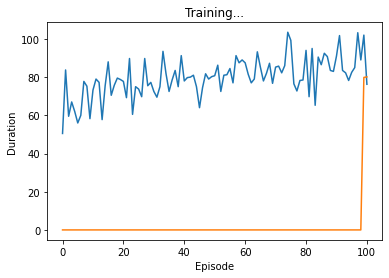

Current_train_num :  227845 Accuracy :  0.9978757488643596
F1 0.16523235800344235
48 146 339
100


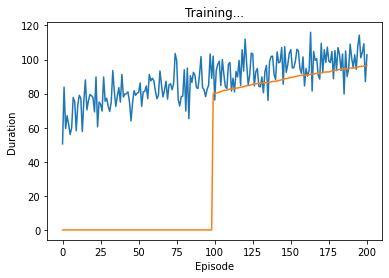

Current_train_num :  227845 Accuracy :  0.9984024226996423
F1 0.1162227602905569
24 2 363


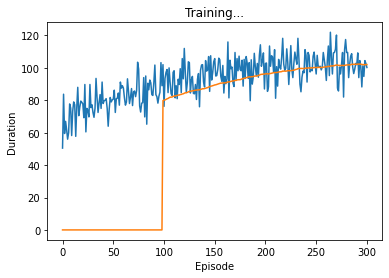

Current_train_num :  227845 Accuracy :  0.9983102547784678
F1 0.005154639175257732
1 0 386


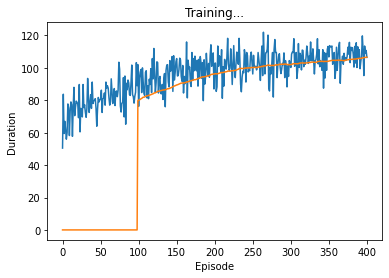

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


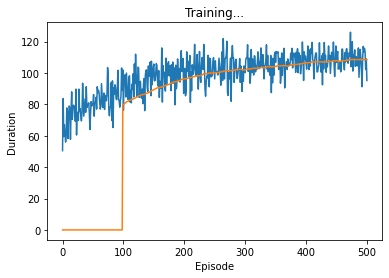

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


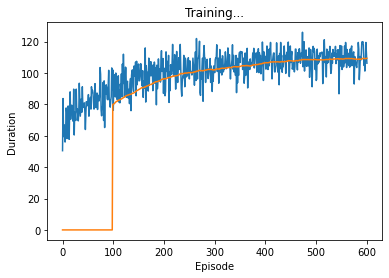

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


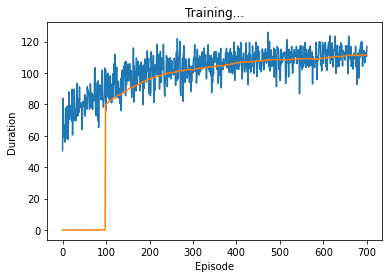

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


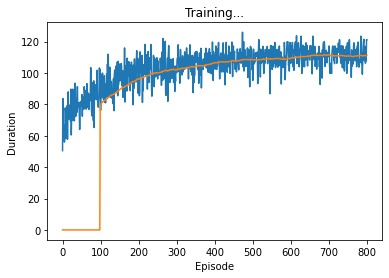

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


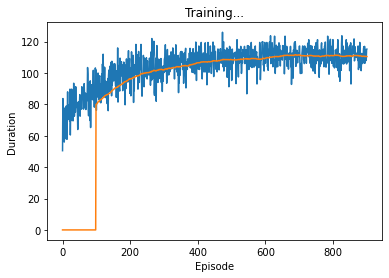

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


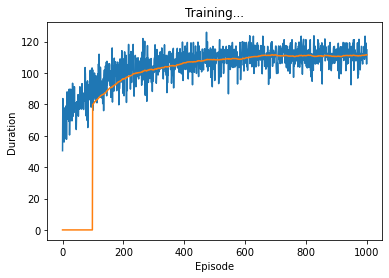

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


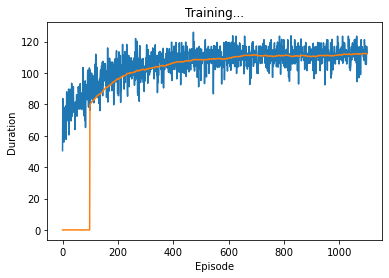

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


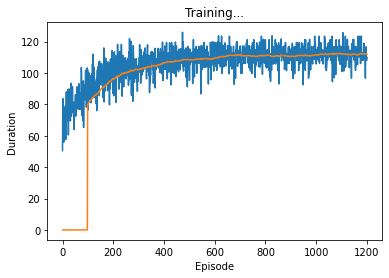

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


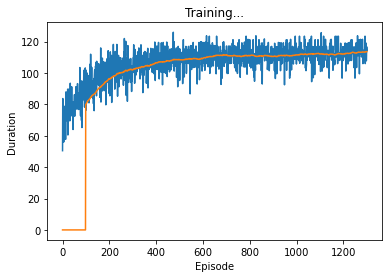

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


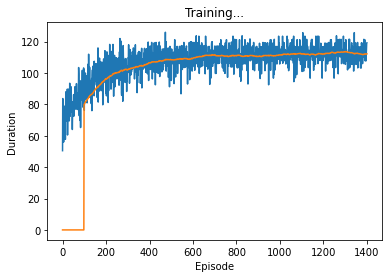

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


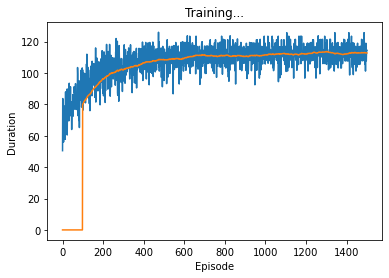

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


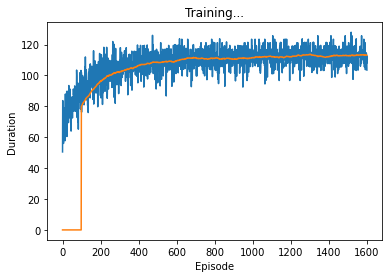

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


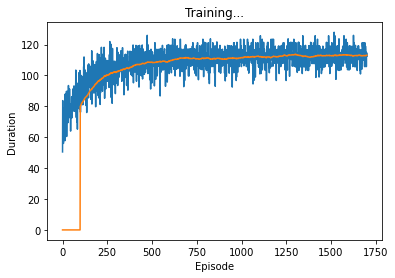

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


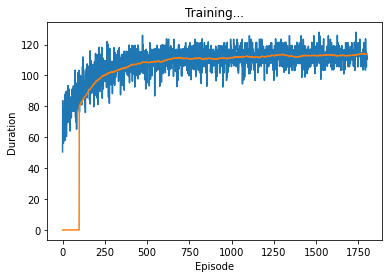

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


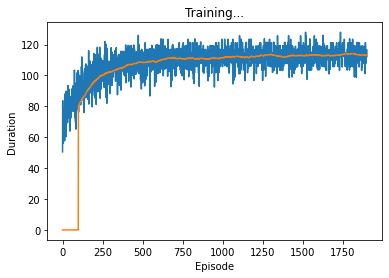

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


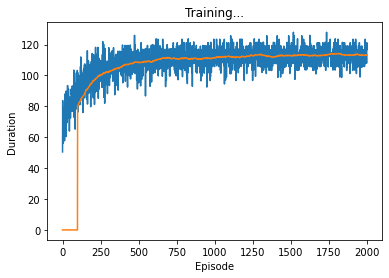

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


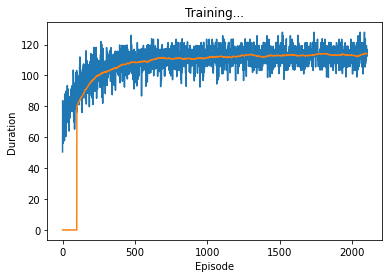

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


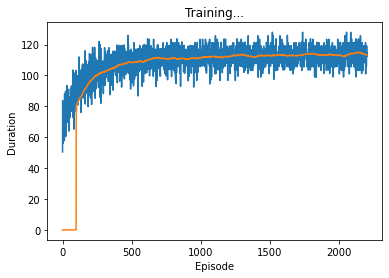

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


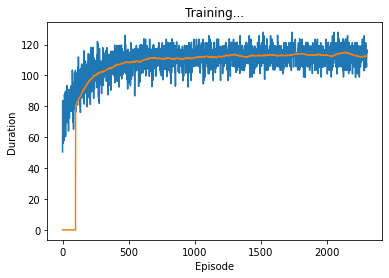

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


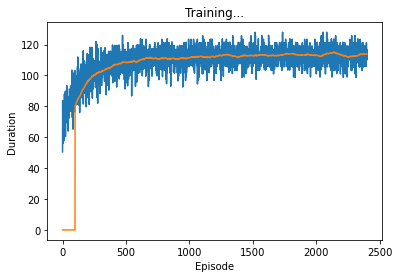

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


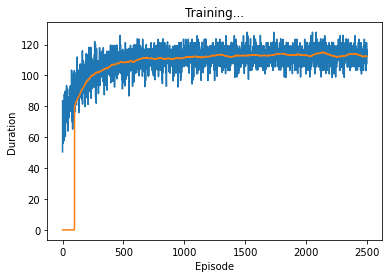

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


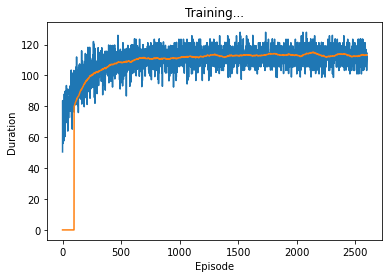

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


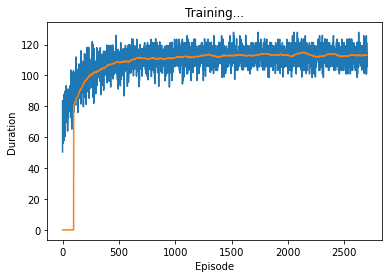

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


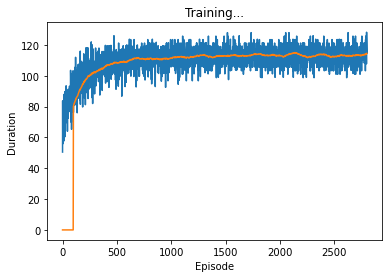

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


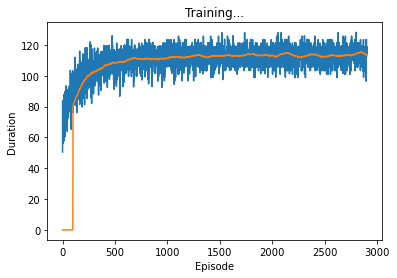

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


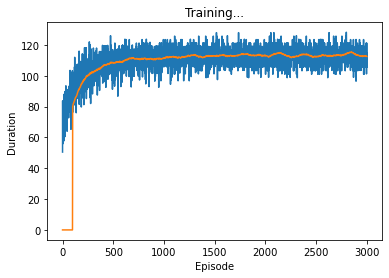

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


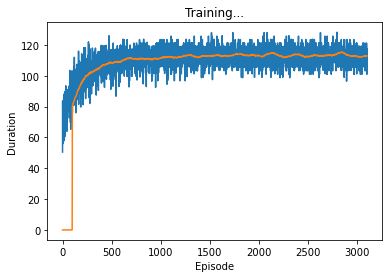

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


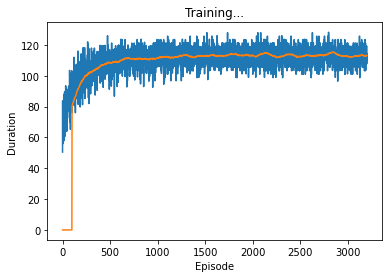

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


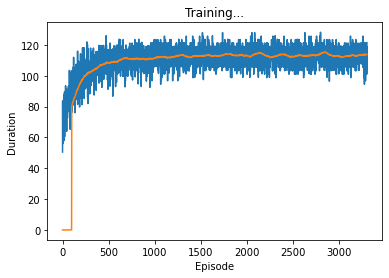

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


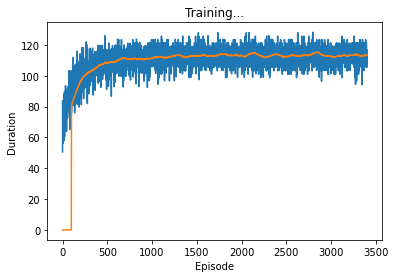

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


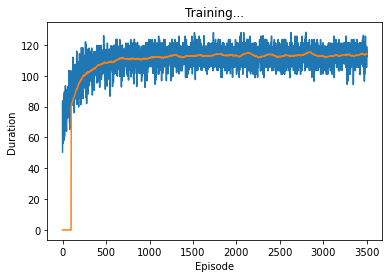

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


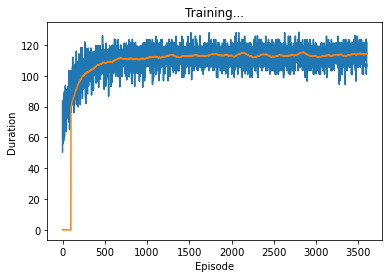

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


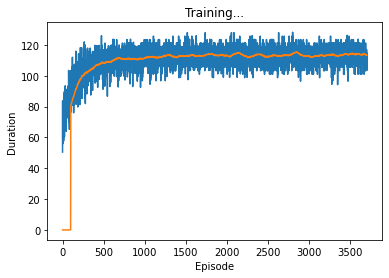

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


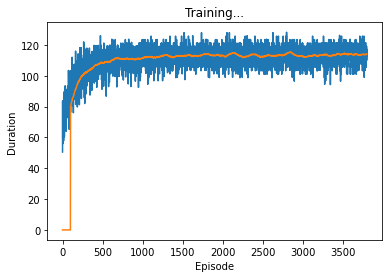

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.0
0 0 387


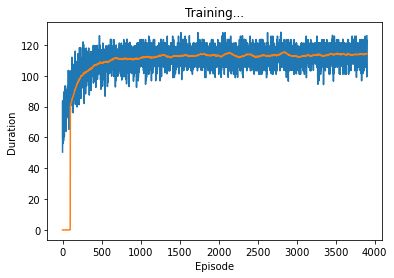

Current_train_num :  227845 Accuracy :  0.9983102547784678
F1 0.005154639175257732
1 0 386


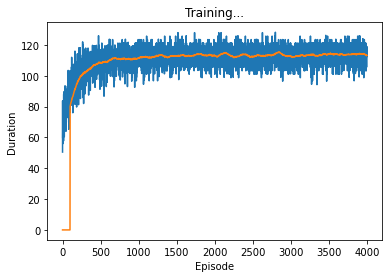

Current_train_num :  227845 Accuracy :  0.9983146437270952
F1 0.010282776349614395
2 0 385


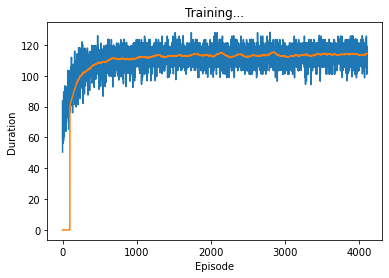

Current_train_num :  227845 Accuracy :  0.9983146437270952
F1 0.010282776349614395
2 0 385


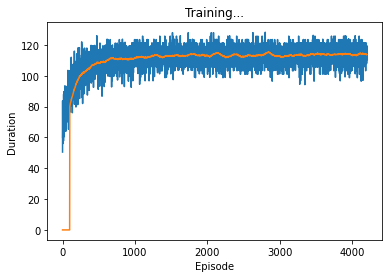

Current_train_num :  227845 Accuracy :  0.998349755316114
F1 0.05037783375314862
10 0 377


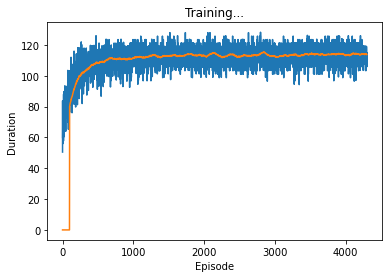

Current_train_num :  227845 Accuracy :  0.9983673111106235
F1 0.06982543640897755
14 0 373


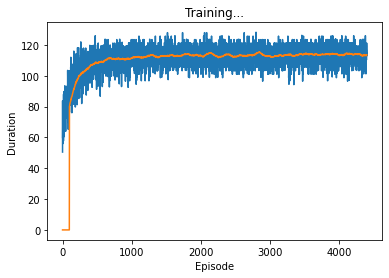

Current_train_num :  227845 Accuracy :  0.9984287563914065
F1 0.13493975903614458
28 0 359


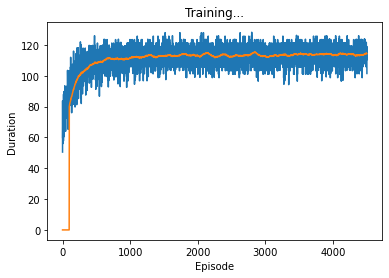

Current_train_num :  227845 Accuracy :  0.9984287563914065
F1 0.13908872901678657
29 1 358


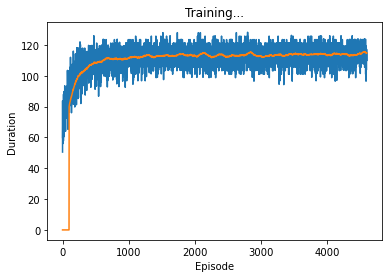

Current_train_num :  227845 Accuracy :  0.9984287563914065
F1 0.13908872901678657
29 1 358


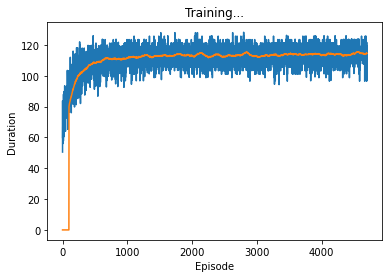

Current_train_num :  227845 Accuracy :  0.9984419232372885
F1 0.15639810426540285
33 2 354


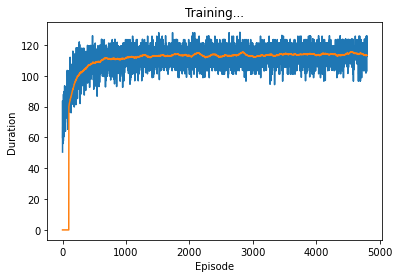

Current_train_num :  227845 Accuracy :  0.9984550900831706
F1 0.16941176470588235
36 2 351
4800


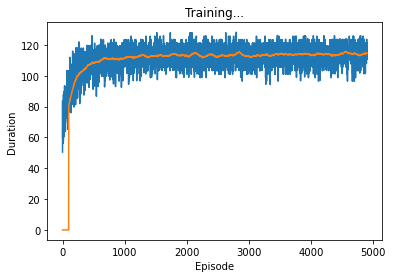

Current_train_num :  227845 Accuracy :  0.9984594790317979
F1 0.17370892018779344
37 2 350
4900


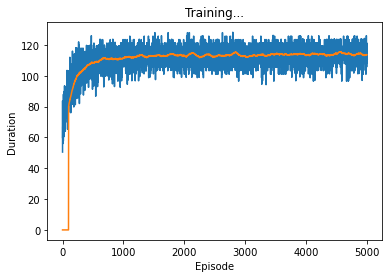

Current_train_num :  227845 Accuracy :  0.9984638679804253
F1 0.18181818181818182
39 3 348
5000


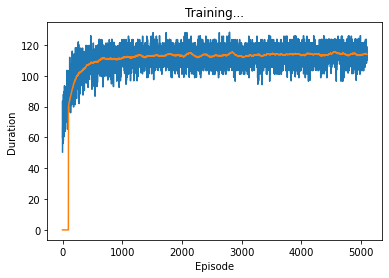

Current_train_num :  227845 Accuracy :  0.99847264587768
F1 0.19770114942528735
43 5 344
5100


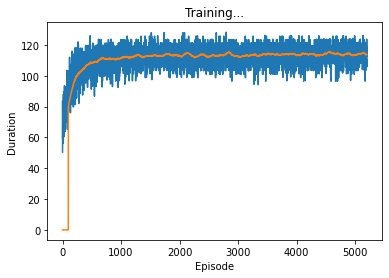

Current_train_num :  227845 Accuracy :  0.99847264587768
F1 0.20137299771167047
44 6 343
5200


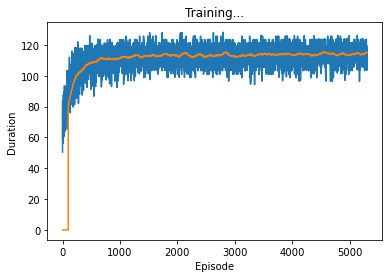

Current_train_num :  227845 Accuracy :  0.9985077574666988
F1 0.23370786516853934
52 6 335
5300


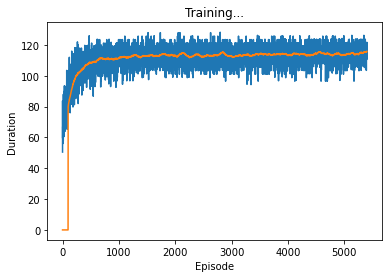

Current_train_num :  227845 Accuracy :  0.9985253132612083
F1 0.25934065934065936
59 9 328
5400


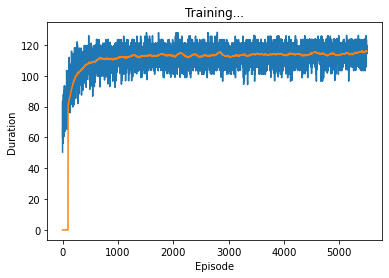

Current_train_num :  227845 Accuracy :  0.9985823695933639
F1 0.3076923076923077
72 9 315
5500


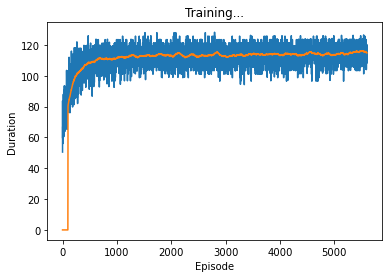

Current_train_num :  227845 Accuracy :  0.9986130922337554
F1 0.33263157894736844
79 9 308
5600


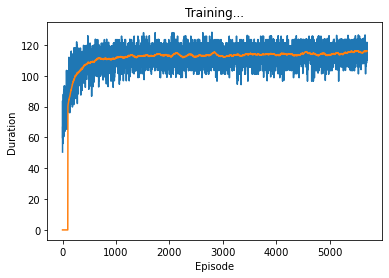

Current_train_num :  227845 Accuracy :  0.9986657596172837
F1 0.37627811860940696
92 10 295
5700


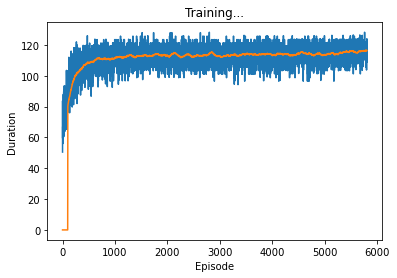

Current_train_num :  227845 Accuracy :  0.9986833154117931
F1 0.3967935871743487
99 13 288
5800


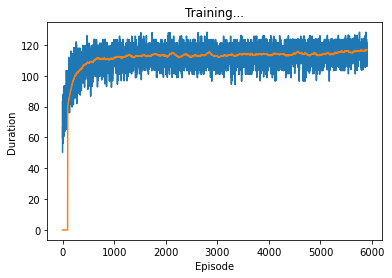

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.4095427435387674
103 13 284
5900


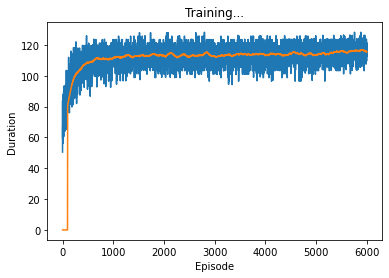

Current_train_num :  227845 Accuracy :  0.9986920933090478
F1 0.4079207920792079
103 15 284


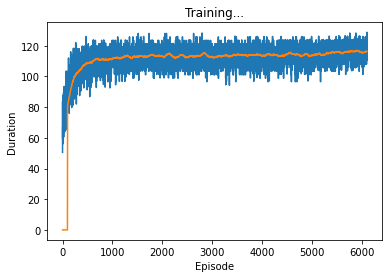

Current_train_num :  227845 Accuracy :  0.9986920933090478
F1 0.4079207920792079
103 15 284


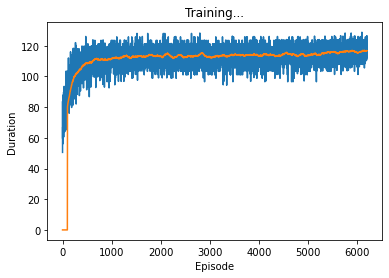

Current_train_num :  227845 Accuracy :  0.9987140380521846
F1 0.4280155642023346
110 17 277
6200


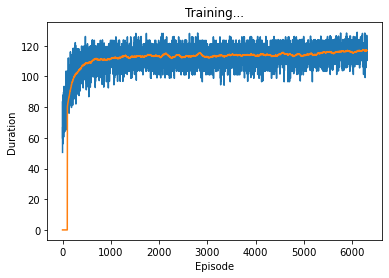

Current_train_num :  227845 Accuracy :  0.9987140380521846
F1 0.4280155642023346
110 17 277


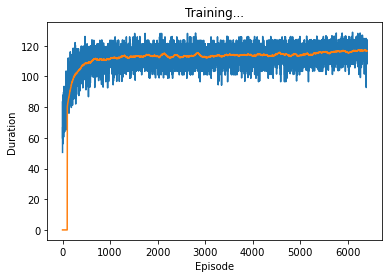

Current_train_num :  227845 Accuracy :  0.9987184270008119
F1 0.4332688588007737
112 18 275
6400


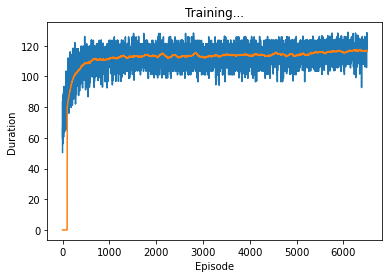

Current_train_num :  227845 Accuracy :  0.9987228159494393
F1 0.43846153846153846
114 19 273
6500


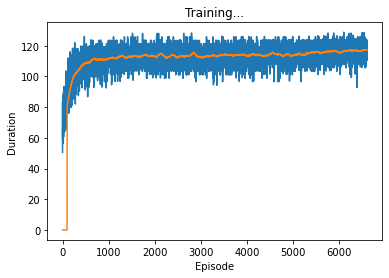

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.43856332703213613
116 26 271
6600


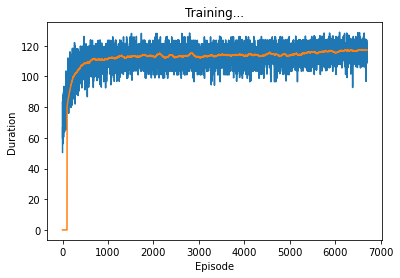

Current_train_num :  227845 Accuracy :  0.9986877043604204
F1 0.43609022556390975
116 29 271


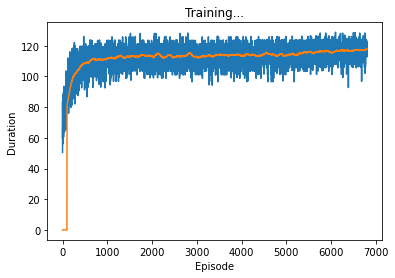

Current_train_num :  227845 Accuracy :  0.9986833154117931
F1 0.43947858472998136
118 32 269
6800


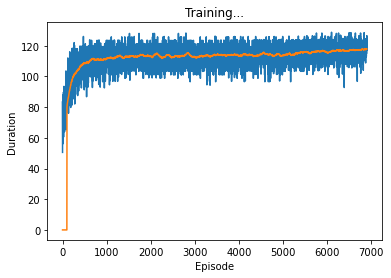

Current_train_num :  227845 Accuracy :  0.9986130922337554
F1 0.43087971274685816
120 50 267


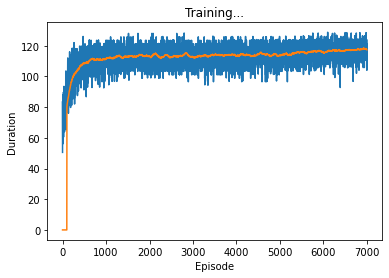

Current_train_num :  227845 Accuracy :  0.9986438148741469
F1 0.4343065693430657
119 42 268


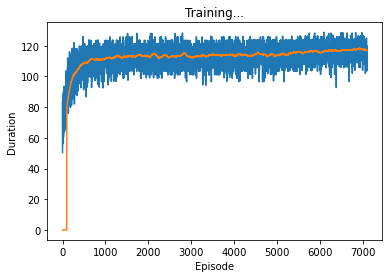

Current_train_num :  227845 Accuracy :  0.9986130922337554
F1 0.42882882882882883
119 49 268


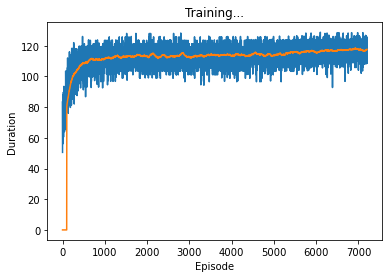

Current_train_num :  227845 Accuracy :  0.9986174811823828
F1 0.4296028880866426
119 48 268


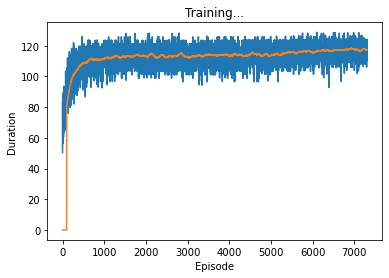

Current_train_num :  227845 Accuracy :  0.9985999253878733
F1 0.4265232974910394
119 52 268


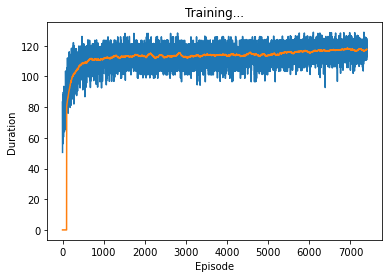

Current_train_num :  227845 Accuracy :  0.9985955364392459
F1 0.42780748663101603
120 54 267


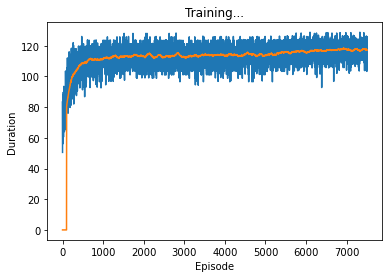

Current_train_num :  227845 Accuracy :  0.9985428690557177
F1 0.42086956521739133
121 67 266


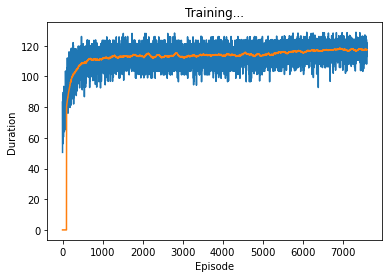

Current_train_num :  227845 Accuracy :  0.9985955364392459
F1 0.42780748663101603
120 54 267


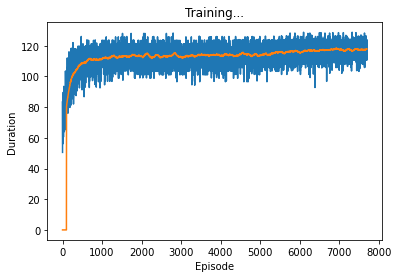

Current_train_num :  227845 Accuracy :  0.9986130922337554
F1 0.43087971274685816
120 50 267


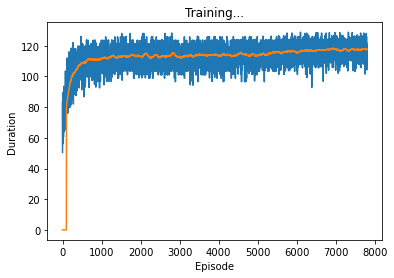

Current_train_num :  227845 Accuracy :  0.9986130922337554
F1 0.43087971274685816
120 50 267


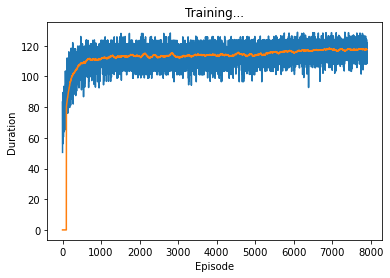

Current_train_num :  227845 Accuracy :  0.9985823695933639
F1 0.43157894736842106
123 60 264


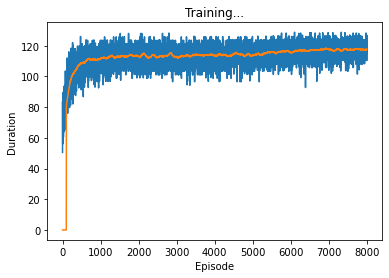

Current_train_num :  227845 Accuracy :  0.9985428690557177
F1 0.42487046632124353
123 69 264


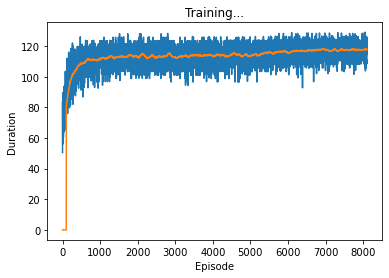

Current_train_num :  227845 Accuracy :  0.998534091158463
F1 0.4293015332197615
126 74 261


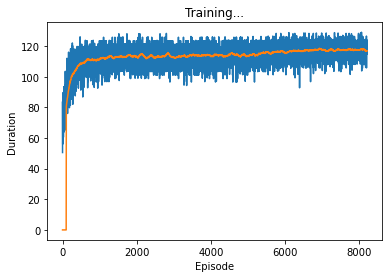

Current_train_num :  227845 Accuracy :  0.9985384801070903
F1 0.4280821917808219
125 72 262


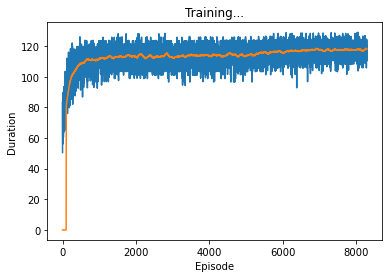

Current_train_num :  227845 Accuracy :  0.9985560359015998
F1 0.4270833333333333
123 66 264


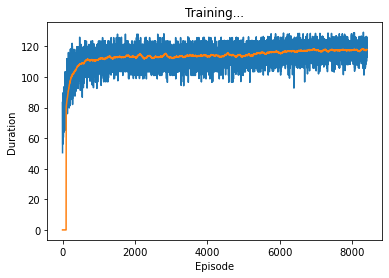

Current_train_num :  227845 Accuracy :  0.9985516469529724
F1 0.42634315424610053
123 67 264


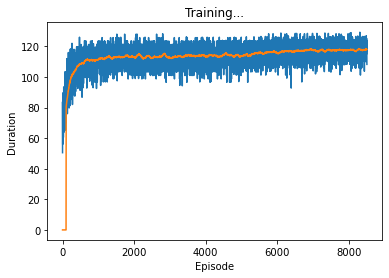

Current_train_num :  227845 Accuracy :  0.9985472580043451
F1 0.4315068493150685
126 71 261


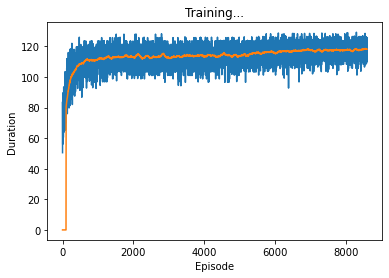

Current_train_num :  227845 Accuracy :  0.9985253132612083
F1 0.4317032040472175
128 78 259


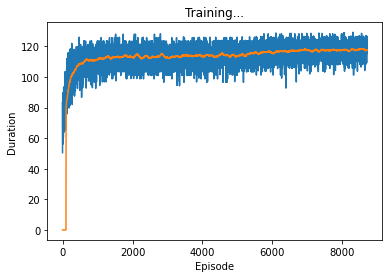

Current_train_num :  227845 Accuracy :  0.9984989795694441
F1 0.43305785123966944
131 87 256


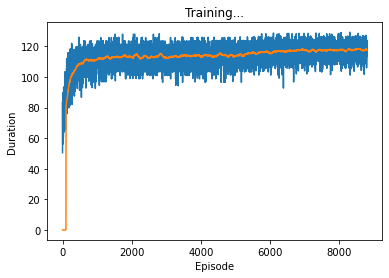

Current_train_num :  227845 Accuracy :  0.9985253132612083
F1 0.4355108877721943
130 80 257


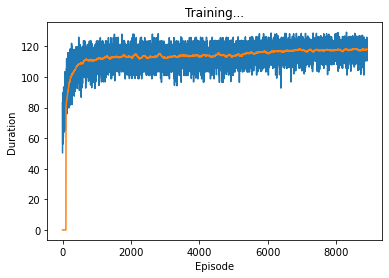

Current_train_num :  227845 Accuracy :  0.9985121464153263
F1 0.4389438943894389
133 86 254


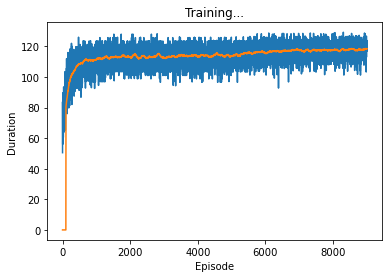

Current_train_num :  227845 Accuracy :  0.9984814237749348
F1 0.44122383252818037
137 97 250
9000


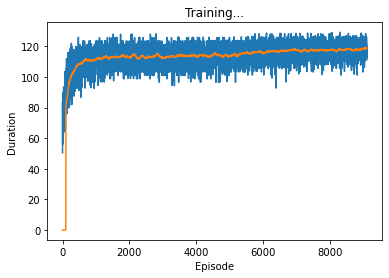

Current_train_num :  227845 Accuracy :  0.998398033751015
F1 0.44036697247706424
144 123 243


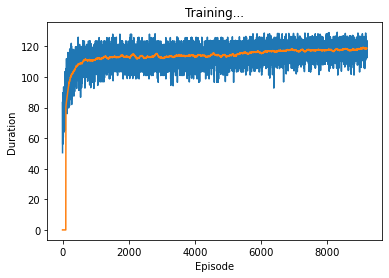

Current_train_num :  227845 Accuracy :  0.9983760890078781
F1 0.4370257966616085
144 128 243


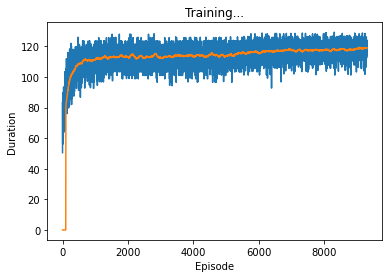

Current_train_num :  227845 Accuracy :  0.9984550900831706
F1 0.4440944881889764
141 107 246
9300


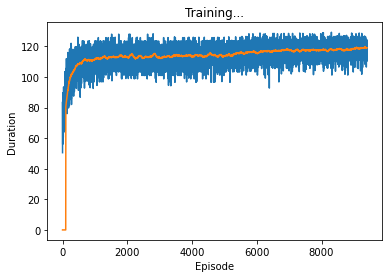

Current_train_num :  227845 Accuracy :  0.9984375342886611
F1 0.4482225656877898
145 115 242
9400


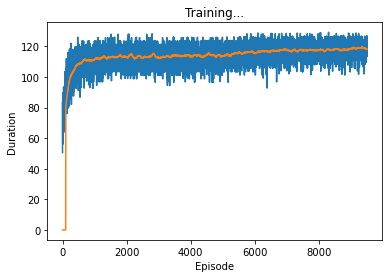

Current_train_num :  227845 Accuracy :  0.9983585332133688
F1 0.44113263785394935
148 136 239


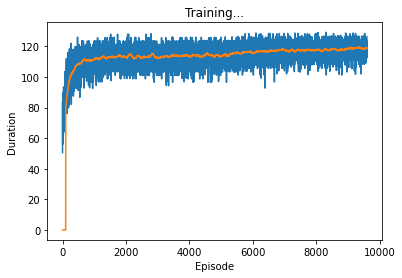

Current_train_num :  227845 Accuracy :  0.9984243674427791
F1 0.45288753799392095
149 122 238
9600


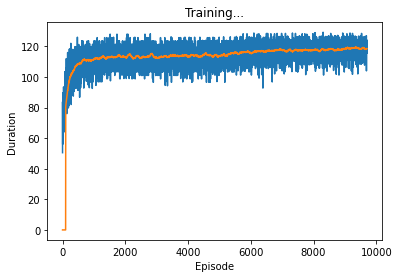

Current_train_num :  227845 Accuracy :  0.9985077574666988
F1 0.45614035087719296
143 97 244
9700


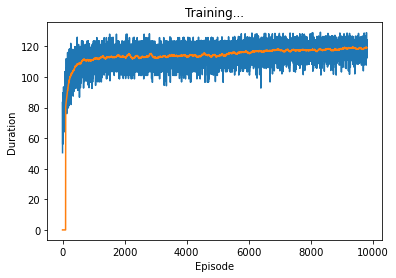

Current_train_num :  227845 Accuracy :  0.9984287563914065
F1 0.450229709035222
147 119 240


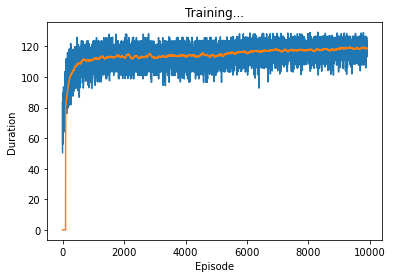

Current_train_num :  227845 Accuracy :  0.998411200596897
F1 0.45413533834586467
151 127 236


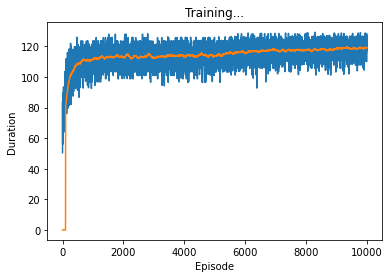

Current_train_num :  227845 Accuracy :  0.998349755316114
F1 0.44640234948604995
152 142 235


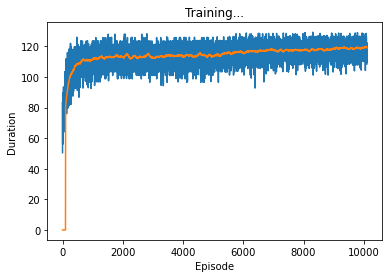

Current_train_num :  227845 Accuracy :  0.9983673111106235
F1 0.4538799414348463
155 141 232


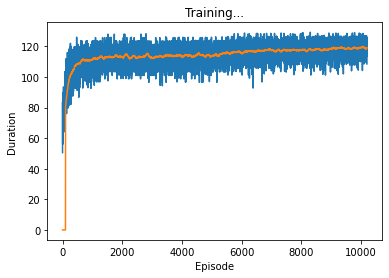

Current_train_num :  227845 Accuracy :  0.9983629221619961
F1 0.4595375722543353
159 146 228
10200


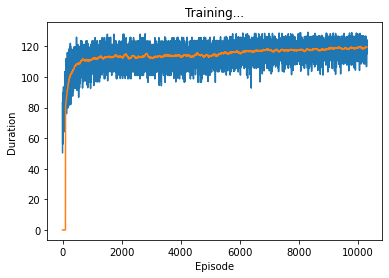

Current_train_num :  227845 Accuracy :  0.9984243674427791
F1 0.4690265486725664
159 132 228
10300


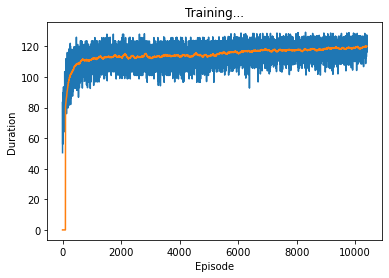

Current_train_num :  227845 Accuracy :  0.9982970879325858
F1 0.48064085447263016
180 182 207
10400


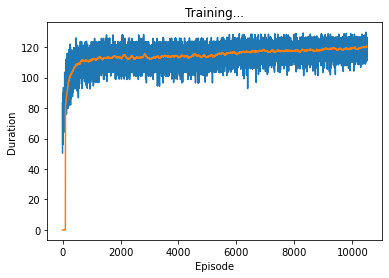

Current_train_num :  227845 Accuracy :  0.9984463121859158
F1 0.5347313237221494
204 172 183
10500


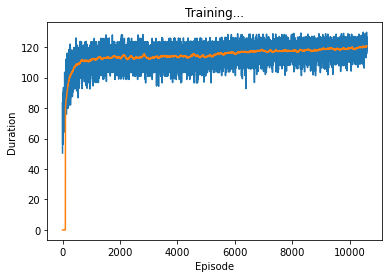

Current_train_num :  227845 Accuracy :  0.9976870240733832
F1 0.49230769230769234
256 397 131


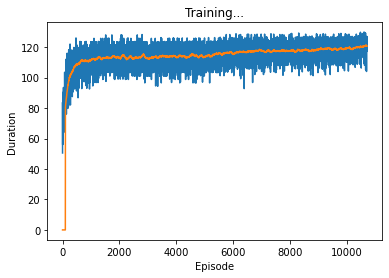

Current_train_num :  227845 Accuracy :  0.9978713599157322
F1 0.5
243 342 144


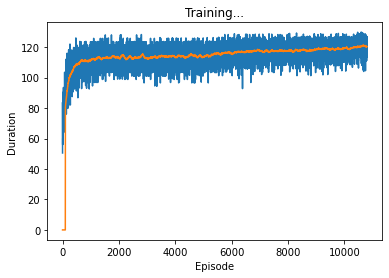

Current_train_num :  227845 Accuracy :  0.9980161952204349
F1 0.5144694533762058
240 306 147


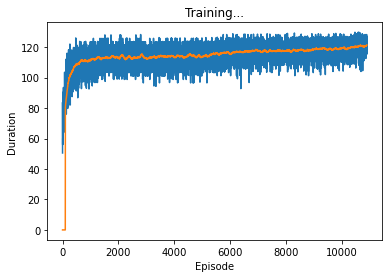

Current_train_num :  227845 Accuracy :  0.998165419473765
F1 0.5233219567690558
230 262 157


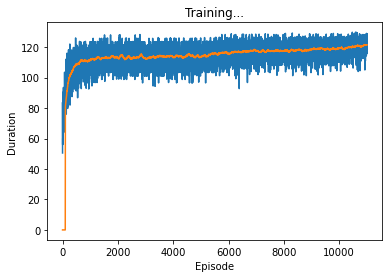

Current_train_num :  227845 Accuracy :  0.9985209243125809
F1 0.5101449275362319
176 127 211


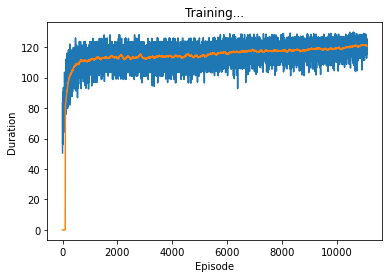

Current_train_num :  227845 Accuracy :  0.9984594790317979
F1 0.4942528735632184
172 137 215


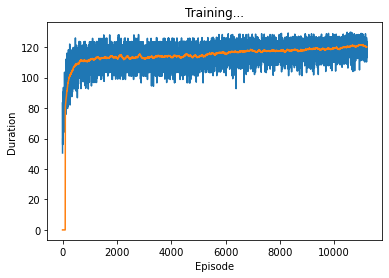

Current_train_num :  227845 Accuracy :  0.9984638679804253
F1 0.49056603773584906
169 133 218


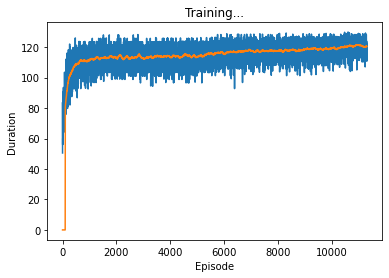

Current_train_num :  227845 Accuracy :  0.99847264587768
F1 0.5063649222065064
179 141 208


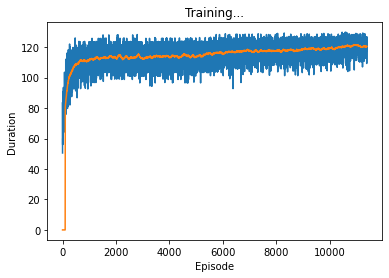

Current_train_num :  227845 Accuracy :  0.9983541442647413
F1 0.5323383084577115
214 203 173


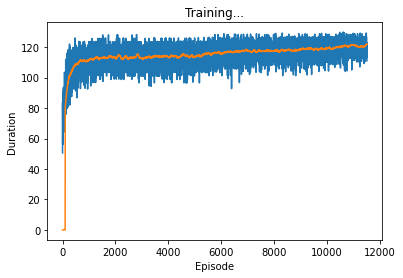

Current_train_num :  227845 Accuracy :  0.9975948561522088
F1 0.4921369102682701
266 428 121


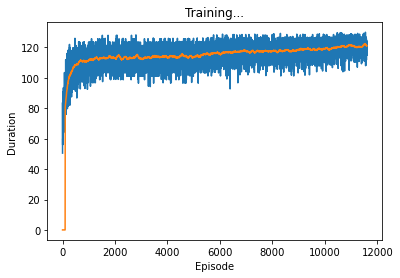

Current_train_num :  227845 Accuracy :  0.9981303078847462
F1 0.5239687848383501
235 275 152


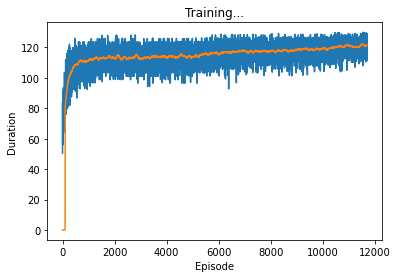

Current_train_num :  227845 Accuracy :  0.9983453663674867
F1 0.5356265356265356
218 209 169
11700


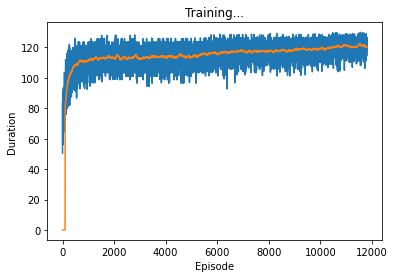

Current_train_num :  227845 Accuracy :  0.998103974192982
F1 0.5226019845644984
237 283 150


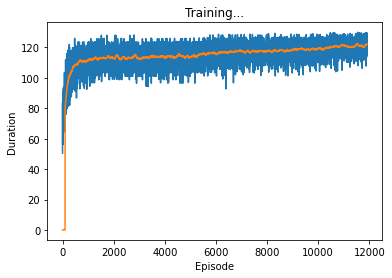

Current_train_num :  227845 Accuracy :  0.9982093089600387
F1 0.5336374002280502
234 256 153


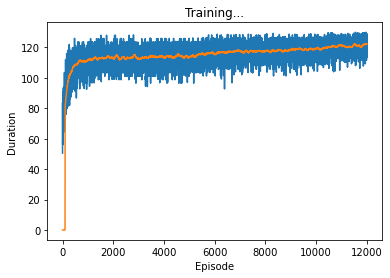

Current_train_num :  227845 Accuracy :  0.9983848669051328
F1 0.5538089480048367
229 211 158
12000


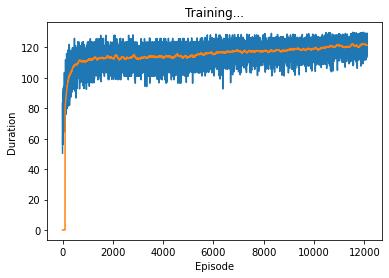

Current_train_num :  227845 Accuracy :  0.998103974192982
F1 0.5278080697928026
242 288 145


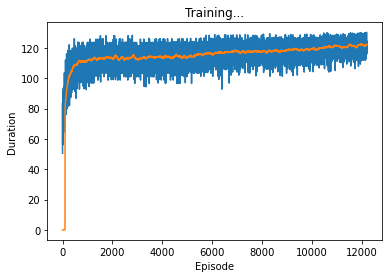

Current_train_num :  227845 Accuracy :  0.9986306480282648
F1 0.5572842998585573
197 123 190
12200


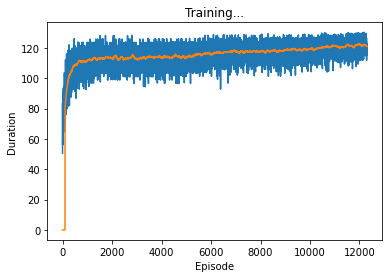

Current_train_num :  227845 Accuracy :  0.9983848669051328
F1 0.532319391634981
210 192 177


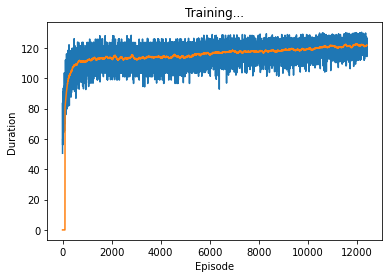

Current_train_num :  227845 Accuracy :  0.9981610305251377
F1 0.5364238410596026
243 276 144


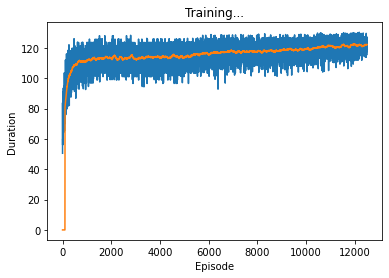

Current_train_num :  227845 Accuracy :  0.998411200596897
F1 0.5631768953068592
234 210 153
12500


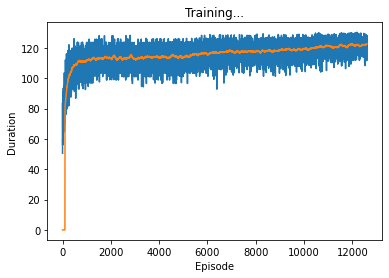

Current_train_num :  227845 Accuracy :  0.9983058658298405
F1 0.5515643105446119
238 238 149


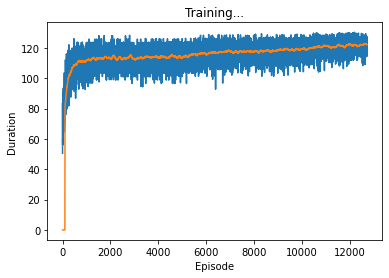

Current_train_num :  227845 Accuracy :  0.9984375342886611
F1 0.561963190184049
229 199 158


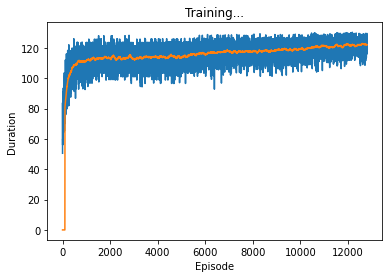

Current_train_num :  227845 Accuracy :  0.998398033751015
F1 0.5590361445783133
232 211 155


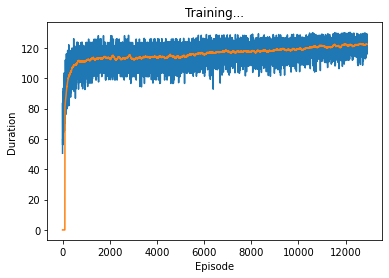

Current_train_num :  227845 Accuracy :  0.9980513068094538
F1 0.5359749739311783
257 315 130


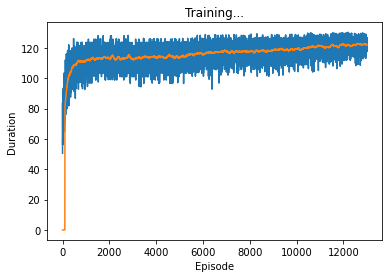

Current_train_num :  227845 Accuracy :  0.9983629221619961
F1 0.56
238 225 149


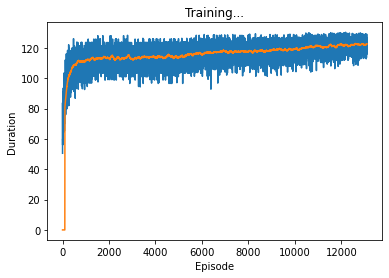

Current_train_num :  227845 Accuracy :  0.9979547499396519
F1 0.5353233830845772
269 349 118


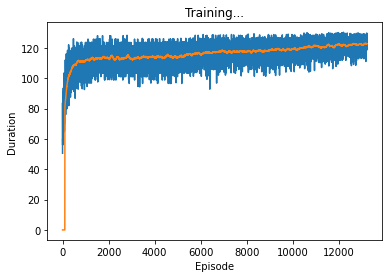

Current_train_num :  227845 Accuracy :  0.9978976936074964
F1 0.5330739299610895
274 367 113


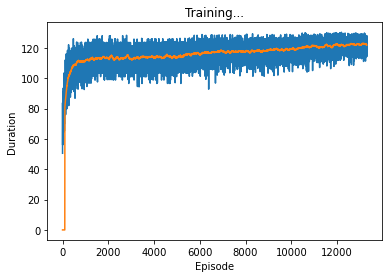

Current_train_num :  227845 Accuracy :  0.9980820294498453
F1 0.5418410041841004
259 310 128


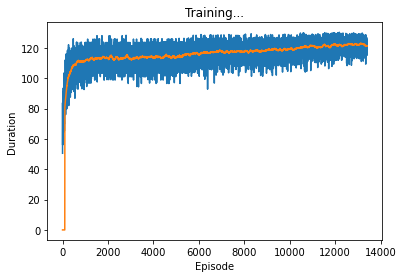

Current_train_num :  227845 Accuracy :  0.9986043143365007
F1 0.5500705218617772
195 127 192


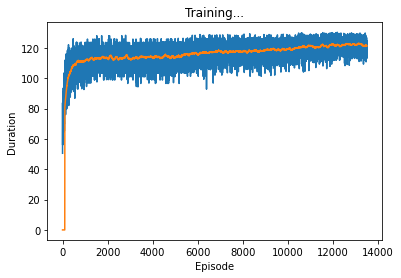

Current_train_num :  227845 Accuracy :  0.9986262590796374
F1 0.5733695652173914
211 138 176
13500


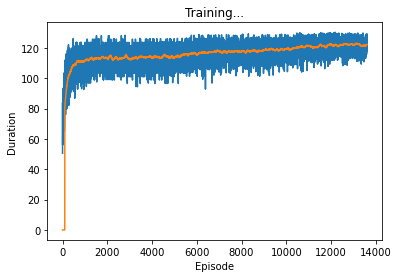

Current_train_num :  227845 Accuracy :  0.9980908073471
F1 0.5467775467775468
263 312 124


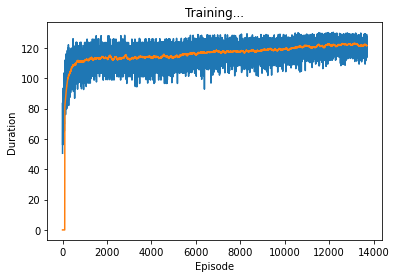

Current_train_num :  227845 Accuracy :  0.9979986394259255
F1 0.537917087967644
266 336 121


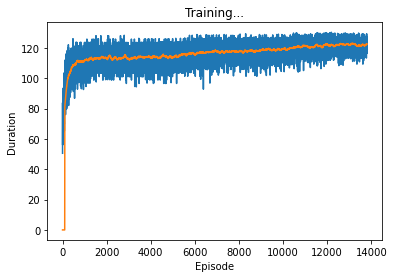

Current_train_num :  227845 Accuracy :  0.9977616362000483
F1 0.5307621671258035
289 413 98


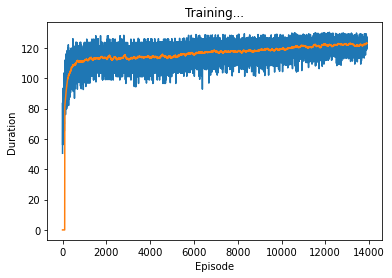

Current_train_num :  227845 Accuracy :  0.9985033685180715
F1 0.5889423076923077
245 200 142
13900


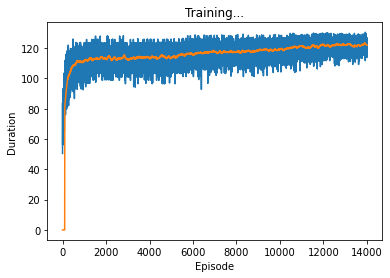

Current_train_num :  227845 Accuracy :  0.9983321995216046
F1 0.5790055248618785
262 256 125


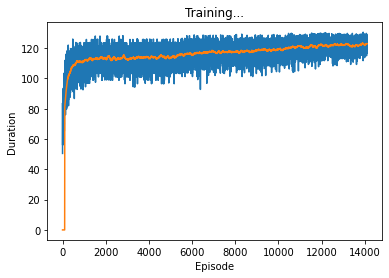

Current_train_num :  227845 Accuracy :  0.9984814237749348
F1 0.5979142526071842
258 218 129
14100


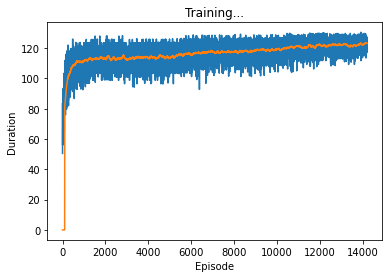

Current_train_num :  227845 Accuracy :  0.9984287563914065
F1 0.5943502824858757
263 235 124


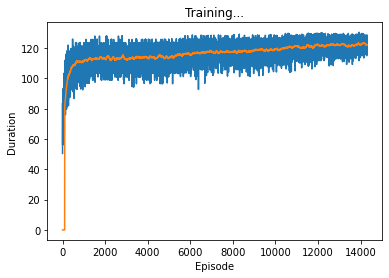

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.6086956521739131
231 141 156
14300


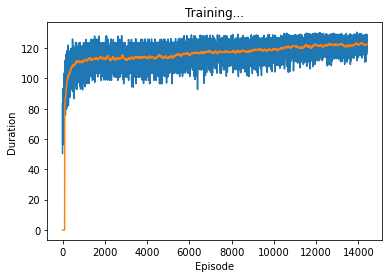

Current_train_num :  227845 Accuracy :  0.9985604248502271
F1 0.6078665077473182
255 197 132


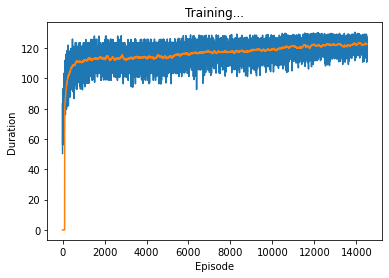

Current_train_num :  227845 Accuracy :  0.9983629221619961
F1 0.58719646799117
266 253 121


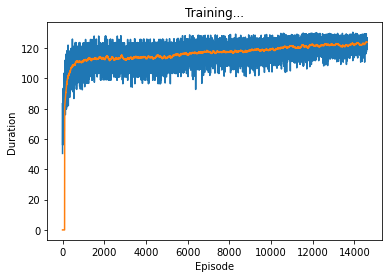

Current_train_num :  227845 Accuracy :  0.9981961421141565
F1 0.5787321063394683
283 308 104


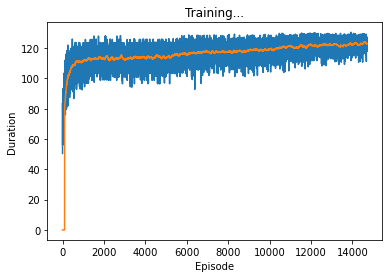

Current_train_num :  227845 Accuracy :  0.9986745375145384
F1 0.6159695817490495
243 159 144
14700


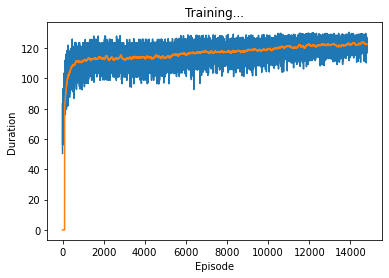

Current_train_num :  227845 Accuracy :  0.998398033751015
F1 0.5951327433628318
269 248 118


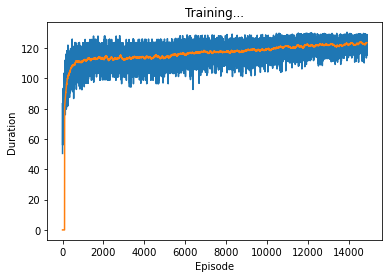

Current_train_num :  227845 Accuracy :  0.9986745375145384
F1 0.6217228464419475
249 165 138
14900


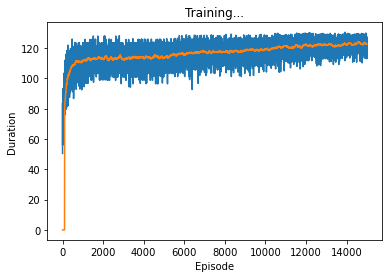

Current_train_num :  227845 Accuracy :  0.9984287563914065
F1 0.602436323366556
272 244 115


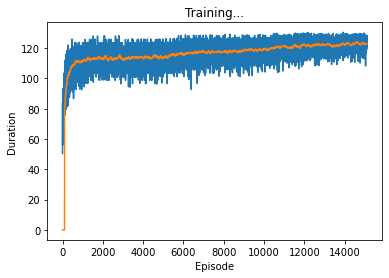

Current_train_num :  227845 Accuracy :  0.998261976343567
F1 0.591983556012333
288 298 99


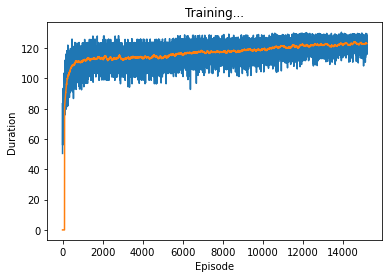

Current_train_num :  227845 Accuracy :  0.9987228159494393
F1 0.635
254 159 133
15200


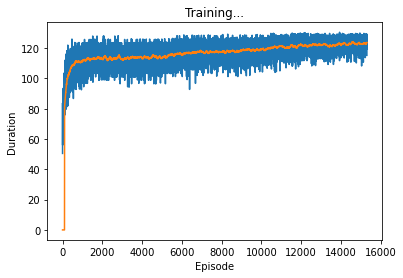

Current_train_num :  227845 Accuracy :  0.9984419232372885
F1 0.6105032822757112
279 248 108


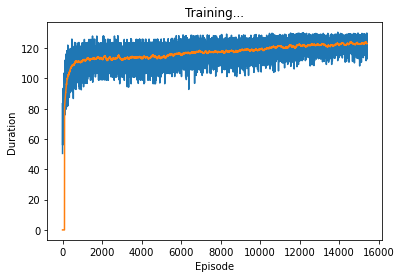

Current_train_num :  227845 Accuracy :  0.9988193728192412
F1 0.6291208791208791
229 112 158


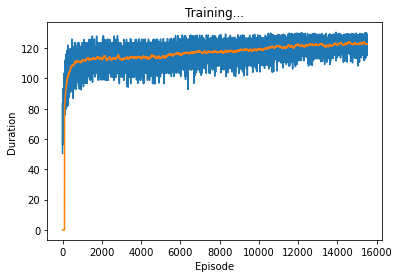

Current_train_num :  227845 Accuracy :  0.998261976343567
F1 0.5961342828077314
293 303 94


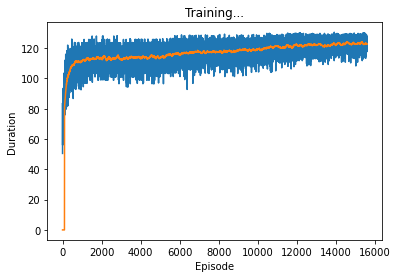

Current_train_num :  227845 Accuracy :  0.9982663652921943
F1 0.5950920245398773
291 300 96


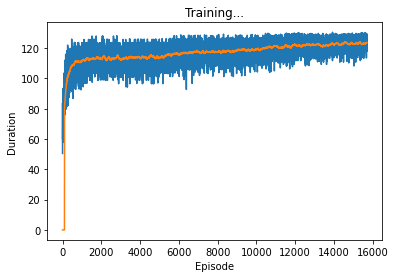

Current_train_num :  227845 Accuracy :  0.9985735916961092
F1 0.6261467889908257
273 212 114


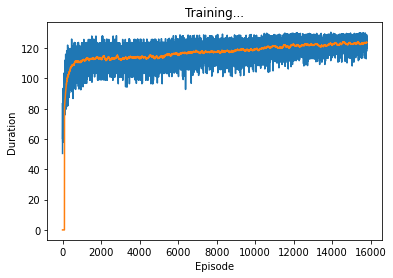

Current_train_num :  227845 Accuracy :  0.9986438148741469
F1 0.6344339622641509
269 192 118


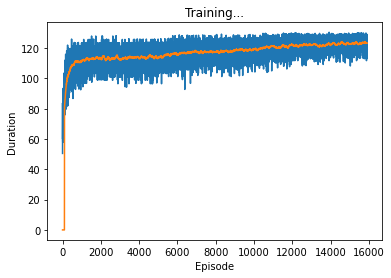

Current_train_num :  227845 Accuracy :  0.998411200596897
F1 0.614240170031881
289 265 98


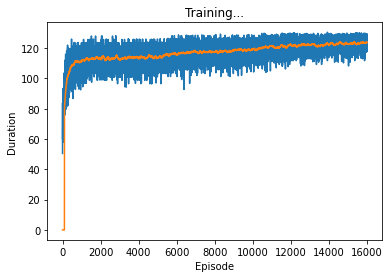

Current_train_num :  227845 Accuracy :  0.9986438148741469
F1 0.6403712296983759
276 199 111
16000


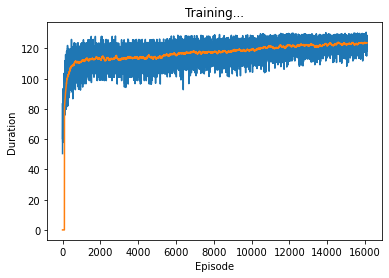

Current_train_num :  227845 Accuracy :  0.9988237617678685
F1 0.6529032258064517
253 135 134
16100


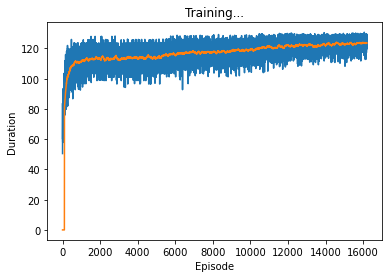

Current_train_num :  227845 Accuracy :  0.9985823695933639
F1 0.6334841628959276
280 217 107


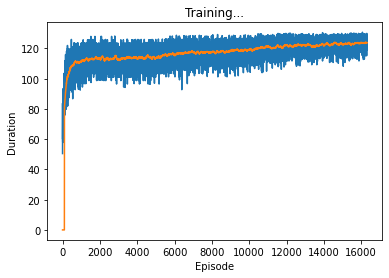

Current_train_num :  227845 Accuracy :  0.9988325396651232
F1 0.6581306017925737
257 137 130
16300


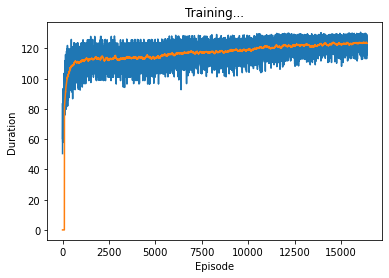

Current_train_num :  227845 Accuracy :  0.99847264587768
F1 0.6251342642320086
291 253 96


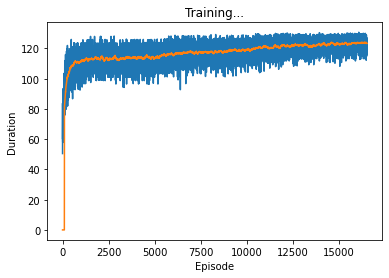

Current_train_num :  227845 Accuracy :  0.9988149838706138
F1 0.6512226512226512
253 137 134


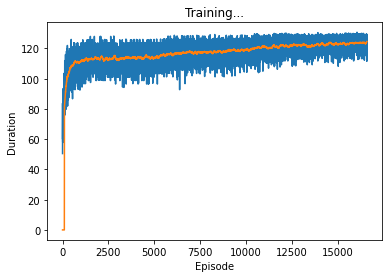

Current_train_num :  227845 Accuracy :  0.9987359827953214
F1 0.6522262334536703
271 173 116


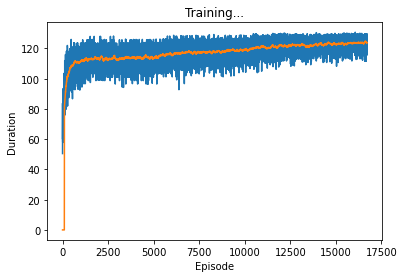

Current_train_num :  227845 Accuracy :  0.9985867585419913
F1 0.6382978723404256
285 221 102


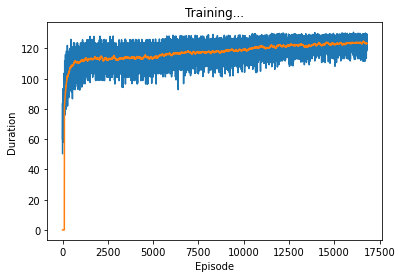

Current_train_num :  227845 Accuracy :  0.9985867585419913
F1 0.6399108138238573
287 223 100


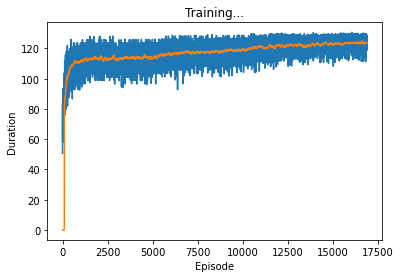

Current_train_num :  227845 Accuracy :  0.9985033685180715
F1 0.6330472103004292
295 250 92


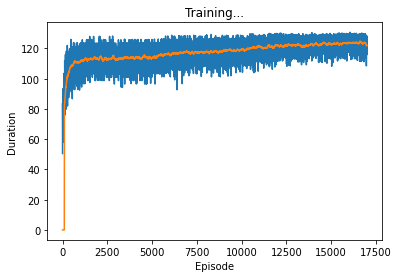

Current_train_num :  227845 Accuracy :  0.9988983738945336
F1 0.6621983914209115
247 112 140
17000


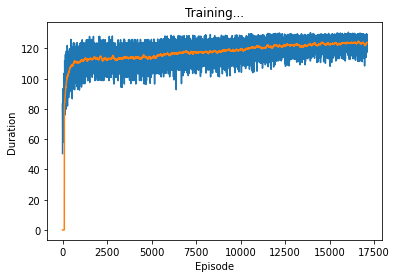

Current_train_num :  227845 Accuracy :  0.9981961421141565
F1 0.5968688845401174
305 330 82


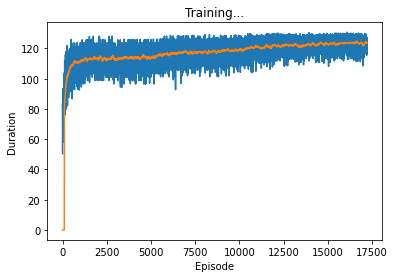

Current_train_num :  227845 Accuracy :  0.9988720402027694
F1 0.643646408839779
233 104 154


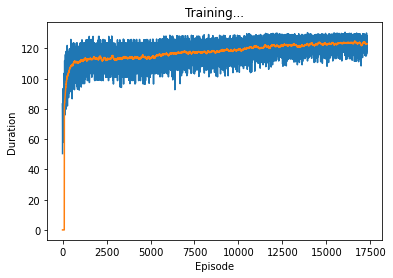

Current_train_num :  227845 Accuracy :  0.9985209243125809
F1 0.6365591397849463
296 247 91


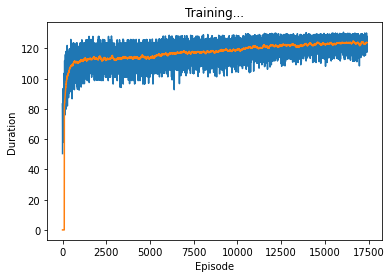

Current_train_num :  227845 Accuracy :  0.998915929689043
F1 0.6666666666666666
248 109 139
17400


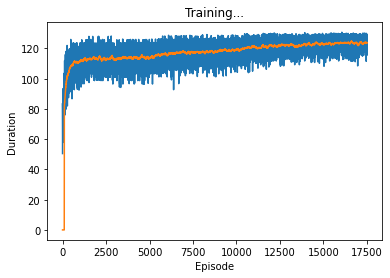

Current_train_num :  227845 Accuracy :  0.9988237617678685
F1 0.6778443113772455
283 165 104
17500


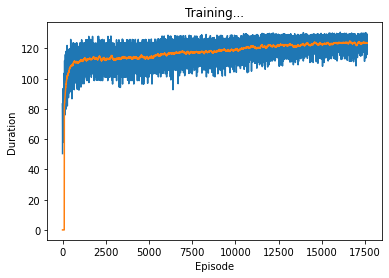

Current_train_num :  227845 Accuracy :  0.9989247075862977
F1 0.6771653543307087
258 117 129


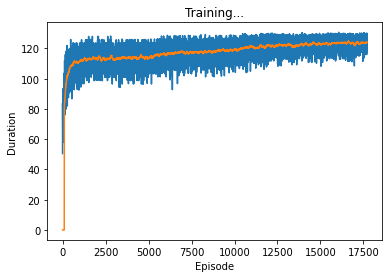

Current_train_num :  227845 Accuracy :  0.9985955364392459
F1 0.6507072905331882
299 233 88


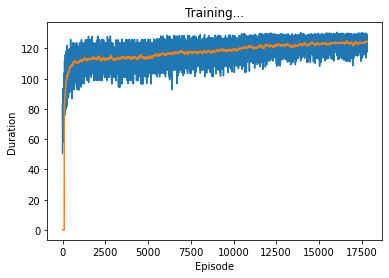

Current_train_num :  227845 Accuracy :  0.998793039127477
F1 0.6745283018867925
286 175 101


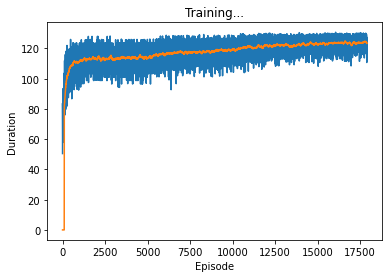

Current_train_num :  227845 Accuracy :  0.9988632623055147
F1 0.6658097686375322
259 132 128


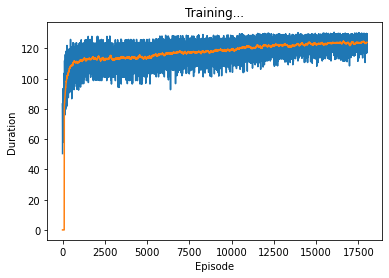

Current_train_num :  227845 Accuracy :  0.9986218701310101
F1 0.6542261251372119
298 226 89


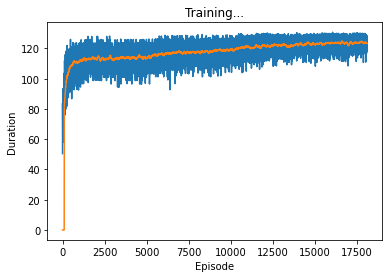

Current_train_num :  227845 Accuracy :  0.9985955364392459
F1 0.6522210184182016
301 235 86


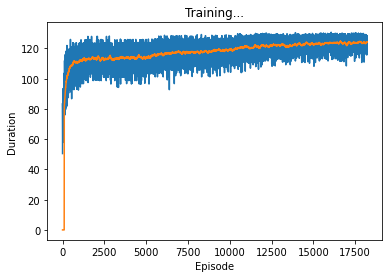

Current_train_num :  227845 Accuracy :  0.9987886501788497
F1 0.673733804475854
286 176 101


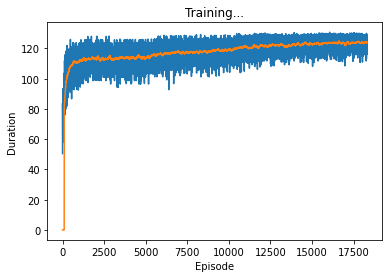

Current_train_num :  227845 Accuracy :  0.9989466523294345
F1 0.6882276843467011
266 120 121
18300


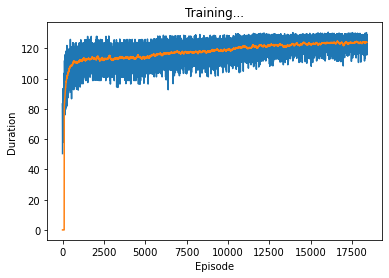

Current_train_num :  227845 Accuracy :  0.9988808181000242
F1 0.68
272 141 115


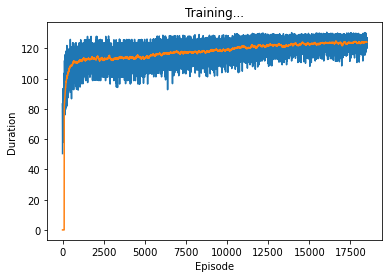

Current_train_num :  227845 Accuracy :  0.9984814237749348
F1 0.6389177939646202
307 267 80


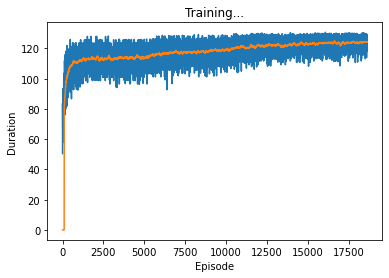

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.6846361185983828
254 101 133


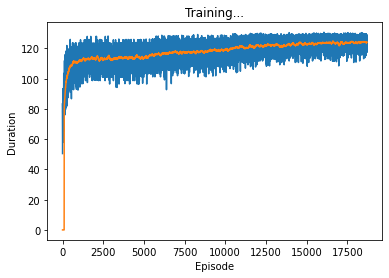

Current_train_num :  227845 Accuracy :  0.9989510412780619
F1 0.696969696969697
276 129 111
18700


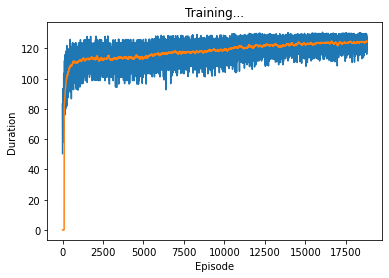

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.693717277486911
265 112 122


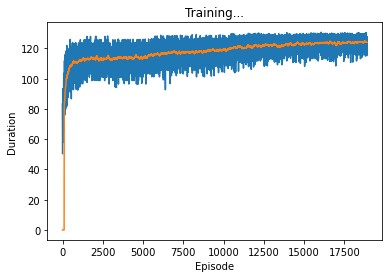

Current_train_num :  227845 Accuracy :  0.9989861528670807
F1 0.6979166666666666
268 113 119
18900


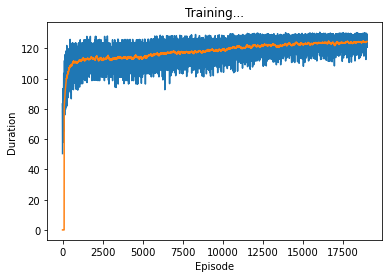

Current_train_num :  227845 Accuracy :  0.998915929689043
F1 0.697560975609756
286 147 101


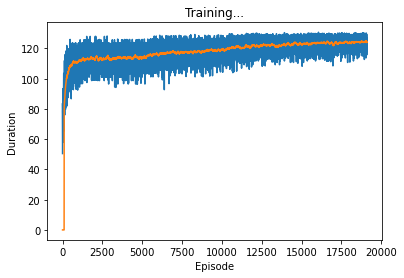

Current_train_num :  227845 Accuracy :  0.9989598191753165
F1 0.7054455445544554
285 136 102
19100


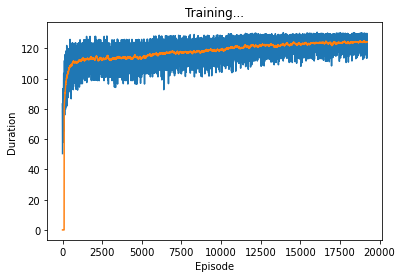

Current_train_num :  227845 Accuracy :  0.9988895959972789
F1 0.7018779342723005
299 166 88


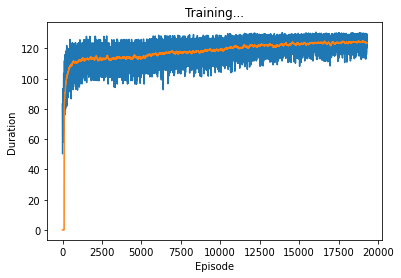

Current_train_num :  227845 Accuracy :  0.9988808181000242
F1 0.7009345794392523
300 169 87


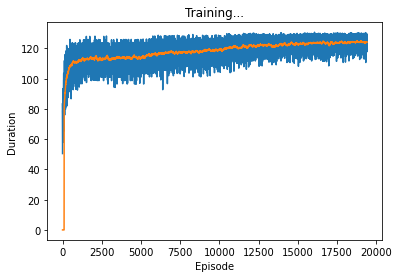

Current_train_num :  227845 Accuracy :  0.9842743970681823
F1 0.14909781576448244
314 3511 73


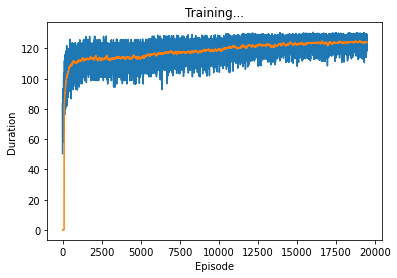

Current_train_num :  227845 Accuracy :  0.9990212644560995
F1 0.7044854881266491
267 104 120


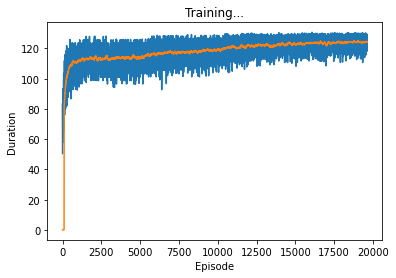

Current_train_num :  227845 Accuracy :  0.9988369286137506
F1 0.694954128440367
303 182 84


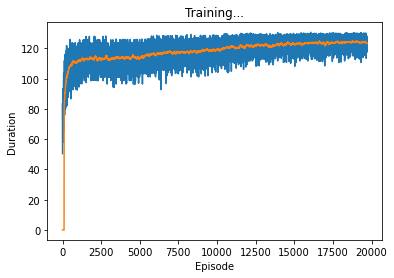

Current_train_num :  227845 Accuracy :  0.9989422633808072
F1 0.7027027027027027
286 141 101


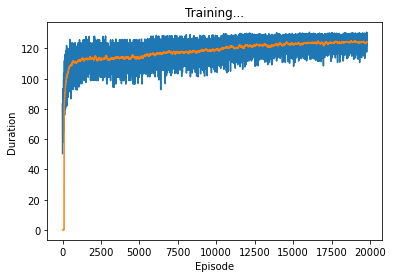

Current_train_num :  227845 Accuracy :  0.9989685970725712
F1 0.7035175879396985
280 129 107


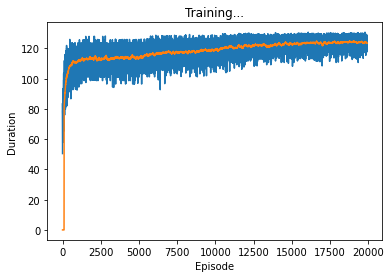

Current_train_num :  227845 Accuracy :  0.9986218701310101
F1 0.6616541353383458
308 236 79


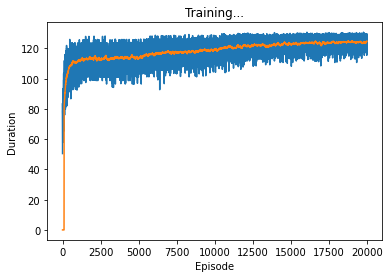

Current_train_num :  227845 Accuracy :  0.9986525927714016
F1 0.665943600867679
307 228 80


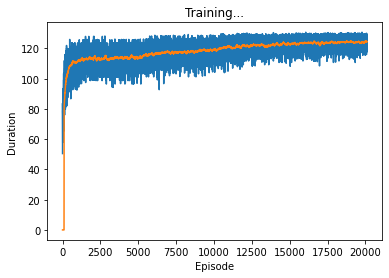

Current_train_num :  227845 Accuracy :  0.9989861528670807
F1 0.7135802469135802
289 134 98
20100


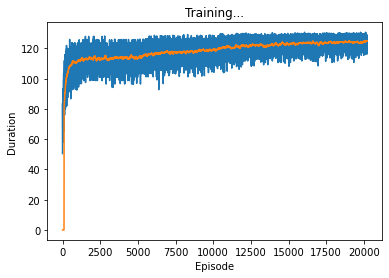

Current_train_num :  227845 Accuracy :  0.9990124865588448
F1 0.7160804020100503
285 124 102
20200


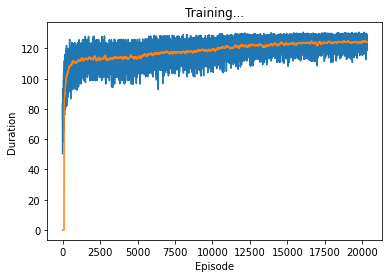

Current_train_num :  227845 Accuracy :  0.9979723057341614
F1 0.5732718894009217
311 387 76


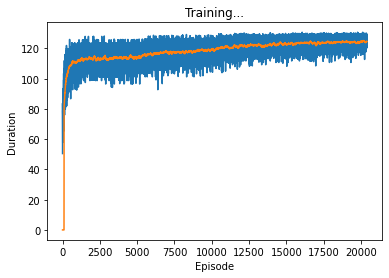

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.7194244604316546
300 147 87
20400


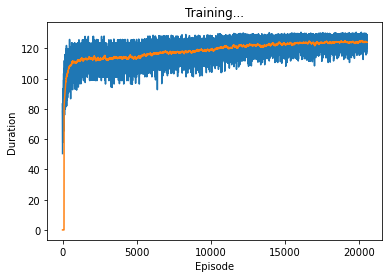

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7344913151364765
296 123 91
20500


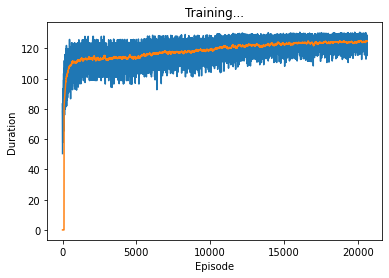

Current_train_num :  227845 Accuracy :  0.9990914876341372
F1 0.7284595300261096
279 100 108


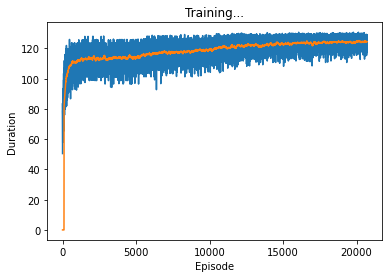

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7364532019704434
299 126 88
20700


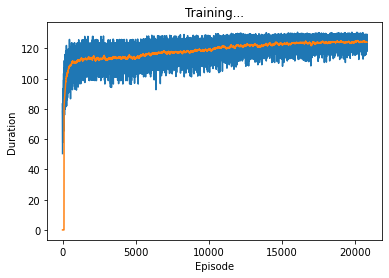

Current_train_num :  227845 Accuracy :  0.9819043648094099
F1 0.13361344537815126
318 4055 69


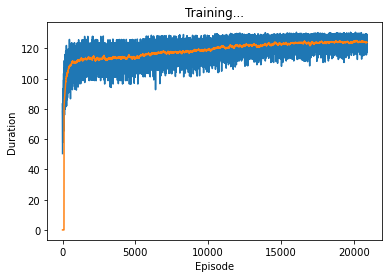

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.717391304347826
297 144 90


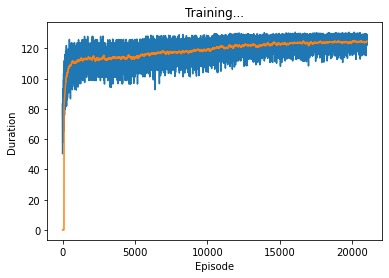

Current_train_num :  227845 Accuracy :  0.9988852070486515
F1 0.7065592635212888
307 175 80


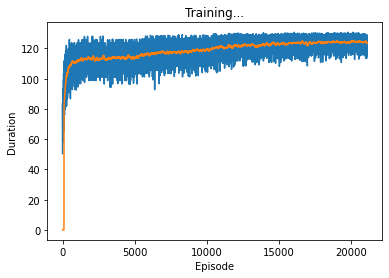

Current_train_num :  227845 Accuracy :  0.9990212644560995
F1 0.7060367454068242
269 106 118


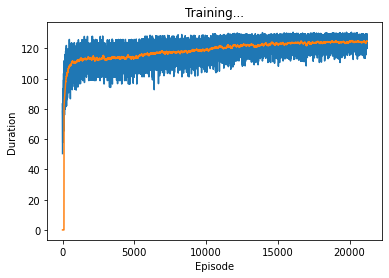

Current_train_num :  227845 Accuracy :  0.9990827097368825
F1 0.7192513368983957
269 92 118


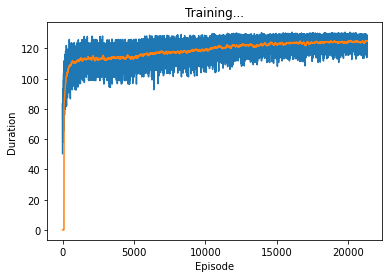

Current_train_num :  227845 Accuracy :  0.9991178213259014
F1 0.7335092348284961
278 93 109


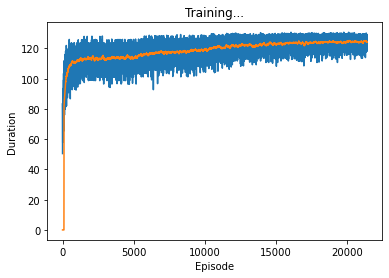

Current_train_num :  227845 Accuracy :  0.9990124865588448
F1 0.7146464646464646
283 122 104


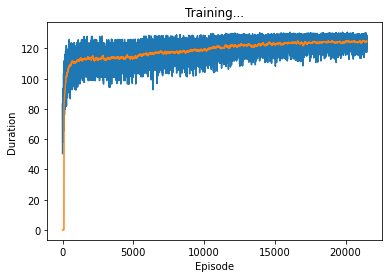

Current_train_num :  227845 Accuracy :  0.9989949307643354
F1 0.7242206235011991
302 145 85


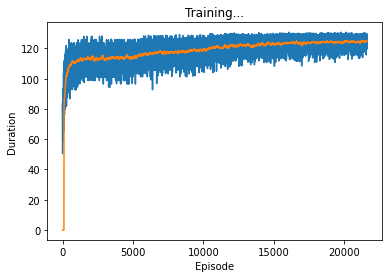

Current_train_num :  227845 Accuracy :  0.9990432091992363
F1 0.7144719687092569
274 106 113


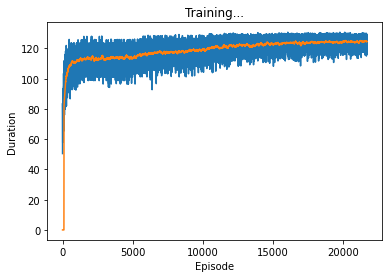

Current_train_num :  227845 Accuracy :  0.9989554302266892
F1 0.71849234393404
305 157 82


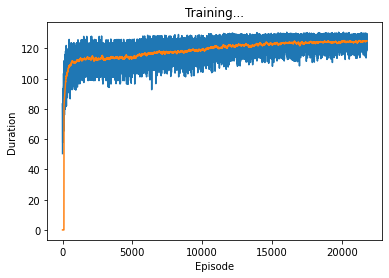

Current_train_num :  227845 Accuracy :  0.9990080976102175
F1 0.7173100871731009
288 128 99


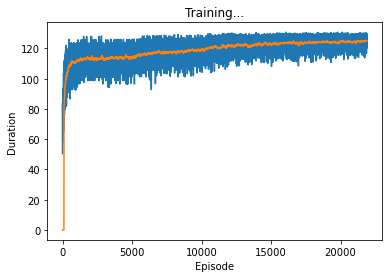

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.7247820672478207
291 125 96


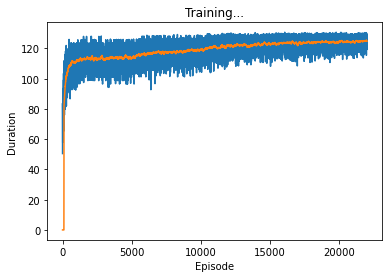

Current_train_num :  227845 Accuracy :  0.9973315192345673
F1 0.5028571428571429
308 530 79


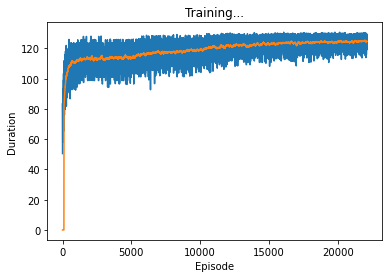

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.7249022164276402
278 102 109


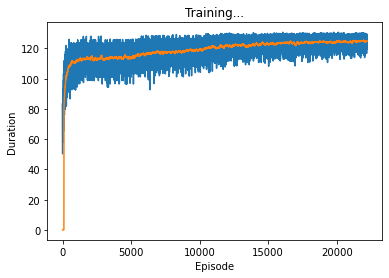

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.7404674046740467
301 125 86
22200


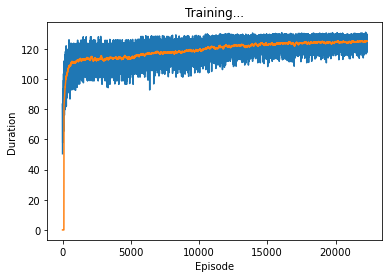

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.7256176853055917
279 103 108


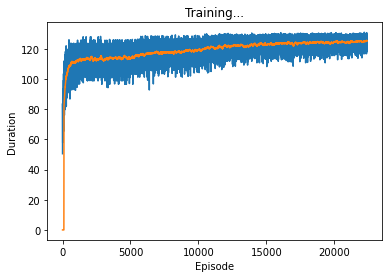

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7235142118863049
280 107 107


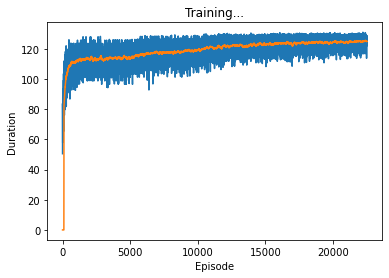

Current_train_num :  227845 Accuracy :  0.9990563760451184
F1 0.713527851458886
269 98 118


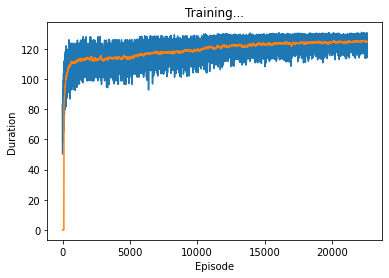

Current_train_num :  227845 Accuracy :  0.999051987096491
F1 0.7343941248470012
300 130 87


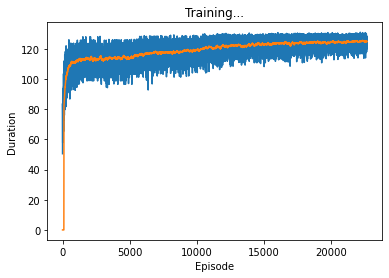

Current_train_num :  227845 Accuracy :  0.9964800632008602
F1 0.4388539482879106
314 730 73


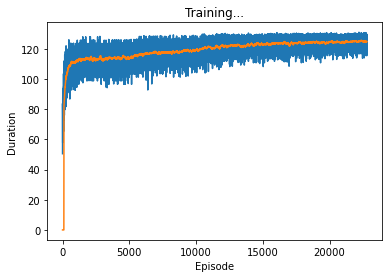

Current_train_num :  227845 Accuracy :  0.9990256534047269
F1 0.7194968553459119
286 122 101


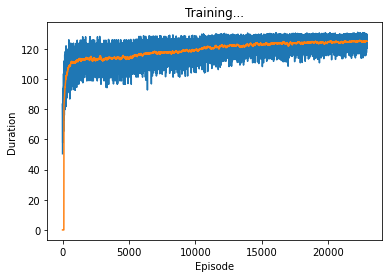

Current_train_num :  227845 Accuracy :  0.9990037086615902
F1 0.692722371967655
257 98 130


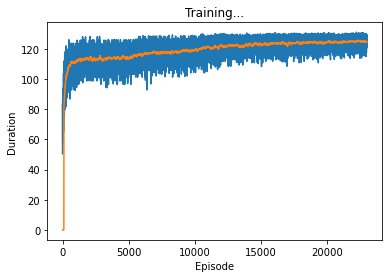

Current_train_num :  227845 Accuracy :  0.999100265531392
F1 0.7425
297 116 90
23000


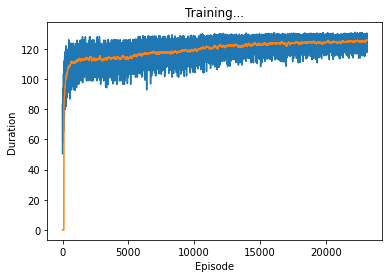

Current_train_num :  227845 Accuracy :  0.998929096534925
F1 0.7141190198366394
306 164 81


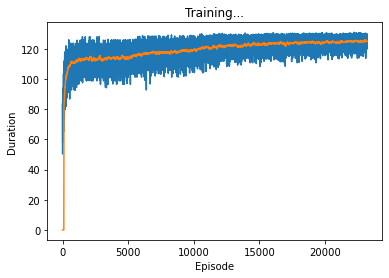

Current_train_num :  227845 Accuracy :  0.999051987096491
F1 0.7369696969696969
304 134 83


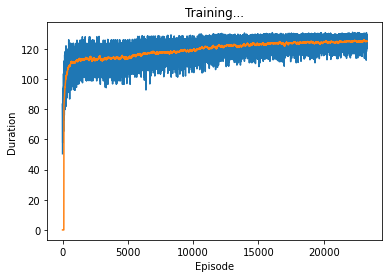

Current_train_num :  227845 Accuracy :  0.9990475981478637
F1 0.7161458333333334
275 106 112


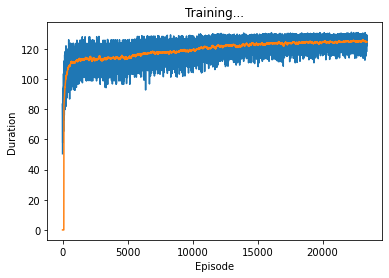

Current_train_num :  227845 Accuracy :  0.999100265531392
F1 0.7418546365914787
296 115 91


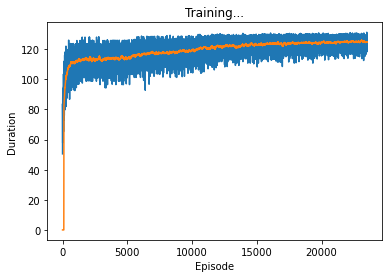

Current_train_num :  227845 Accuracy :  0.9984638679804253
F1 0.64
312 276 75


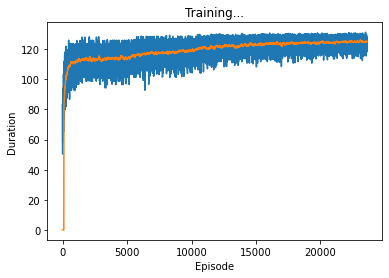

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7351485148514851
297 124 90


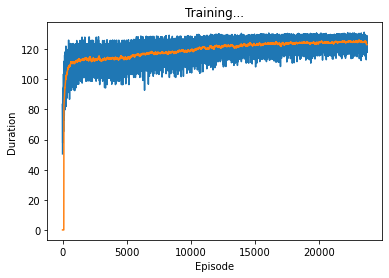

Current_train_num :  227845 Accuracy :  0.9989115407404157
F1 0.6710700132100397
254 116 133


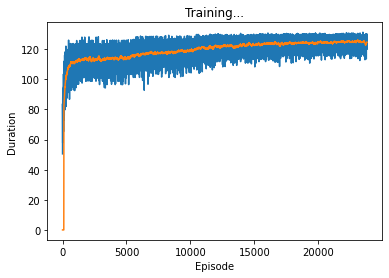

Current_train_num :  227845 Accuracy :  0.998990541815708
F1 0.717948717948718
294 138 93


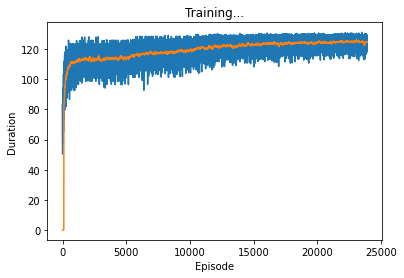

Current_train_num :  227845 Accuracy :  0.9990914876341372
F1 0.7425742574257426
300 121 87
23900


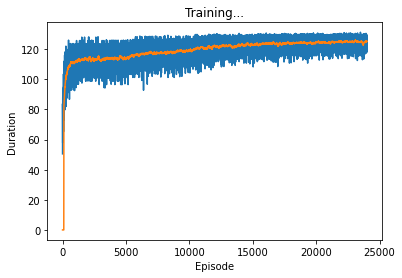

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.7345911949685534
292 116 95


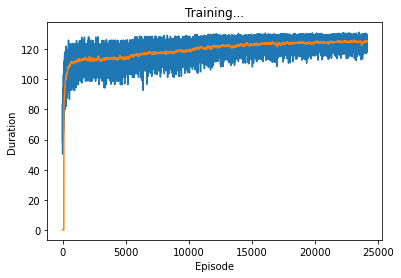

Current_train_num :  227845 Accuracy :  0.9991178213259014
F1 0.7506172839506173
304 119 83
24100


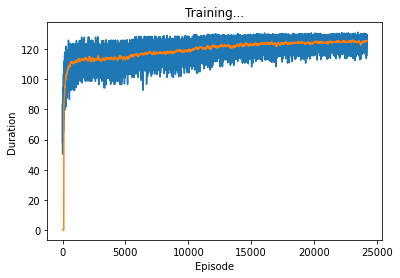

Current_train_num :  227845 Accuracy :  0.9988720402027694
F1 0.7054794520547946
309 180 78


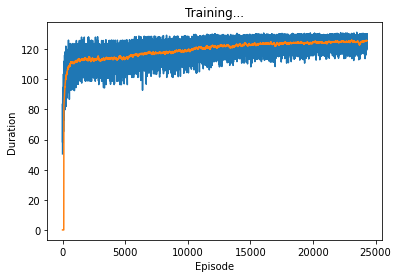

Current_train_num :  227845 Accuracy :  0.9976782461761285
F1 0.5407279029462738
312 455 75


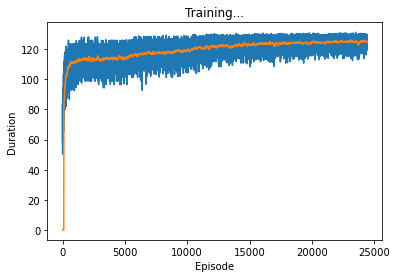

Current_train_num :  227845 Accuracy :  0.9991485439662928
F1 0.7559449311639549
302 110 85
24400


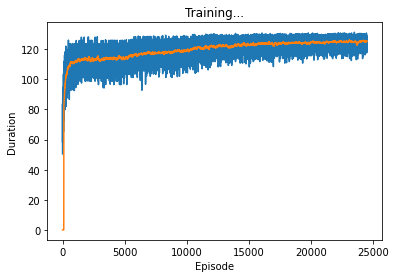

Current_train_num :  227845 Accuracy :  0.9990870986855099
F1 0.7260812581913499
277 99 110


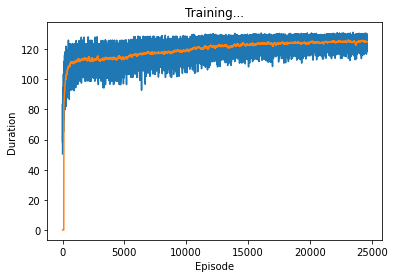

Current_train_num :  227845 Accuracy :  0.9991529329149202
F1 0.7447368421052631
283 90 104


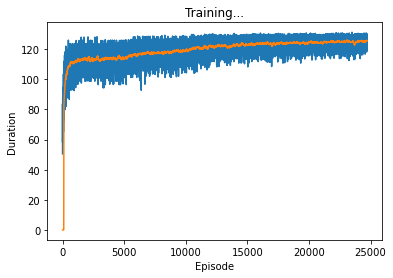

Current_train_num :  227845 Accuracy :  0.9991046544800193
F1 0.7408343868520859
293 111 94


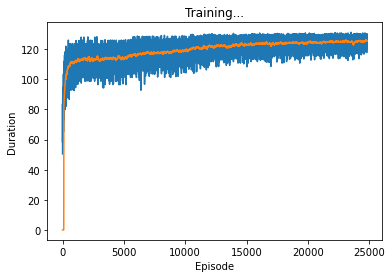

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7409200968523002
306 133 81


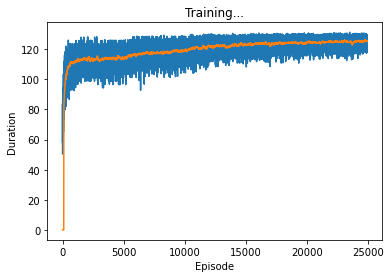

Current_train_num :  227845 Accuracy :  0.9989598191753165
F1 0.7002518891687658
278 129 109


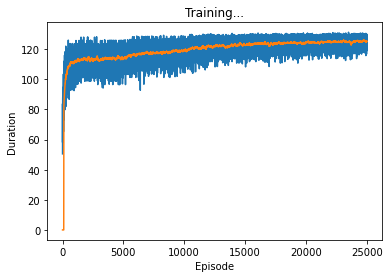

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.727741935483871
282 106 105


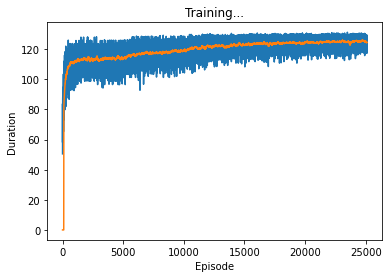

Current_train_num :  227845 Accuracy :  0.9990563760451184
F1 0.7265822784810126
287 116 100


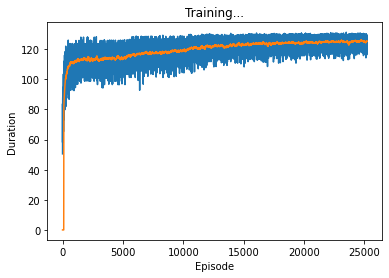

Current_train_num :  227845 Accuracy :  0.9989729860211987
F1 0.7251461988304093
310 158 77


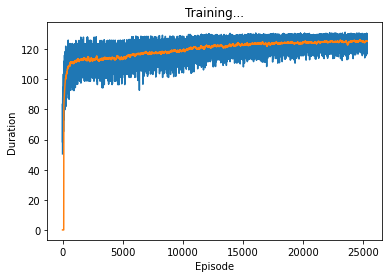

Current_train_num :  227845 Accuracy :  0.9989422633808072
F1 0.7172897196261683
307 162 80


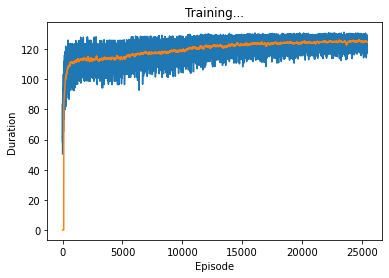

Current_train_num :  227845 Accuracy :  0.999051987096491
F1 0.7394957983193278
308 138 79


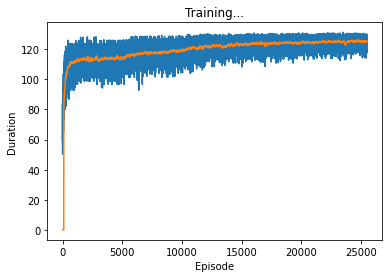

Current_train_num :  227845 Accuracy :  0.999100265531392
F1 0.745679012345679
302 121 85


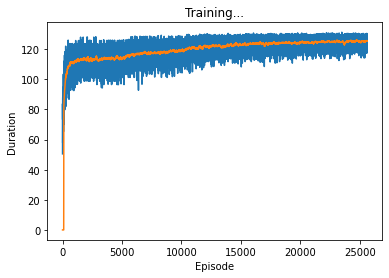

Current_train_num :  227845 Accuracy :  0.9990914876341372
F1 0.7298701298701299
281 102 106


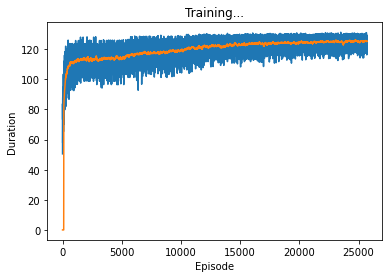

Current_train_num :  227845 Accuracy :  0.999038820250609
F1 0.7368421052631579
308 141 79


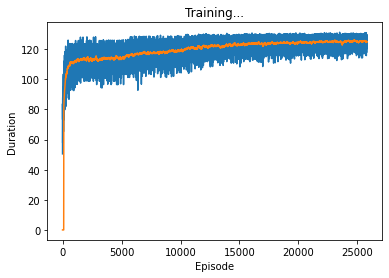

Current_train_num :  227845 Accuracy :  0.9990080976102175
F1 0.7313609467455622
309 149 78


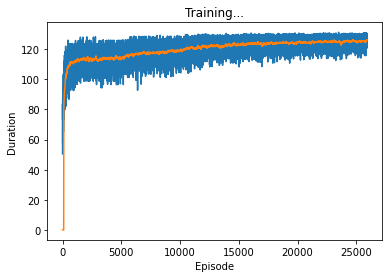

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.7213114754098361
286 120 101


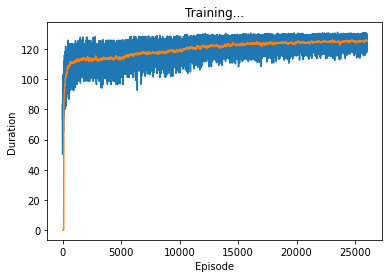

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.7359617682198327
308 142 79


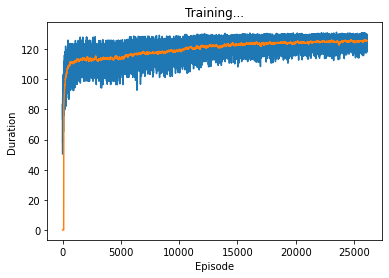

Current_train_num :  227845 Accuracy :  0.9909850995194102
F1 0.2340663436451733
314 1982 73


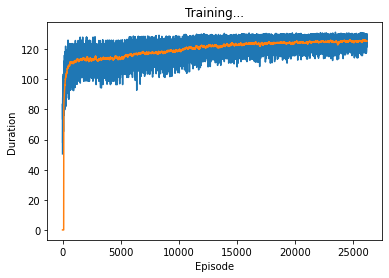

Current_train_num :  227845 Accuracy :  0.9990256534047269
F1 0.718078381795196
284 120 103


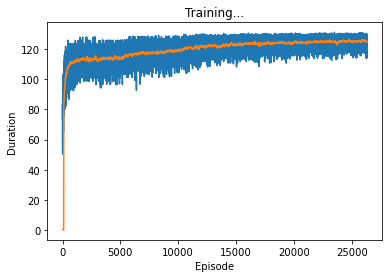

Current_train_num :  227845 Accuracy :  0.9989422633808072
F1 0.7186046511627907
309 164 78


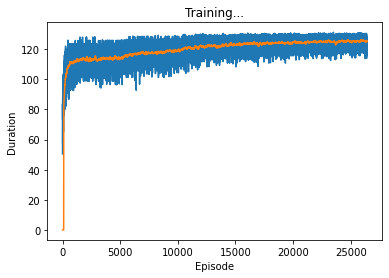

Current_train_num :  227845 Accuracy :  0.9989993197129627
F1 0.6958831341301461
262 104 125


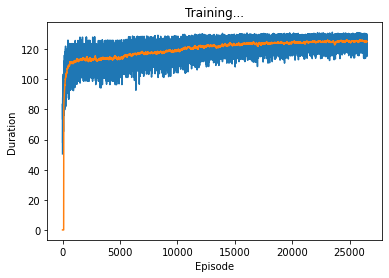

Current_train_num :  227845 Accuracy :  0.9989203186376704
F1 0.7170675830469645
313 173 74


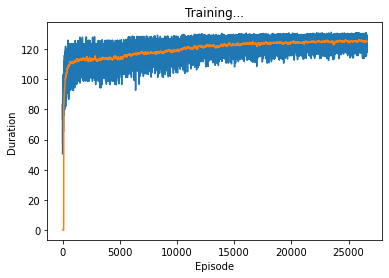

Current_train_num :  227845 Accuracy :  0.9990212644560995
F1 0.7021276595744681
264 101 123


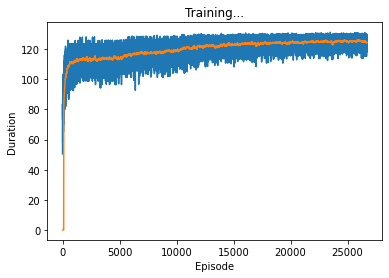

Current_train_num :  227845 Accuracy :  0.9980161952204349
F1 0.5817174515235457
315 381 72


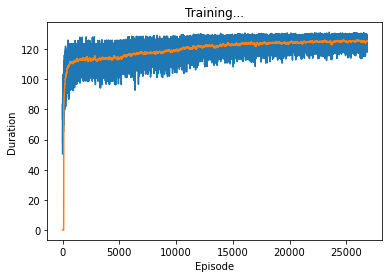

Current_train_num :  227845 Accuracy :  0.9990739318396278
F1 0.7232375979112271
277 102 110


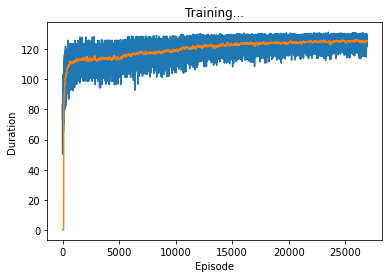

Current_train_num :  227845 Accuracy :  0.9987623164870855
F1 0.6900328587075575
315 211 72


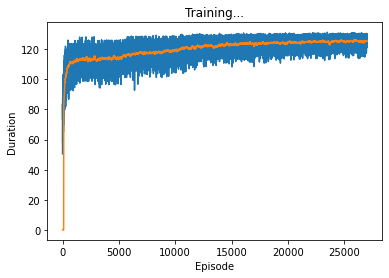

Current_train_num :  227845 Accuracy :  0.9970506265224166
F1 0.4834996162701458
315 601 72


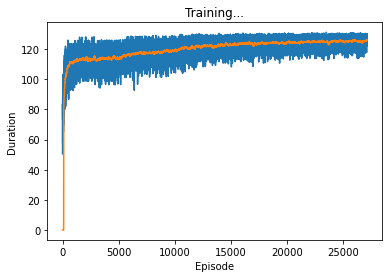

Current_train_num :  227845 Accuracy :  0.9988369286137506
F1 0.7004504504504504
311 190 76


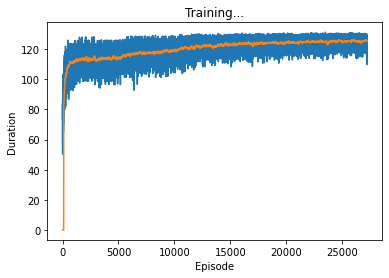

Current_train_num :  227845 Accuracy :  0.9990300423533542
F1 0.7182741116751269
283 118 104


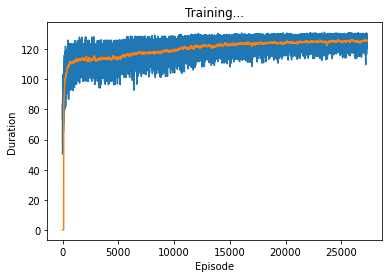

Current_train_num :  227845 Accuracy :  0.9989642081239439
F1 0.7240977881257276
311 161 76


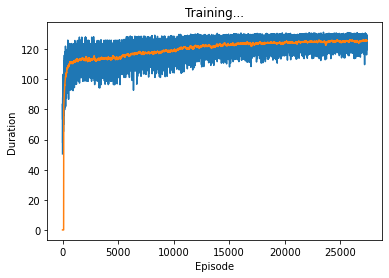

Current_train_num :  227845 Accuracy :  0.9990739318396278
F1 0.7439613526570048
308 133 79


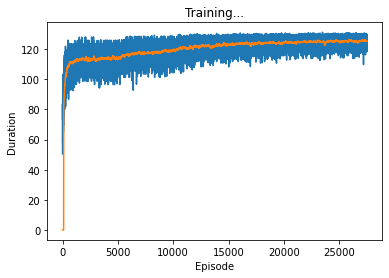

Current_train_num :  227845 Accuracy :  0.9989554302266892
F1 0.7045735475896168
285 137 102


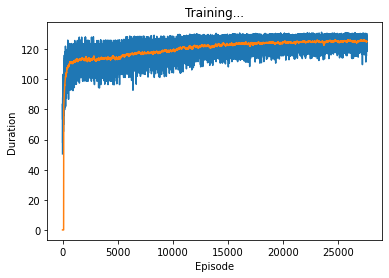

Current_train_num :  227845 Accuracy :  0.9986482038227743
F1 0.6716259298618491
316 238 71


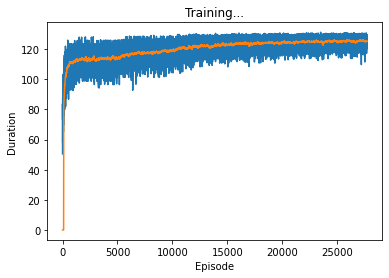

Current_train_num :  227845 Accuracy :  0.998990541815708
F1 0.7291910902696366
311 155 76


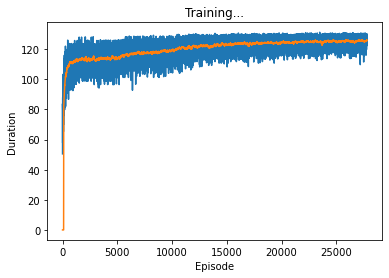

Current_train_num :  227845 Accuracy :  0.9988939849459062
F1 0.7134767836919592
315 181 72


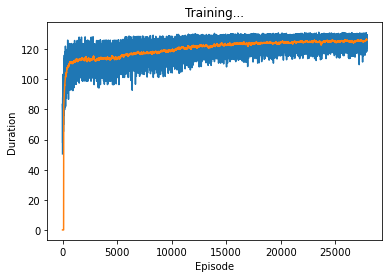

Current_train_num :  227845 Accuracy :  0.9989598191753165
F1 0.6987341772151898
276 127 111


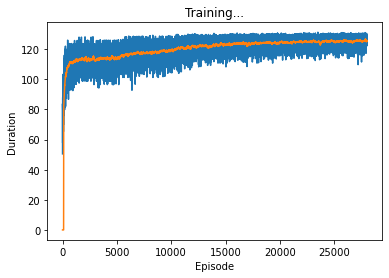

Current_train_num :  227845 Accuracy :  0.9988281507164959
F1 0.7008928571428571
314 195 73


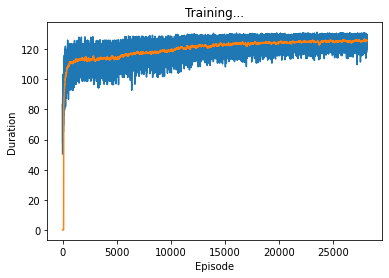

Current_train_num :  227845 Accuracy :  0.9978538041212227
F1 0.5617173524150268
314 417 73


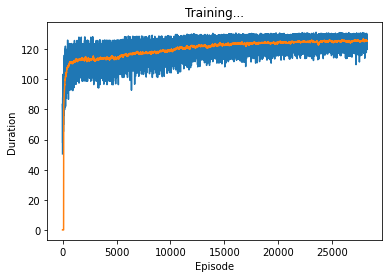

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.7133592736705577
275 109 112


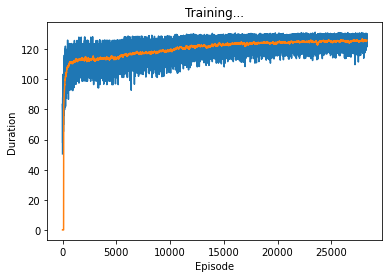

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.7417380660954712
303 127 84


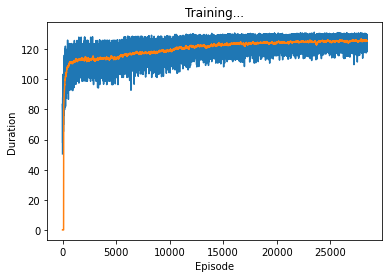

Current_train_num :  227845 Accuracy :  0.9977572472514209
F1 0.5524475524475524
316 441 71


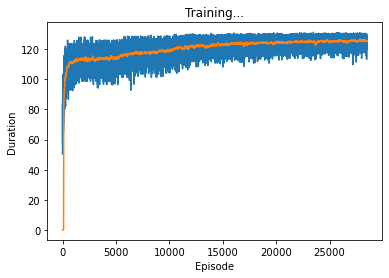

Current_train_num :  227845 Accuracy :  0.9989071517917882
F1 0.7126436781609196
310 173 77


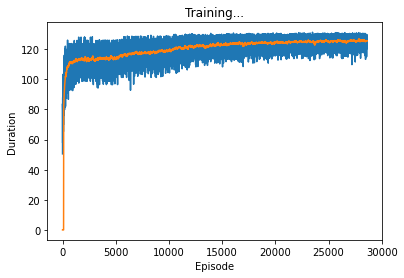

Current_train_num :  227845 Accuracy :  0.9989247075862977
F1 0.7078384798099763
298 157 89


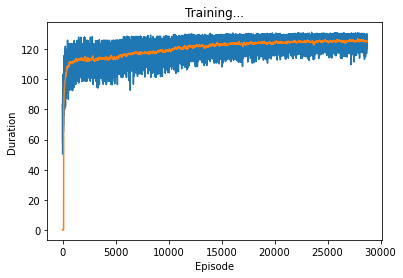

Current_train_num :  227845 Accuracy :  0.9990168755074722
F1 0.7176913425345044
286 124 101


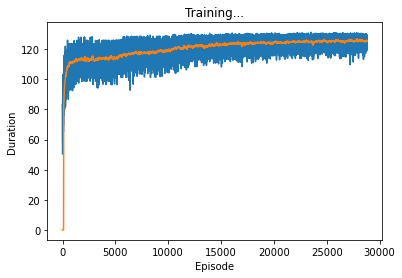

Current_train_num :  227845 Accuracy :  0.9990256534047269
F1 0.7250308261405672
294 130 93


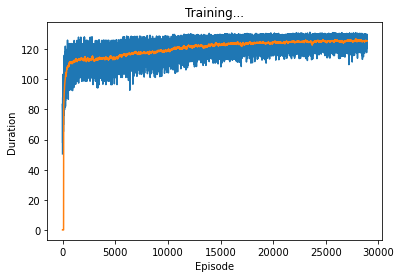

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.7197231833910035
312 168 75


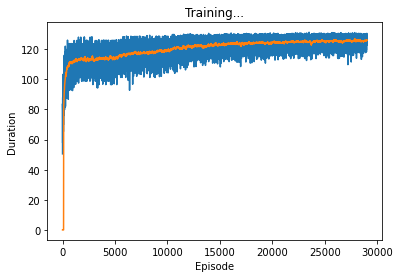

Current_train_num :  227845 Accuracy :  0.9989993197129627
F1 0.725748502994012
303 145 84


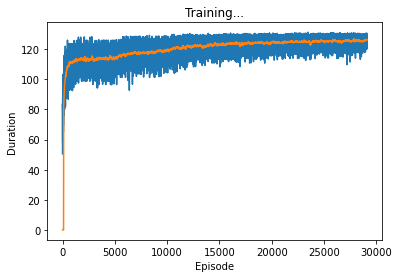

Current_train_num :  227845 Accuracy :  0.9988676512541421
F1 0.7033218785796106
307 179 80


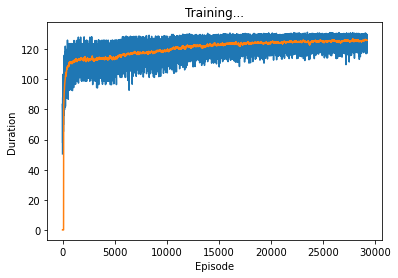

Current_train_num :  227845 Accuracy :  0.9987623164870855
F1 0.6743383199079401
293 189 94


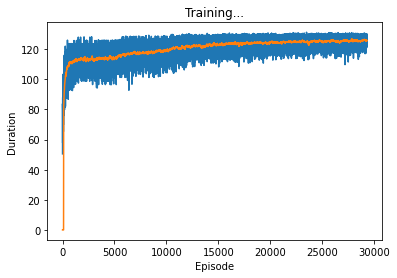

Current_train_num :  227845 Accuracy :  0.9988105949219864
F1 0.6984478935698448
315 200 72


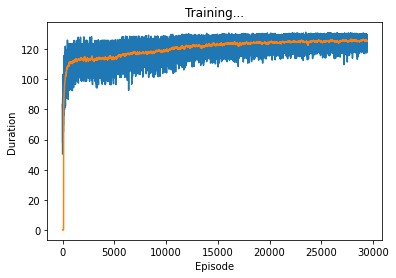

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.6582278481012658
286 196 101


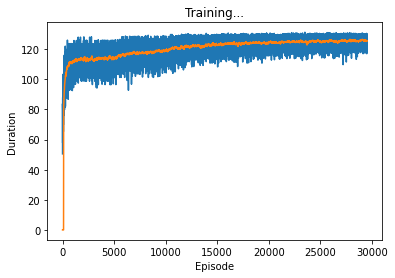

Current_train_num :  227845 Accuracy :  0.9986525927714016
F1 0.65
286 207 101


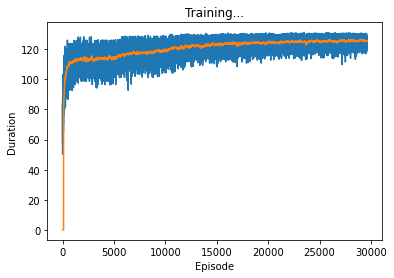

Current_train_num :  227845 Accuracy :  0.9984814237749348
F1 0.6455566905005107
316 276 71


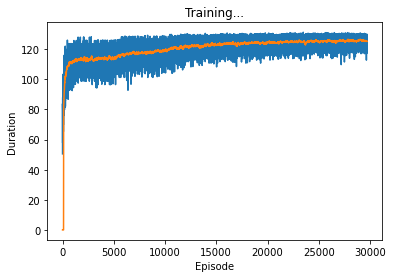

Current_train_num :  227845 Accuracy :  0.9986306480282648
F1 0.66524064171123
311 237 76


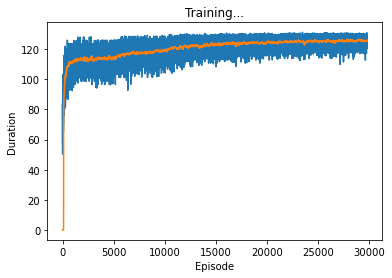

Current_train_num :  227845 Accuracy :  0.998275143189449
F1 0.6159844054580896
316 323 71


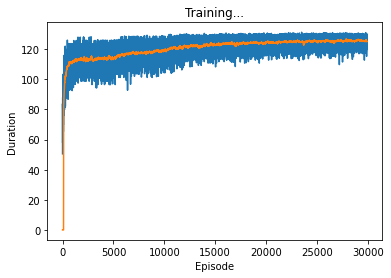

Current_train_num :  227845 Accuracy :  0.9983190326757225
F1 0.6144578313253012
306 303 81


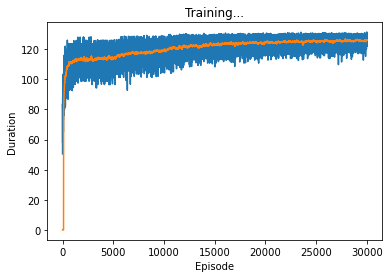

Current_train_num :  227845 Accuracy :  0.9989071517917882
F1 0.7126436781609196
310 173 77


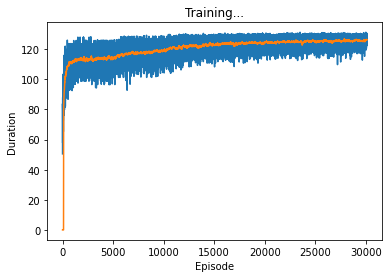

Current_train_num :  227845 Accuracy :  0.9905725383484386
F1 0.22836624775583483
318 2080 69


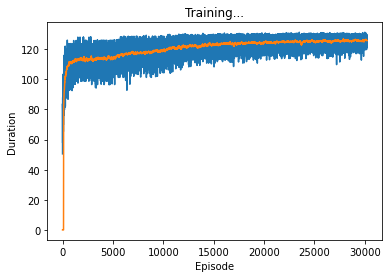

Current_train_num :  227845 Accuracy :  0.998349755316114
F1 0.626362735381566
316 306 71


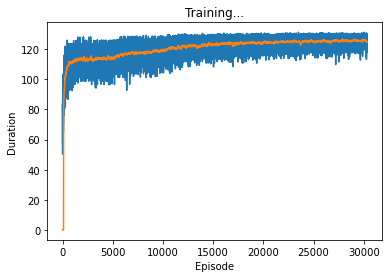

Current_train_num :  227845 Accuracy :  0.9988105949219864
F1 0.6991150442477876
316 201 71


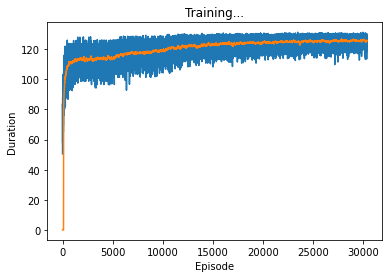

Current_train_num :  227845 Accuracy :  0.9988939849459062
F1 0.688039457459926
279 145 108


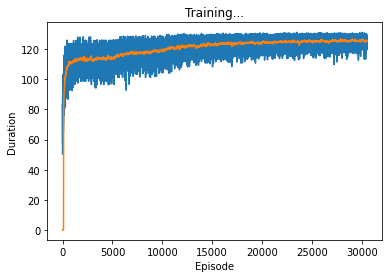

Current_train_num :  227845 Accuracy :  0.9986394259255196
F1 0.6659505907626209
310 234 77


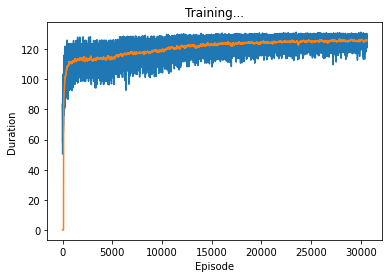

Current_train_num :  227845 Accuracy :  0.9986438148741469
F1 0.6623093681917211
304 227 83


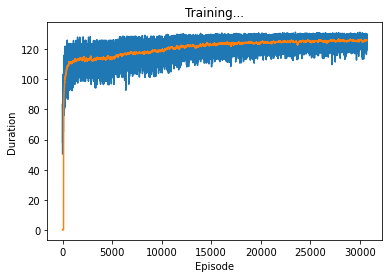

Current_train_num :  227845 Accuracy :  0.9982839210867037
F1 0.6134122287968442
311 316 76


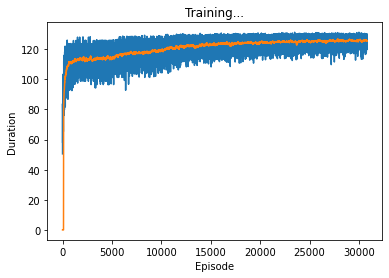

Current_train_num :  227845 Accuracy :  0.9983453663674867
F1 0.6257425742574257
316 307 71


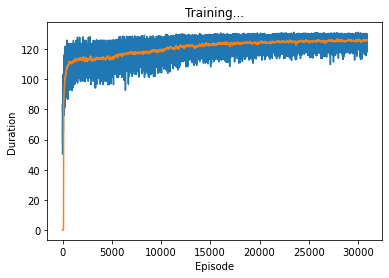

Current_train_num :  227845 Accuracy :  0.9987403717439487
F1 0.6807095343680709
307 208 80


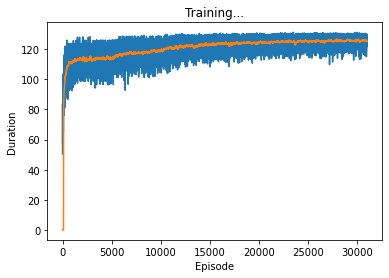

Current_train_num :  227845 Accuracy :  0.9987667054357129
F1 0.6705607476635514
287 182 100


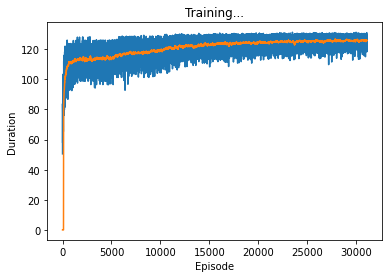

Current_train_num :  227845 Accuracy :  0.9978669709671049
F1 0.5647899910634495
316 416 71


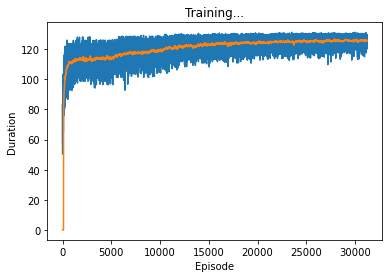

Current_train_num :  227845 Accuracy :  0.9986613706686563
F1 0.6506849315068494
285 204 102


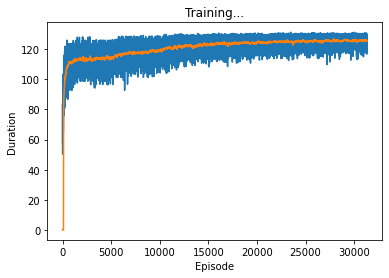

Current_train_num :  227845 Accuracy :  0.9986701485659111
F1 0.670995670995671
310 227 77


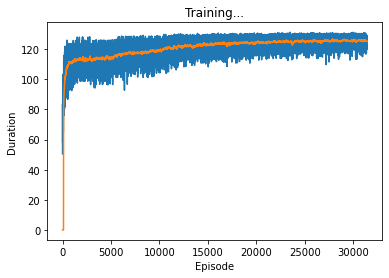

Current_train_num :  227845 Accuracy :  0.9985472580043451
F1 0.6519916142557652
311 256 76


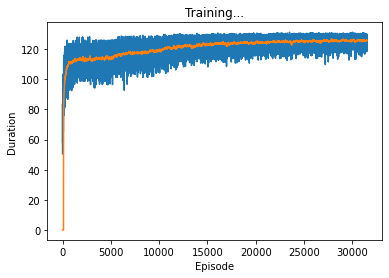

Current_train_num :  227845 Accuracy :  0.9989729860211987
F1 0.7251461988304093
310 158 77


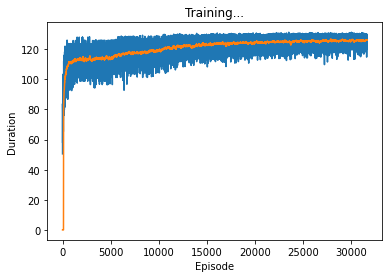

Current_train_num :  227845 Accuracy :  0.9988676512541421
F1 0.6742138364779874
268 140 119


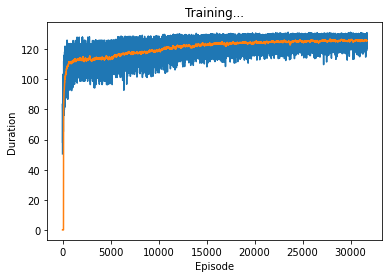

Current_train_num :  227845 Accuracy :  0.9987886501788497
F1 0.6952695269526953
316 206 71


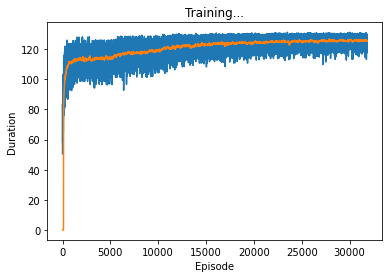

Current_train_num :  227845 Accuracy :  0.9986657596172837
F1 0.6473988439306358
280 198 107


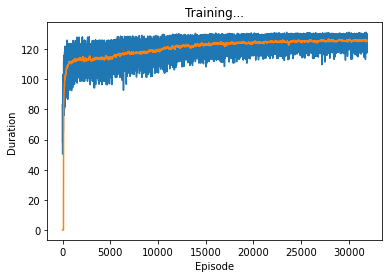

Current_train_num :  227845 Accuracy :  0.9987359827953214
F1 0.682068206820682
310 212 77


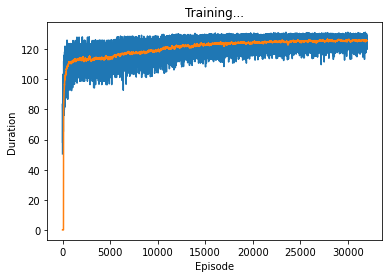

Current_train_num :  227845 Accuracy :  0.9989422633808072
F1 0.711217183770883
298 153 89


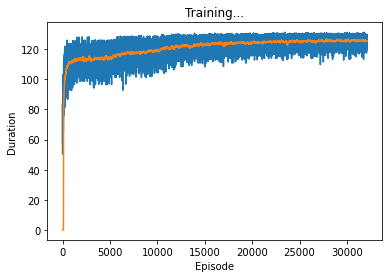

Current_train_num :  227845 Accuracy :  0.9963001163071387
F1 0.4281842818428184
316 773 71


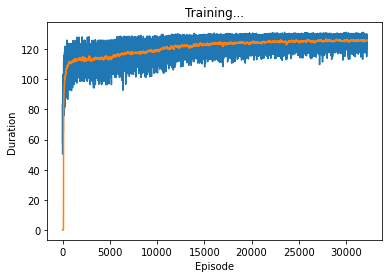

Current_train_num :  227845 Accuracy :  0.9986745375145384
F1 0.6731391585760518
312 228 75


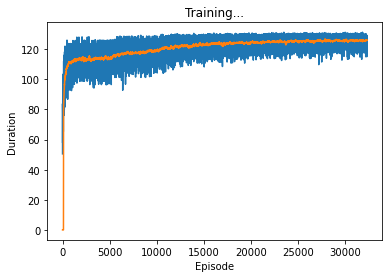

Current_train_num :  227845 Accuracy :  0.9988457065110052
F1 0.6979405034324943
305 182 82


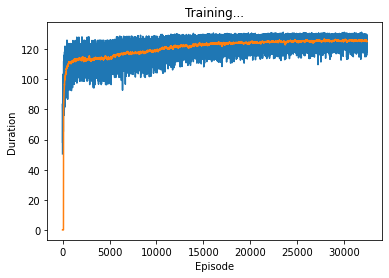

Current_train_num :  227845 Accuracy :  0.9987974280761044
F1 0.691358024691358
308 196 79


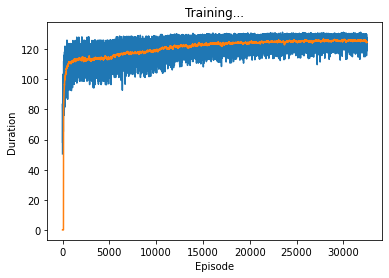

Current_train_num :  227845 Accuracy :  0.9983804779565055
F1 0.6080508474576272
287 270 100


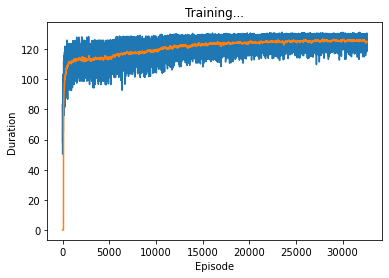

Current_train_num :  227845 Accuracy :  0.9979240272992604
F1 0.5643382352941176
307 394 80


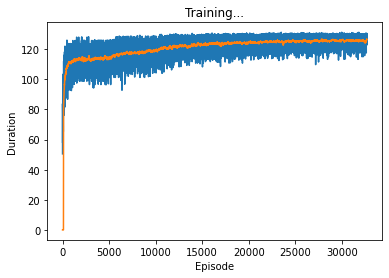

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.6761177753544165
310 220 77


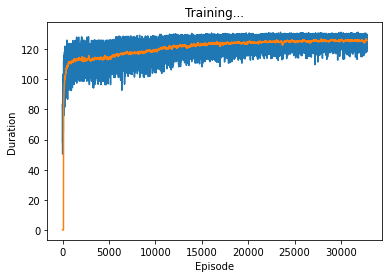

Current_train_num :  227845 Accuracy :  0.9990739318396278
F1 0.7323232323232324
290 115 97


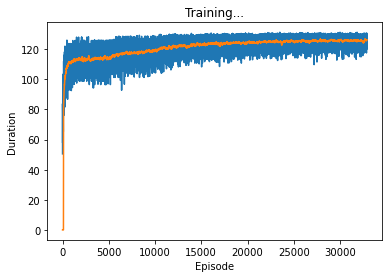

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.7197231833910035
312 168 75


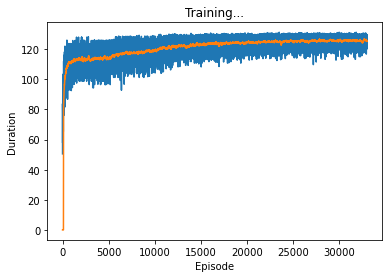

Current_train_num :  227845 Accuracy :  0.9926397331519234
F1 0.27610008628127697
320 1611 67


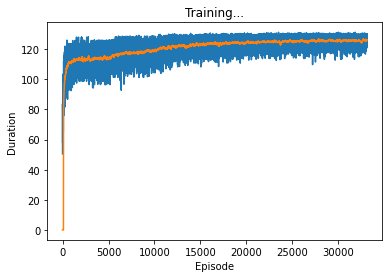

Current_train_num :  227845 Accuracy :  0.9989685970725712
F1 0.7156626506024096
297 146 90


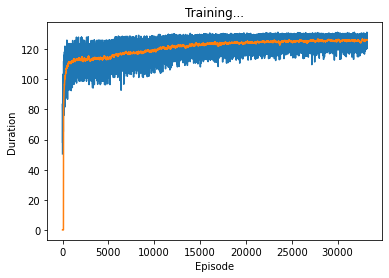

Current_train_num :  227845 Accuracy :  0.9949965985648138
F1 0.3571830985915493
317 1071 70


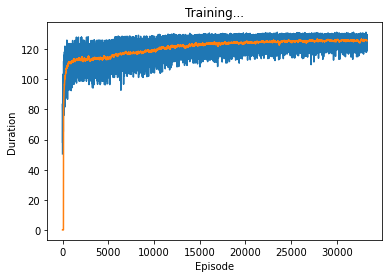

Current_train_num :  227845 Accuracy :  0.9986043143365007
F1 0.6580921757770632
307 239 80


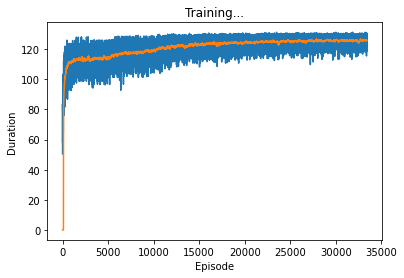

Current_train_num :  227845 Accuracy :  0.9990739318396278
F1 0.7427184466019418
306 131 81


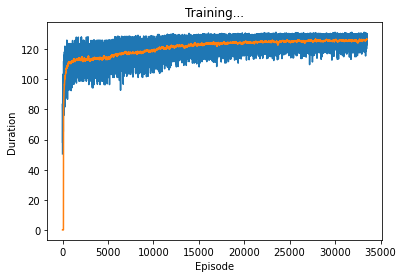

Current_train_num :  227845 Accuracy :  0.9987798722815949
F1 0.6917127071823205
313 205 74


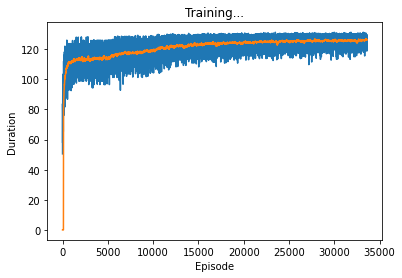

Current_train_num :  227845 Accuracy :  0.9985692027474818
F1 0.6202090592334495
267 207 120


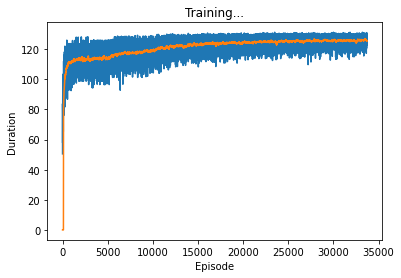

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.657439446366782
285 195 102


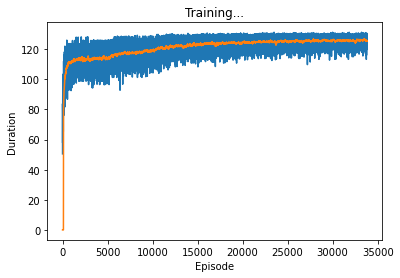

Current_train_num :  227845 Accuracy :  0.9972130176216287
F1 0.4944356120826709
311 560 76


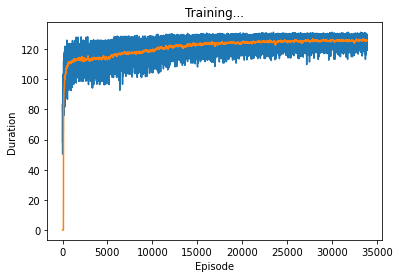

Current_train_num :  227845 Accuracy :  0.9968311790910488
F1 0.46720707442888726
317 653 70


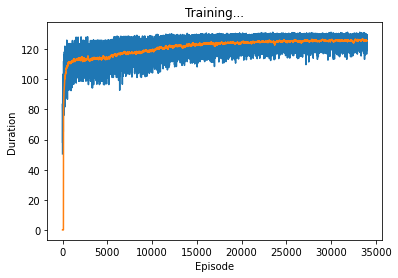

Current_train_num :  227845 Accuracy :  0.9987710943843402
F1 0.6860335195530727
307 201 80


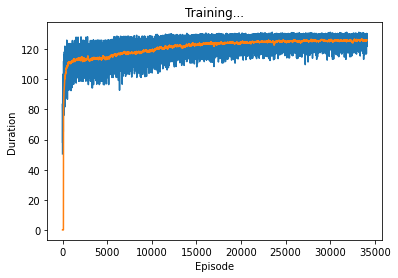

Current_train_num :  227845 Accuracy :  0.9990432091992363
F1 0.7299630086313194
296 128 91


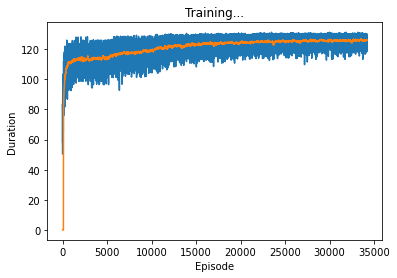

Current_train_num :  227845 Accuracy :  0.994469924729531
F1 0.3352662098049552
318 1192 69


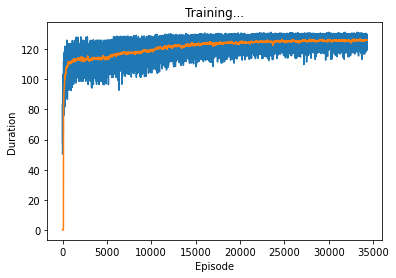

Current_train_num :  227845 Accuracy :  0.9990695428910005
F1 0.7244501940491591
280 106 107


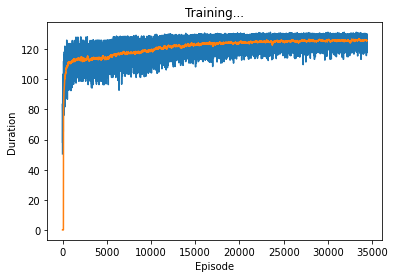

Current_train_num :  227845 Accuracy :  0.9988149838706138
F1 0.6944757609921083
308 192 79


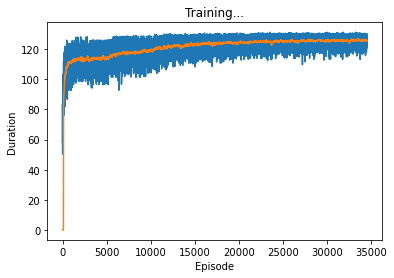

Current_train_num :  227845 Accuracy :  0.9986920933090478
F1 0.6753528773072747
311 223 76


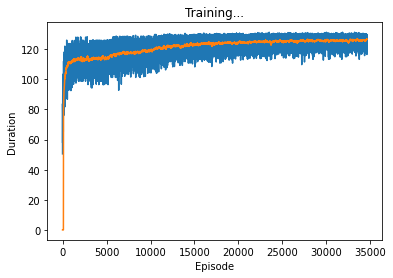

Current_train_num :  227845 Accuracy :  0.9988808181000242
F1 0.7064220183486238
308 177 79


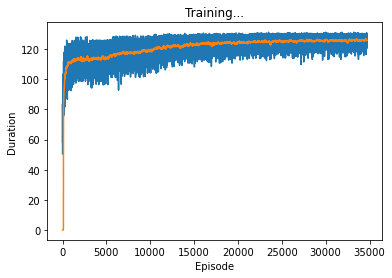

Current_train_num :  227845 Accuracy :  0.9791876056090764
F1 0.11987381703470032
323 4679 64


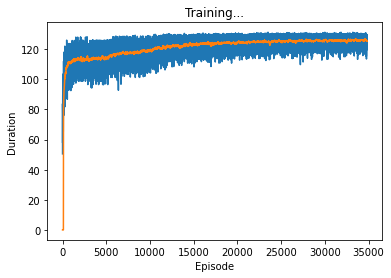

Current_train_num :  227845 Accuracy :  0.9988062059733591
F1 0.6858457997698504
298 184 89


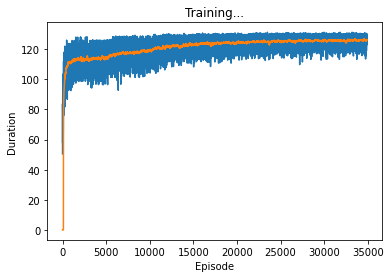

Current_train_num :  227845 Accuracy :  0.9986218701310101
F1 0.663820704375667
311 239 76


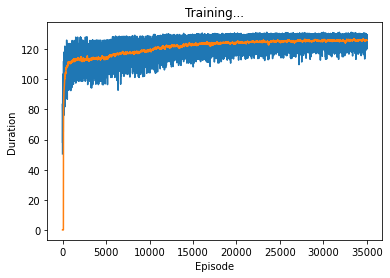

Current_train_num :  227845 Accuracy :  0.9985297022098356
F1 0.6477987421383647
309 258 78


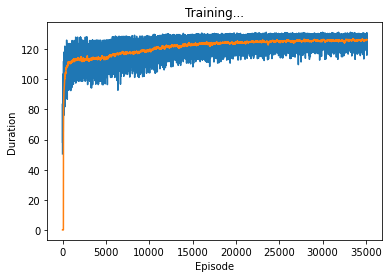

Current_train_num :  227845 Accuracy :  0.9987184270008119
F1 0.6516052318668252
274 180 113


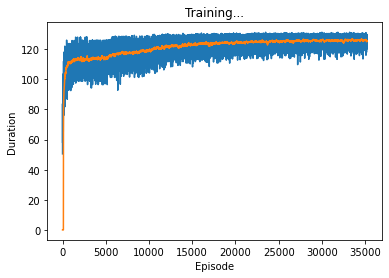

Current_train_num :  227845 Accuracy :  0.997401742412605
F1 0.5111294311624073
310 516 77


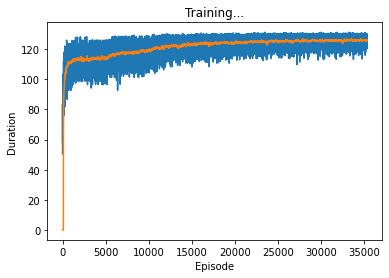

Current_train_num :  227845 Accuracy :  0.998139085782001
F1 0.5812807881773399
295 333 92


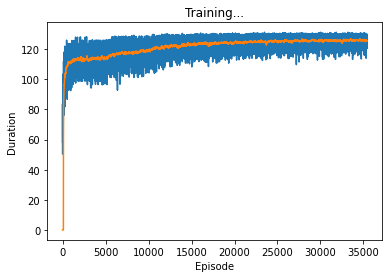

Current_train_num :  227845 Accuracy :  0.9977704140973029
F1 0.5443151298119964
304 426 83


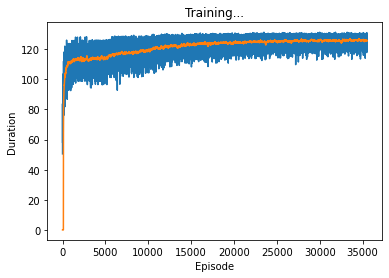

Current_train_num :  227845 Accuracy :  0.9987623164870855
F1 0.6802259887005649
301 197 86


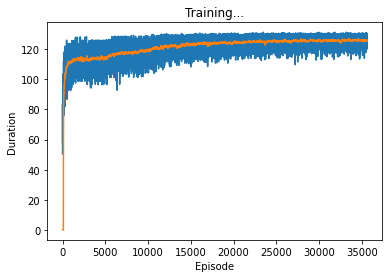

Current_train_num :  227845 Accuracy :  0.9981610305251377
F1 0.6022727272727273
318 351 69


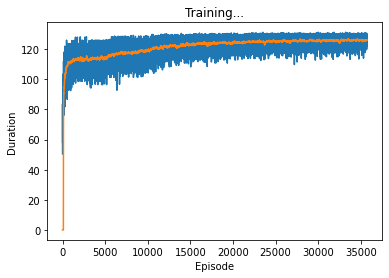

Current_train_num :  227845 Accuracy :  0.9987667054357129
F1 0.6809954751131222
301 196 86


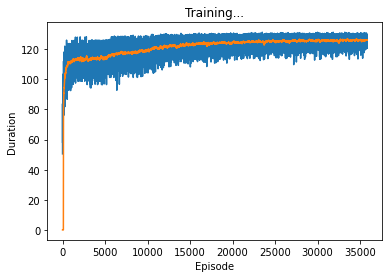

Current_train_num :  227845 Accuracy :  0.9987710943843402
F1 0.6832018038331454
303 197 84


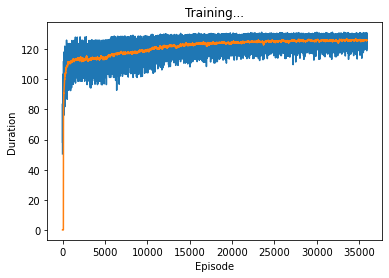

Current_train_num :  227845 Accuracy :  0.9985077574666988
F1 0.6329386437029063
294 248 93


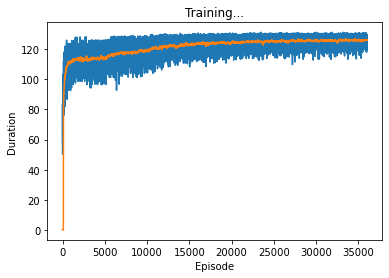

Current_train_num :  227845 Accuracy :  0.9980469178608264
F1 0.564453125
289 348 98


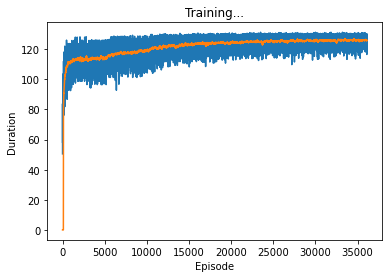

Current_train_num :  227845 Accuracy :  0.9982970879325858
F1 0.581270182992465
270 272 117


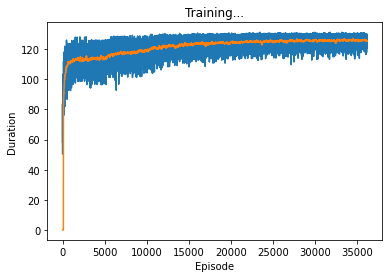

Current_train_num :  227845 Accuracy :  0.99770896881652
F1 0.548748921484038
318 454 69


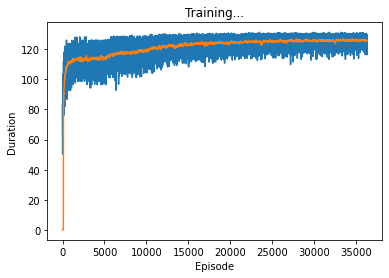

Current_train_num :  227845 Accuracy :  0.9988895959972789
F1 0.6932367149758454
287 154 100


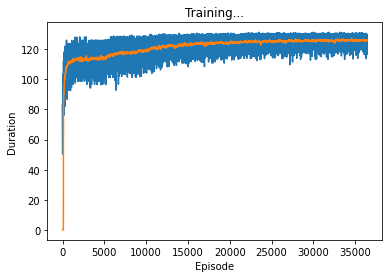

Current_train_num :  227845 Accuracy :  0.9970242928306524
F1 0.48286367098248284
317 609 70


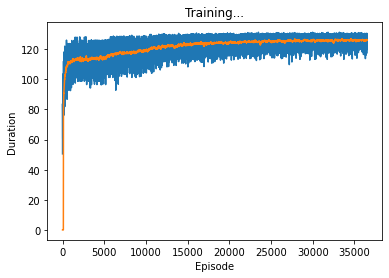

Current_train_num :  227845 Accuracy :  0.9987667054357129
F1 0.6852678571428571
307 202 80


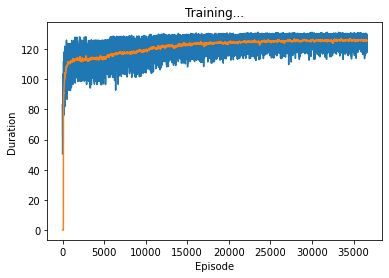

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.6605714285714286
289 199 98


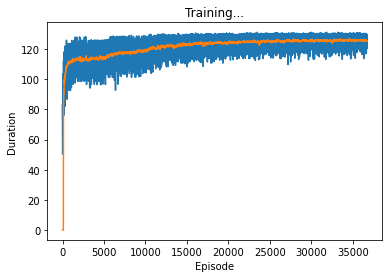

Current_train_num :  227845 Accuracy :  0.9956373850644078
F1 0.38994481912936846
318 926 69


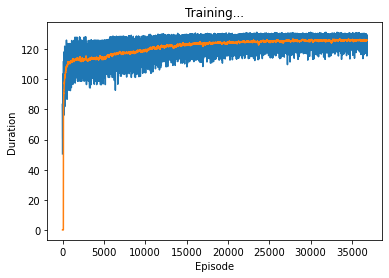

Current_train_num :  227845 Accuracy :  0.9985033685180715
F1 0.6208425720620843
280 235 107


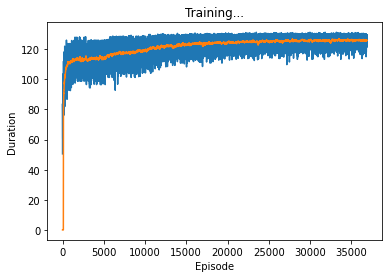

Current_train_num :  227845 Accuracy :  0.9986745375145384
F1 0.6702937976060935
308 224 79


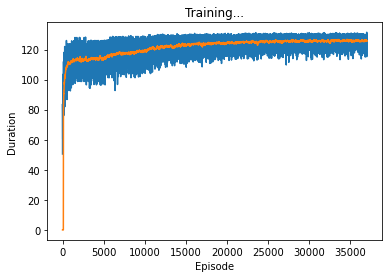

Current_train_num :  227845 Accuracy :  0.9987667054357129
F1 0.6666666666666666
282 177 105


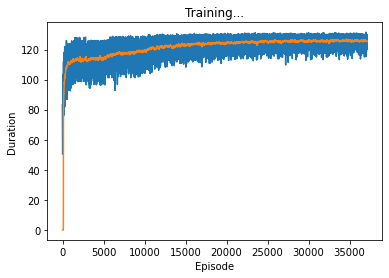

Current_train_num :  227845 Accuracy :  0.9982926989839583
F1 0.5979381443298969
290 293 97


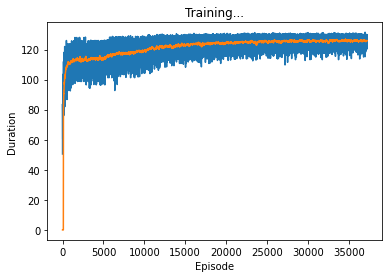

Current_train_num :  227845 Accuracy :  0.9967214553753648
F1 0.4595375722543353
318 679 69


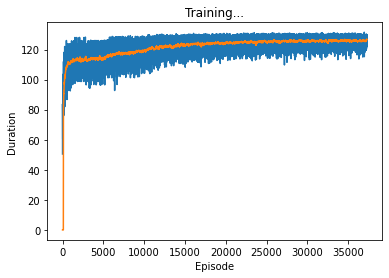

Current_train_num :  227845 Accuracy :  0.9987710943843402
F1 0.6824858757062147
302 196 85


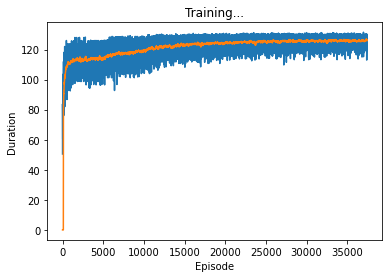

Current_train_num :  227845 Accuracy :  0.9948693190546205
F1 0.35359116022099446
320 1103 67


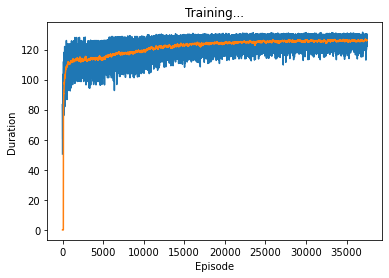

Current_train_num :  227845 Accuracy :  0.998398033751015
F1 0.625
305 284 82


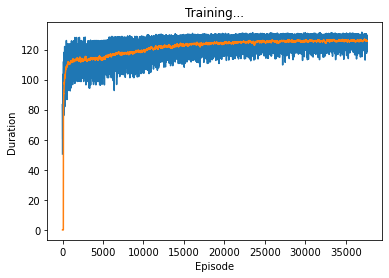

Current_train_num :  227845 Accuracy :  0.9984945906208168
F1 0.6301075268817204
293 250 94


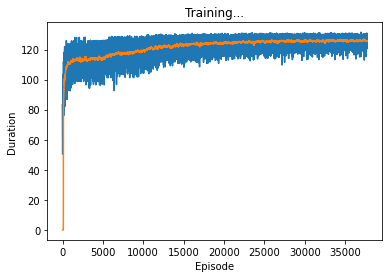

Current_train_num :  227845 Accuracy :  0.997572911409072
F1 0.5297113752122241
312 479 75


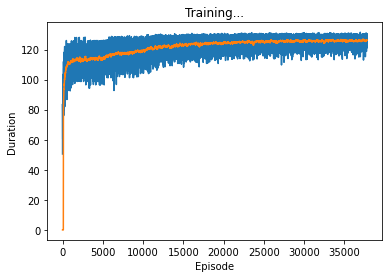

Current_train_num :  227845 Accuracy :  0.995663718756172
F1 0.39213275968039335
319 921 68


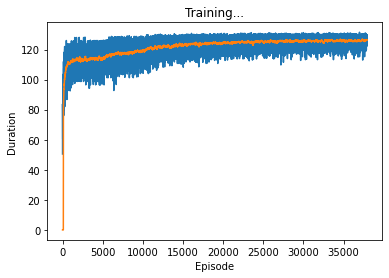

Current_train_num :  227845 Accuracy :  0.9974192982071145
F1 0.5191836734693878
318 520 69


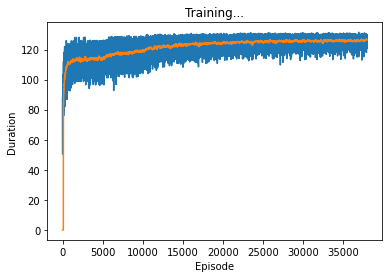

Current_train_num :  227845 Accuracy :  0.9982575873949395
F1 0.6120857699805068
314 325 73


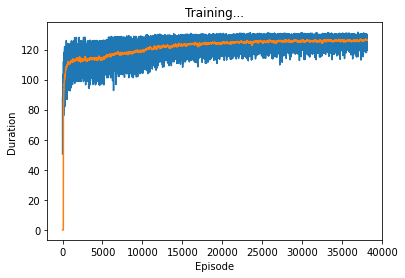

Current_train_num :  227845 Accuracy :  0.9983146437270952
F1 0.5925925925925926
280 278 107


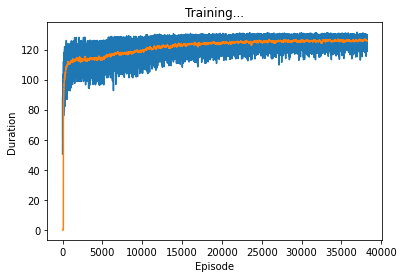

Current_train_num :  227845 Accuracy :  0.9983102547784678
F1 0.614
307 306 80


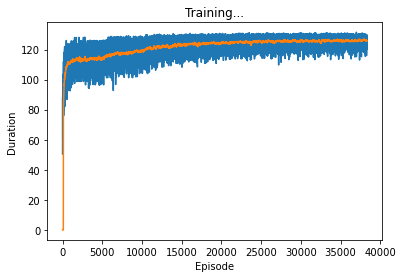

Current_train_num :  227845 Accuracy :  0.9987140380521846
F1 0.676923076923077
308 215 79


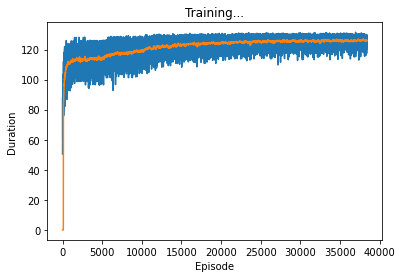

Current_train_num :  227845 Accuracy :  0.9985121464153263
F1 0.6443514644351465
308 261 79


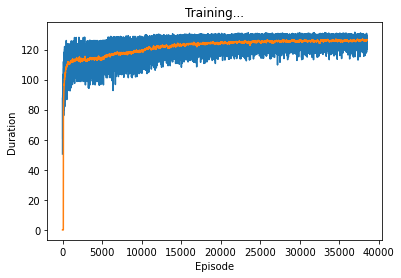

Current_train_num :  227845 Accuracy :  0.9989817639184533
F1 0.7236061684460261
305 151 82


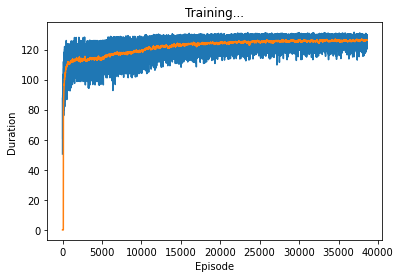

Current_train_num :  227845 Accuracy :  0.9988237617678685
F1 0.6980920314253648
311 193 76


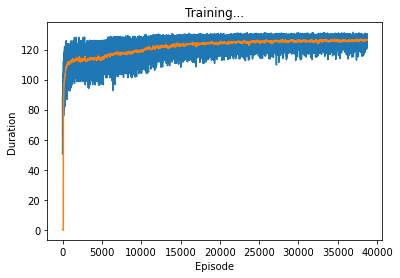

Current_train_num :  227845 Accuracy :  0.9987272048980667
F1 0.6812705366922235
311 215 76


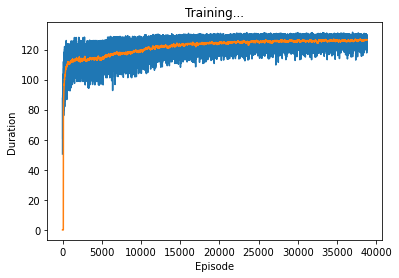

Current_train_num :  227845 Accuracy :  0.998398033751015
F1 0.634
317 296 70


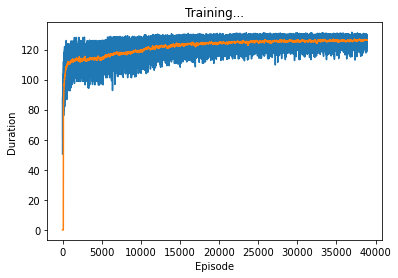

Current_train_num :  227845 Accuracy :  0.9986087032851281
F1 0.6652631578947369
316 247 71


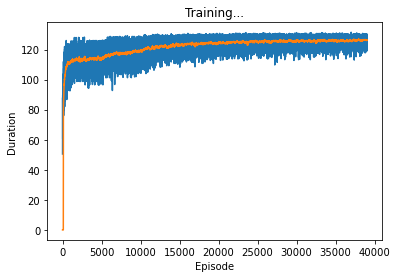

Current_train_num :  227845 Accuracy :  0.9982531984463122
F1 0.6144927536231884
318 330 69


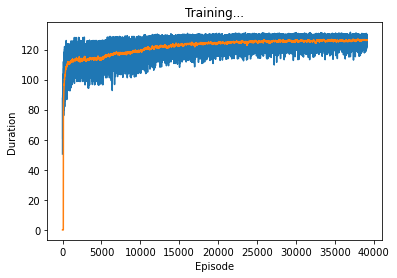

Current_train_num :  227845 Accuracy :  0.9980381399635717
F1 0.5781544256120528
307 368 80


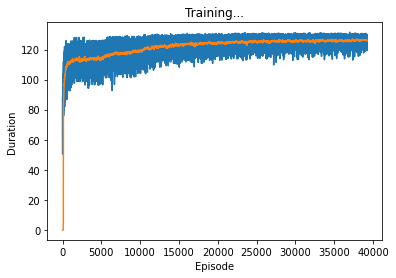

Current_train_num :  227845 Accuracy :  0.9977528583027936
F1 0.5109628217349858
268 394 119


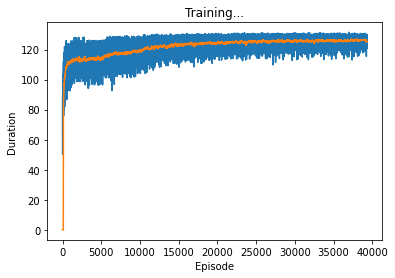

Current_train_num :  227845 Accuracy :  0.9930127937852488
F1 0.2891566265060241
324 1530 63


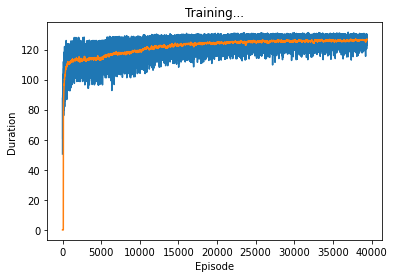

Current_train_num :  227845 Accuracy :  0.9984682569290526
F1 0.6413934426229508
313 276 74


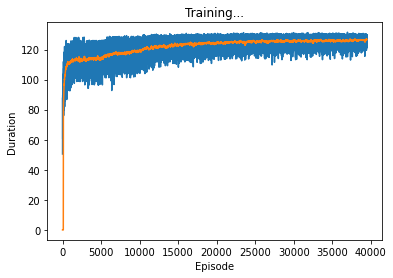

Current_train_num :  227845 Accuracy :  0.9959402225196954
F1 0.4079283887468031
319 858 68


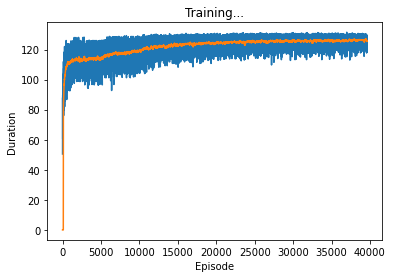

Current_train_num :  227845 Accuracy :  0.9986262590796374
F1 0.658695652173913
303 230 84


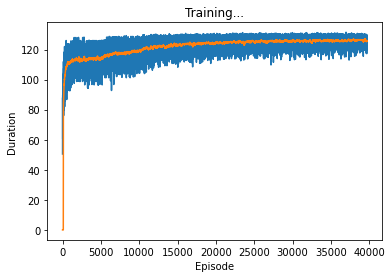

Current_train_num :  227845 Accuracy :  0.9985648137988545
F1 0.653276955602537
309 250 78


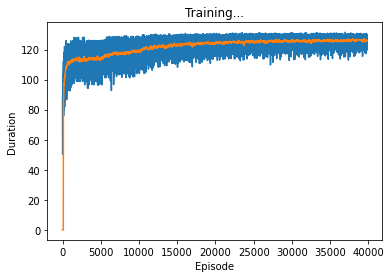

Current_train_num :  227845 Accuracy :  0.9988193728192412
F1 0.6931818181818182
305 188 82


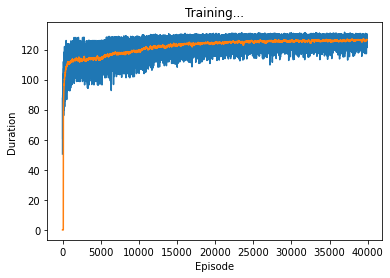

Current_train_num :  227845 Accuracy :  0.9983673111106235
F1 0.6243705941591138
310 296 77


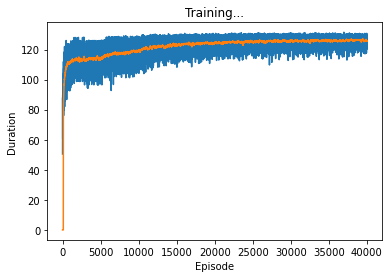

Current_train_num :  227845 Accuracy :  0.9985867585419913
F1 0.6407119021134594
288 224 99


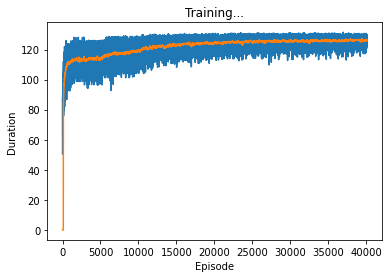

Current_train_num :  227845 Accuracy :  0.9974763545392701
F1 0.5247524752475248
318 507 69


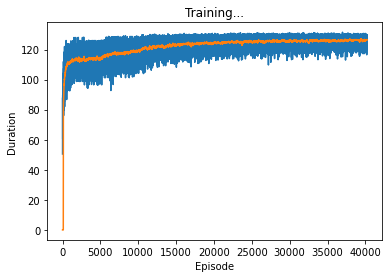

Current_train_num :  227845 Accuracy :  0.9968750685773223
F1 0.4706755753526355
317 643 70


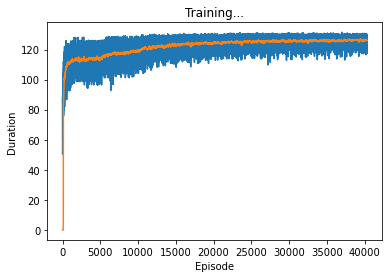

Current_train_num :  227845 Accuracy :  0.9986087032851281
F1 0.6276346604215457
268 199 119


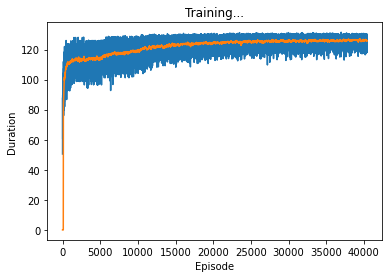

Current_train_num :  227845 Accuracy :  0.9977791919945577
F1 0.5420054200542005
300 420 87


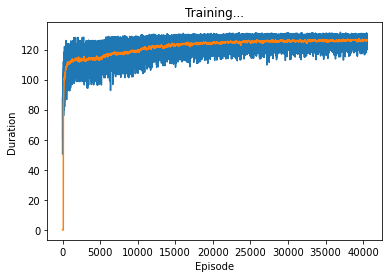

Current_train_num :  227845 Accuracy :  0.9984155895455243
F1 0.6313645621181263
310 285 77


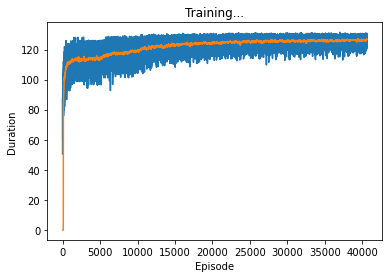

Current_train_num :  227845 Accuracy :  0.9985911474906186
F1 0.6477024070021882
296 231 91


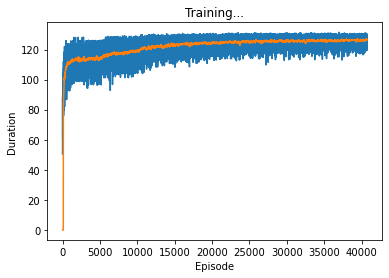

Current_train_num :  227845 Accuracy :  0.9985648137988545
F1 0.6495726495726496
304 245 83


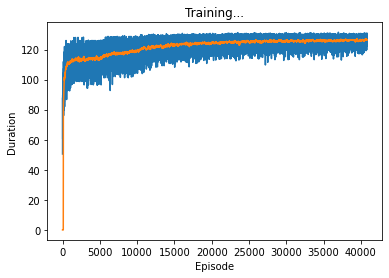

Current_train_num :  227845 Accuracy :  0.9973359081831947
F1 0.5096774193548387
316 537 71


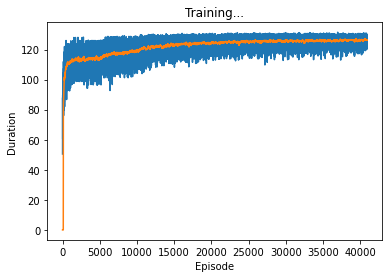

Current_train_num :  227845 Accuracy :  0.9983278105729773
F1 0.6109979633401222
300 295 87


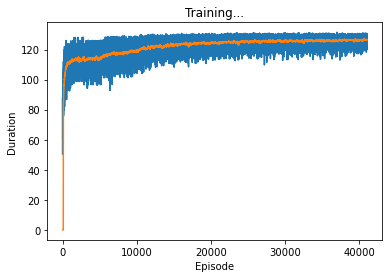

Current_train_num :  227845 Accuracy :  0.9983760890078781
F1 0.6107030430220357
291 275 96


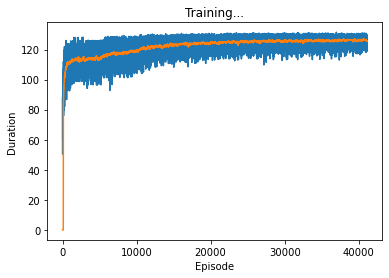

Current_train_num :  227845 Accuracy :  0.9978011367376944
F1 0.5517857142857143
309 424 78


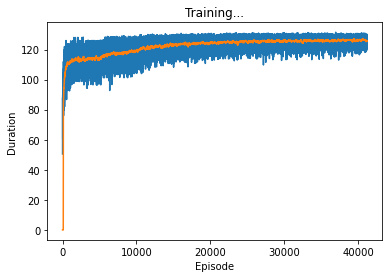

Current_train_num :  227845 Accuracy :  0.9961640588996906
F1 0.42091330244870945
318 806 69


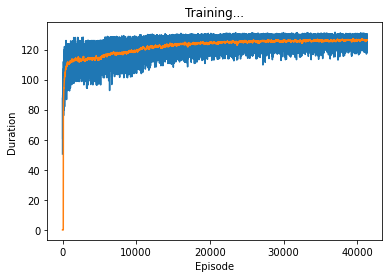

Current_train_num :  227845 Accuracy :  0.9982839210867037
F1 0.6141732283464567
312 317 75


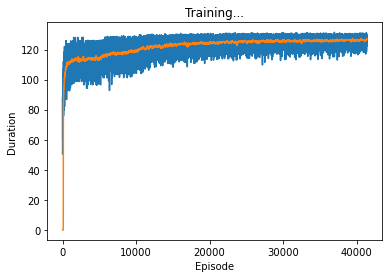

Current_train_num :  227845 Accuracy :  0.9986438148741469
F1 0.665948275862069
309 232 78


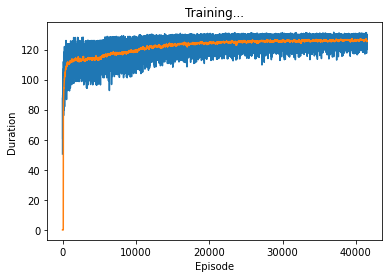

Current_train_num :  227845 Accuracy :  0.9983234216243498
F1 0.6095820591233435
299 295 88


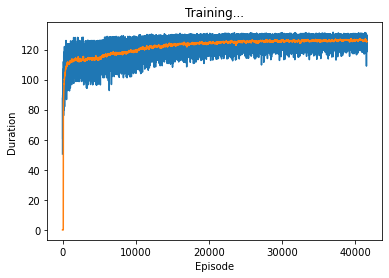

Current_train_num :  227845 Accuracy :  0.9976870240733832
F1 0.5234657039711191
290 431 97


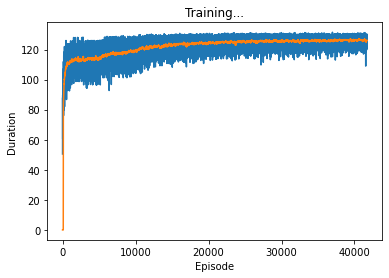

Current_train_num :  227845 Accuracy :  0.9968136232965393
F1 0.4673992673992674
319 659 68


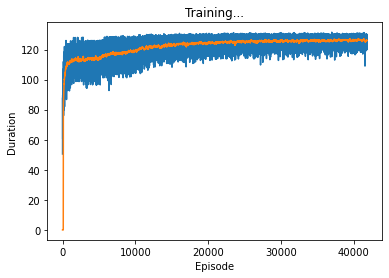

Current_train_num :  227845 Accuracy :  0.9980908073471
F1 0.564
282 331 105


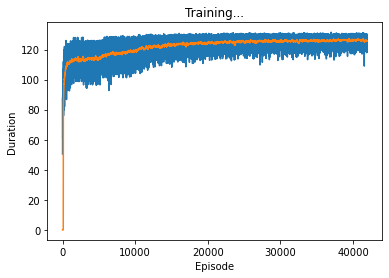

Current_train_num :  227845 Accuracy :  0.9957734424718558
F1 0.39900249376558605
320 897 67


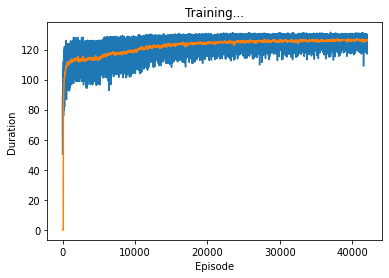

Current_train_num :  227845 Accuracy :  0.9977001909192653
F1 0.5470232959447799
317 455 70


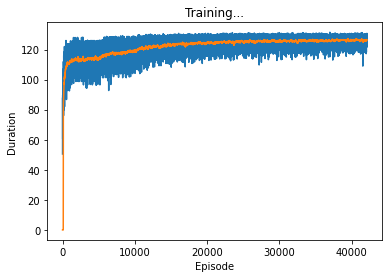

Current_train_num :  227845 Accuracy :  0.9951633786126534
F1 0.36718301778542745
320 1036 67


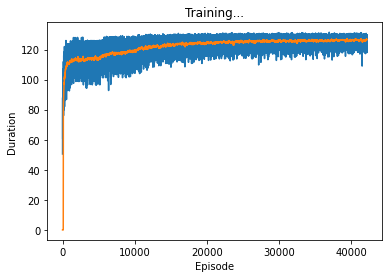

Current_train_num :  227845 Accuracy :  0.9977660251486756
F1 0.5557491289198606
319 442 68


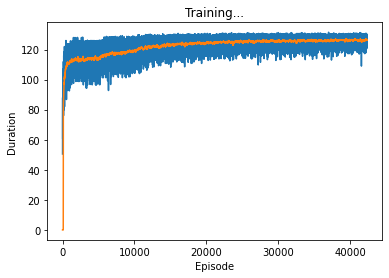

Current_train_num :  227845 Accuracy :  0.9971866839298646
F1 0.49607535321821034
316 571 71


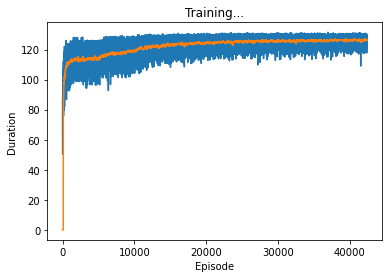

Current_train_num :  227845 Accuracy :  0.9973534639777042
F1 0.5105348460291734
315 532 72


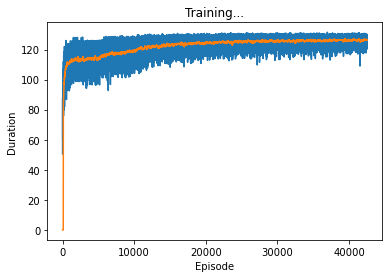

Current_train_num :  227845 Accuracy :  0.998213697908666
F1 0.603112840466926
310 331 77


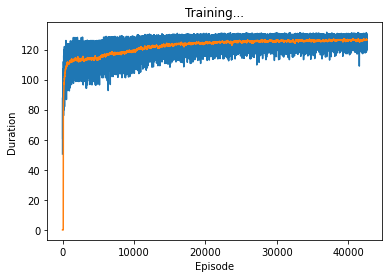

Current_train_num :  227845 Accuracy :  0.998275143189449
F1 0.6137254901960785
313 320 74


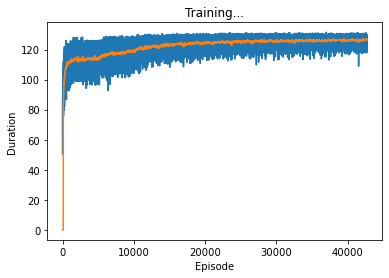

Current_train_num :  227845 Accuracy :  0.9959709451600869
F1 0.40976236351958895
319 851 68


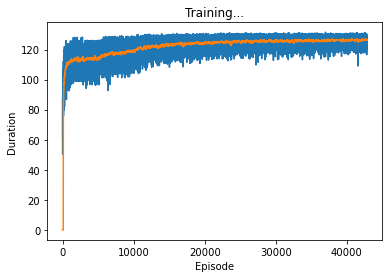

Current_train_num :  227845 Accuracy :  0.9983892558537603
F1 0.6267748478701826
309 290 78


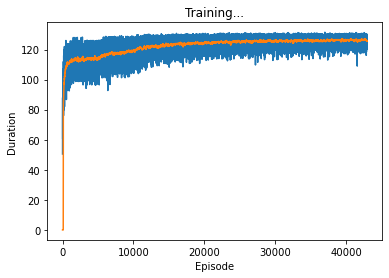

Current_train_num :  227845 Accuracy :  0.9984814237749348
F1 0.6381647549530761
306 266 81


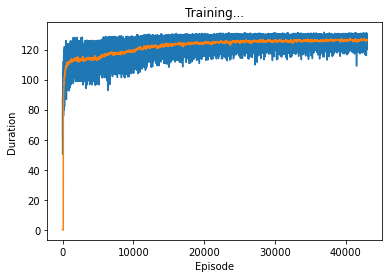

Current_train_num :  227845 Accuracy :  0.9978801378129869
F1 0.5686274509803921
319 416 68


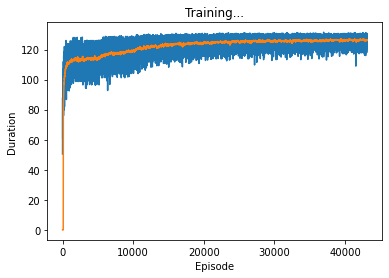

Current_train_num :  227845 Accuracy :  0.9974719655906428
F1 0.5047210300429185
294 484 93


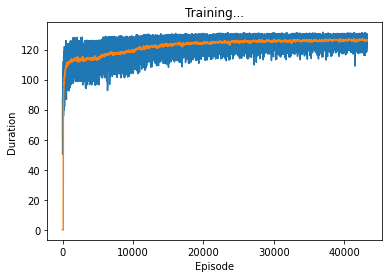

Current_train_num :  227845 Accuracy :  0.997388575566723
F1 0.5033333333333333
302 511 85


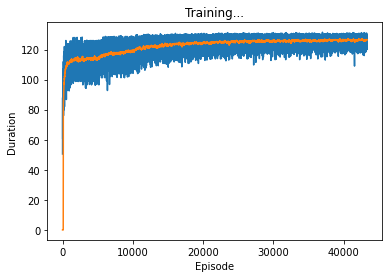

Current_train_num :  227845 Accuracy :  0.9967609559130111
F1 0.4656543745480839
322 674 65


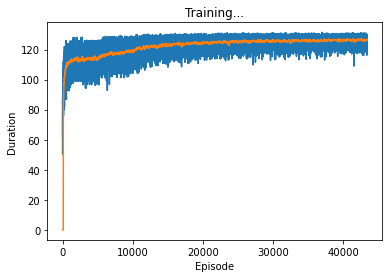

Current_train_num :  227845 Accuracy :  0.997006737036143
F1 0.48218347232752085
318 614 69


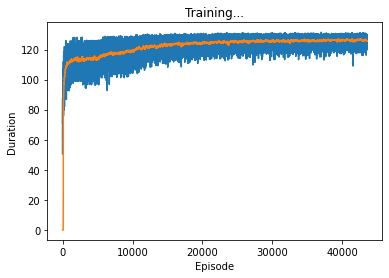

Current_train_num :  227845 Accuracy :  0.9977396914569115
F1 0.5334538878842676
295 424 92


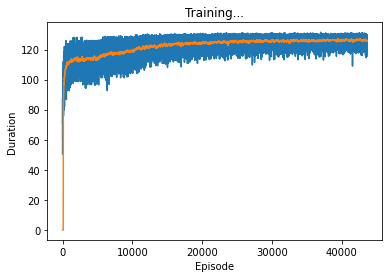

Current_train_num :  227845 Accuracy :  0.9978362483267134
F1 0.5557553956834532
309 416 78


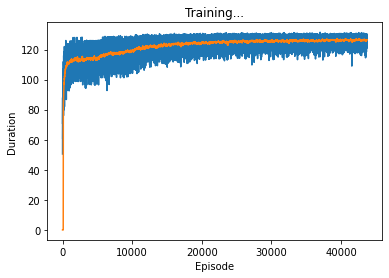

Current_train_num :  227845 Accuracy :  0.9981303078847462
F1 0.5983066792097836
318 358 69


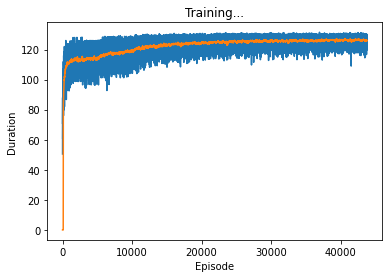

Current_train_num :  227845 Accuracy :  0.998200531062784
F1 0.6074498567335244
318 342 69


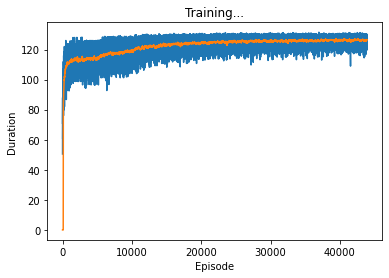

Current_train_num :  227845 Accuracy :  0.9983673111106235
F1 0.6288557213930348
316 302 71


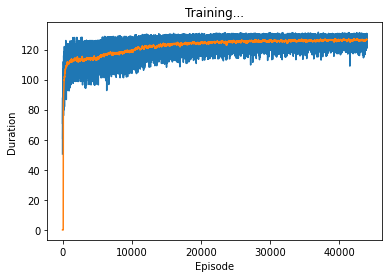

Current_train_num :  227845 Accuracy :  0.9986833154117931
F1 0.6745945945945946
312 226 75


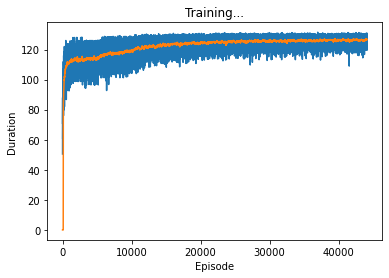

Current_train_num :  227845 Accuracy :  0.9978757488643596
F1 0.567350579839429
318 416 69


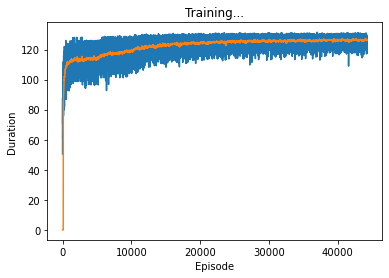

Current_train_num :  227845 Accuracy :  0.996379117382431
F1 0.43579234972677594
319 758 68


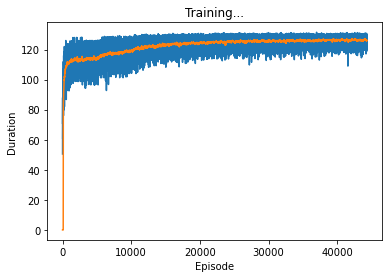

Current_train_num :  227845 Accuracy :  0.9980513068094538
F1 0.5883441258094357
318 376 69


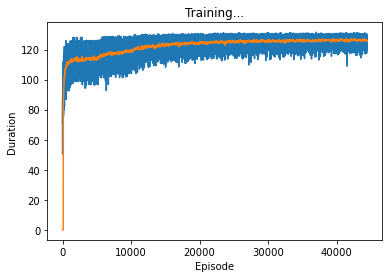

Current_train_num :  227845 Accuracy :  0.9978889157102416
F1 0.5469924812030075
291 386 96


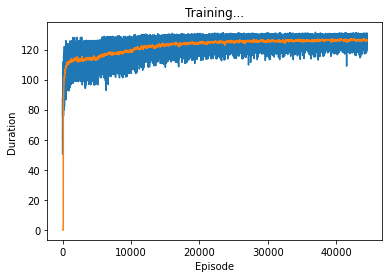

Current_train_num :  227845 Accuracy :  0.9966029537624262
F1 0.45152158527954706
319 707 68


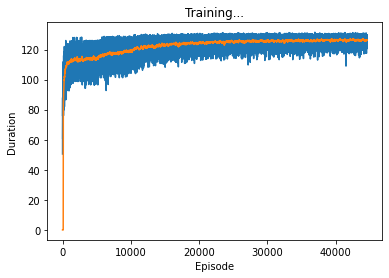

Current_train_num :  227845 Accuracy :  0.9978055256863219
F1 0.5570291777188329
315 429 72


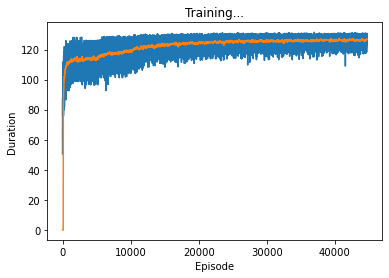

Current_train_num :  227845 Accuracy :  0.9976826351247559
F1 0.5467009425878321
319 461 68


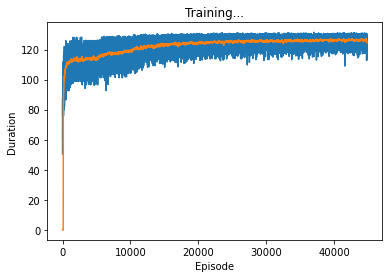

Current_train_num :  227845 Accuracy :  0.9975334108714258
F1 0.5150732127476314
299 475 88


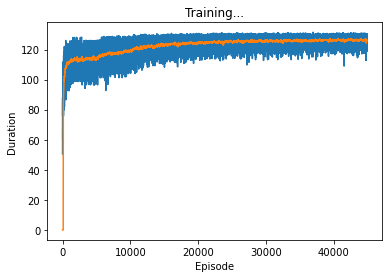

Current_train_num :  227845 Accuracy :  0.9968970133204591
F1 0.4739970282317979
319 640 68


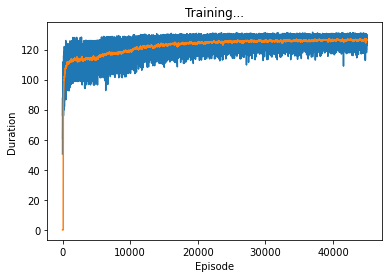

Current_train_num :  227845 Accuracy :  0.9786872654655577
F1 0.11803159615035409
325 4795 62


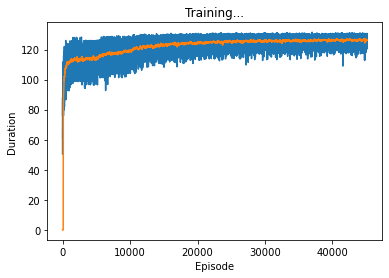

Current_train_num :  227845 Accuracy :  0.9776163620004827
F1 0.11333217451764296
326 5040 61


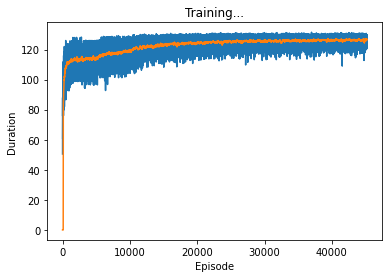

Current_train_num :  227845 Accuracy :  0.9983278105729773
F1 0.5918803418803419
277 272 110


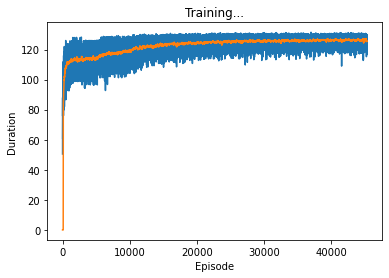

Current_train_num :  227845 Accuracy :  0.9972349623647655
F1 0.4988085782366958
314 558 73


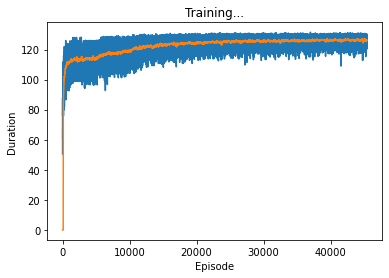

Current_train_num :  227845 Accuracy :  0.9978406372753407
F1 0.5546522131887985
307 413 80


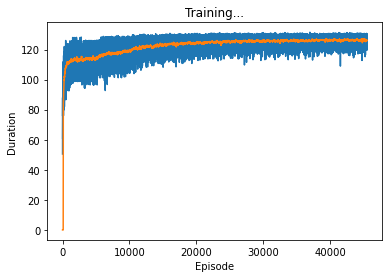

Current_train_num :  227845 Accuracy :  0.9984989795694441
F1 0.6362672322375398
300 256 87


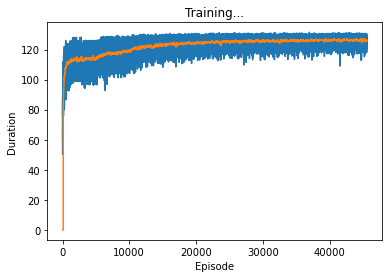

Current_train_num :  227845 Accuracy :  0.9984507011345433
F1 0.6350515463917525
308 275 79


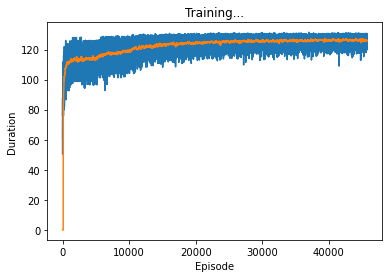

Current_train_num :  227845 Accuracy :  0.9977879698918124
F1 0.548704200178731
307 425 80


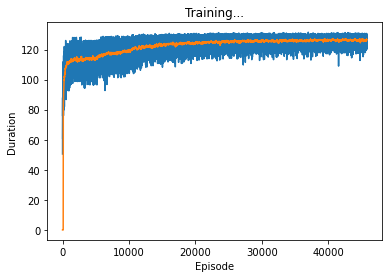

Current_train_num :  227845 Accuracy :  0.9978933046588689
F1 0.5542168674698795
299 393 88


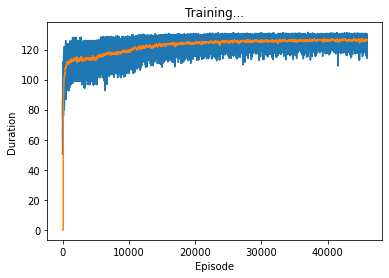

Current_train_num :  227845 Accuracy :  0.9789154907941803
F1 0.11980216156805276
327 4745 60


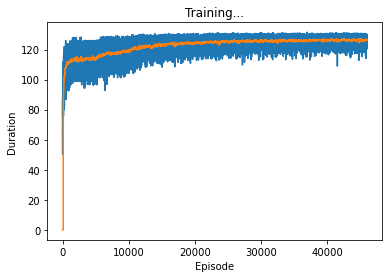

Current_train_num :  227845 Accuracy :  0.9827602097917444
F1 0.14232700283780833
326 3868 61


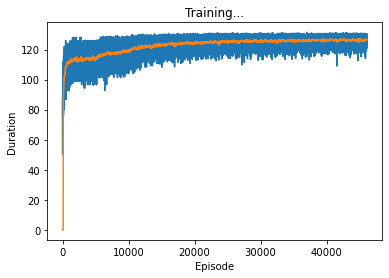

Current_train_num :  227845 Accuracy :  0.9967653448616384
F1 0.4636627906976744
319 670 68


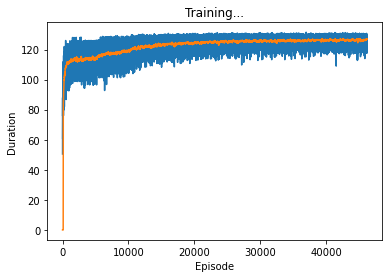

Current_train_num :  227845 Accuracy :  0.9757422809366016
F1 0.10550161812297734
326 5467 61


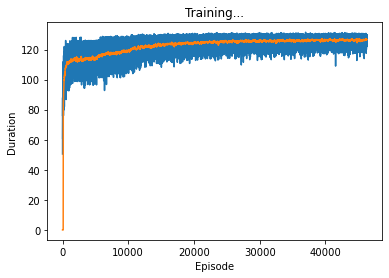

Current_train_num :  227845 Accuracy :  0.998288310035331
F1 0.6185365853658537
317 321 70


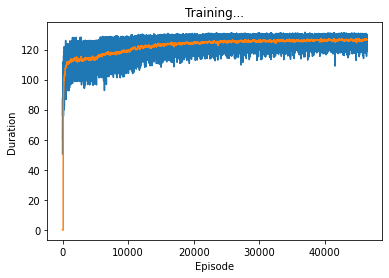

Current_train_num :  227845 Accuracy :  0.9987359827953214
F1 0.6778149386845039
304 206 83


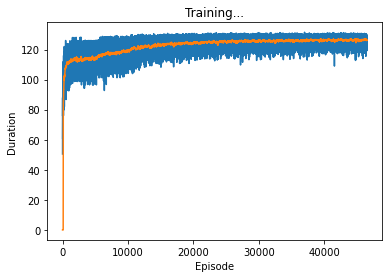

Current_train_num :  227845 Accuracy :  0.9985428690557177
F1 0.6295884315906563
283 229 104


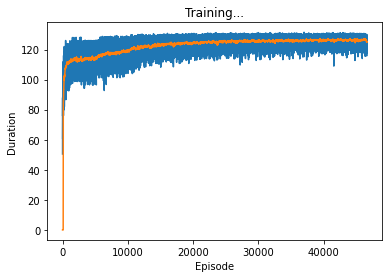

Current_train_num :  227845 Accuracy :  0.9979723057341614
F1 0.5771689497716895
316 392 71


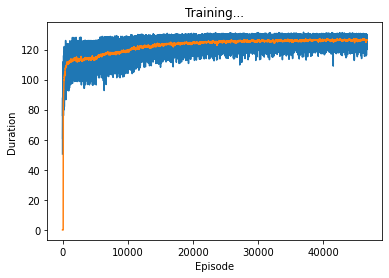

Current_train_num :  227845 Accuracy :  0.998349755316114
F1 0.6093264248704663
294 284 93


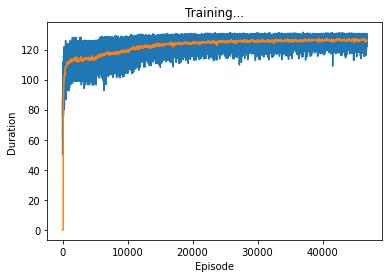

Current_train_num :  227845 Accuracy :  0.9975816893063266
F1 0.5314091680814941
313 478 74


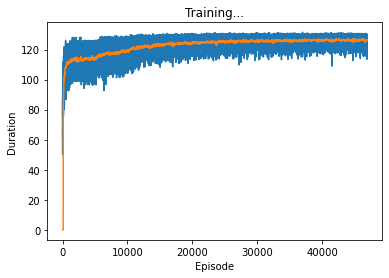

Current_train_num :  227845 Accuracy :  0.9974807434878975
F1 0.5180217937971501
309 497 78


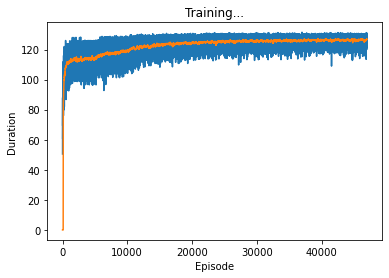

Current_train_num :  227845 Accuracy :  0.9983760890078781
F1 0.6278836509528586
313 297 74


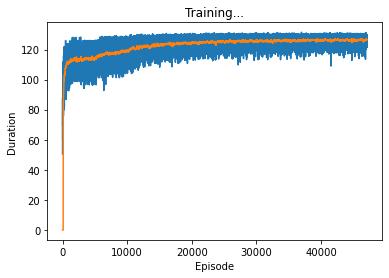

Current_train_num :  227845 Accuracy :  0.9955847176808795
F1 0.3878419452887538
319 939 68


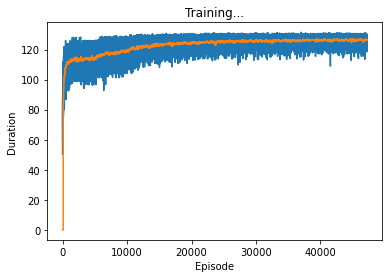

Current_train_num :  227845 Accuracy :  0.9947464284930545
F1 0.3482045701849837
320 1131 67


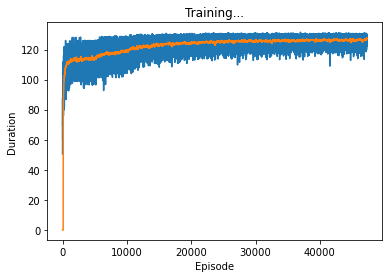

Current_train_num :  227845 Accuracy :  0.9976036340494635
F1 0.5383966244725739
319 479 68


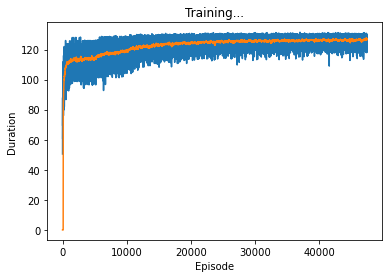

Current_train_num :  227845 Accuracy :  0.9982488094976848
F1 0.5926680244399185
291 304 96


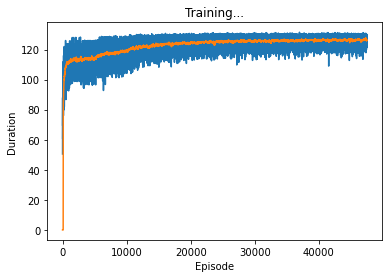

Current_train_num :  227845 Accuracy :  0.9979459720423972
F1 0.5537583254043768
291 373 96


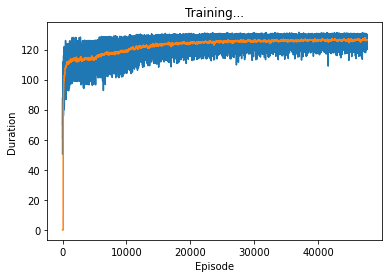

Current_train_num :  227845 Accuracy :  0.9977045798678926
F1 0.5427574171029669
311 448 76


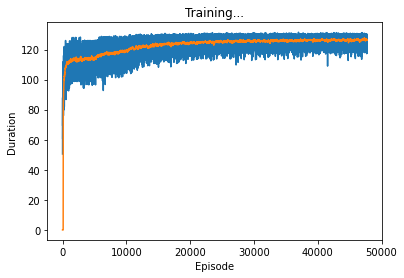

Current_train_num :  227845 Accuracy :  0.9978362483267134
F1 0.5425925925925926
293 400 94


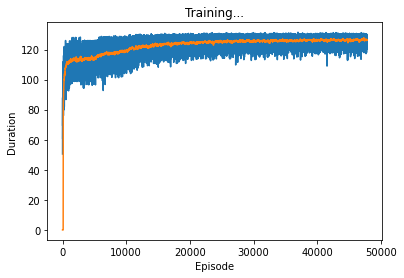

Current_train_num :  227845 Accuracy :  0.9944348131405122
F1 0.3373368146214099
323 1205 64


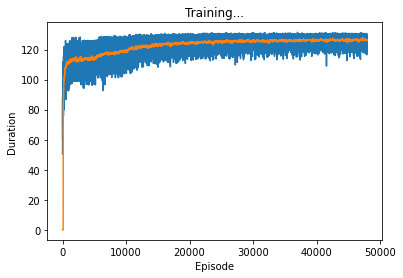

Current_train_num :  227845 Accuracy :  0.9982839210867037
F1 0.6149312377210217
313 318 74


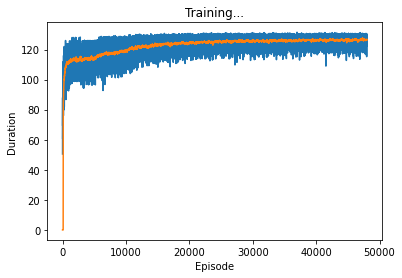

Current_train_num :  227845 Accuracy :  0.9864249818955869
F1 0.1736111111111111
325 3032 62


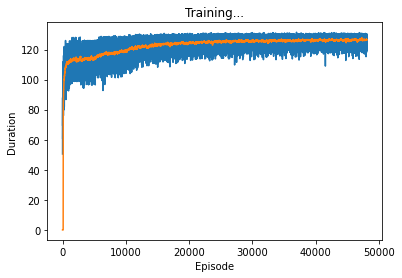

Current_train_num :  227845 Accuracy :  0.9978889157102416
F1 0.5665467625899281
315 410 72


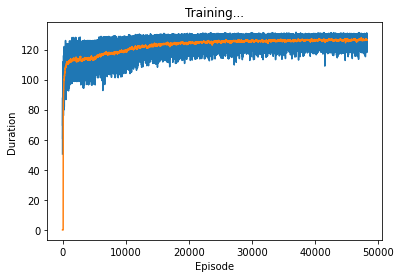

Current_train_num :  227845 Accuracy :  0.9971822949812372
F1 0.4948939512961508
315 571 72


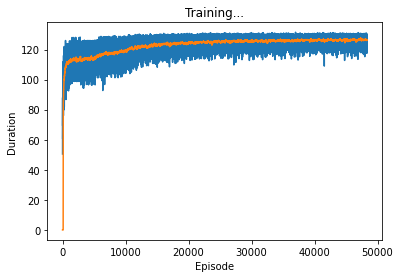

Current_train_num :  227845 Accuracy :  0.9976694682788738
F1 0.5381944444444444
310 455 77


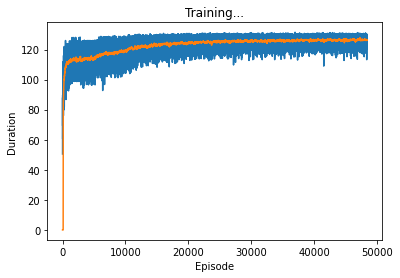

Current_train_num :  227845 Accuracy :  0.9975377998200531
F1 0.5285234899328859
315 490 72


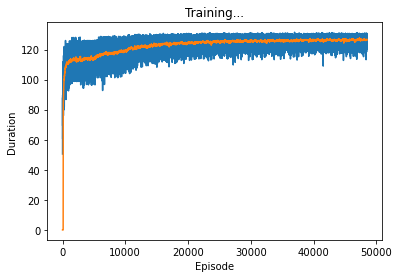

Current_train_num :  227845 Accuracy :  0.9983892558537603
F1 0.632
316 297 71


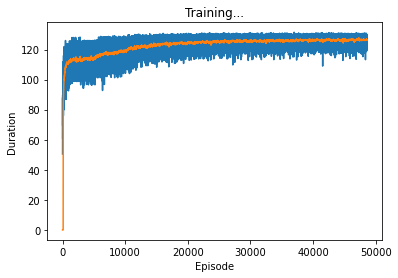

Current_train_num :  227845 Accuracy :  0.9978976936074964
F1 0.5706618962432916
319 412 68


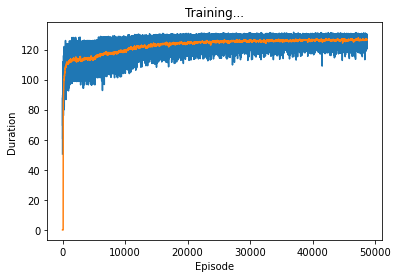

Current_train_num :  227845 Accuracy :  0.9981215299874915
F1 0.5979381443298969
319 361 68


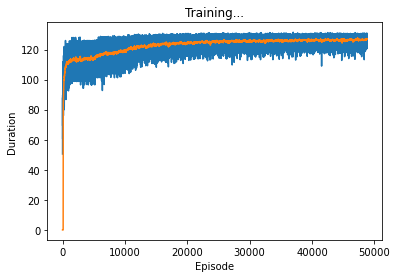

Current_train_num :  227845 Accuracy :  0.9984814237749348
F1 0.6426364572605562
312 272 75


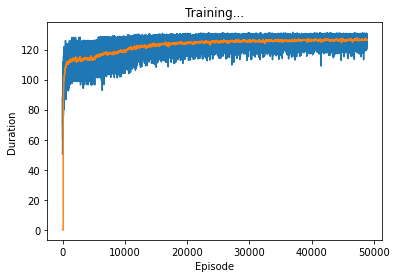

Current_train_num :  227845 Accuracy :  0.9983409774188593
F1 0.6047966631908238
290 282 97


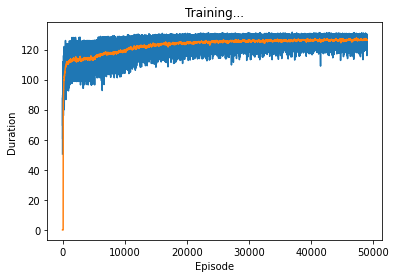

Current_train_num :  227845 Accuracy :  0.9970989049573175
F1 0.4907692307692308
319 594 68


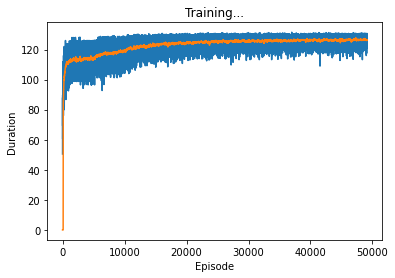

Current_train_num :  227845 Accuracy :  0.9978099146349492
F1 0.5606326889279437
319 432 68


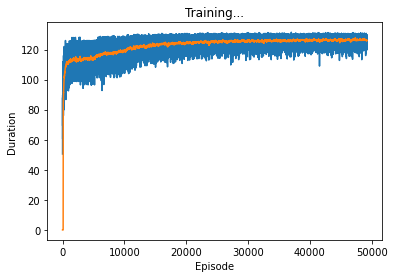

Current_train_num :  227845 Accuracy :  0.9977309135596568
F1 0.5456140350877193
311 442 76


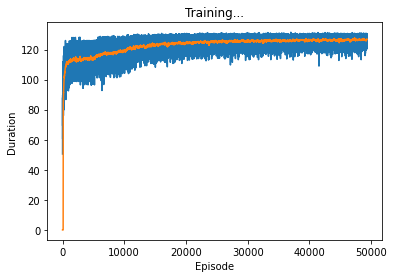

Current_train_num :  227845 Accuracy :  0.9982707542408216
F1 0.6146341463414634
315 323 72


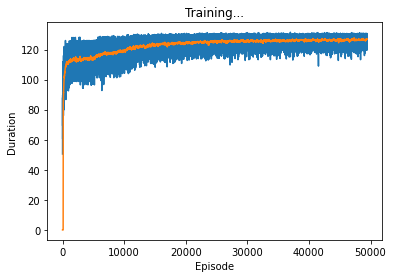

Current_train_num :  227845 Accuracy :  0.9981698084223924
F1 0.5996168582375478
313 344 74


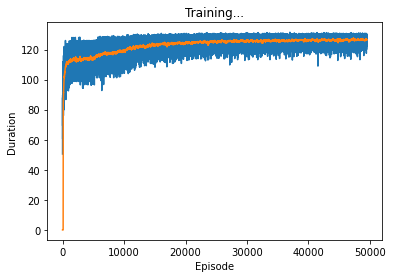

Current_train_num :  227845 Accuracy :  0.9773881366718603
F1 0.11231696813092162
326 5092 61


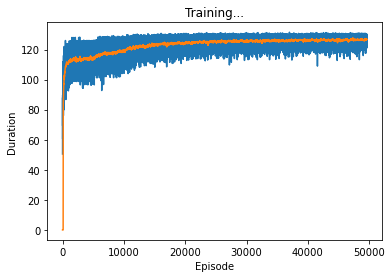

Current_train_num :  227845 Accuracy :  0.9971120718031995
F1 0.4919043947571318
319 591 68


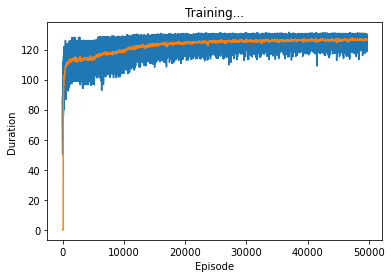

Current_train_num :  227845 Accuracy :  0.9987754833329676
F1 0.6902654867256637
312 205 75


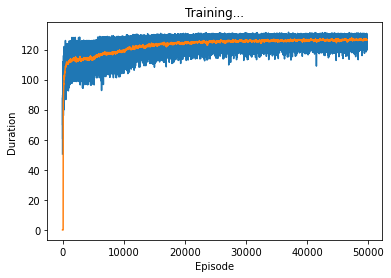

Current_train_num :  227845 Accuracy :  0.9886940683359301
F1 0.20043437790878063
323 2513 64


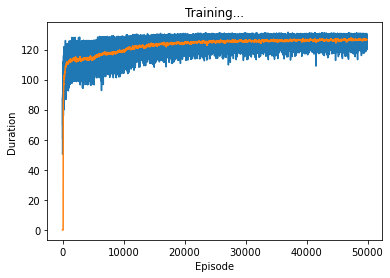

Current_train_num :  227845 Accuracy :  0.9680791766332375
F1 0.08295511850731216
329 7216 58


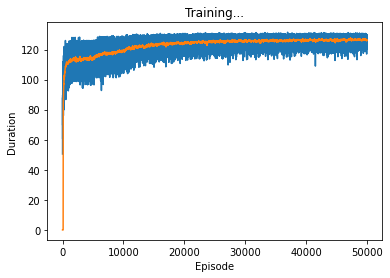

Current_train_num :  227845 Accuracy :  0.998152252627883
F1 0.5957854406130269
311 346 76


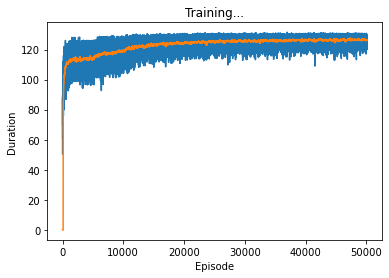

Current_train_num :  227845 Accuracy :  0.9984024226996423
F1 0.6294416243654822
310 288 77


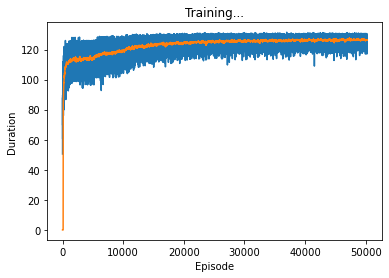

Current_train_num :  227845 Accuracy :  0.9986789264631657
F1 0.651270207852194
282 197 105


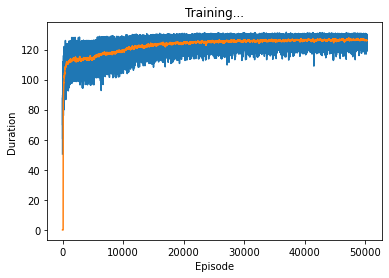

Current_train_num :  227845 Accuracy :  0.9845289560885689
F1 0.1556513409961686
325 3464 62


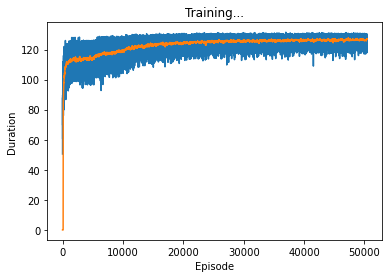

Current_train_num :  227845 Accuracy :  0.9804999012486559
F1 0.12794348508634223
326 4383 61


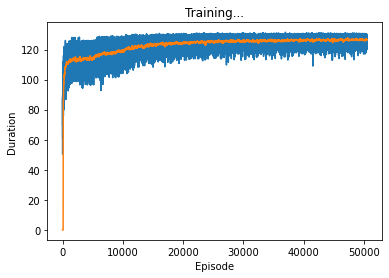

Current_train_num :  227845 Accuracy :  0.998793039127477
F1 0.6926503340757239
311 200 76


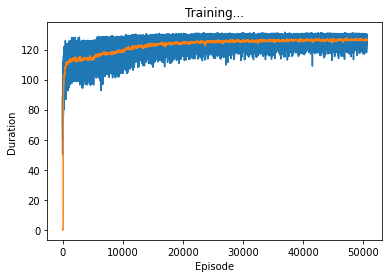

Current_train_num :  227845 Accuracy :  0.9958831661875398
F1 0.4053198226725776
320 872 67


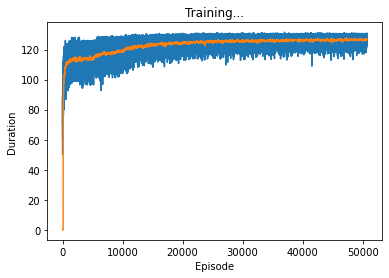

Current_train_num :  227845 Accuracy :  0.9983146437270952
F1 0.6206896551724138
315 313 72


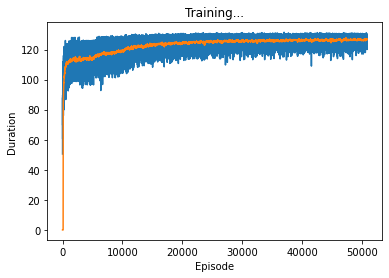

Current_train_num :  227845 Accuracy :  0.9938861945620926
F1 0.31666666666666665
323 1330 64


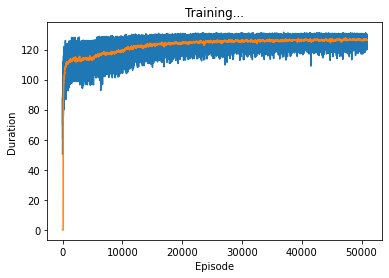

Current_train_num :  227845 Accuracy :  0.9979591388882794
F1 0.5778985507246377
319 398 68


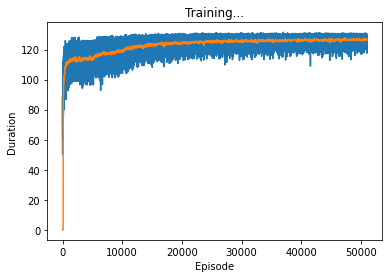

Current_train_num :  227845 Accuracy :  0.9984375342886611
F1 0.6368260427263479
313 283 74


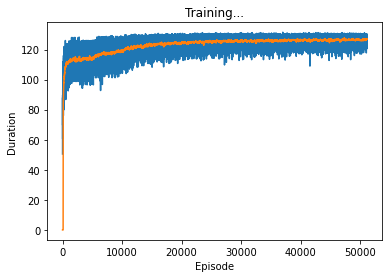

Current_train_num :  227845 Accuracy :  0.9988149838706138
F1 0.6985539488320356
314 198 73


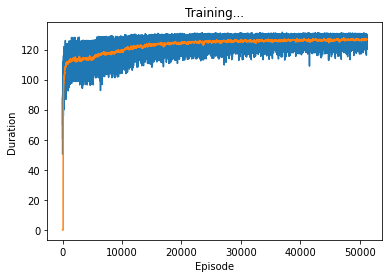

Current_train_num :  227845 Accuracy :  0.9978362483267134
F1 0.5636042402826855
319 426 68


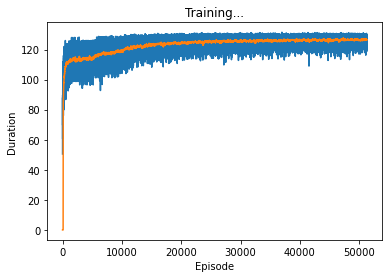

Current_train_num :  227845 Accuracy :  0.9839935043560315
F1 0.15083798882681565
324 3585 63


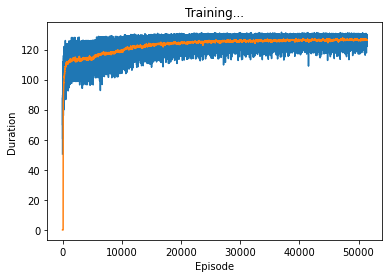

Current_train_num :  227845 Accuracy :  0.9984989795694441
F1 0.6452947259565667
312 268 75


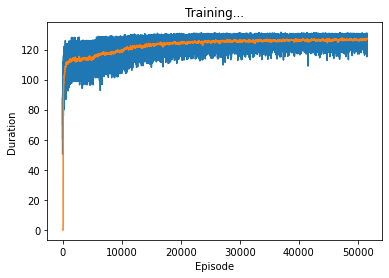

Current_train_num :  227845 Accuracy :  0.9985911474906186
F1 0.6469298245614035
295 230 92


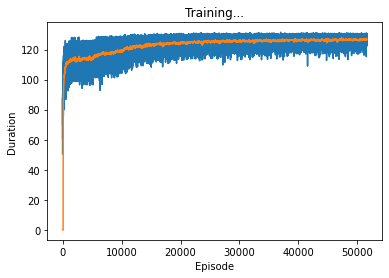

Current_train_num :  227845 Accuracy :  0.9646338519607628
F1 0.0754846850980842
329 8001 58


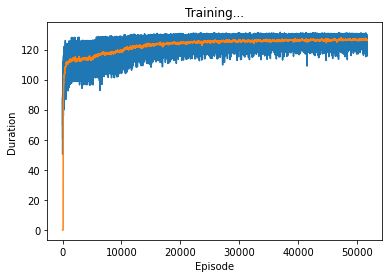

Current_train_num :  227845 Accuracy :  0.9977177467137747
F1 0.5224564619615032
285 419 102


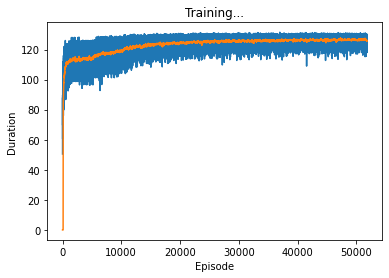

Current_train_num :  227845 Accuracy :  0.9974544097961333
F1 0.5038428693424424
295 489 92


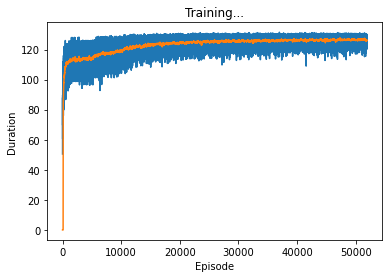

Current_train_num :  227845 Accuracy :  0.9968004564506573
F1 0.46402349486049926
316 659 71


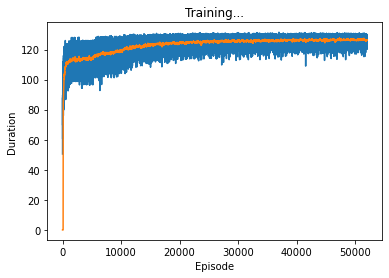

Current_train_num :  227845 Accuracy :  0.9983234216243498
F1 0.6150753768844222
306 302 81


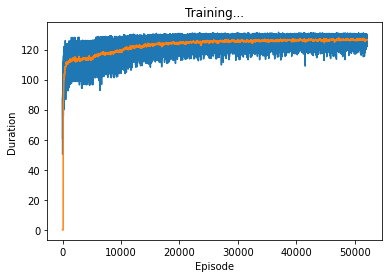

Current_train_num :  227845 Accuracy :  0.9982795321380763
F1 0.6165853658536585
316 322 71


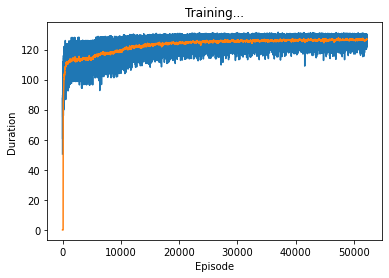

Current_train_num :  227845 Accuracy :  0.9962079483859642
F1 0.4244843646041251
319 797 68


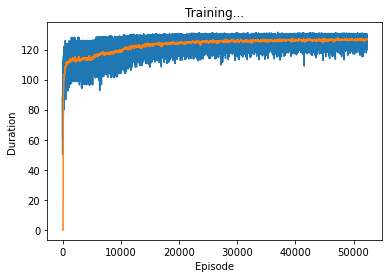

Current_train_num :  227845 Accuracy :  0.9979503609910246
F1 0.5753176043557169
317 398 70


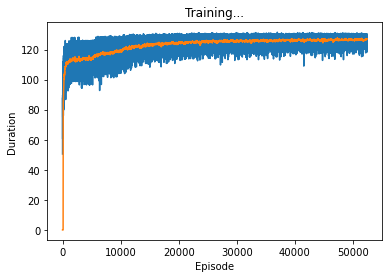

Current_train_num :  227845 Accuracy :  0.9967960675020299
F1 0.4660336011687363
319 663 68


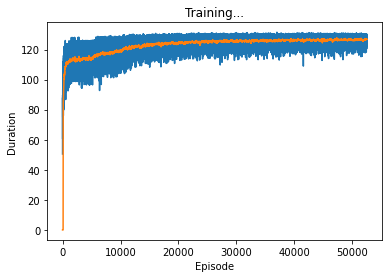

Current_train_num :  227845 Accuracy :  0.9976519124843644
F1 0.5403087478559176
315 464 72


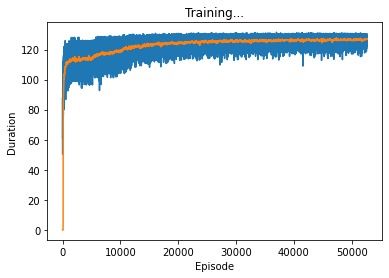

Current_train_num :  227845 Accuracy :  0.9722398999319712
F1 0.09395588656545402
328 6267 59


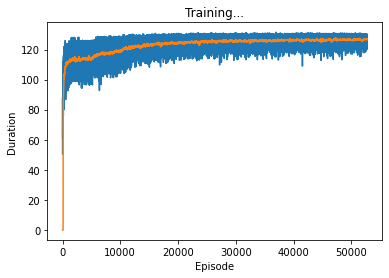

Current_train_num :  227845 Accuracy :  0.997265685005157
F1 0.5055467511885895
319 556 68


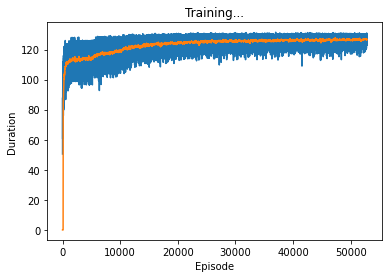

Current_train_num :  227845 Accuracy :  0.9983146437270952
F1 0.6010362694300518
290 288 97


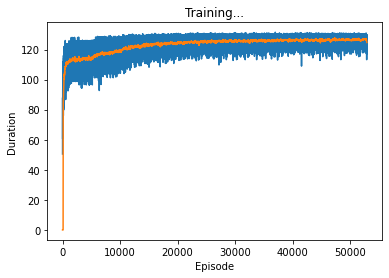

Current_train_num :  227845 Accuracy :  0.9972612960565297
F1 0.4769874476987448
285 523 102


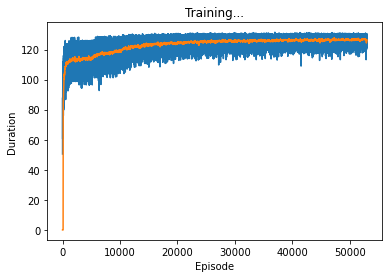

Current_train_num :  227845 Accuracy :  0.9886633456955386
F1 0.20148331273176762
326 2523 61


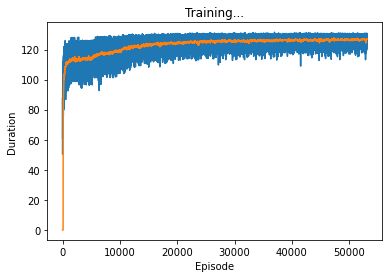

Current_train_num :  227845 Accuracy :  0.9971647391867278
F1 0.4964980544747082
319 579 68


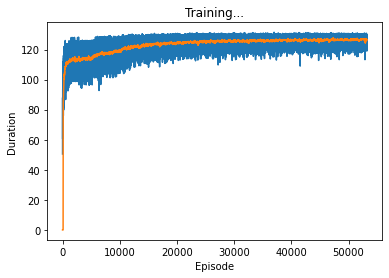

Current_train_num :  227845 Accuracy :  0.9977440804055389
F1 0.5533391153512576
319 447 68


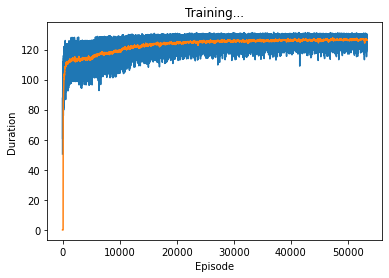

Current_train_num :  227845 Accuracy :  0.9975553556145625
F1 0.5334448160535117
319 490 68


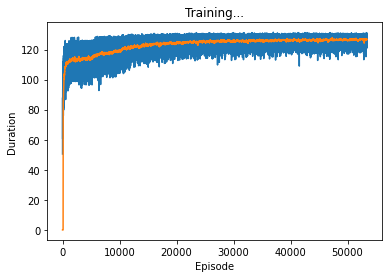

Current_train_num :  227845 Accuracy :  0.9987140380521846
F1 0.6666666666666666
294 201 93


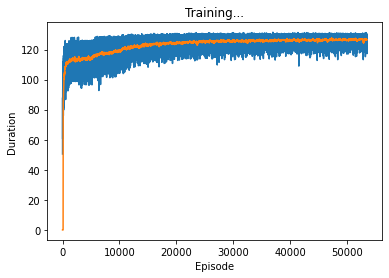

Current_train_num :  227845 Accuracy :  0.998411200596897
F1 0.6238341968911917
301 277 86


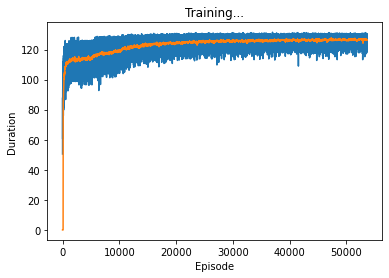

Current_train_num :  227845 Accuracy :  0.9983409774188593
F1 0.6228855721393035
313 305 74


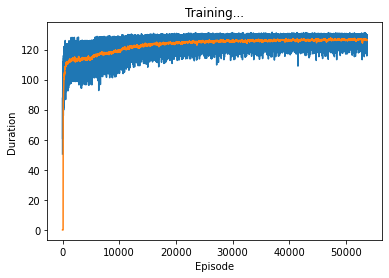

Current_train_num :  227845 Accuracy :  0.9985516469529724
F1 0.6421621621621622
297 241 90


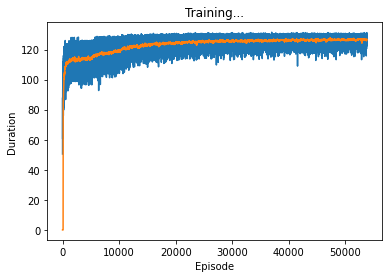

Current_train_num :  227845 Accuracy :  0.9973359081831947
F1 0.5120385232744783
319 540 68


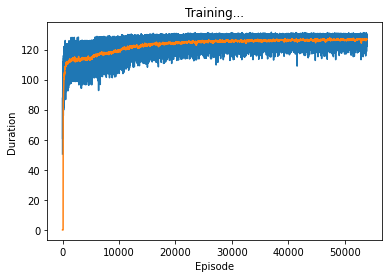

Current_train_num :  227845 Accuracy :  0.9985735916961092
F1 0.6539278131634819
308 247 79


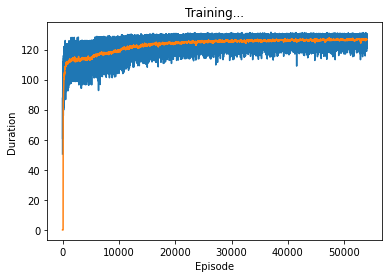

Current_train_num :  227845 Accuracy :  0.9975158550769163
F1 0.5294605809128631
319 499 68


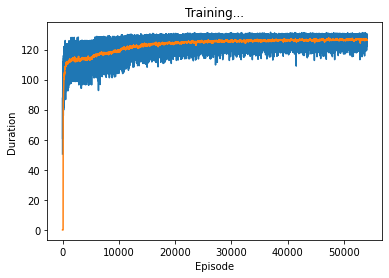

Current_train_num :  227845 Accuracy :  0.9984331453400338
F1 0.6405622489959839
319 290 68


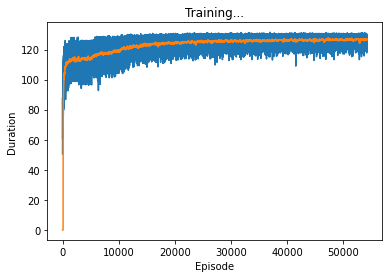

Current_train_num :  227845 Accuracy :  0.9986482038227743
F1 0.6484641638225256
285 207 102


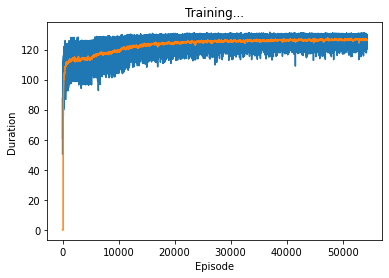

Current_train_num :  227845 Accuracy :  0.9985955364392459
F1 0.6507072905331882
299 233 88


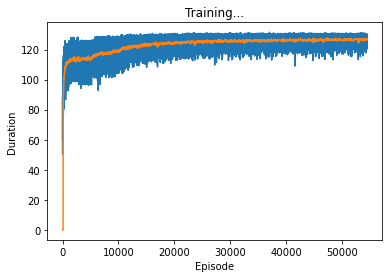

Current_train_num :  227845 Accuracy :  0.9986394259255196
F1 0.6593647316538883
301 225 86


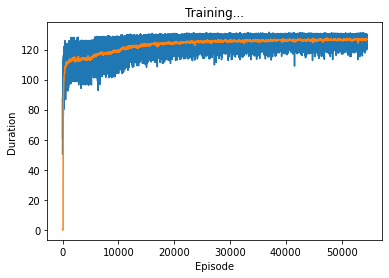

Current_train_num :  227845 Accuracy :  0.9961684478483179
F1 0.4227212681638045
320 807 67


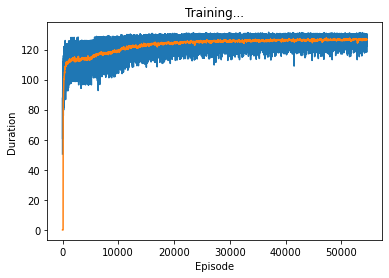

Current_train_num :  227845 Accuracy :  0.9985297022098356
F1 0.6477987421383647
309 258 78


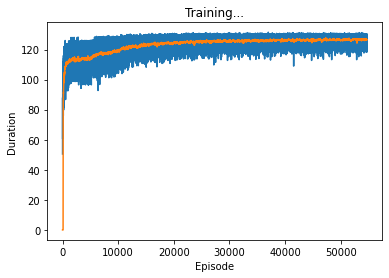

Current_train_num :  227845 Accuracy :  0.9987228159494393
F1 0.6612529002320185
285 190 102


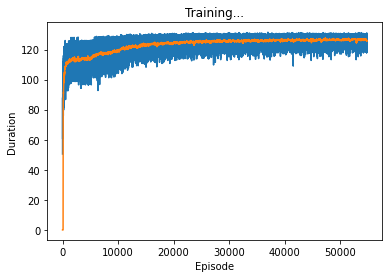

Current_train_num :  227845 Accuracy :  0.9956110513726437
F1 0.3907486305538649
321 935 66


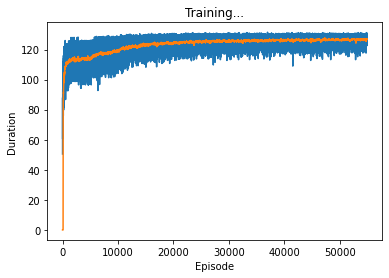

Current_train_num :  227845 Accuracy :  0.998152252627883
F1 0.6018867924528302
319 354 68


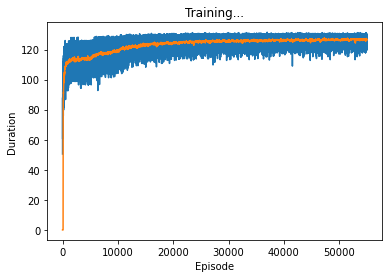

Current_train_num :  227845 Accuracy :  0.997647523535737
F1 0.5429787234042553
319 469 68


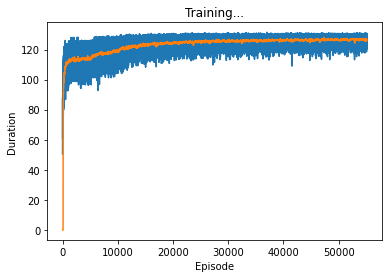

Current_train_num :  227845 Accuracy :  0.9981829752682745
F1 0.6013448607108549
313 341 74


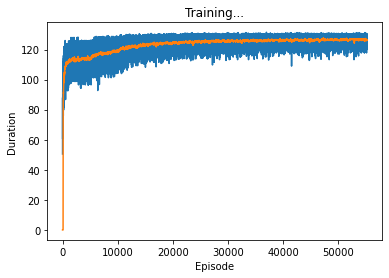

Current_train_num :  227845 Accuracy :  0.9985472580043451
F1 0.6534446764091858
313 258 74


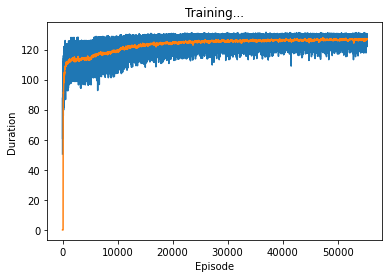

Current_train_num :  227845 Accuracy :  0.9985384801070903
F1 0.6469344608879493
306 253 81


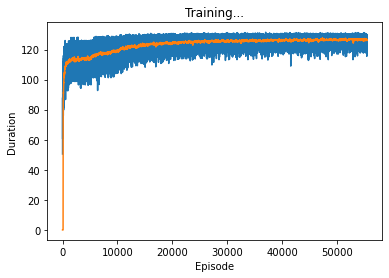

Current_train_num :  227845 Accuracy :  0.9986920933090478
F1 0.6696132596685083
303 215 84


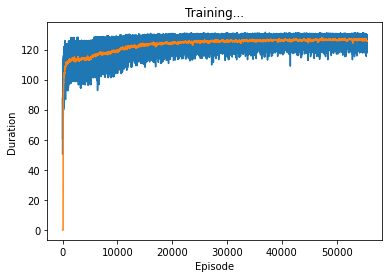

Current_train_num :  227845 Accuracy :  0.9979854725800434
F1 0.5652173913043478
299 372 88


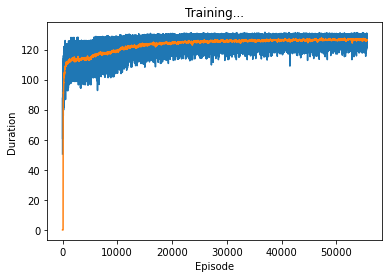

Current_train_num :  227845 Accuracy :  0.9982795321380763
F1 0.6158357771260997
315 321 72


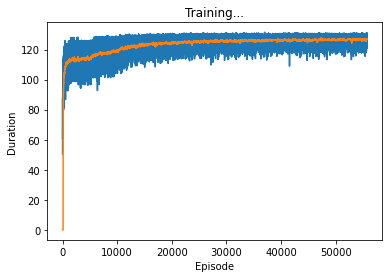

Current_train_num :  227845 Accuracy :  0.997511466128289
F1 0.5298013245033113
320 501 67


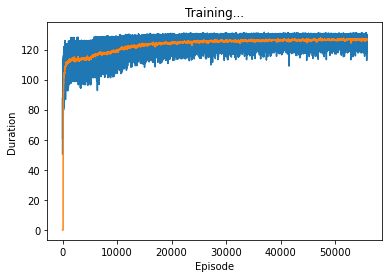

Current_train_num :  227845 Accuracy :  0.9986482038227743
F1 0.6452353616532721
281 203 106


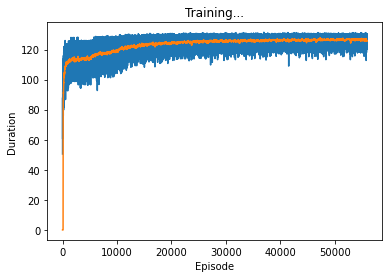

Current_train_num :  227845 Accuracy :  0.998411200596897
F1 0.62148070907195
298 274 89


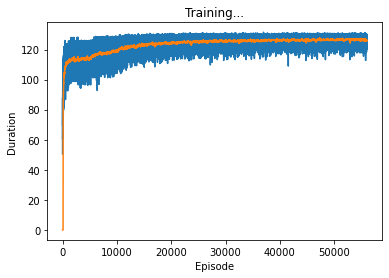

Current_train_num :  227845 Accuracy :  0.9983190326757225
F1 0.6205533596837944
314 311 73


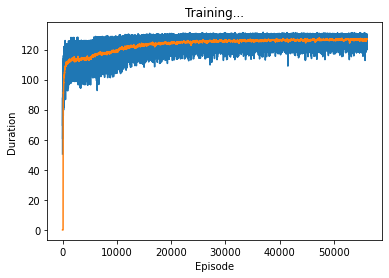

Current_train_num :  227845 Accuracy :  0.9986789264631657
F1 0.6752688172043011
314 229 73


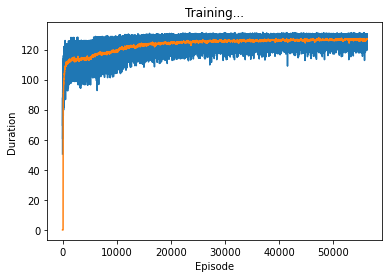

Current_train_num :  227845 Accuracy :  0.9983848669051328
F1 0.624618514750763
307 289 80


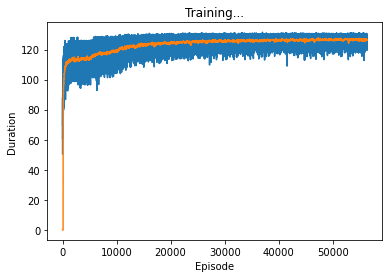

Current_train_num :  227845 Accuracy :  0.9963615615879217
F1 0.43537414965986393
320 763 67


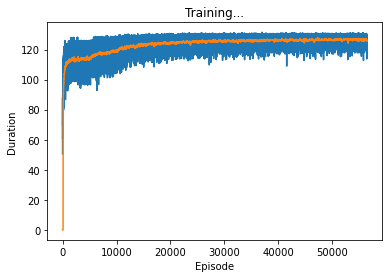

Current_train_num :  227845 Accuracy :  0.9985999253878733
F1 0.6388261851015802
283 216 104


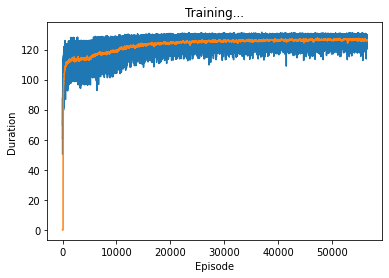

Current_train_num :  227845 Accuracy :  0.9983848669051328
F1 0.6230847803881512
305 287 82


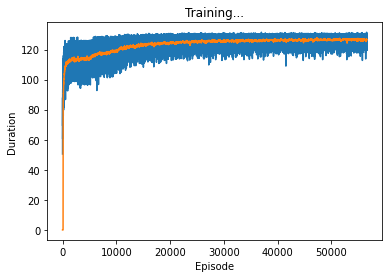

Current_train_num :  227845 Accuracy :  0.9983278105729773
F1 0.6117886178861789
301 296 86


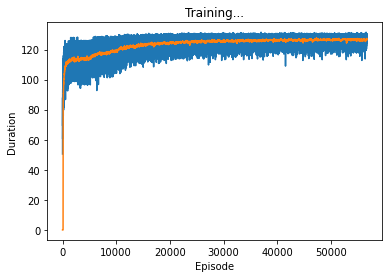

Current_train_num :  227845 Accuracy :  0.9976255787926003
F1 0.5406779661016949
319 474 68


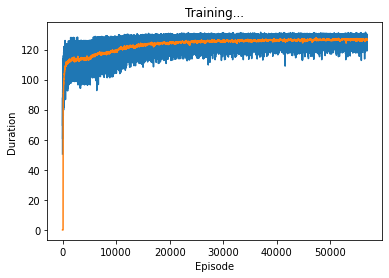

Current_train_num :  227845 Accuracy :  0.9984682569290526
F1 0.6399176954732511
311 274 76


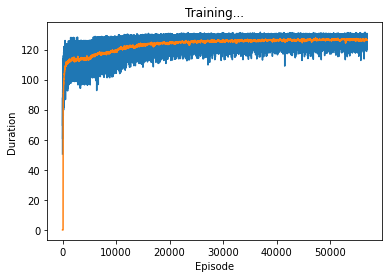

Current_train_num :  227845 Accuracy :  0.9970550154710439
F1 0.4870229007633588
319 604 68


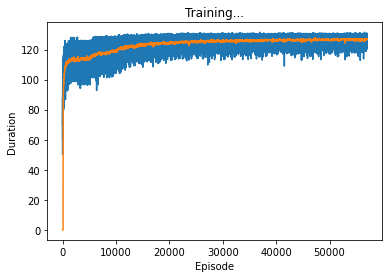

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7220779220779221
278 105 109


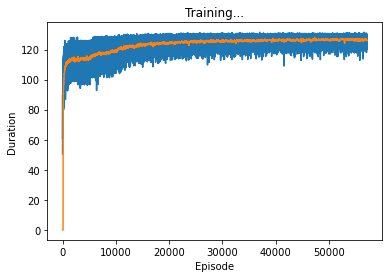

Current_train_num :  227845 Accuracy :  0.9987052601549299
F1 0.6747252747252748
307 216 80


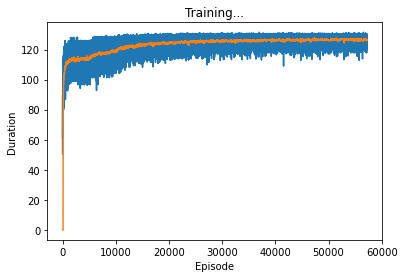

Current_train_num :  227845 Accuracy :  0.9976431345871096
F1 0.5425170068027211
319 470 68


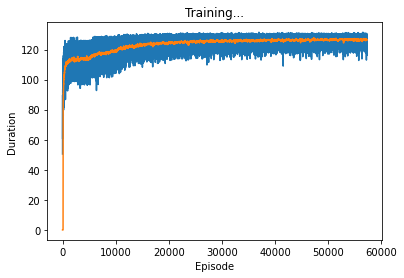

Current_train_num :  227845 Accuracy :  0.9988808181000242
F1 0.6878048780487804
282 151 105


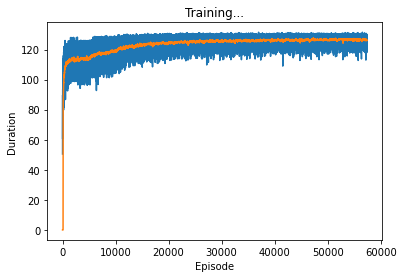

Current_train_num :  227845 Accuracy :  0.9986701485659111
F1 0.6561085972850679
290 207 97


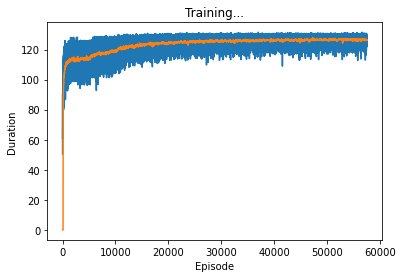

Current_train_num :  227845 Accuracy :  0.9980513068094538
F1 0.5845004668534081
313 371 74


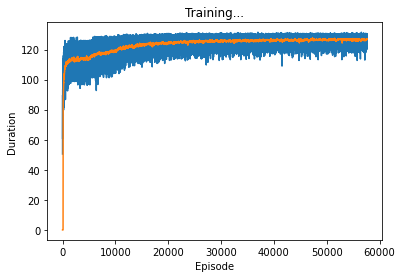

Current_train_num :  227845 Accuracy :  0.9978713599157322
F1 0.5676156583629893
319 418 68


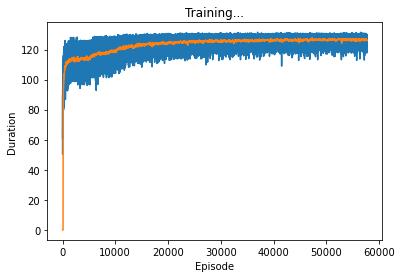

Current_train_num :  227845 Accuracy :  0.9980513068094538
F1 0.5666991236611489
291 349 96


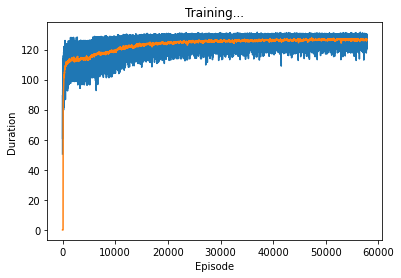

Current_train_num :  227845 Accuracy :  0.9982356426518028
F1 0.608357628765792
313 329 74


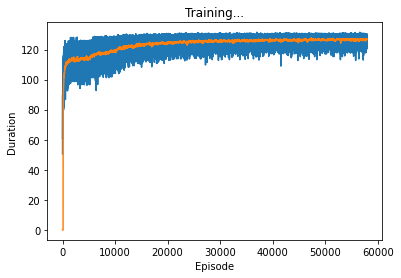

Current_train_num :  227845 Accuracy :  0.9985472580043451
F1 0.6534446764091858
313 258 74


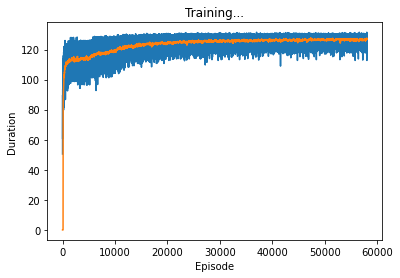

Current_train_num :  227845 Accuracy :  0.9985692027474818
F1 0.6245694603903559
272 212 115


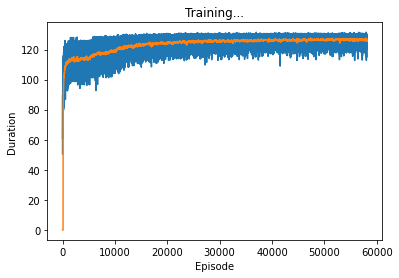

Current_train_num :  227845 Accuracy :  0.997252518159275
F1 0.5019857029388404
316 556 71


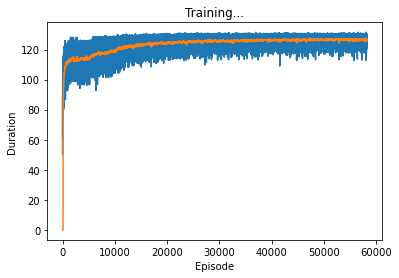

Current_train_num :  227845 Accuracy :  0.997450020847506
F1 0.5229508196721312
319 514 68


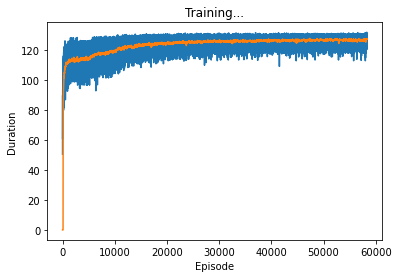

Current_train_num :  227845 Accuracy :  0.9982970879325858
F1 0.6090452261306533
303 305 84


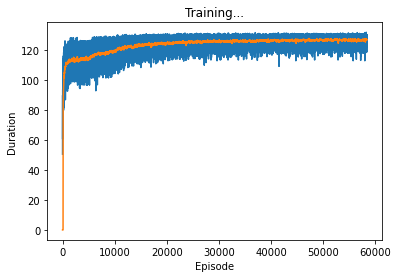

Current_train_num :  227845 Accuracy :  0.9977133577651474
F1 0.546875
315 450 72


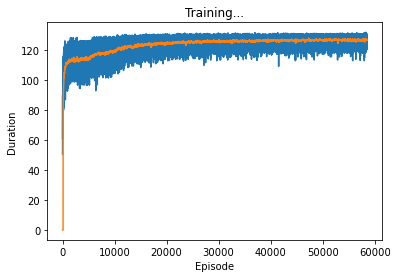

Current_train_num :  227845 Accuracy :  0.9979986394259255
F1 0.5788018433179724
314 384 73


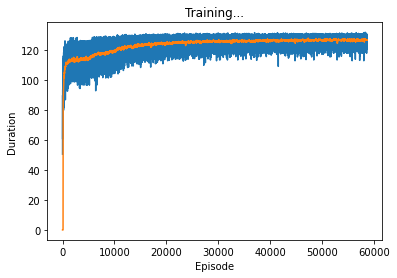

Current_train_num :  227845 Accuracy :  0.989949307643354
F1 0.21995233231188288
323 2227 64


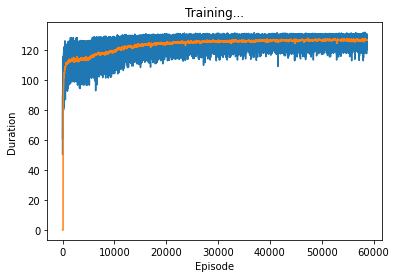

Current_train_num :  227845 Accuracy :  0.9978450262239681
F1 0.5646017699115045
319 424 68


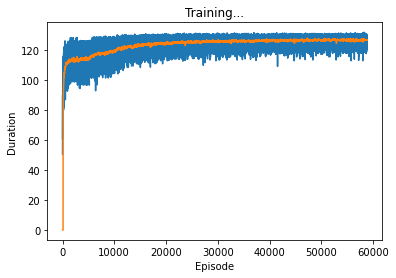

Current_train_num :  227845 Accuracy :  0.9985253132612083
F1 0.6536485097636177
318 268 69


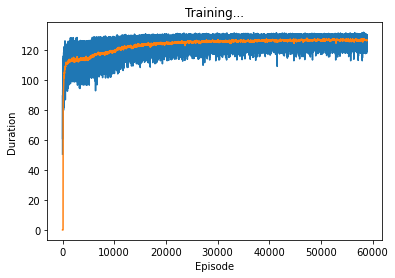

Current_train_num :  227845 Accuracy :  0.9971208497004542
F1 0.49266409266409267
319 589 68


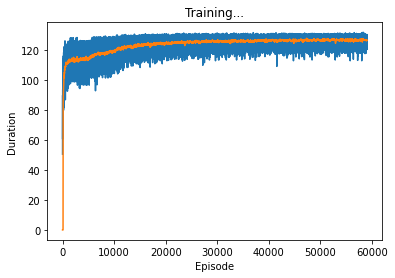

Current_train_num :  227845 Accuracy :  0.9980820294498453
F1 0.5844402277039848
308 359 79


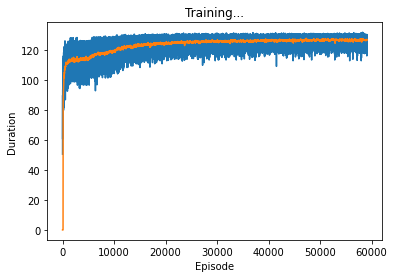

Current_train_num :  227845 Accuracy :  0.9987008712063026
F1 0.6605714285714286
289 199 98


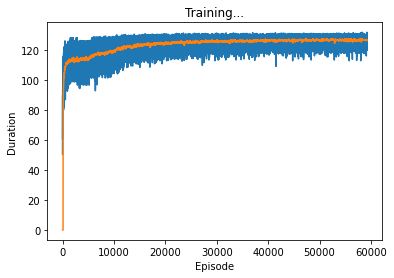

Current_train_num :  227845 Accuracy :  0.9983892558537603
F1 0.6334661354581673
318 299 69


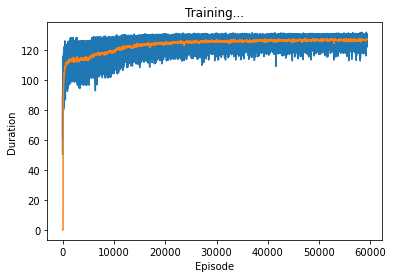

Current_train_num :  227845 Accuracy :  0.9988237617678685
F1 0.7014428412874584
316 198 71


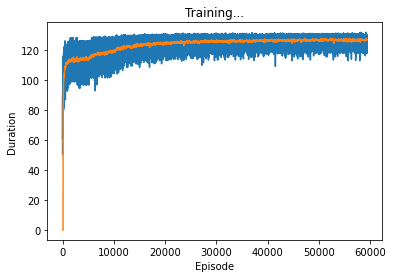

Current_train_num :  227845 Accuracy :  0.9511553907261515
F1 0.05613975576662144
331 11074 56


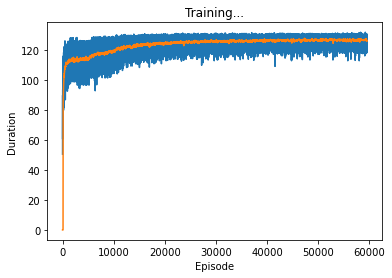

Current_train_num :  227845 Accuracy :  0.9980776405012179
F1 0.5923862581244197
319 371 68


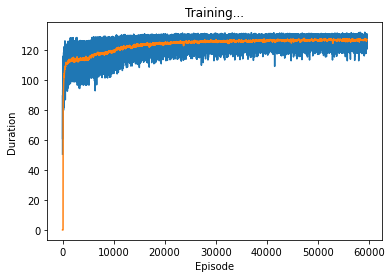

Current_train_num :  227845 Accuracy :  0.9967258443239921
F1 0.46142754145638065
320 680 67


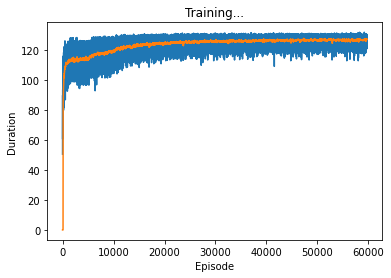

Current_train_num :  227845 Accuracy :  0.9982575873949395
F1 0.6150870406189555
318 329 69


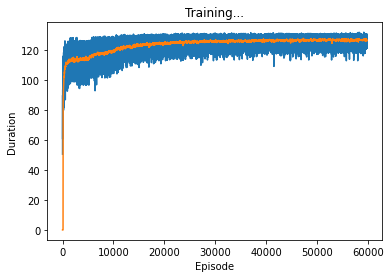

Current_train_num :  227845 Accuracy :  0.9985121464153263
F1 0.6344086021505376
295 248 92


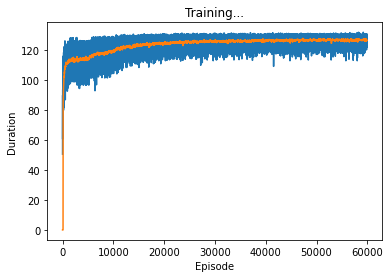

Current_train_num :  227845 Accuracy :  0.9980030283745529
F1 0.580110497237569
315 384 72


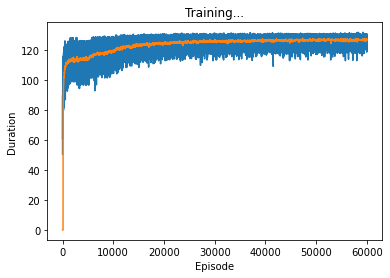

Current_train_num :  227845 Accuracy :  0.9985472580043451
F1 0.6445396145610278
301 246 86


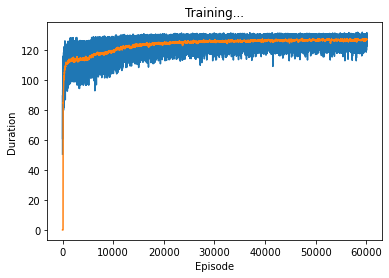

Current_train_num :  227845 Accuracy :  0.9987754833329676
F1 0.6853932584269663
305 198 82


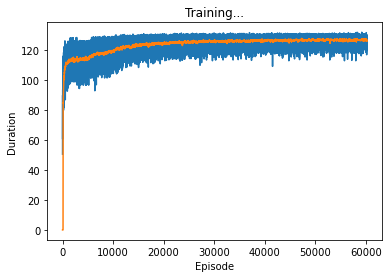

Current_train_num :  227845 Accuracy :  0.9987842612302223
F1 0.6634382566585957
274 165 113


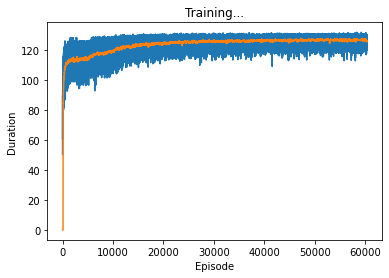

Current_train_num :  227845 Accuracy :  0.998411200596897
F1 0.6284544524053224
307 283 80


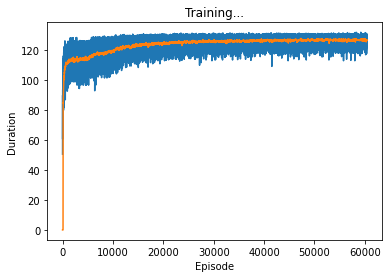

Current_train_num :  227845 Accuracy :  0.9986569817200289
F1 0.6659412404787813
306 226 81


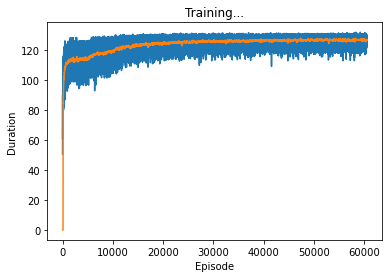

Current_train_num :  227845 Accuracy :  0.9969014022690864
F1 0.47434944237918214
319 639 68


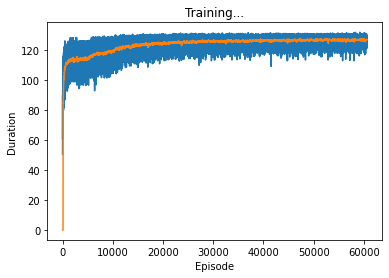

Current_train_num :  227845 Accuracy :  0.9986482038227743
F1 0.6600660066006601
300 222 87


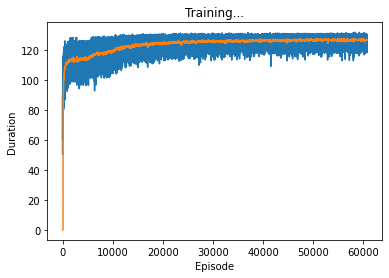

Current_train_num :  227845 Accuracy :  0.9987842612302223
F1 0.6897321428571429
309 200 78


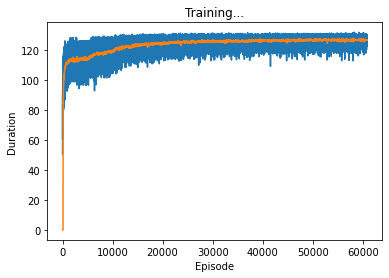

Current_train_num :  227845 Accuracy :  0.9969365138581053
F1 0.47718773373223633
319 631 68


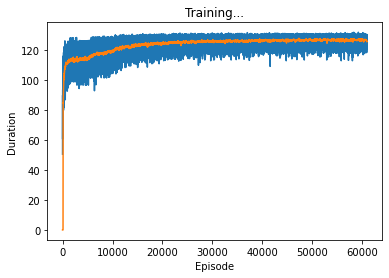

Current_train_num :  227845 Accuracy :  0.9938730277162106
F1 0.3148602256007847
321 1331 66


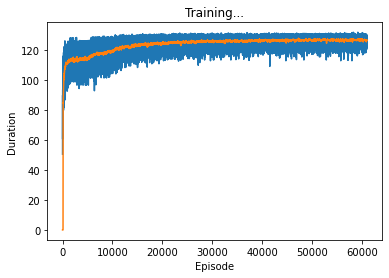

Current_train_num :  227845 Accuracy :  0.9983278105729773
F1 0.6156941649899397
306 301 81


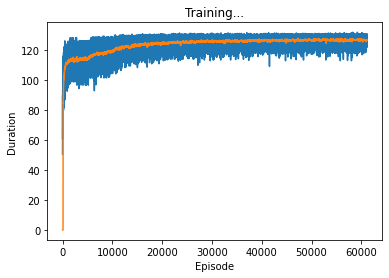

Current_train_num :  227845 Accuracy :  0.9983629221619961
F1 0.6274900398406374
315 302 72


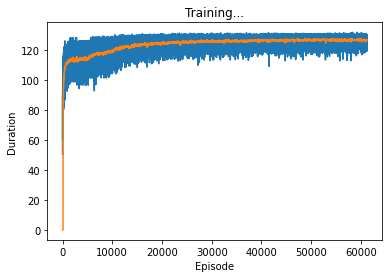

Current_train_num :  227845 Accuracy :  0.9955452171432333
F1 0.3864734299516908
320 949 67


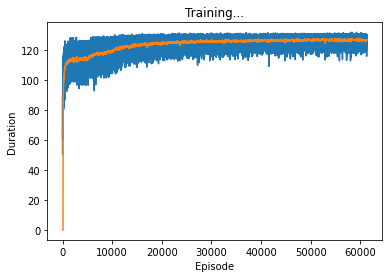

Current_train_num :  227845 Accuracy :  0.9986130922337554
F1 0.6673662119622246
318 248 69


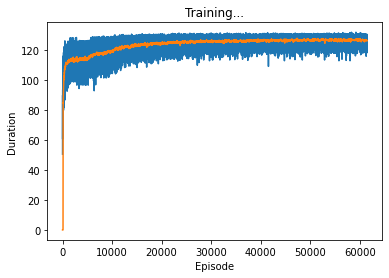

Current_train_num :  227845 Accuracy :  0.9974895213851522
F1 0.5260545905707196
318 504 69


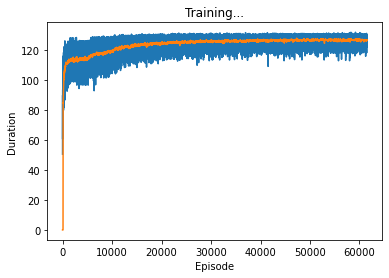

Current_train_num :  227845 Accuracy :  0.9985428690557177
F1 0.655635987590486
317 263 70


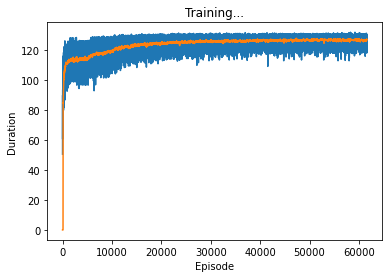

Current_train_num :  227845 Accuracy :  0.9983541442647413
F1 0.6224899598393574
310 299 77


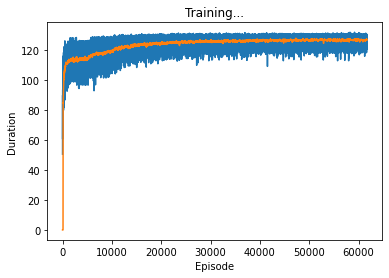

Current_train_num :  227845 Accuracy :  0.997142794443591
F1 0.4945736434108527
319 584 68


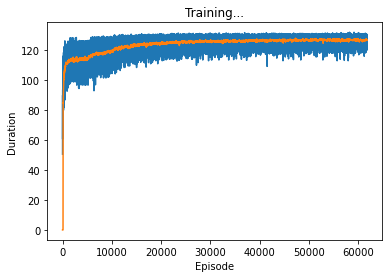

Current_train_num :  227845 Accuracy :  0.9986262590796374
F1 0.642369020501139
282 209 105


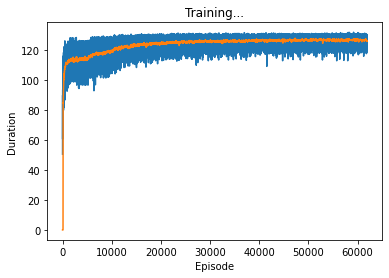

Current_train_num :  227845 Accuracy :  0.9986613706686563
F1 0.665938864628821
305 224 82


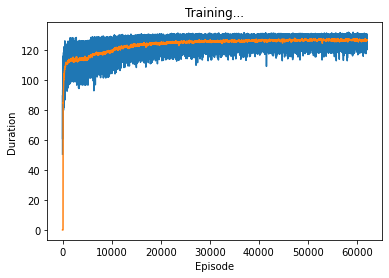

Current_train_num :  227845 Accuracy :  0.9976870240733832
F1 0.5463917525773195
318 459 69


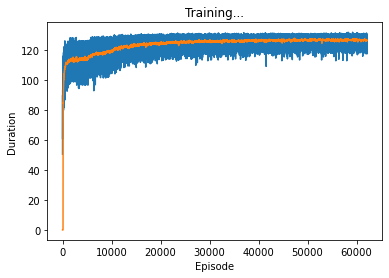

Current_train_num :  227845 Accuracy :  0.9955934955781343
F1 0.3890577507598784
320 938 67


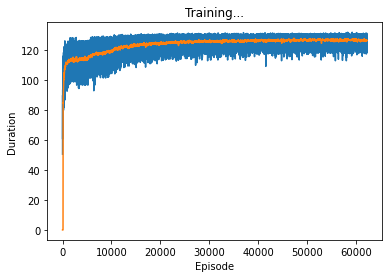

Current_train_num :  227845 Accuracy :  0.9985692027474818
F1 0.6546990496304118
310 250 77


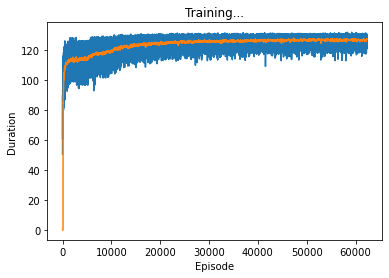

Current_train_num :  227845 Accuracy :  0.9985033685180715
F1 0.6459627329192547
312 267 75


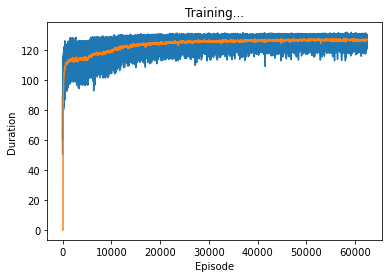

Current_train_num :  227845 Accuracy :  0.9976431345871096
F1 0.5417376490630323
318 469 69


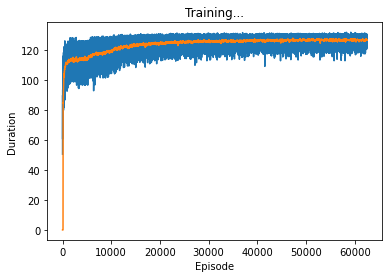

Current_train_num :  227845 Accuracy :  0.9958129430095021
F1 0.4012539184952978
320 888 67


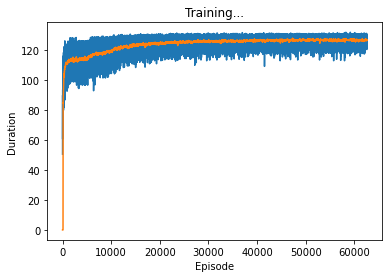

Current_train_num :  227845 Accuracy :  0.9960499462353793
F1 0.4153147306943543
320 834 67


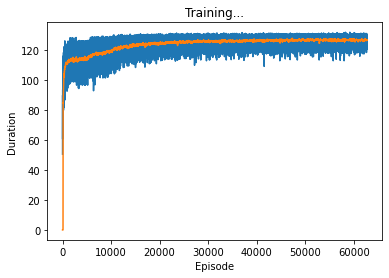

Current_train_num :  227845 Accuracy :  0.9984507011345433
F1 0.6424242424242425
318 285 69


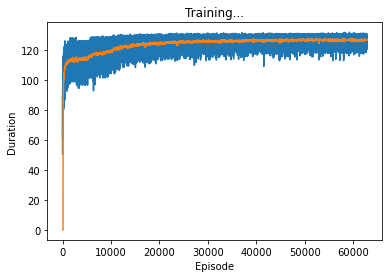

Current_train_num :  227845 Accuracy :  0.9987315938466941
F1 0.6820175438596491
311 214 76


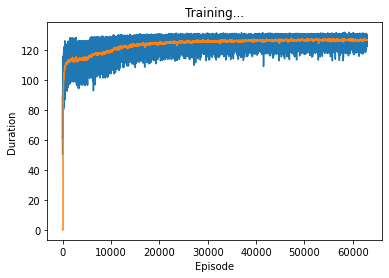

Current_train_num :  227845 Accuracy :  0.9973446860804495
F1 0.5120772946859904
318 537 69


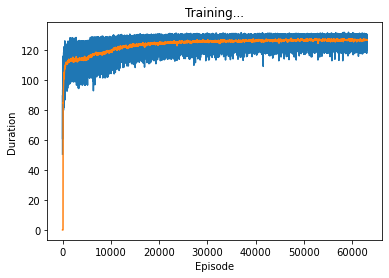

Current_train_num :  227845 Accuracy :  0.9987184270008119
F1 0.6681766704416761
295 201 92


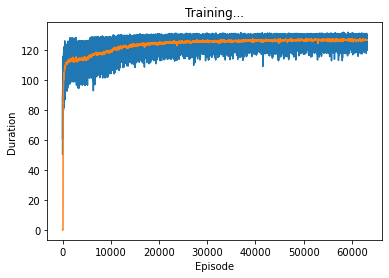

Current_train_num :  227845 Accuracy :  0.9987403717439487
F1 0.6842105263157895
312 213 75


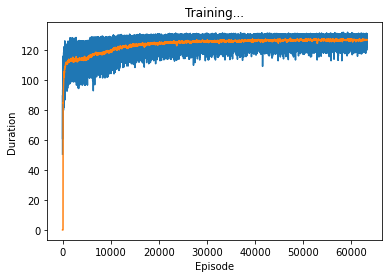

Current_train_num :  227845 Accuracy :  0.9896113585990476
F1 0.21433311214333112
323 2304 64


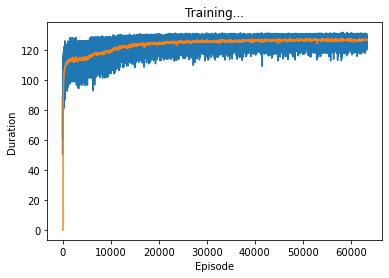

Current_train_num :  227845 Accuracy :  0.999100265531392
F1 0.7405541561712846
294 113 93


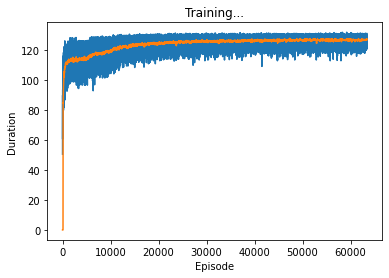

Current_train_num :  227845 Accuracy :  0.9965063968926243
F1 0.4438241451500349
318 728 69


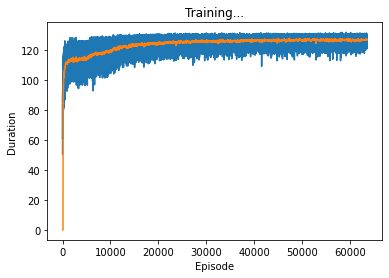

Current_train_num :  227845 Accuracy :  0.9988720402027694
F1 0.7101123595505618
316 187 71


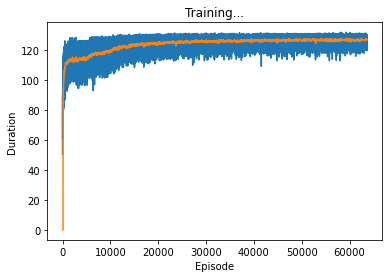

Current_train_num :  227845 Accuracy :  0.9989247075862977
F1 0.6970443349753694
283 142 104


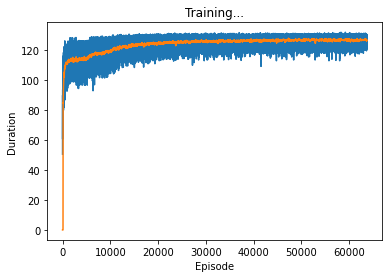

Current_train_num :  227845 Accuracy :  0.9986218701310101
F1 0.6572361262241567
302 230 85


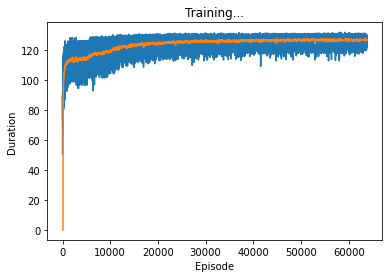

Current_train_num :  227845 Accuracy :  0.9986613706686563
F1 0.6666666666666666
306 225 81


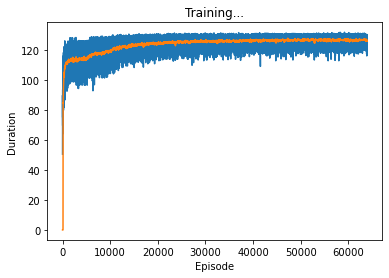

Current_train_num :  227845 Accuracy :  0.9987623164870855
F1 0.6728323699421965
291 187 96


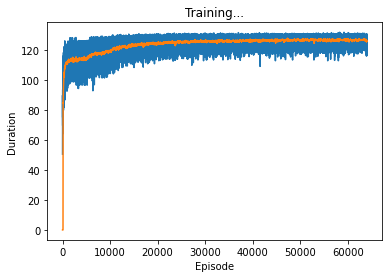

Current_train_num :  227845 Accuracy :  0.9989422633808072
F1 0.7166276346604216
306 161 81


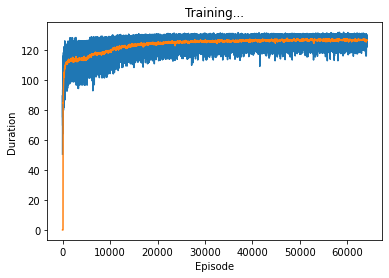

Current_train_num :  227845 Accuracy :  0.9990168755074722
F1 0.7089262613195343
274 112 113


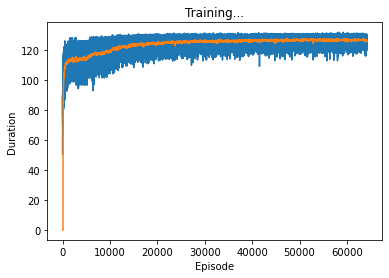

Current_train_num :  227845 Accuracy :  0.9981215299874915
F1 0.5941343424787133
314 356 73


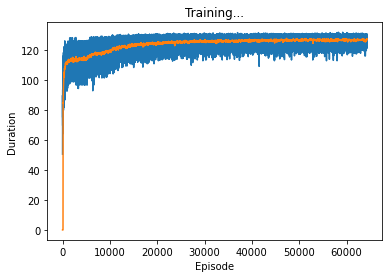

Current_train_num :  227845 Accuracy :  0.9984902016721894
F1 0.6475995914198162
317 275 70


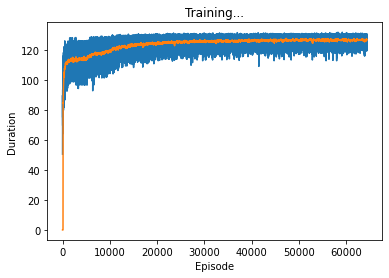

Current_train_num :  227845 Accuracy :  0.9990958765827646
F1 0.7329032258064516
284 104 103


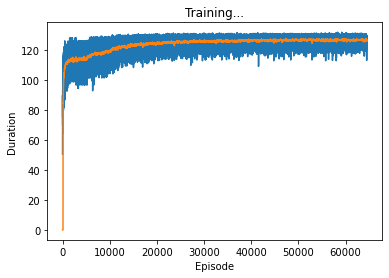

Current_train_num :  227845 Accuracy :  0.9978889157102416
F1 0.5696428571428571
319 414 68


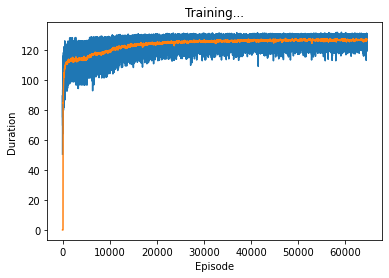

Current_train_num :  227845 Accuracy :  0.9987491496412034
F1 0.6891304347826087
317 216 70


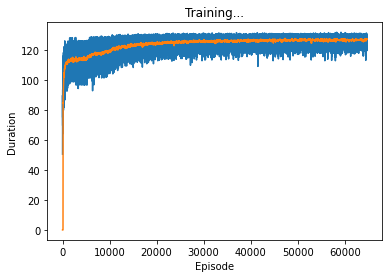

Current_train_num :  227845 Accuracy :  0.9991090434286467
F1 0.7530266343825666
311 128 76


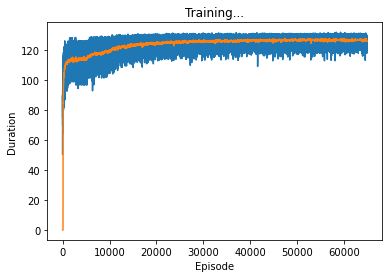

Current_train_num :  227845 Accuracy :  0.999100265531392
F1 0.748780487804878
307 126 80


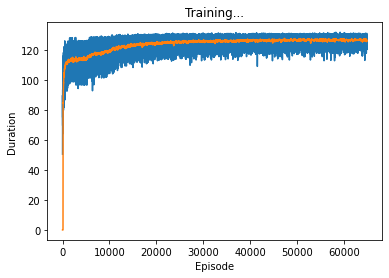

Current_train_num :  227845 Accuracy :  0.9981566415765103
F1 0.6024551463644948
319 353 68


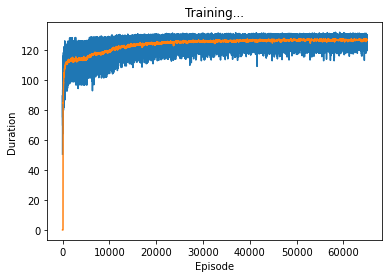

Current_train_num :  227845 Accuracy :  0.9984155895455243
F1 0.6372745490981964
318 293 69


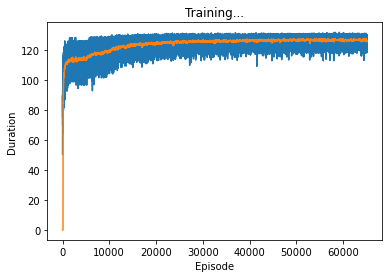

Current_train_num :  227845 Accuracy :  0.9986218701310101
F1 0.6519337016574586
295 223 92


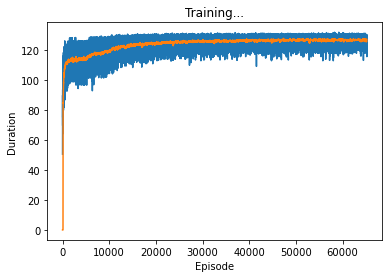

Current_train_num :  227845 Accuracy :  0.9987579275384582
F1 0.6705336426914154
289 186 98


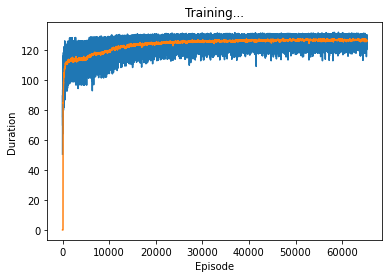

Current_train_num :  227845 Accuracy :  0.9971779060326099
F1 0.49765990639625585
319 576 68


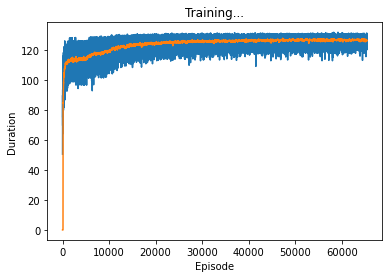

Current_train_num :  227845 Accuracy :  0.9982795321380763
F1 0.617332035053554
317 323 70


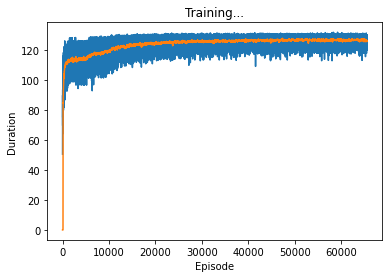

Current_train_num :  227845 Accuracy :  0.9988325396651232
F1 0.6934557979334098
302 182 85


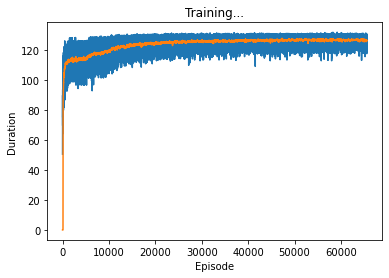

Current_train_num :  227845 Accuracy :  0.9989115407404157
F1 0.6959706959706959
285 147 102


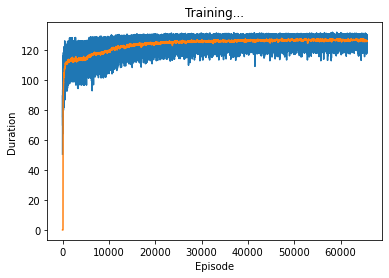

Current_train_num :  227845 Accuracy :  0.9988149838706138
F1 0.6852497096399536
295 179 92


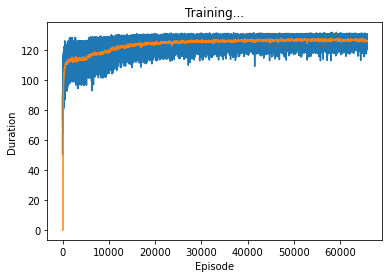

Current_train_num :  227845 Accuracy :  0.9986701485659111
F1 0.6702819956616052
309 226 78


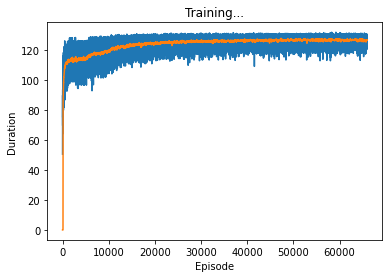

Current_train_num :  227845 Accuracy :  0.9964449516118414
F1 0.4410751206064783
320 744 67


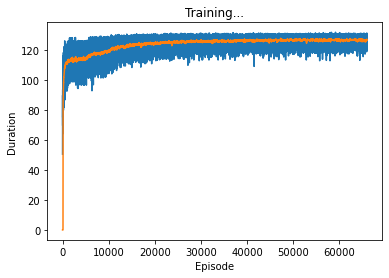

Current_train_num :  227845 Accuracy :  0.9967565669643836
F1 0.463768115942029
320 673 67


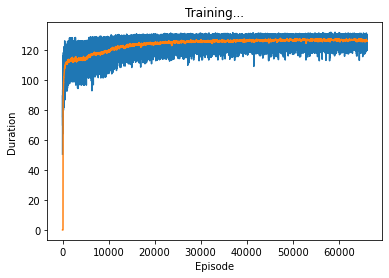

Current_train_num :  227845 Accuracy :  0.9990695428910005
F1 0.7405602923264312
304 130 83


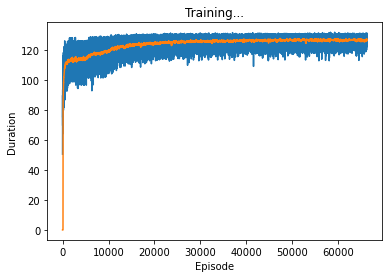

Current_train_num :  227845 Accuracy :  0.9957558866773465
F1 0.39800995024875624
320 901 67


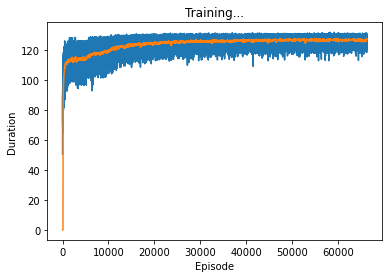

Current_train_num :  227845 Accuracy :  0.9988413175623779
F1 0.7045707915273133
316 194 71


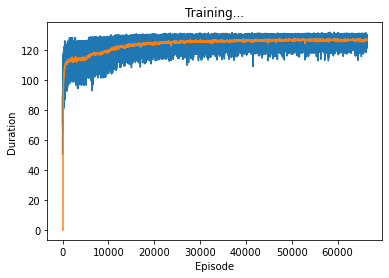

Current_train_num :  227845 Accuracy :  0.9988852070486515
F1 0.7125140924464487
316 184 71


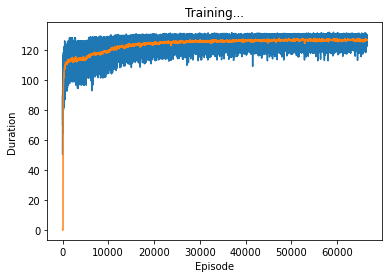

Current_train_num :  227845 Accuracy :  0.9989422633808072
F1 0.7019704433497537
285 140 102


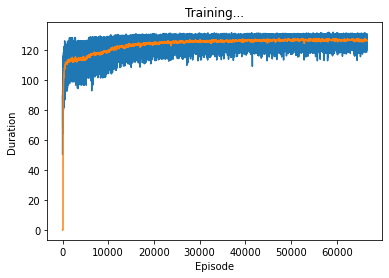

Current_train_num :  227845 Accuracy :  0.9985823695933639
F1 0.6560509554140127
309 246 78


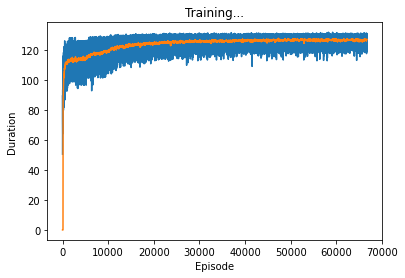

Current_train_num :  227845 Accuracy :  0.9981698084223924
F1 0.603415559772296
318 349 69


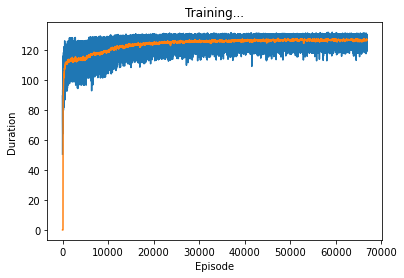

Current_train_num :  227845 Accuracy :  0.9987096491035572
F1 0.6589595375722543
285 193 102


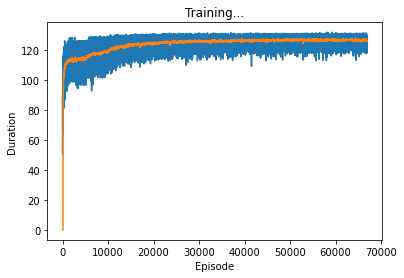

Current_train_num :  227845 Accuracy :  0.9981215299874915
F1 0.5956644674835061
316 358 71


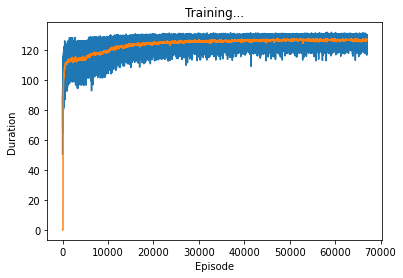

Current_train_num :  227845 Accuracy :  0.9989027628431609
F1 0.7057444314185228
301 165 86


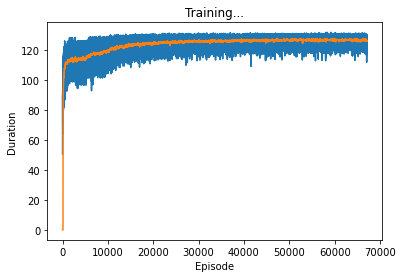

Current_train_num :  227845 Accuracy :  0.9982926989839583
F1 0.6138613861386139
310 313 77


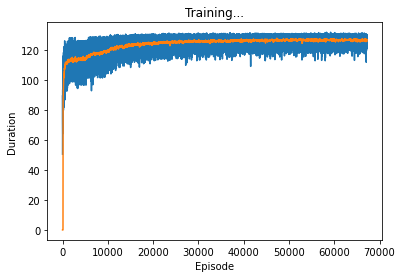

Current_train_num :  227845 Accuracy :  0.9978406372753407
F1 0.5641025641025641
319 425 68


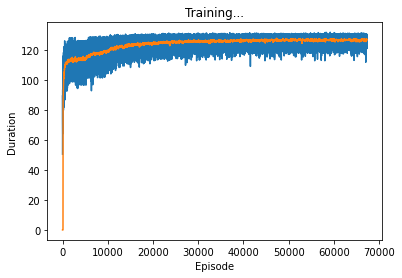

Current_train_num :  227845 Accuracy :  0.9987052601549299
F1 0.6810344827586207
316 225 71


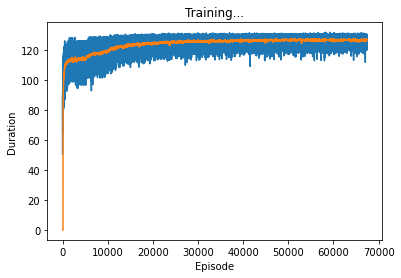

Current_train_num :  227845 Accuracy :  0.9990300423533542
F1 0.7238805970149254
291 126 96


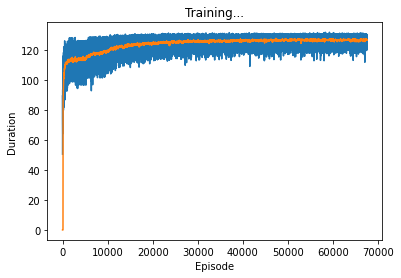

Current_train_num :  227845 Accuracy :  0.9988676512541421
F1 0.7073446327683616
313 185 74


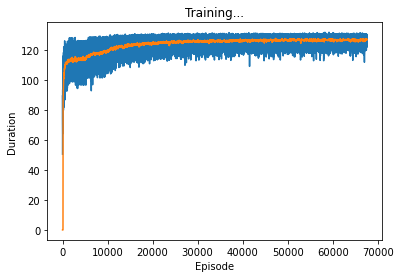

Current_train_num :  227845 Accuracy :  0.999100265531392
F1 0.7444168734491315
300 119 87


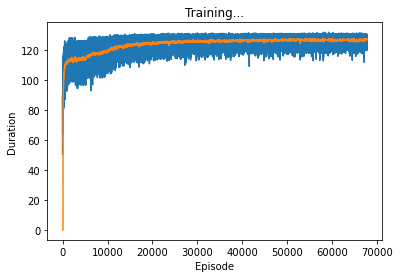

Current_train_num :  227845 Accuracy :  0.9974675766420154
F1 0.524671052631579
319 510 68


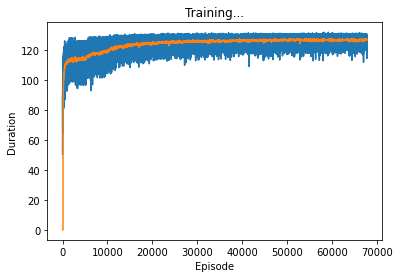

Current_train_num :  227845 Accuracy :  0.9989642081239439
F1 0.7228070175438597
309 159 78


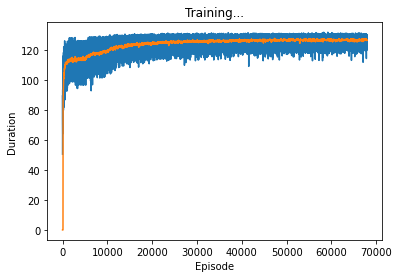

Current_train_num :  227845 Accuracy :  0.997967916785534
F1 0.5781818181818181
318 395 69


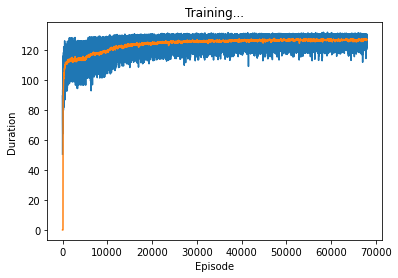

Current_train_num :  227845 Accuracy :  0.9989466523294345
F1 0.707168894289186
291 145 96


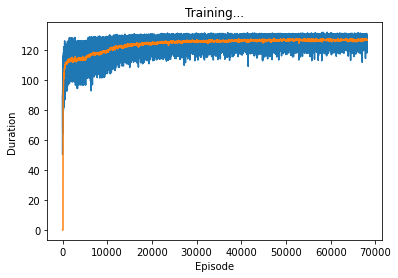

Current_train_num :  227845 Accuracy :  0.999038820250609
F1 0.7380952380952381
310 143 77


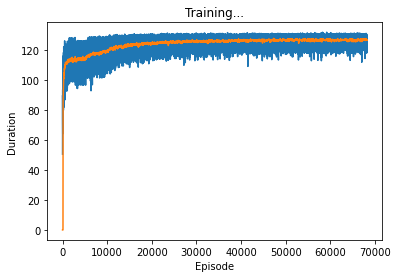

Current_train_num :  227845 Accuracy :  0.9988808181000242
F1 0.7009345794392523
300 169 87


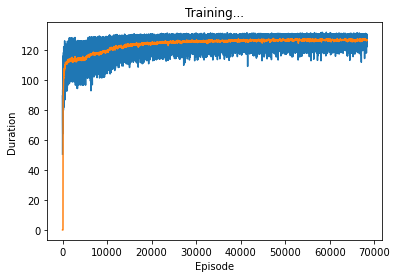

Current_train_num :  227845 Accuracy :  0.9987140380521846
F1 0.6754966887417219
306 213 81


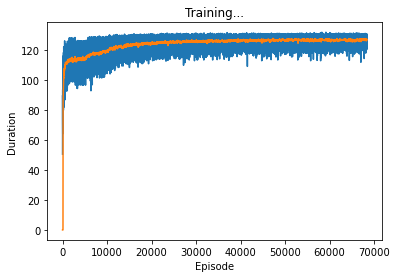

Current_train_num :  227845 Accuracy :  0.9988808181000242
F1 0.6930455635491607
289 158 98


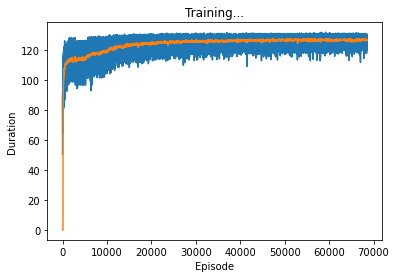

Current_train_num :  227845 Accuracy :  0.9978143035835766
F1 0.5611257695690414
319 431 68


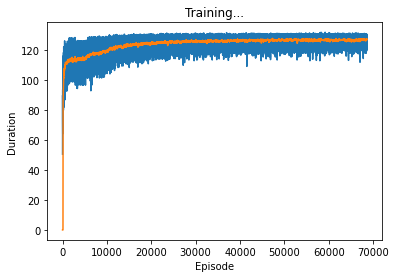

Current_train_num :  227845 Accuracy :  0.9959007219820492
F1 0.40634920634920635
320 868 67


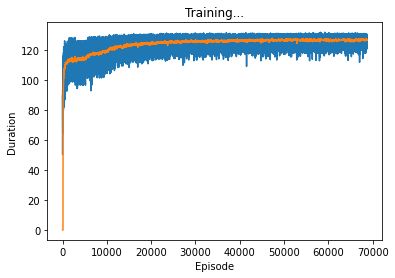

Current_train_num :  227845 Accuracy :  0.9988413175623779
F1 0.6978335233751425
306 184 81


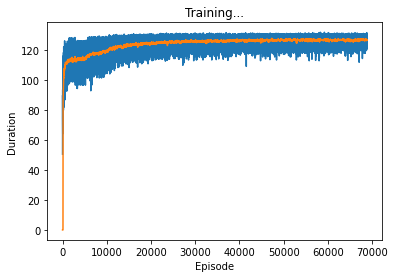

Current_train_num :  227845 Accuracy :  0.9986438148741469
F1 0.6716101694915254
317 240 70


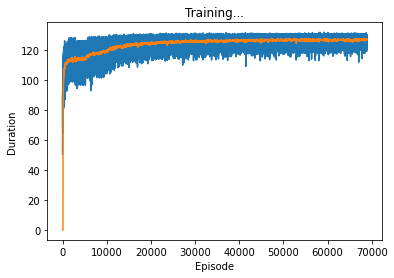

Current_train_num :  227845 Accuracy :  0.9989861528670807
F1 0.7302325581395349
314 159 73


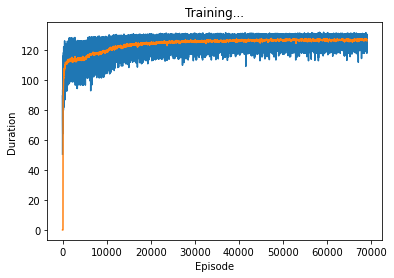

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.6935687263556116
275 131 112


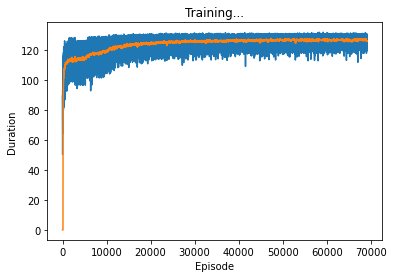

Current_train_num :  227845 Accuracy :  0.9984155895455243
F1 0.6343434343434343
314 289 73


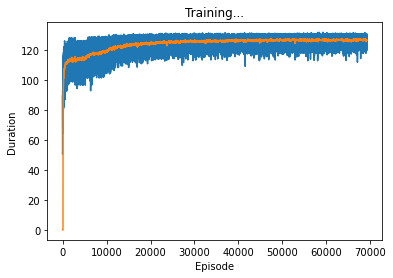

Current_train_num :  227845 Accuracy :  0.9982049200114113
F1 0.6087786259541985
319 342 68


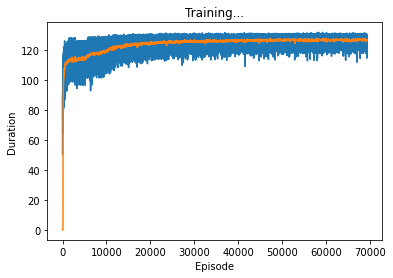

Current_train_num :  227845 Accuracy :  0.9988500954596327
F1 0.6835138387484958
284 160 103


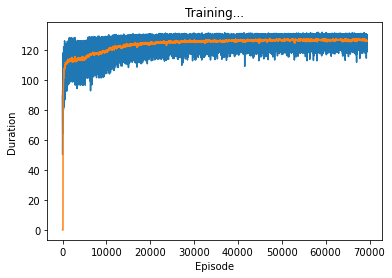

Current_train_num :  227845 Accuracy :  0.991906778731155
F1 0.2575452716297787
320 1778 67


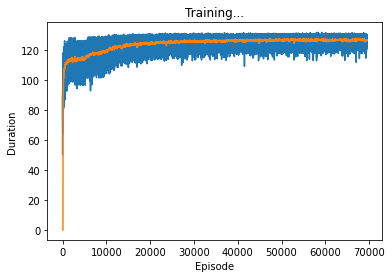

Current_train_num :  227845 Accuracy :  0.9986174811823828
F1 0.6557734204793029
301 230 86


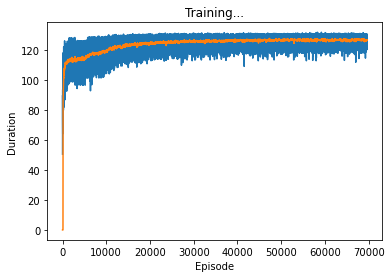

Current_train_num :  227845 Accuracy :  0.9985735916961092
F1 0.6597077244258872
316 255 71


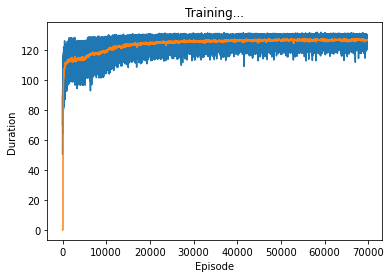

Current_train_num :  227845 Accuracy :  0.9840417827909325
F1 0.15122520420070013
324 3574 63


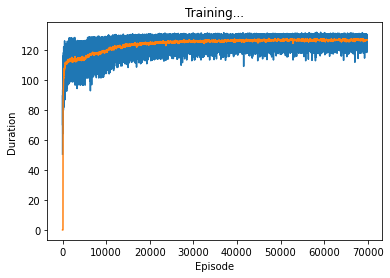

Current_train_num :  227845 Accuracy :  0.9988149838706138
F1 0.6972067039106146
312 196 75


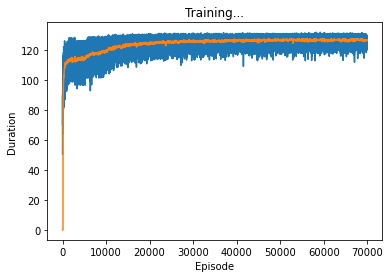

Current_train_num :  227845 Accuracy :  0.9986964822576752
F1 0.6795698924731183
316 227 71


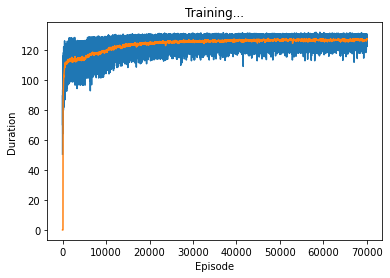

Current_train_num :  227845 Accuracy :  0.9917575544778249
F1 0.25288270377733596
318 1810 69


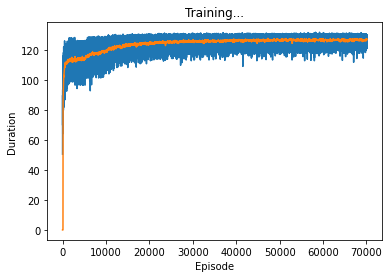

Current_train_num :  227845 Accuracy :  0.9990870986855099
F1 0.7460510328068044
307 129 80


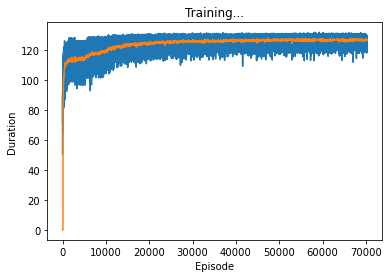

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7291139240506329
288 115 99


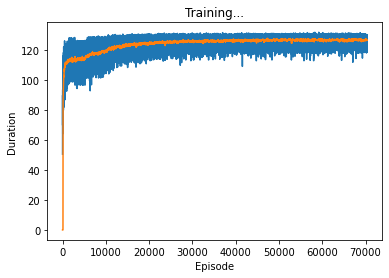

Current_train_num :  227845 Accuracy :  0.9988413175623779
F1 0.6856465005931198
289 167 98


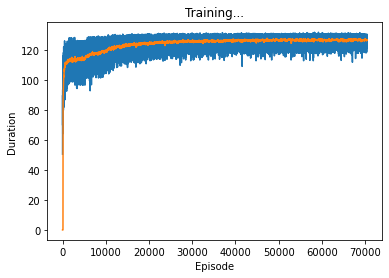

Current_train_num :  227845 Accuracy :  0.9983936448023876
F1 0.634097706879362
318 298 69


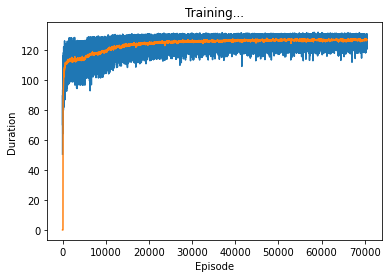

Current_train_num :  227845 Accuracy :  0.999100265531392
F1 0.7481662591687042
306 125 81


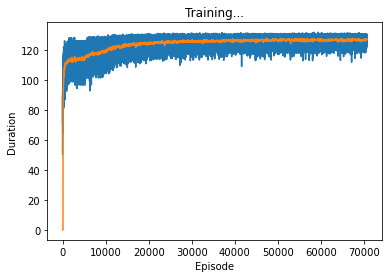

Current_train_num :  227845 Accuracy :  0.9990563760451184
F1 0.7434679334916865
313 142 74


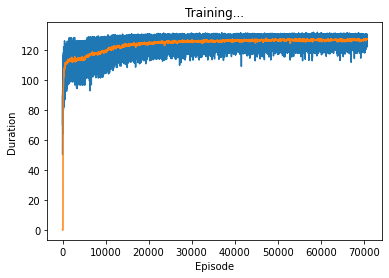

Current_train_num :  227845 Accuracy :  0.9987052601549299
F1 0.6796536796536796
314 223 73


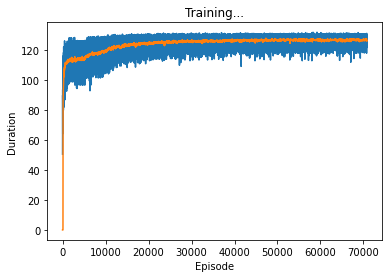

Current_train_num :  227845 Accuracy :  0.9986920933090478
F1 0.6802139037433155
318 230 69


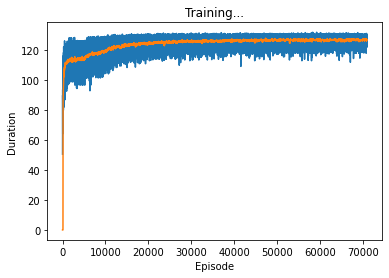

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.7365911799761621
309 143 78


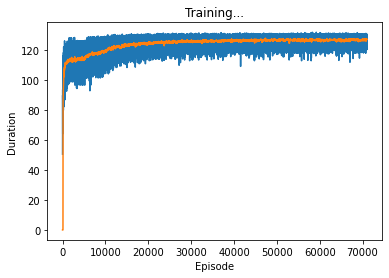

Current_train_num :  227845 Accuracy :  0.9967872896047751
F1 0.46613255644573925
320 666 67


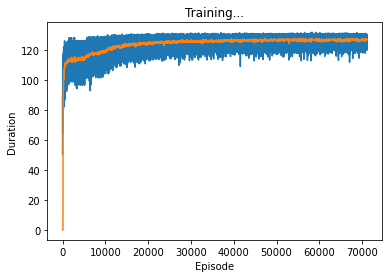

Current_train_num :  227845 Accuracy :  0.9989071517917882
F1 0.7165532879818595
316 179 71


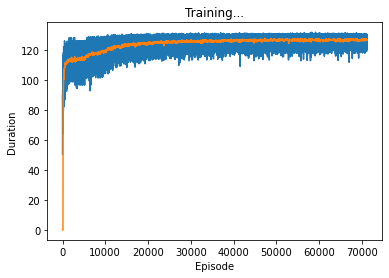

Current_train_num :  227845 Accuracy :  0.9989729860211987
F1 0.7264260768335273
312 160 75


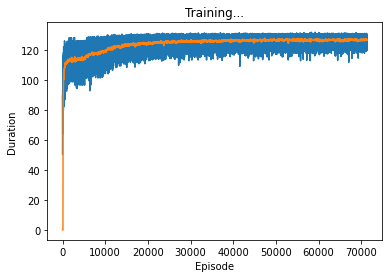

Current_train_num :  227845 Accuracy :  0.998929096534925
F1 0.7141190198366394
306 164 81


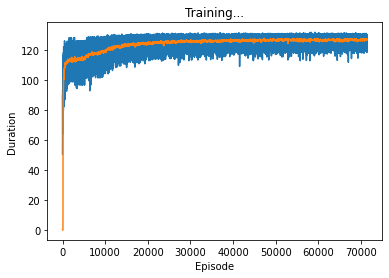

Current_train_num :  227845 Accuracy :  0.9990212644560995
F1 0.7333333333333333
308 145 79


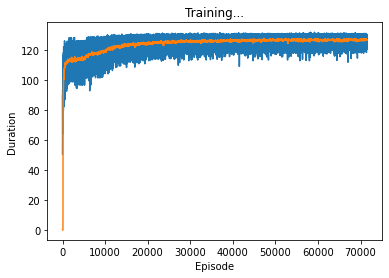

Current_train_num :  227845 Accuracy :  0.9990037086615902
F1 0.7298578199052133
308 149 79


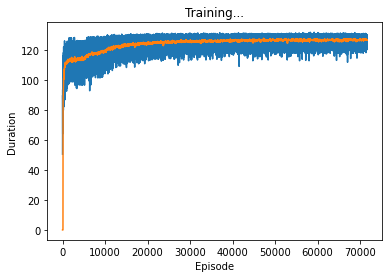

Current_train_num :  227845 Accuracy :  0.9888389036406329
F1 0.2025078369905956
323 2480 64


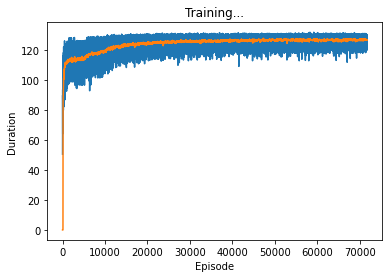

Current_train_num :  227845 Accuracy :  0.9966907327349733
F1 0.45878136200716846
320 688 67


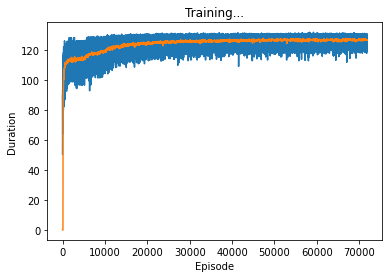

Current_train_num :  227845 Accuracy :  0.9976080229980908
F1 0.5372881355932203
317 476 70


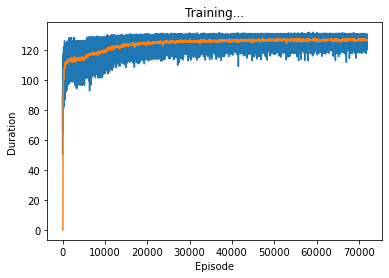

Current_train_num :  227845 Accuracy :  0.9989115407404157
F1 0.6989117291414753
289 151 98


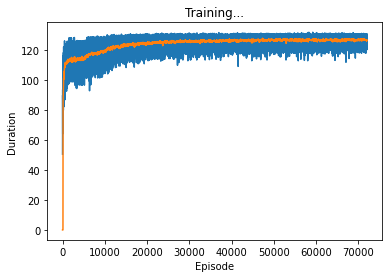

Current_train_num :  227845 Accuracy :  0.9986745375145384
F1 0.6759358288770053
316 232 71


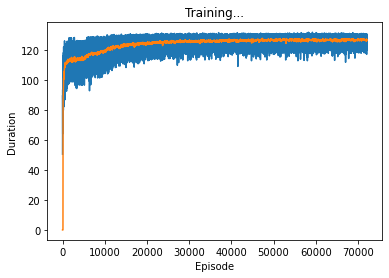

Current_train_num :  227845 Accuracy :  0.998915929689043
F1 0.7054631828978623
297 158 90


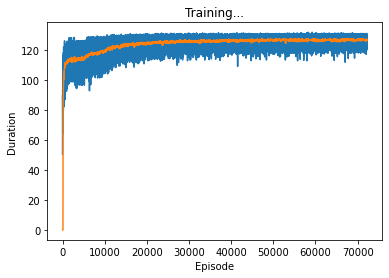

Current_train_num :  227845 Accuracy :  0.998915929689043
F1 0.7155963302752294
312 173 75


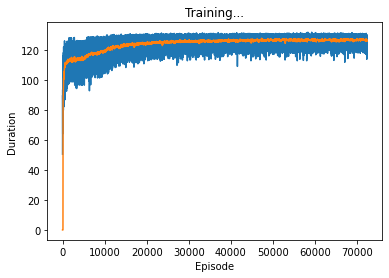

Current_train_num :  227845 Accuracy :  0.9988939849459062
F1 0.707514450867052
306 172 81


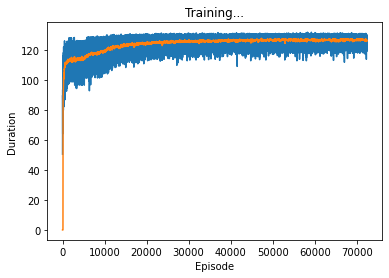

Current_train_num :  227845 Accuracy :  0.9987315938466941
F1 0.6827133479212254
312 215 75


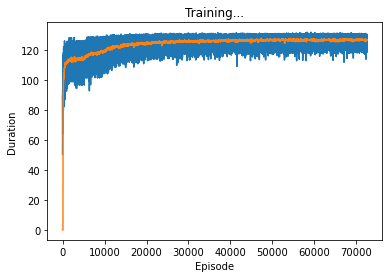

Current_train_num :  227845 Accuracy :  0.9990914876341372
F1 0.7457212713936431
305 126 82


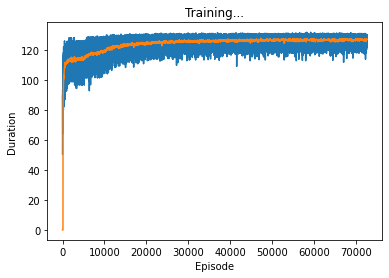

Current_train_num :  227845 Accuracy :  0.9968706796286949
F1 0.4726735598227474
320 647 67


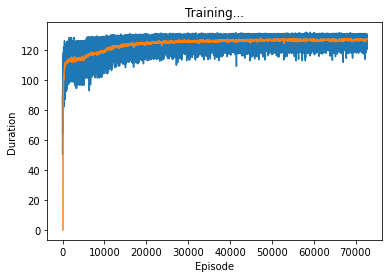

Current_train_num :  227845 Accuracy :  0.9990739318396278
F1 0.7376237623762376
298 123 89


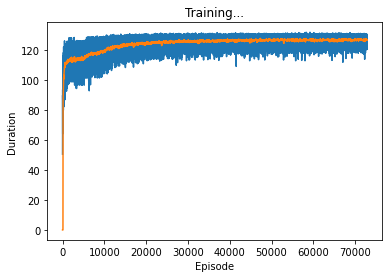

Current_train_num :  227845 Accuracy :  0.9980820294498453
F1 0.5929368029739777
319 370 68


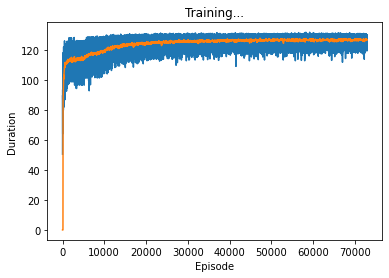

Current_train_num :  227845 Accuracy :  0.9988413175623779
F1 0.7032474804031354
314 192 73


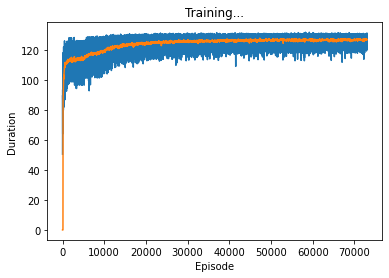

Current_train_num :  227845 Accuracy :  0.9989466523294345
F1 0.7213872832369942
312 166 75


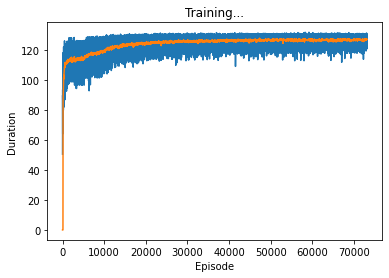

Current_train_num :  227845 Accuracy :  0.9989203186376704
F1 0.7170675830469645
313 173 74


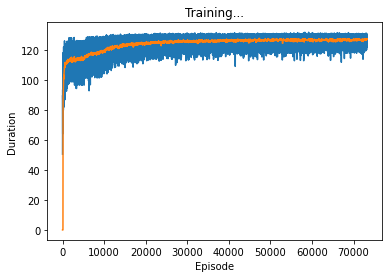

Current_train_num :  227845 Accuracy :  0.9983541442647413
F1 0.6291913214990138
319 308 68


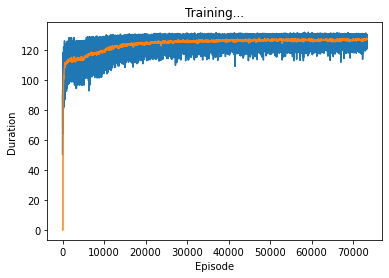

Current_train_num :  227845 Accuracy :  0.9989685970725712
F1 0.7268518518518519
314 163 73


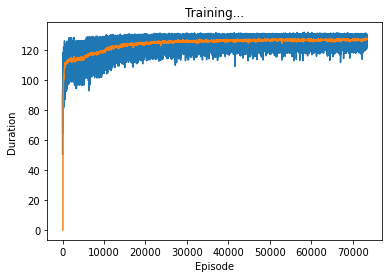

Current_train_num :  227845 Accuracy :  0.9989334854835524
F1 0.7201834862385321
314 171 73


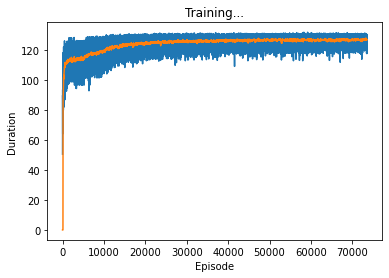

Current_train_num :  227845 Accuracy :  0.9990432091992363
F1 0.7420494699646644
315 147 72


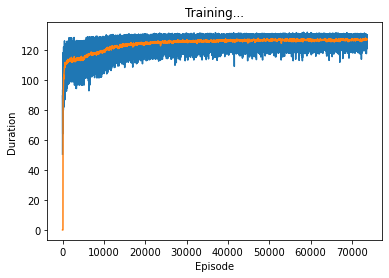

Current_train_num :  227845 Accuracy :  0.9921569488029143
F1 0.2641975308641975
321 1722 66


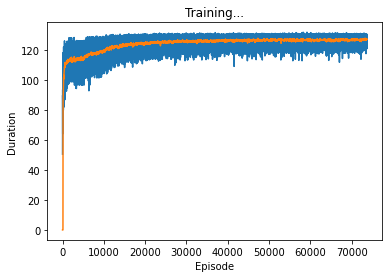

Current_train_num :  227845 Accuracy :  0.9951282670236344
F1 0.36550542547115933
320 1044 67


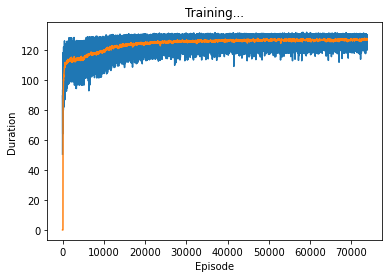

Current_train_num :  227845 Accuracy :  0.999065153942373
F1 0.7249357326478149
282 109 105


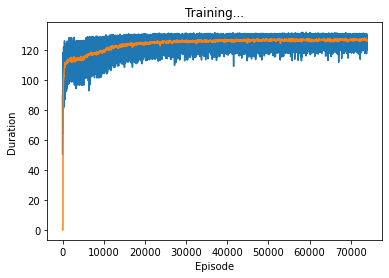

Current_train_num :  227845 Accuracy :  0.9989949307643354
F1 0.7274881516587678
307 150 80


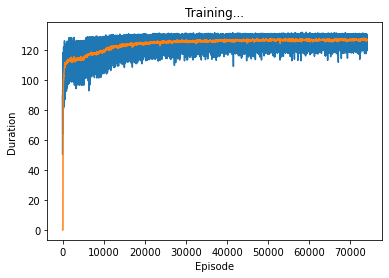

Current_train_num :  227845 Accuracy :  0.998336588470232
F1 0.6267190569744597
319 312 68


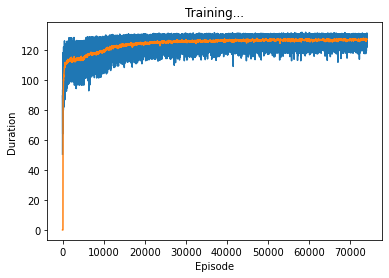

Current_train_num :  227845 Accuracy :  0.9988588733568874
F1 0.7083798882681565
317 191 70


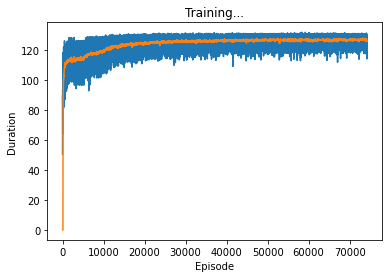

Current_train_num :  227845 Accuracy :  0.9990958765827646
F1 0.734955185659411
287 107 100


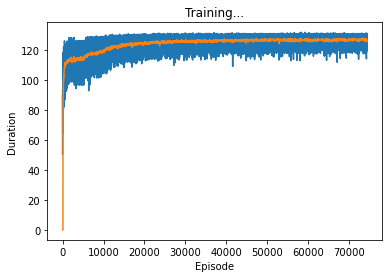

Current_train_num :  227845 Accuracy :  0.989418244859444
F1 0.21021611001964635
321 2346 66


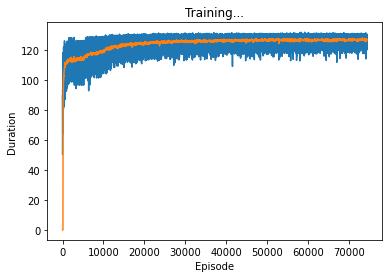

Current_train_num :  227845 Accuracy :  0.9989071517917882
F1 0.7159090909090909
315 178 72


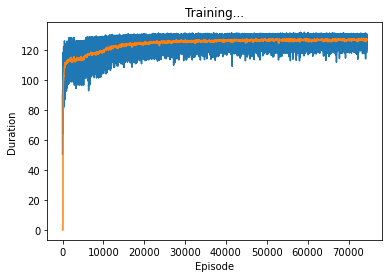

Current_train_num :  227845 Accuracy :  0.9991222102745287
F1 0.7551766138855055
310 124 77


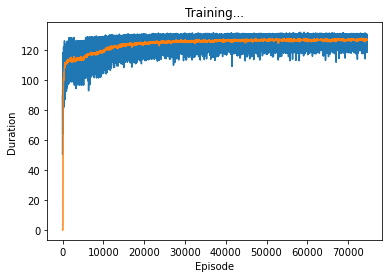

Current_train_num :  227845 Accuracy :  0.9990124865588448
F1 0.7296650717703349
305 144 82


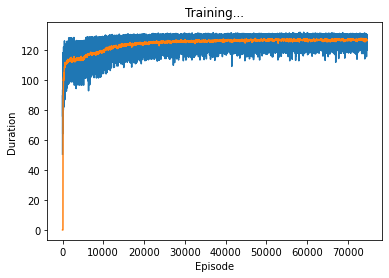

Current_train_num :  227845 Accuracy :  0.9843138976058285
F1 0.15264280635221616
322 3510 65


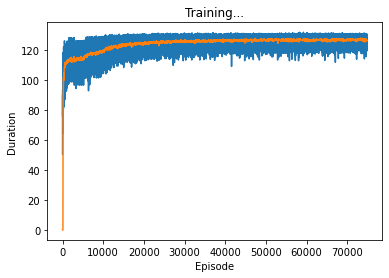

Current_train_num :  227845 Accuracy :  0.9991397660690382
F1 0.7431551499348109
285 95 102


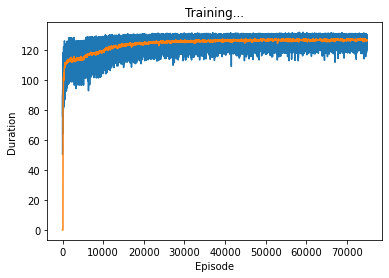

Current_train_num :  227845 Accuracy :  0.9986482038227743
F1 0.6716259298618491
316 238 71


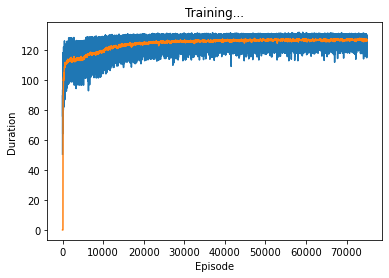

Current_train_num :  227845 Accuracy :  0.9991529329149202
F1 0.7460732984293194
285 92 102


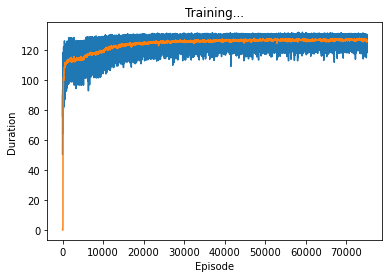

Current_train_num :  227845 Accuracy :  0.999174877658057
F1 0.7657992565055762
309 111 78
75100


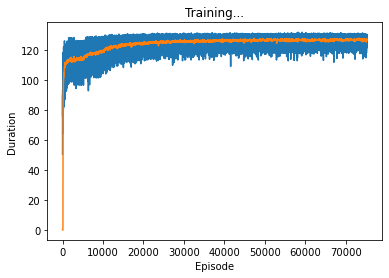

Current_train_num :  227845 Accuracy :  0.9991178213259014
F1 0.7536585365853659
309 124 78


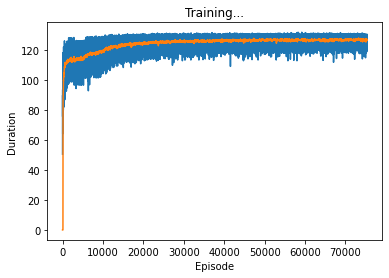

Current_train_num :  227845 Accuracy :  0.9990914876341372
F1 0.7438423645320197
302 123 85


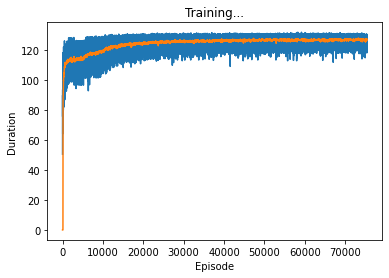

Current_train_num :  227845 Accuracy :  0.9991529329149202
F1 0.7568922305764411
302 109 85


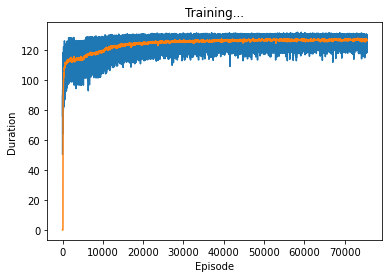

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.737217598097503
310 144 77


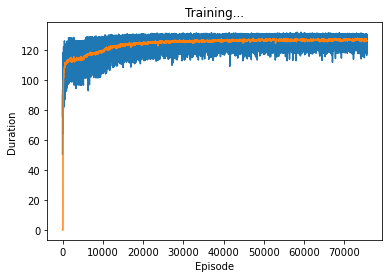

Current_train_num :  227845 Accuracy :  0.9990607649937457
F1 0.7302383939774153
291 119 96


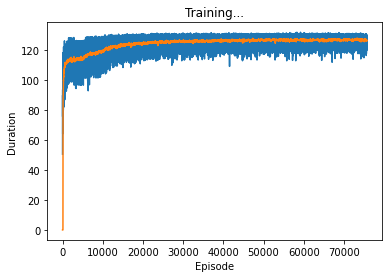

Current_train_num :  227845 Accuracy :  0.998915929689043
F1 0.7188208616780045
317 178 70


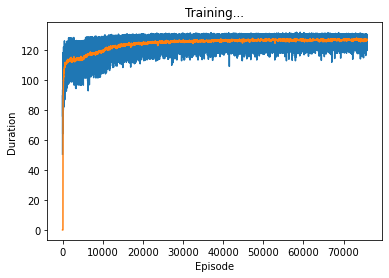

Current_train_num :  227845 Accuracy :  0.999223156092958
F1 0.7763819095477387
309 100 78
75800


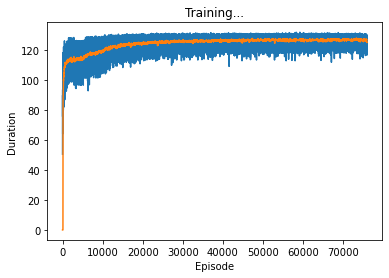

Current_train_num :  227845 Accuracy :  0.999038820250609
F1 0.7043010752688172
262 95 125


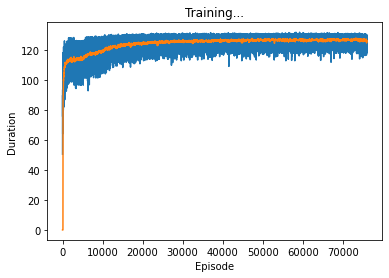

Current_train_num :  227845 Accuracy :  0.9979240272992604
F1 0.5737410071942446
319 406 68


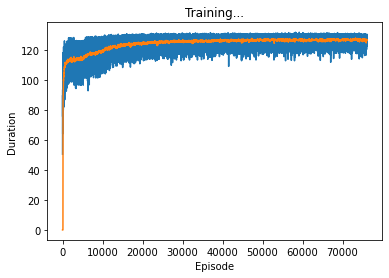

Current_train_num :  227845 Accuracy :  0.9968224011937941
F1 0.46730345334313006
318 656 69


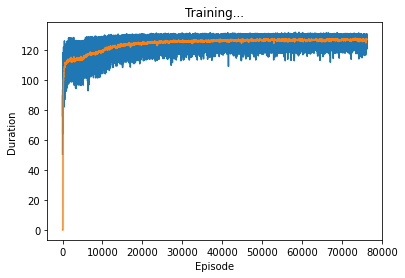

Current_train_num :  227845 Accuracy :  0.9980995852443547
F1 0.591337099811676
314 361 73


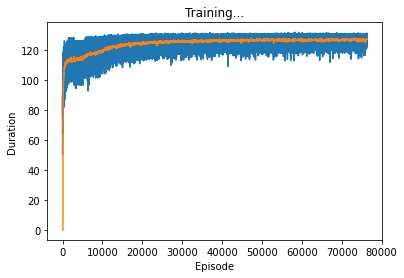

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.728538283062645
314 161 73


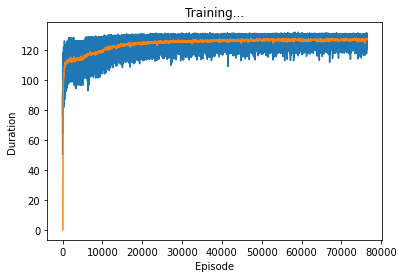

Current_train_num :  227845 Accuracy :  0.9977879698918124
F1 0.5574057843996494
318 436 69


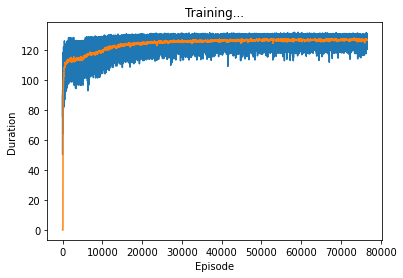

Current_train_num :  227845 Accuracy :  0.9984814237749348
F1 0.6448311156601843
315 275 72


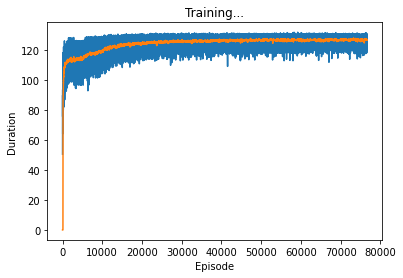

Current_train_num :  227845 Accuracy :  0.9991660997608023
F1 0.7615480649188514
305 109 82


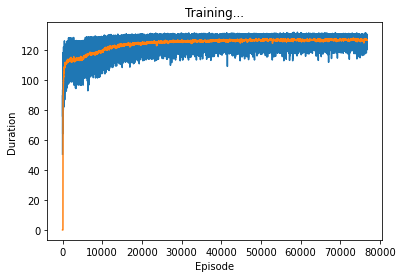

Current_train_num :  227845 Accuracy :  0.9992187671443306
F1 0.7731305449936628
305 97 82


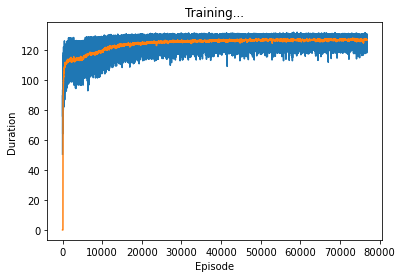

Current_train_num :  227845 Accuracy :  0.9849897956944415
F1 0.15759665107116475
320 3354 67


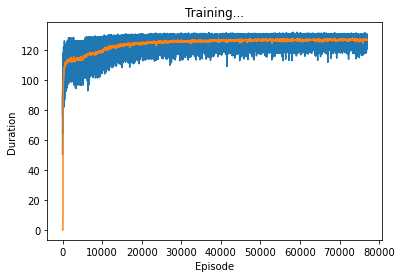

Current_train_num :  227845 Accuracy :  0.9991968224011938
F1 0.7647058823529411
299 96 88


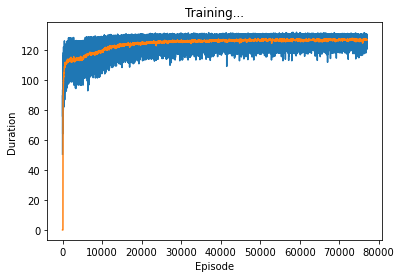

Current_train_num :  227845 Accuracy :  0.9991353771204108
F1 0.7555555555555555
306 117 81


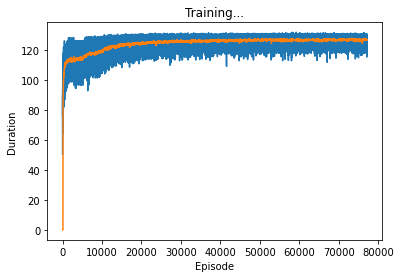

Current_train_num :  227845 Accuracy :  0.9990475981478637
F1 0.7233502538071066
285 116 102


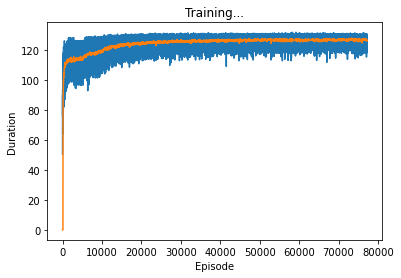

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.7089820359281437
296 152 91


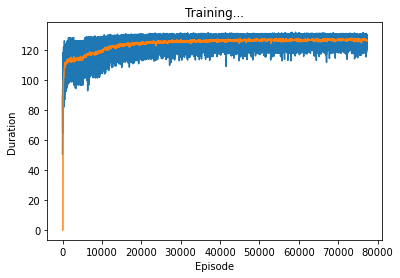

Current_train_num :  227845 Accuracy :  0.9987140380521846
F1 0.676923076923077
308 215 79


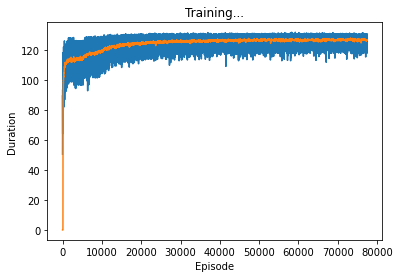

Current_train_num :  227845 Accuracy :  0.9988325396651232
F1 0.6787003610108303
282 162 105


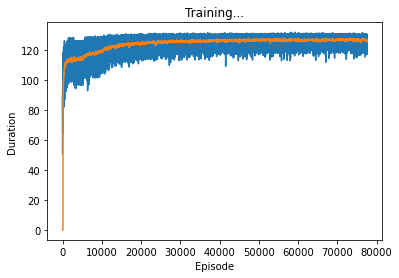

Current_train_num :  227845 Accuracy :  0.998152252627883
F1 0.5965583173996176
312 347 75


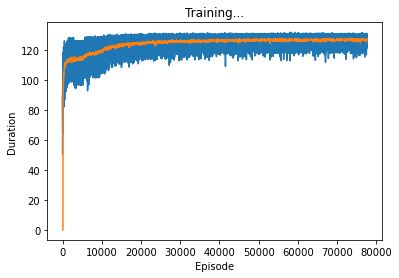

Current_train_num :  227845 Accuracy :  0.9990695428910005
F1 0.7392900856793145
302 128 85


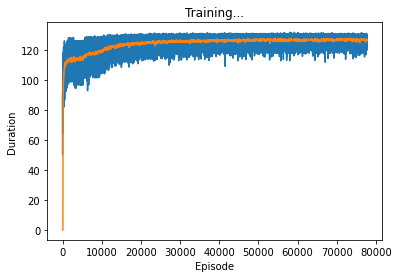

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.7284427284427284
283 107 104


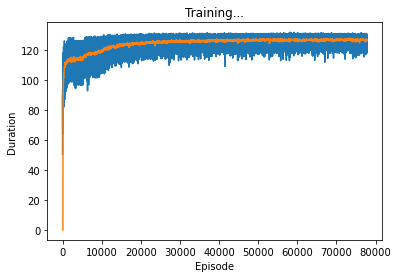

Current_train_num :  227845 Accuracy :  0.9990256534047269
F1 0.7348394768133175
309 145 78


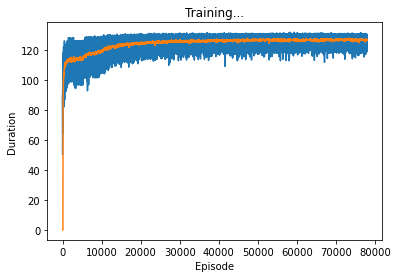

Current_train_num :  227845 Accuracy :  0.9991792666066843
F1 0.7626262626262627
302 103 85


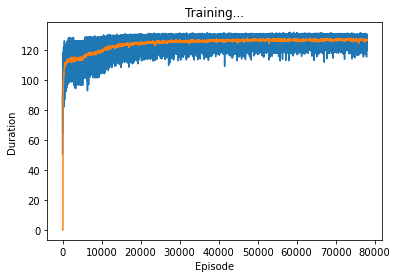

Current_train_num :  227845 Accuracy :  0.9992187671443306
F1 0.7748427672955975
308 100 79


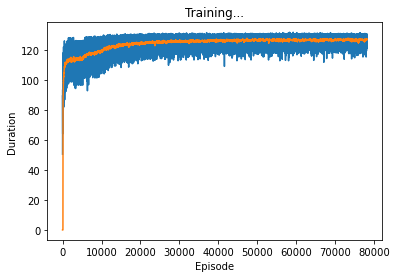

Current_train_num :  227845 Accuracy :  0.9983936448023876
F1 0.6311557788944724
314 294 73


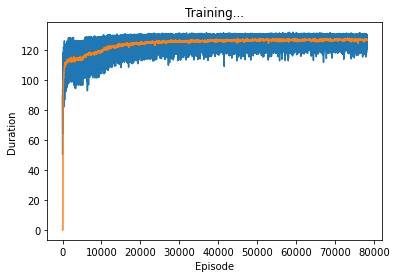

Current_train_num :  227845 Accuracy :  0.9990037086615902
F1 0.7323943661971831
312 153 75


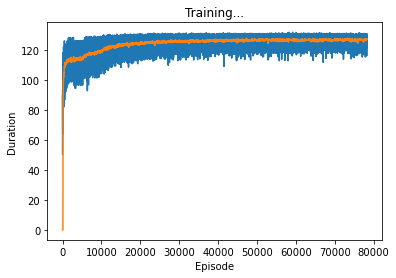

Current_train_num :  227845 Accuracy :  0.9986394259255196
F1 0.6680896478121665
313 237 74


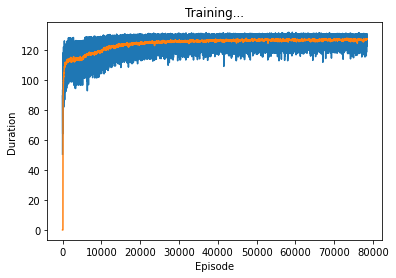

Current_train_num :  227845 Accuracy :  0.9987710943843402
F1 0.6922234392113911
316 210 71


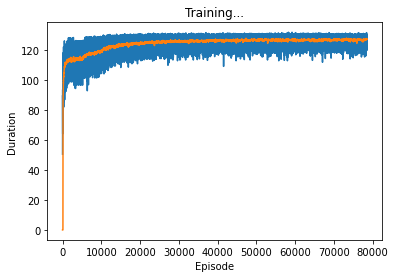

Current_train_num :  227845 Accuracy :  0.9988369286137506
F1 0.703125
315 194 72


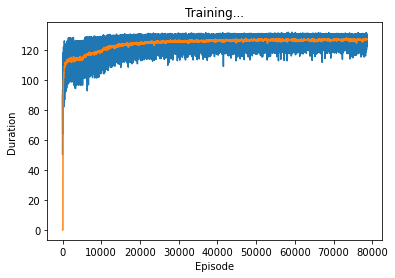

Current_train_num :  227845 Accuracy :  0.9985604248502271
F1 0.656934306569343
315 257 72


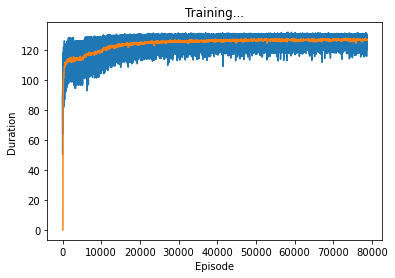

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.7222857142857143
316 172 71


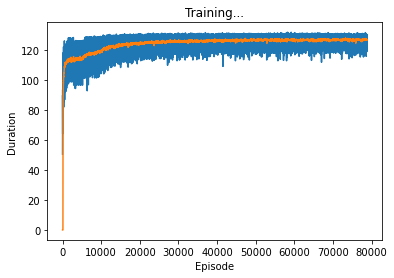

Current_train_num :  227845 Accuracy :  0.9990168755074722
F1 0.7272727272727273
300 138 87


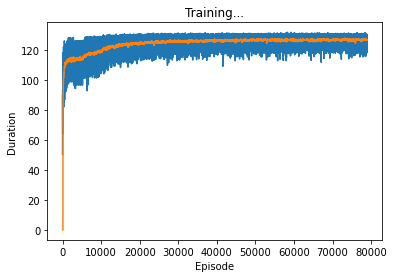

Current_train_num :  227845 Accuracy :  0.9991573218635476
F1 0.7483702737940026
287 93 100


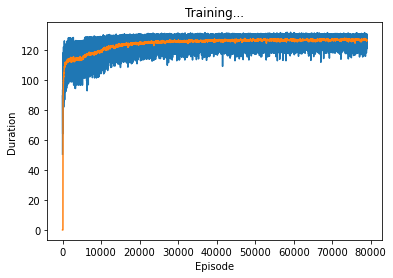

Current_train_num :  227845 Accuracy :  0.9990124865588448
F1 0.7353629976580797
314 153 73


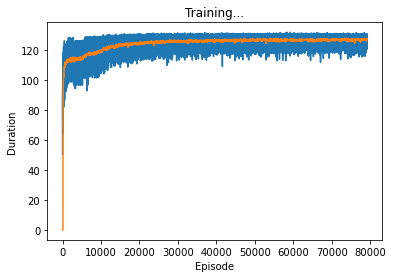

Current_train_num :  227845 Accuracy :  0.9990827097368825
F1 0.7457627118644068
308 131 79


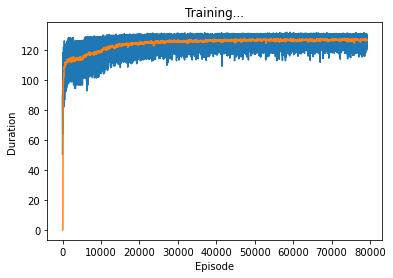

Current_train_num :  227845 Accuracy :  0.9984155895455243
F1 0.6365461847389559
317 292 70


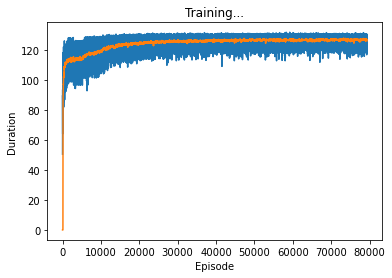

Current_train_num :  227845 Accuracy :  0.9990212644560995
F1 0.7128205128205128
278 115 109


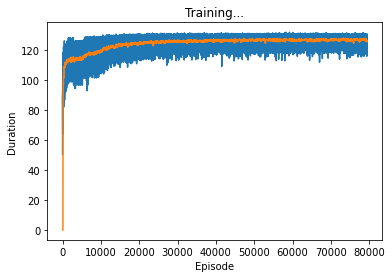

Current_train_num :  227845 Accuracy :  0.9983541442647413
F1 0.6284584980237155
318 307 69


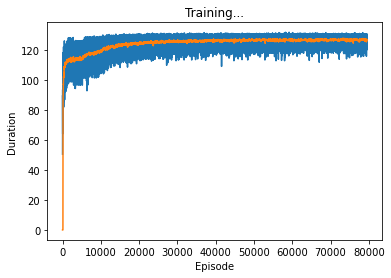

Current_train_num :  227845 Accuracy :  0.9990827097368825
F1 0.7475961538461539
311 134 76


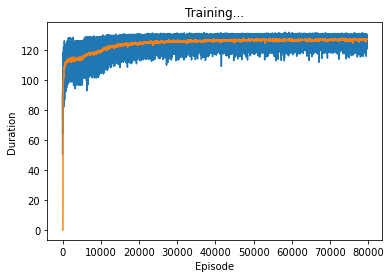

Current_train_num :  227845 Accuracy :  0.9991397660690382
F1 0.7431551499348109
285 95 102


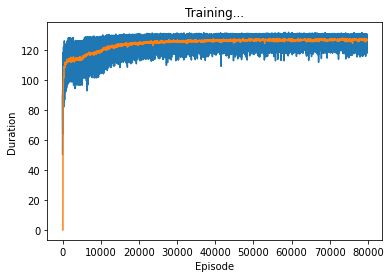

Current_train_num :  227845 Accuracy :  0.9991178213259014
F1 0.7530562347188264
308 123 79


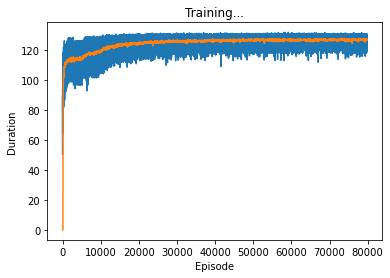

Current_train_num :  227845 Accuracy :  0.9991704887094297
F1 0.7630922693266833
306 109 81


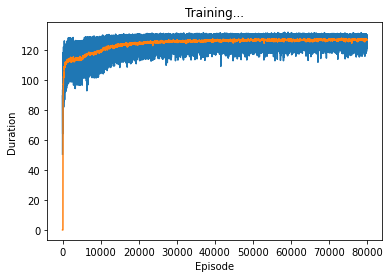

Current_train_num :  227845 Accuracy :  0.9988413175623779
F1 0.7025813692480359
313 191 74


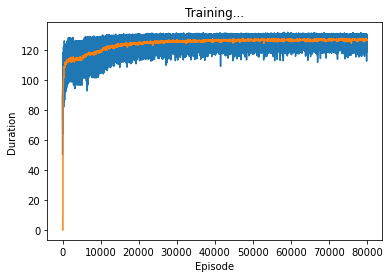

Current_train_num :  227845 Accuracy :  0.9991573218635476
F1 0.761433868974042
308 114 79


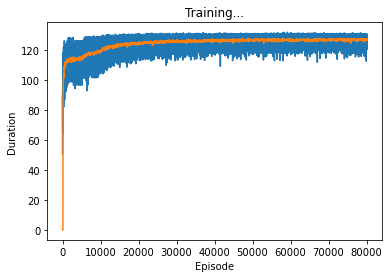

Current_train_num :  227845 Accuracy :  0.9990563760451184
F1 0.7434679334916865
313 142 74


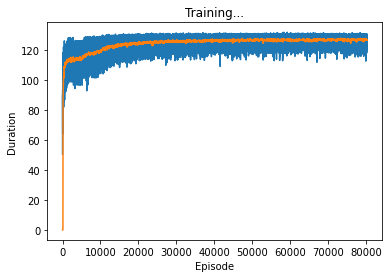

Current_train_num :  227845 Accuracy :  0.9992407118874673
F1 0.7791878172588832
307 94 80
80200


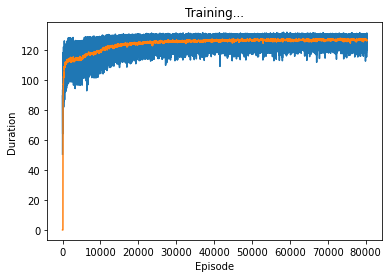

Current_train_num :  227845 Accuracy :  0.9990870986855099
F1 0.7403726708074534
298 120 89


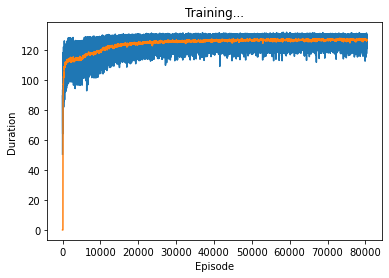

Current_train_num :  227845 Accuracy :  0.9942329215036538
F1 0.3266769073220686
319 1247 68


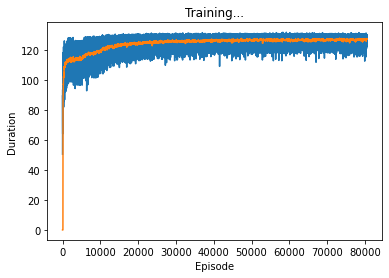

Current_train_num :  227845 Accuracy :  0.9992451008360947
F1 0.7779204107830552
303 89 84


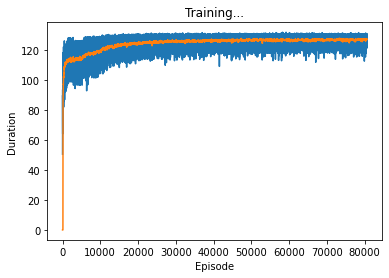

Current_train_num :  227845 Accuracy :  0.9991704887094297
F1 0.7576530612244898
297 100 90


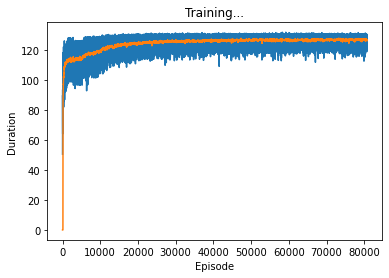

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.7281672816728167
296 130 91


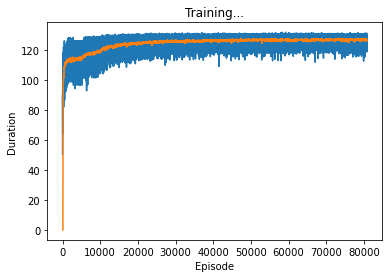

Current_train_num :  227845 Accuracy :  0.999161710812175
F1 0.7593984962406015
303 108 84


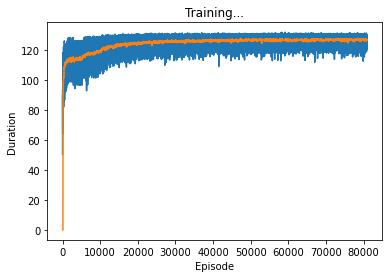

Current_train_num :  227845 Accuracy :  0.999126599223156
F1 0.7361477572559367
279 92 108


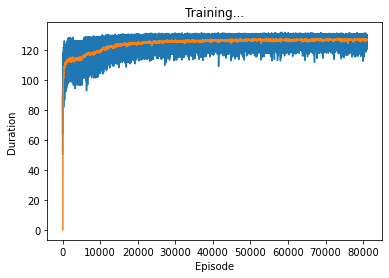

Current_train_num :  227845 Accuracy :  0.9944435910377669
F1 0.33420914345769837
318 1198 69


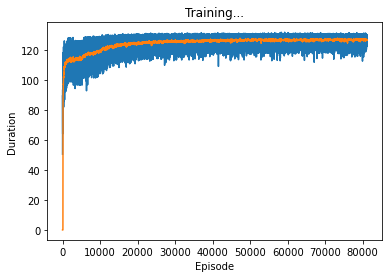

Current_train_num :  227845 Accuracy :  0.9992012113498212
F1 0.7563249001331558
284 80 103


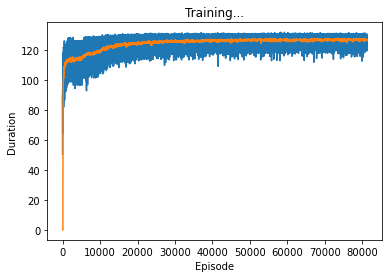

Current_train_num :  227845 Accuracy :  0.9990432091992363
F1 0.7358262967430639
305 137 82


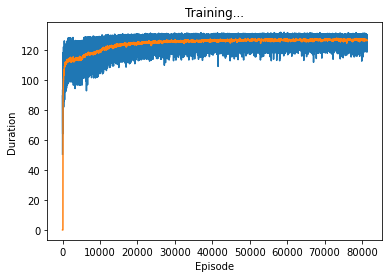

Current_train_num :  227845 Accuracy :  0.9989598191753165
F1 0.7083333333333334
289 140 98


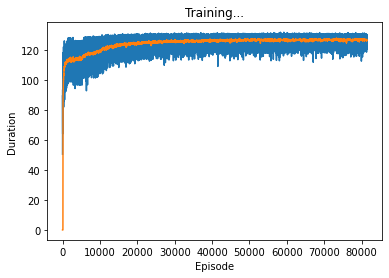

Current_train_num :  227845 Accuracy :  0.9990300423533542
F1 0.7331730769230769
305 140 82


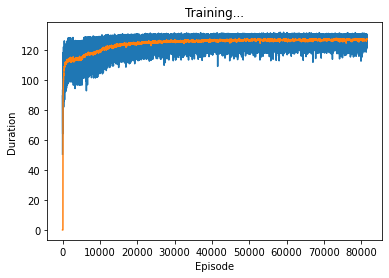

Current_train_num :  227845 Accuracy :  0.9955364392459787
F1 0.3845223700120919
318 949 69


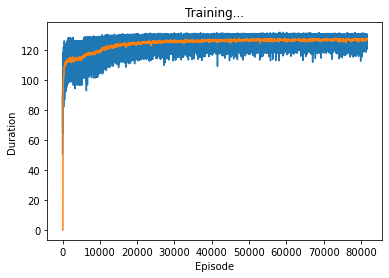

Current_train_num :  227845 Accuracy :  0.9859553643924598
F1 0.16749024707412224
322 3136 65


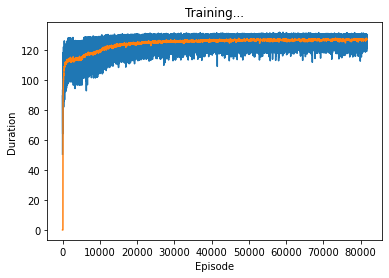

Current_train_num :  227845 Accuracy :  0.9988105949219864
F1 0.6984478935698448
315 200 72


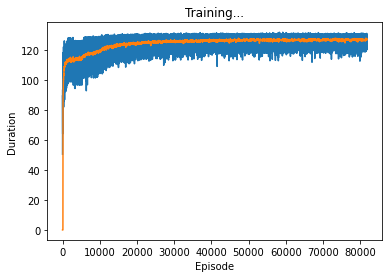

Current_train_num :  227845 Accuracy :  0.9991309881717835
F1 0.757020757020757
310 122 77


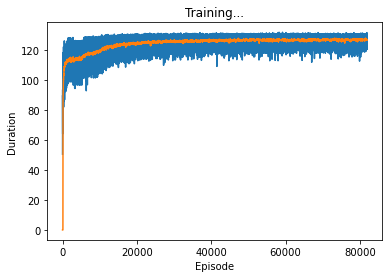

Current_train_num :  227845 Accuracy :  0.999113432377274
F1 0.7539393939393939
311 127 76


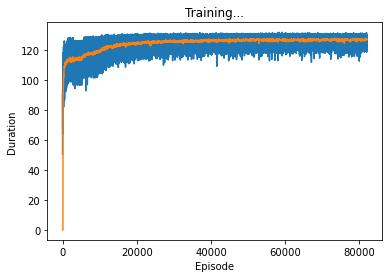

Current_train_num :  227845 Accuracy :  0.9946630384691347
F1 0.3446418955304254
320 1150 67


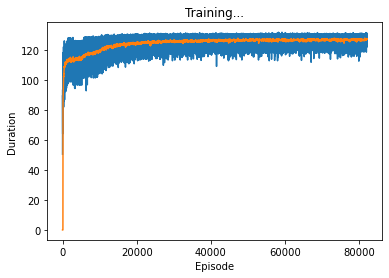

Current_train_num :  227845 Accuracy :  0.9988105949219864
F1 0.6971046770601337
313 198 74


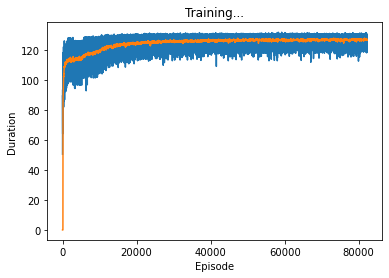

Current_train_num :  227845 Accuracy :  0.9971515723408457
F1 0.4937694704049844
317 580 70


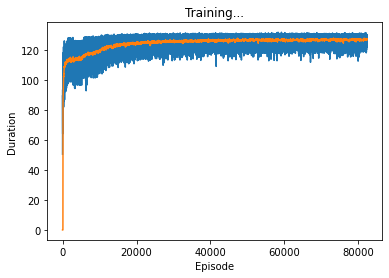

Current_train_num :  227845 Accuracy :  0.9873817726963506
F1 0.1824900511654349
321 2810 66


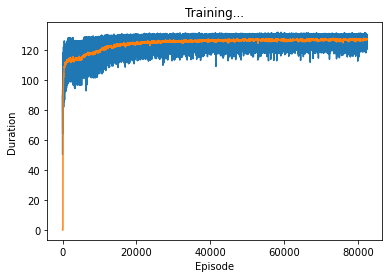

Current_train_num :  227845 Accuracy :  0.9991485439662928
F1 0.7477360931435963
289 97 98


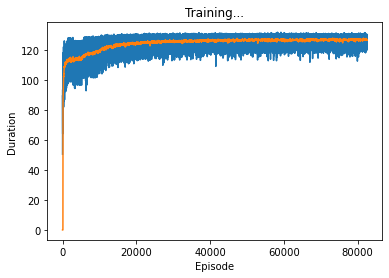

Current_train_num :  227845 Accuracy :  0.9991397660690382
F1 0.758282208588957
309 119 78


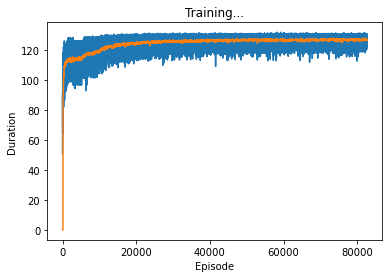

Current_train_num :  227845 Accuracy :  0.9934297439048476
F1 0.29868913857677903
319 1430 68


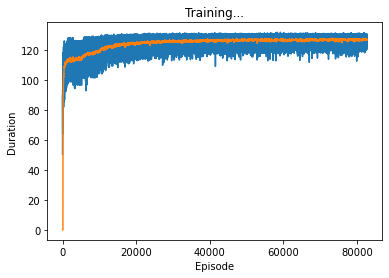

Current_train_num :  227845 Accuracy :  0.9992714345278588
F1 0.7833981841763943
302 82 85
82700


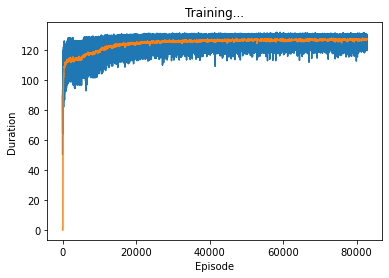

Current_train_num :  227845 Accuracy :  0.9991836555553117
F1 0.766541822721598
307 107 80


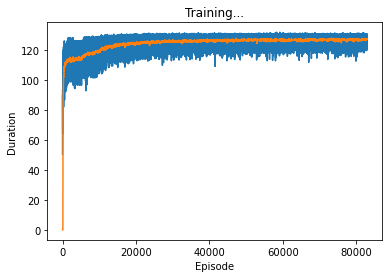

Current_train_num :  227845 Accuracy :  0.9988764291513967
F1 0.7089467723669309
313 183 74


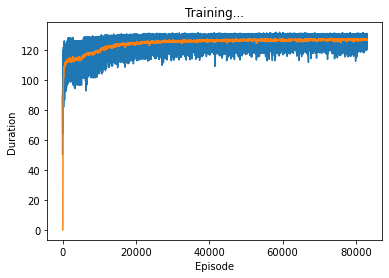

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.7266355140186916
311 158 76


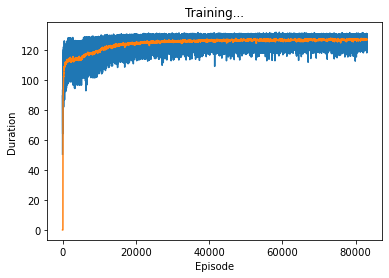

Current_train_num :  227845 Accuracy :  0.99923632293884
F1 0.7644683714670256
284 72 103


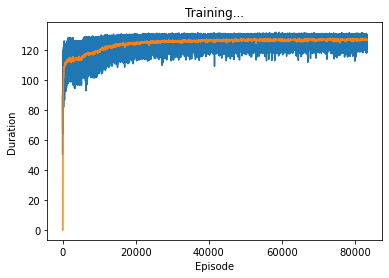

Current_train_num :  227845 Accuracy :  0.9984507011345433
F1 0.639511201629328
314 281 73


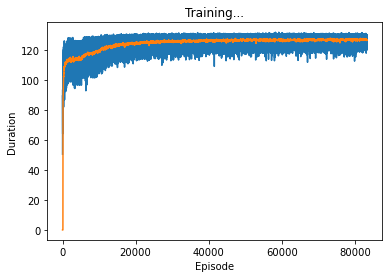

Current_train_num :  227845 Accuracy :  0.9987886501788497
F1 0.6918798665183538
311 201 76


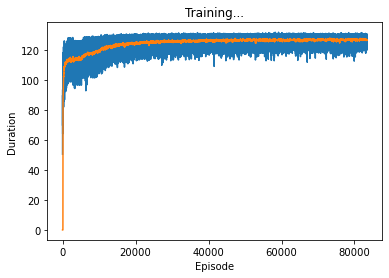

Current_train_num :  227845 Accuracy :  0.9987754833329676
F1 0.6916299559471366
314 207 73


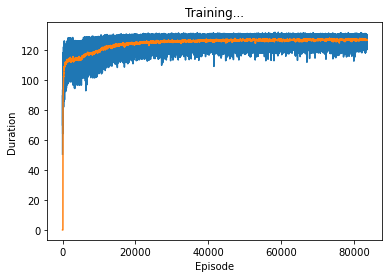

Current_train_num :  227845 Accuracy :  0.9970901270600627
F1 0.4884437596302003
317 594 70


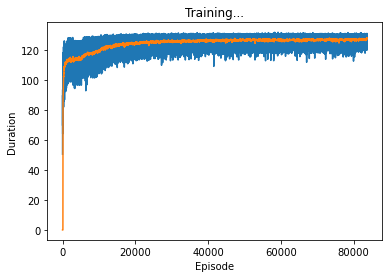

Current_train_num :  227845 Accuracy :  0.9989334854835524
F1 0.7195402298850575
313 170 74


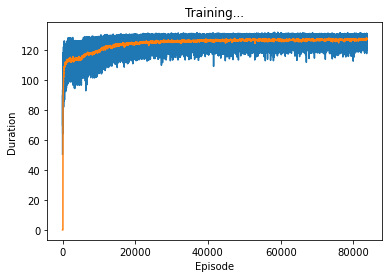

Current_train_num :  227845 Accuracy :  0.9969628475498694
F1 0.47619047619047616
315 621 72


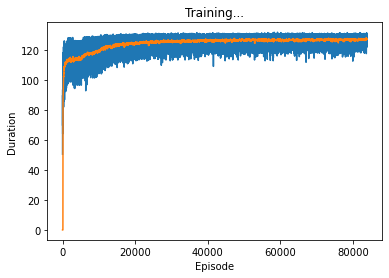

Current_train_num :  227845 Accuracy :  0.999223156092958
F1 0.7741116751269036
305 96 82


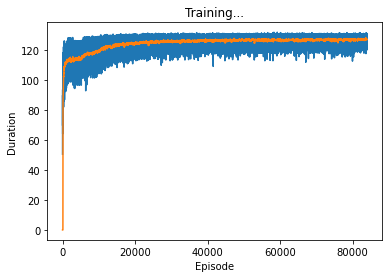

Current_train_num :  227845 Accuracy :  0.9991397660690382
F1 0.7397622192866579
280 90 107


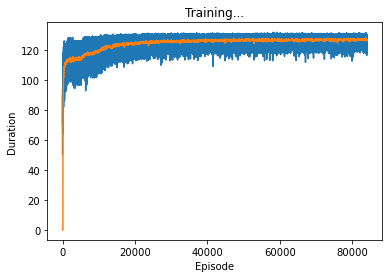

Current_train_num :  227845 Accuracy :  0.9978494151725954
F1 0.5635555555555556
317 421 70


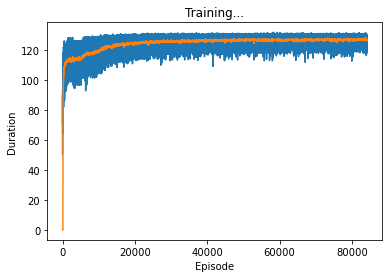

Current_train_num :  227845 Accuracy :  0.9963527836906669
F1 0.43169398907103823
316 761 71


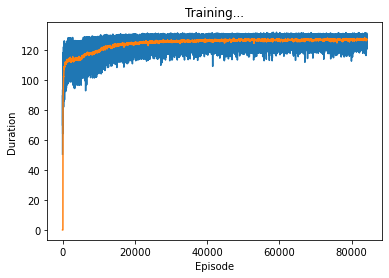

Current_train_num :  227845 Accuracy :  0.9979284162478879
F1 0.5703905540417802
314 400 73


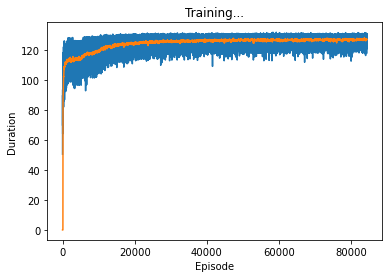

Current_train_num :  227845 Accuracy :  0.9989861528670807
F1 0.7296037296037297
313 158 74


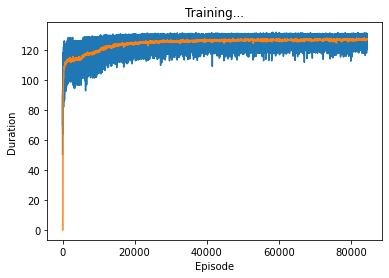

Current_train_num :  227845 Accuracy :  0.9990344313019817
F1 0.7390791027154664
313 147 74


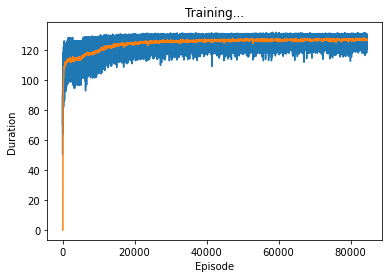

Current_train_num :  227845 Accuracy :  0.999188044503939
F1 0.7526595744680851
283 82 104


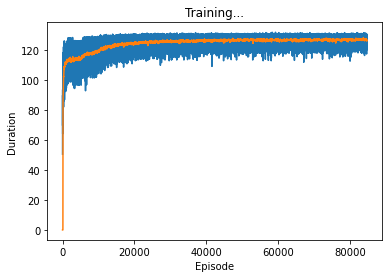

Current_train_num :  227845 Accuracy :  0.9984902016721894
F1 0.645426515930113
314 272 73


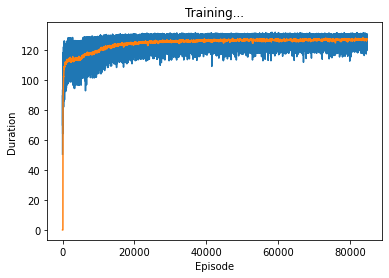

Current_train_num :  227845 Accuracy :  0.9991222102745287
F1 0.7551766138855055
310 124 77


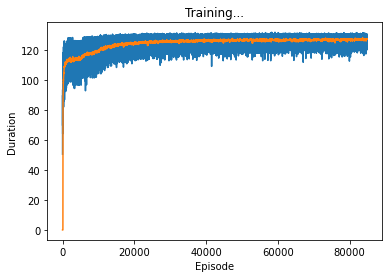

Current_train_num :  227845 Accuracy :  0.999223156092958
F1 0.7588075880758808
280 71 107


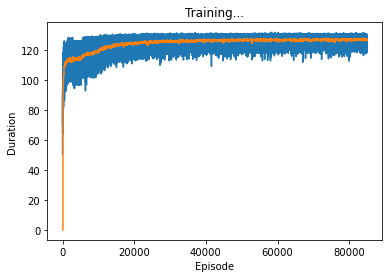

Current_train_num :  227845 Accuracy :  0.9989071517917882
F1 0.715261958997722
314 177 73


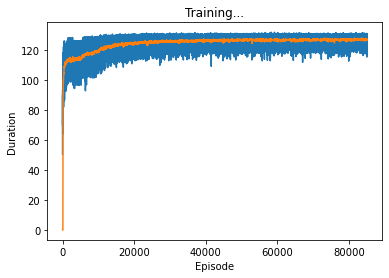

Current_train_num :  227845 Accuracy :  0.9959402225196954
F1 0.4064102564102564
317 856 70


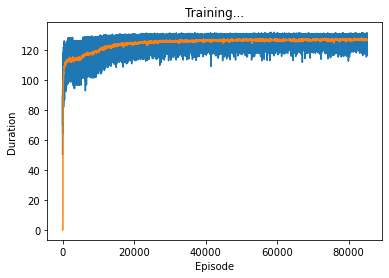

Current_train_num :  227845 Accuracy :  0.9991485439662928
F1 0.7346938775510204
270 78 117


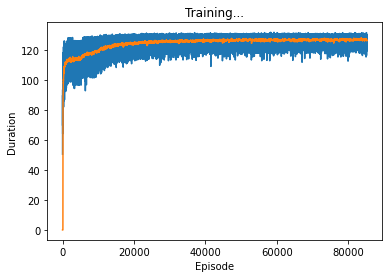

Current_train_num :  227845 Accuracy :  0.9980205841690623
F1 0.5830258302583026
316 381 71


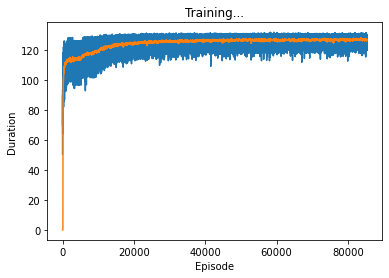

Current_train_num :  227845 Accuracy :  0.9991792666066843
F1 0.7589743589743589
296 97 91


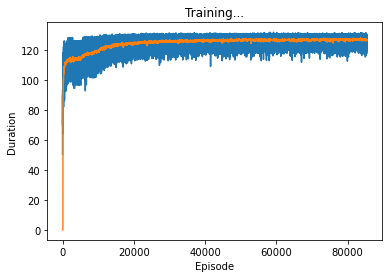

Current_train_num :  227845 Accuracy :  0.9991573218635476
F1 0.7463863337713534
284 90 103


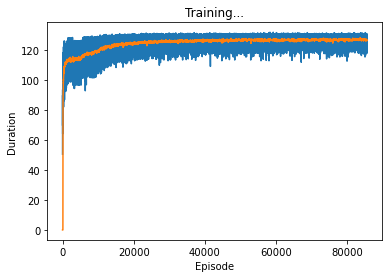

Current_train_num :  227845 Accuracy :  0.9978889157102416
F1 0.5665467625899281
315 410 72


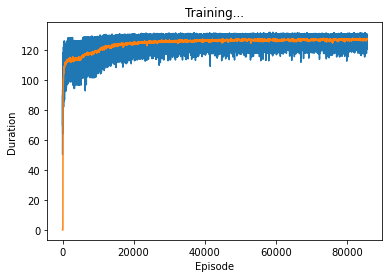

Current_train_num :  227845 Accuracy :  0.9992319339902126
F1 0.7702349869451697
295 84 92


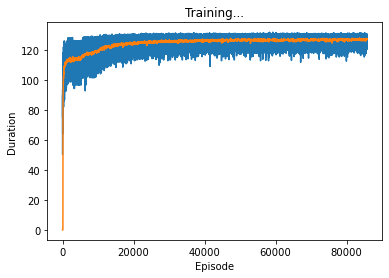

Current_train_num :  227845 Accuracy :  0.9989861528670807
F1 0.7289719626168224
312 157 75


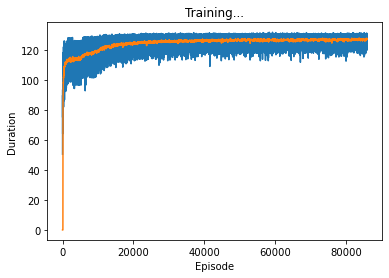

Current_train_num :  227845 Accuracy :  0.9991836555553117
F1 0.7384615384615385
264 64 123


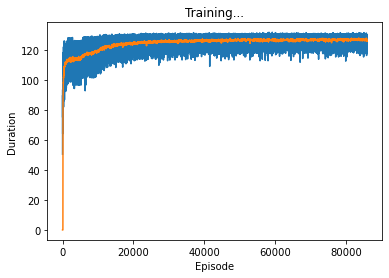

Current_train_num :  227845 Accuracy :  0.9992012113498212
F1 0.7556742323097463
283 79 104


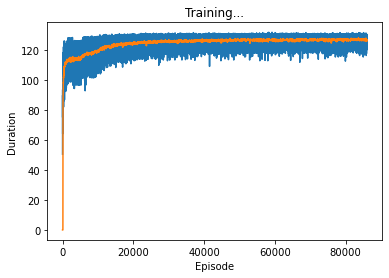

Current_train_num :  227845 Accuracy :  0.9990475981478637
F1 0.7341463414634146
301 132 86


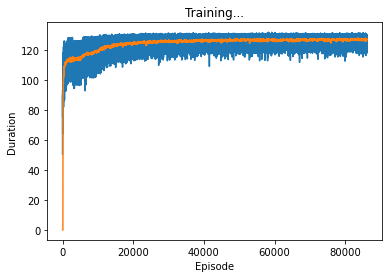

Current_train_num :  227845 Accuracy :  0.9986920933090478
F1 0.6767567567567567
313 225 74


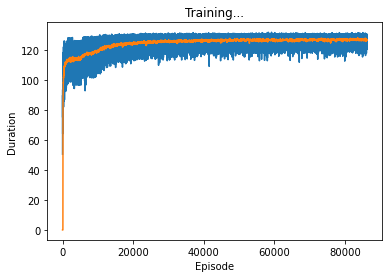

Current_train_num :  227845 Accuracy :  0.999174877658057
F1 0.7542262678803641
290 92 97


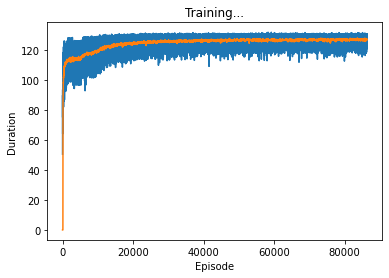

Current_train_num :  227845 Accuracy :  0.9991441550176655
F1 0.7574257425742574
306 115 81


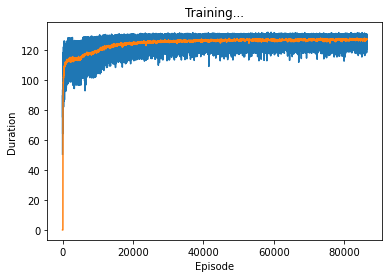

Current_train_num :  227845 Accuracy :  0.9965810090192895
F1 0.44523470839260315
313 706 74


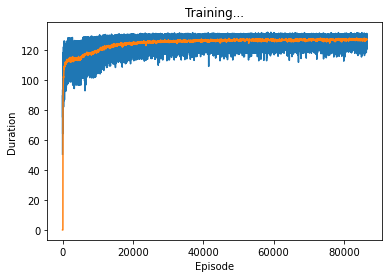

Current_train_num :  227845 Accuracy :  0.9991222102745287
F1 0.7551766138855055
310 124 77


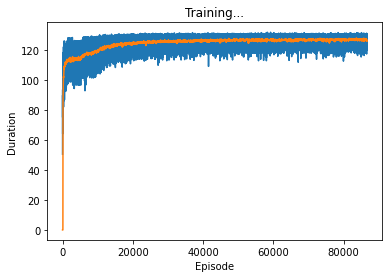

Current_train_num :  227845 Accuracy :  0.9991836555553117
F1 0.7629911280101395
301 101 86


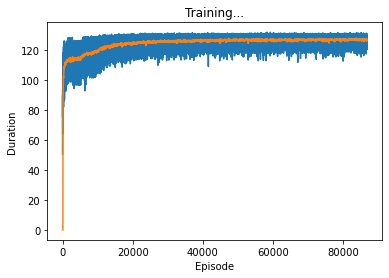

Current_train_num :  227845 Accuracy :  0.9917531655291975
F1 0.25396825396825395
320 1813 67


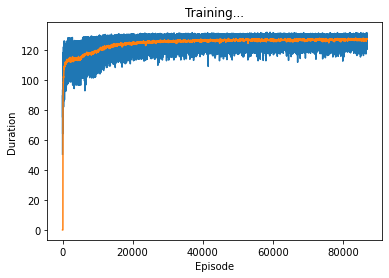

Current_train_num :  227845 Accuracy :  0.9991090434286467
F1 0.7518248175182481
309 126 78


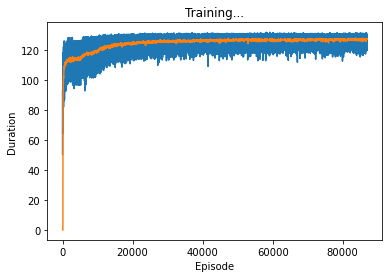

Current_train_num :  227845 Accuracy :  0.9986920933090478
F1 0.6774541531823085
314 226 73


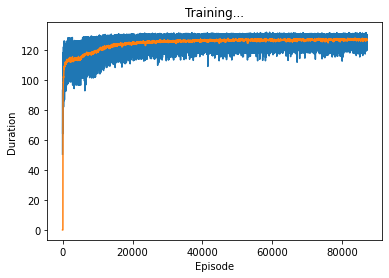

Current_train_num :  227845 Accuracy :  0.9984858127235621
F1 0.6454918032786885
315 274 72


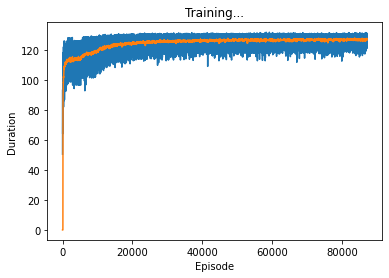

Current_train_num :  227845 Accuracy :  0.9987710943843402
F1 0.6908690869086909
314 208 73


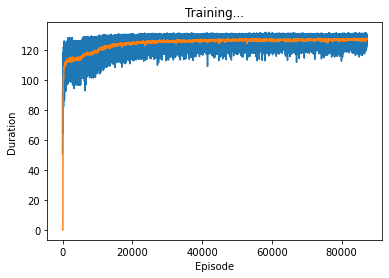

Current_train_num :  227845 Accuracy :  0.9979240272992604
F1 0.5706521739130435
315 402 72


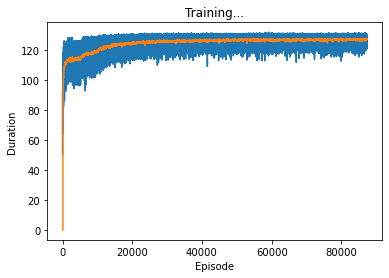

Current_train_num :  227845 Accuracy :  0.9990607649937457
F1 0.7443519619500595
313 141 74


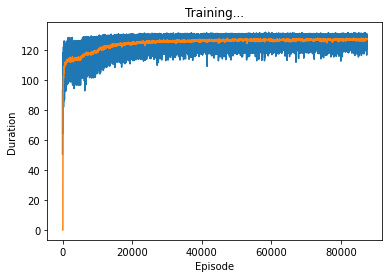

Current_train_num :  227845 Accuracy :  0.9992538787333495
F1 0.7793548387096774
302 86 85


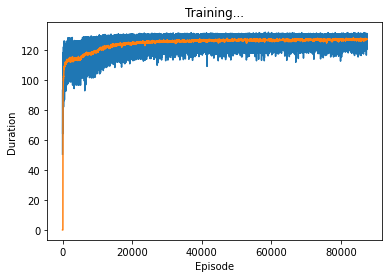

Current_train_num :  227845 Accuracy :  0.9983936448023876
F1 0.6311557788944724
314 294 73


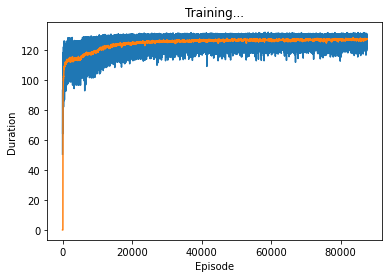

Current_train_num :  227845 Accuracy :  0.9992056002984485
F1 0.7707808564231738
306 101 81


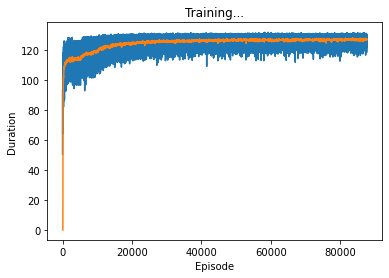

Current_train_num :  227845 Accuracy :  0.9992494897847221
F1 0.7789203084832905
303 88 84


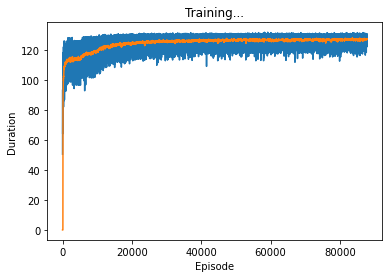

Current_train_num :  227845 Accuracy :  0.9992187671443306
F1 0.7731305449936628
305 97 82


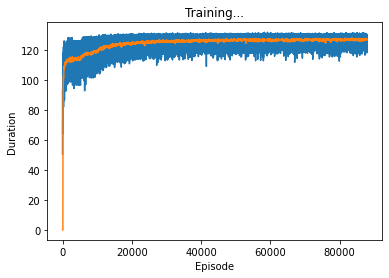

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.7203682393555811
313 169 74


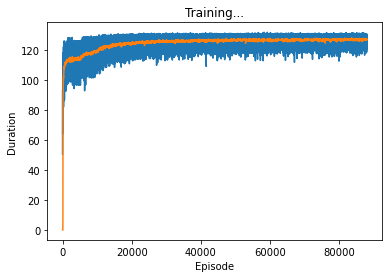

Current_train_num :  227845 Accuracy :  0.9992275450415853
F1 0.7698309492847855
296 86 91


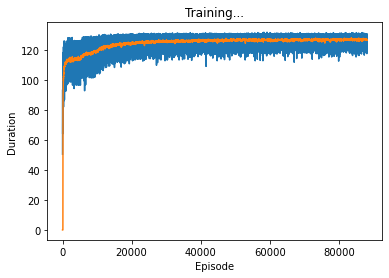

Current_train_num :  227845 Accuracy :  0.9992494897847221
F1 0.7806122448979592
306 91 81


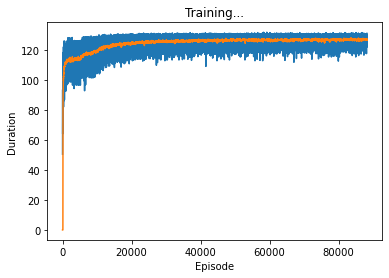

Current_train_num :  227845 Accuracy :  0.9989510412780619
F1 0.7215777262180975
311 164 76


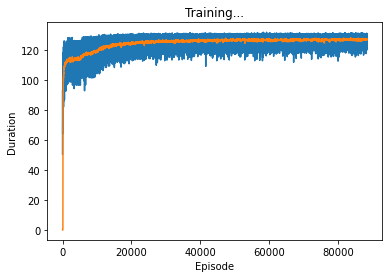

Current_train_num :  227845 Accuracy :  0.99923632293884
F1 0.776500638569604
304 92 83


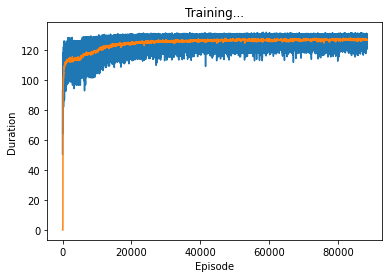

Current_train_num :  227845 Accuracy :  0.99847264587768
F1 0.6413155190133607
312 274 75


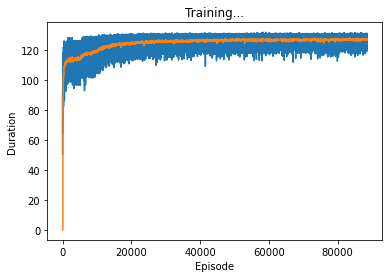

Current_train_num :  227845 Accuracy :  0.9990695428910005
F1 0.7449101796407186
311 137 76


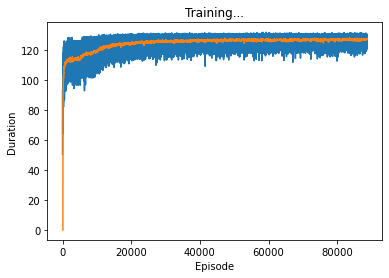

Current_train_num :  227845 Accuracy :  0.9991046544800193
F1 0.7521160822249093
311 129 76


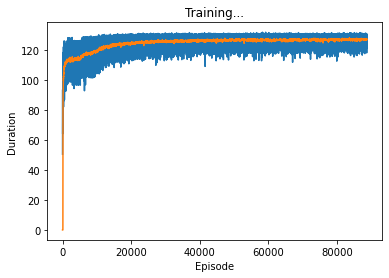

Current_train_num :  227845 Accuracy :  0.9992451008360947
F1 0.7784891165172856
304 90 83


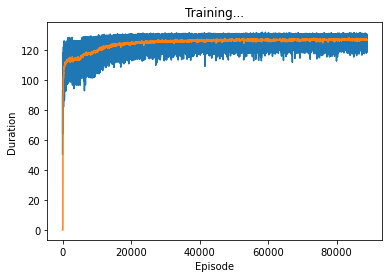

Current_train_num :  227845 Accuracy :  0.9992802124251136
F1 0.783748361730013
299 77 88
88800


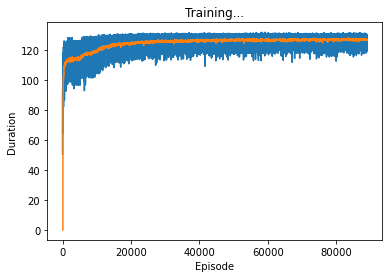

Current_train_num :  227845 Accuracy :  0.9981478636792557
F1 0.5967588179218303
313 349 74


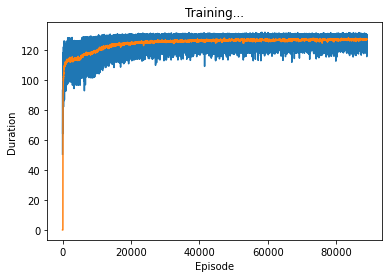

Current_train_num :  227845 Accuracy :  0.998152252627883
F1 0.5973282442748091
313 348 74


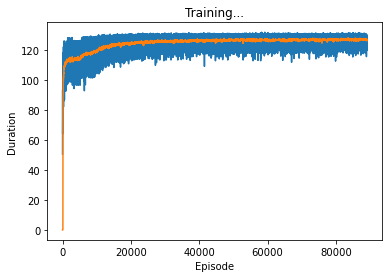

Current_train_num :  227845 Accuracy :  0.9992275450415853
F1 0.7558620689655172
274 64 113


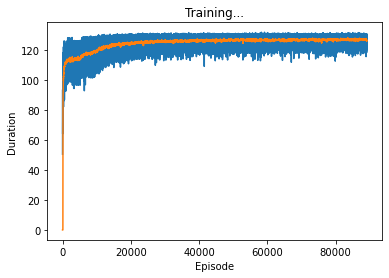

Current_train_num :  227845 Accuracy :  0.999223156092958
F1 0.7717948717948718
301 92 86


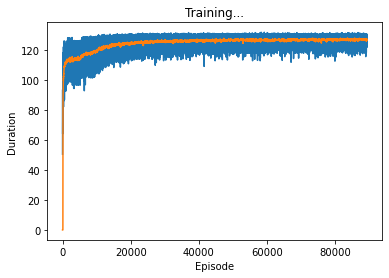

Current_train_num :  227845 Accuracy :  0.9970155149333977
F1 0.4805491990846682
315 609 72


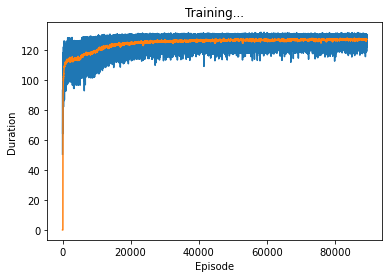

Current_train_num :  227845 Accuracy :  0.9991704887094297
F1 0.7404371584699454
271 74 116


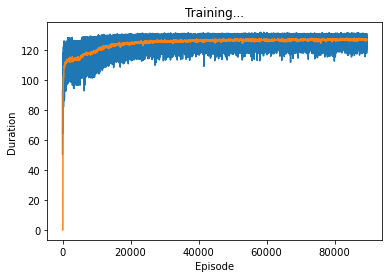

Current_train_num :  227845 Accuracy :  0.978678487568303
F1 0.11670605344482822
321 4793 66


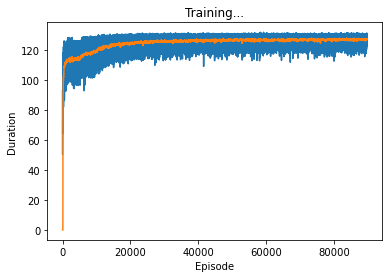

Current_train_num :  227845 Accuracy :  0.9988895959972789
F1 0.7113636363636363
313 180 74


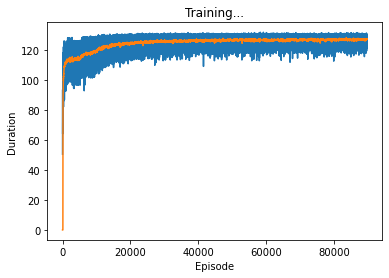

Current_train_num :  227845 Accuracy :  0.9991529329149202
F1 0.7604938271604939
308 115 79


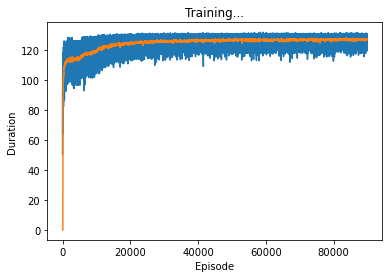

Current_train_num :  227845 Accuracy :  0.9987140380521846
F1 0.6811279826464208
314 221 73


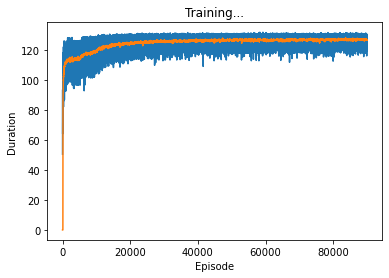

Current_train_num :  227845 Accuracy :  0.999174877658057
F1 0.7529411764705882
288 90 99


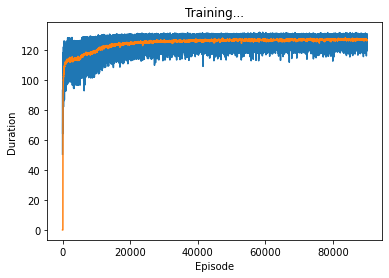

Current_train_num :  227845 Accuracy :  0.9992407118874673
F1 0.7763496143958869
302 89 85


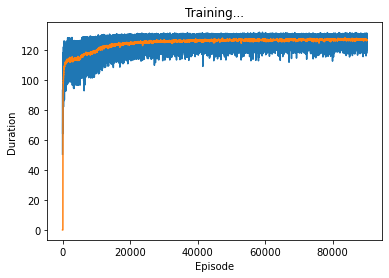

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.7240566037735849
307 154 80


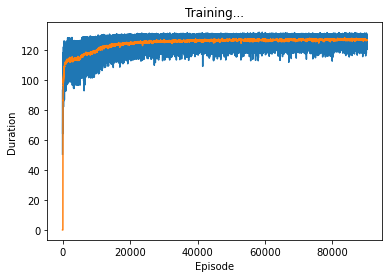

Current_train_num :  227845 Accuracy :  0.9904979262217736
F1 0.22863247863247863
321 2100 66


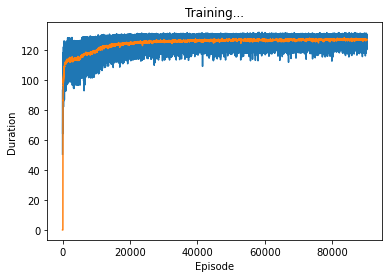

Current_train_num :  227845 Accuracy :  0.9992582676819768
F1 0.7809278350515464
303 86 84


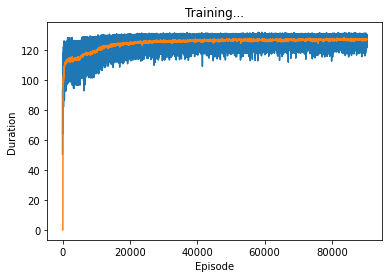

Current_train_num :  227845 Accuracy :  0.9988281507164959
F1 0.7008928571428571
314 195 73


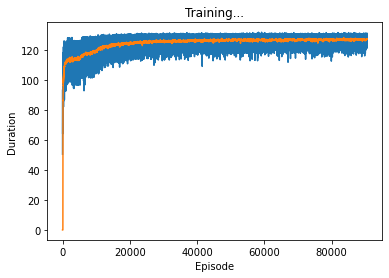

Current_train_num :  227845 Accuracy :  0.9988676512541421
F1 0.7073446327683616
313 185 74


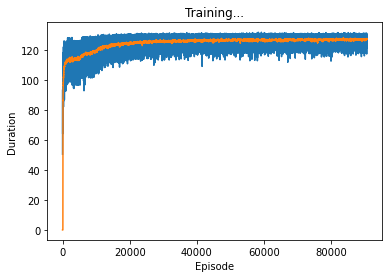

Current_train_num :  227845 Accuracy :  0.9989027628431609
F1 0.7131428571428572
312 176 75


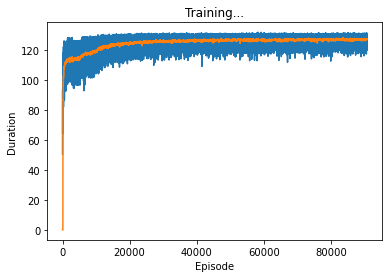

Current_train_num :  227845 Accuracy :  0.9946279268801159
F1 0.3389098758769563
314 1152 73


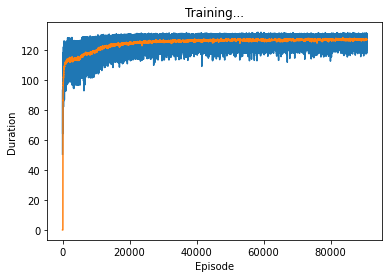

Current_train_num :  227845 Accuracy :  0.9991924334525665
F1 0.7619047619047619
296 94 91


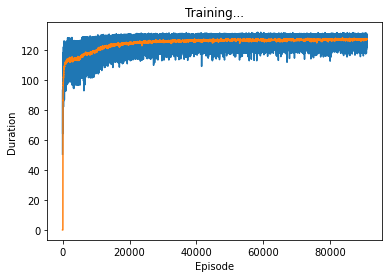

Current_train_num :  227845 Accuracy :  0.9991836555553117
F1 0.7641866330390921
303 103 84


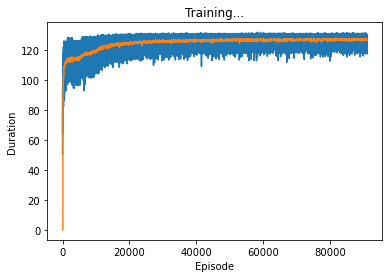

Current_train_num :  227845 Accuracy :  0.999113432377274
F1 0.7394094993581515
288 104 99


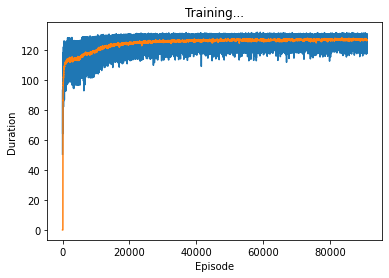

Current_train_num :  227845 Accuracy :  0.999161710812175
F1 0.7433155080213903
278 83 109


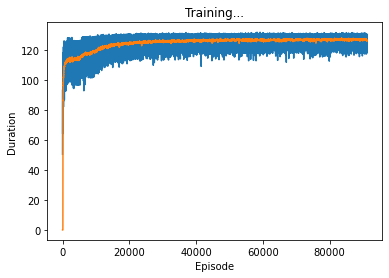

Current_train_num :  227845 Accuracy :  0.999038820250609
F1 0.7330097087378641
302 135 85


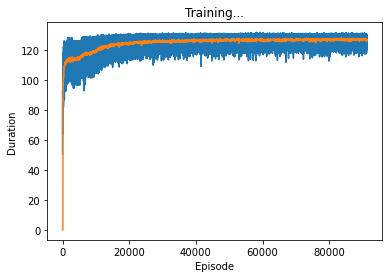

Current_train_num :  227845 Accuracy :  0.9932278522679892
F1 0.2943327239488117
322 1479 65


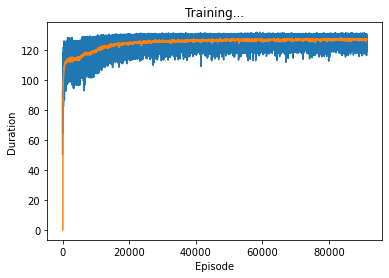

Current_train_num :  227845 Accuracy :  0.9977484693541662
F1 0.5514834205933682
316 443 71


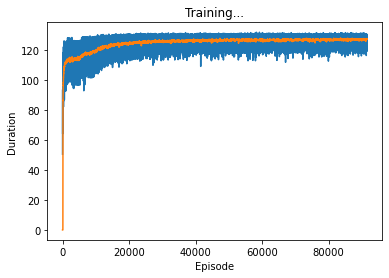

Current_train_num :  227845 Accuracy :  0.999161710812175
F1 0.76
304 109 83


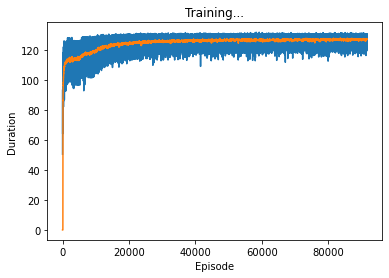

Current_train_num :  227845 Accuracy :  0.9983146437270952
F1 0.6206896551724138
315 313 72


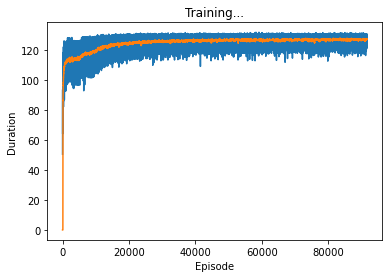

Current_train_num :  227845 Accuracy :  0.9943689789111019
F1 0.3305526590198123
317 1214 70


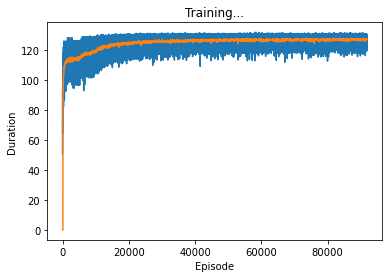

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.7190751445086705
311 167 76


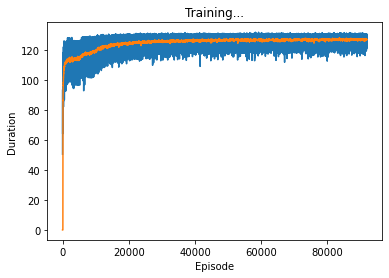

Current_train_num :  227845 Accuracy :  0.999126599223156
F1 0.7572815533980582
312 125 75


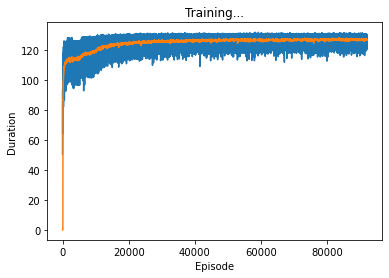

Current_train_num :  227845 Accuracy :  0.9992670455792315
F1 0.7835051546391752
304 85 83


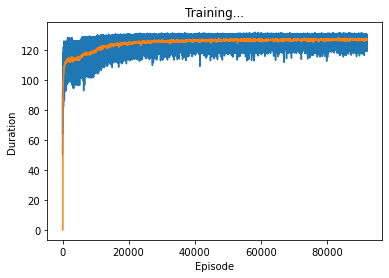

Current_train_num :  227845 Accuracy :  0.9992670455792315
F1 0.7795275590551181
297 78 90


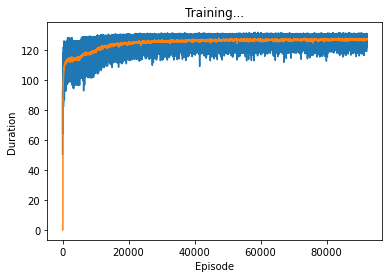

Current_train_num :  227845 Accuracy :  0.9992758234764862
F1 0.7849740932642487
303 82 84
92200


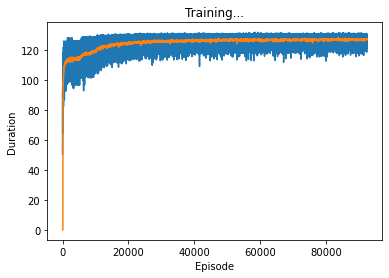

Current_train_num :  227845 Accuracy :  0.9992056002984485
F1 0.7719298245614035
308 103 79


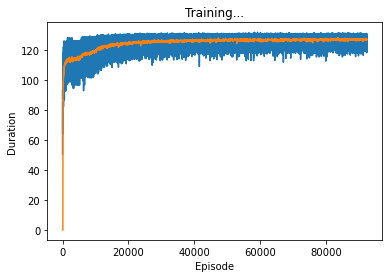

Current_train_num :  227845 Accuracy :  0.9891022405582742
F1 0.20384615384615384
318 2415 69


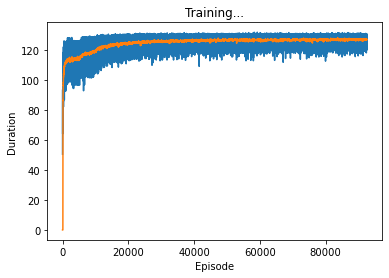

Current_train_num :  227845 Accuracy :  0.9992582676819768
F1 0.7831632653061225
307 90 80


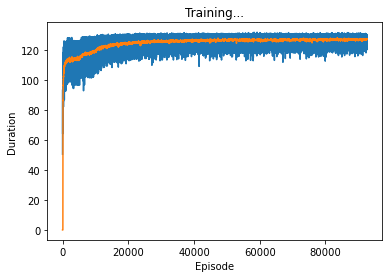

Current_train_num :  227845 Accuracy :  0.99923632293884
F1 0.7753530166880617
302 90 85


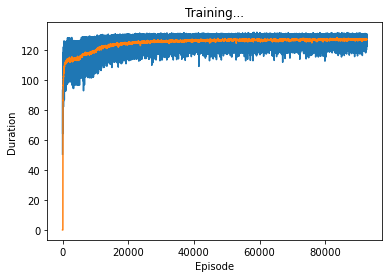

Current_train_num :  227845 Accuracy :  0.99923632293884
F1 0.776500638569604
304 92 83


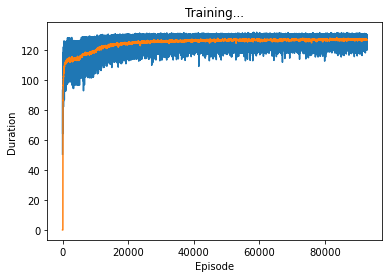

Current_train_num :  227845 Accuracy :  0.9989378744321797
F1 0.7197231833910035
312 168 75


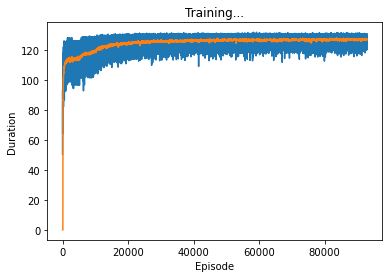

Current_train_num :  227845 Accuracy :  0.999161710812175
F1 0.76
304 109 83


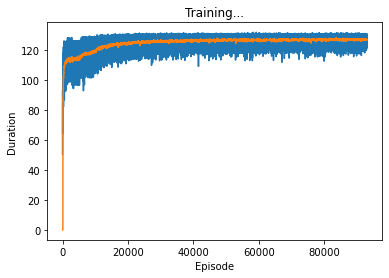

Current_train_num :  227845 Accuracy :  0.9973227413373127
F1 0.5068603712671509
314 538 73


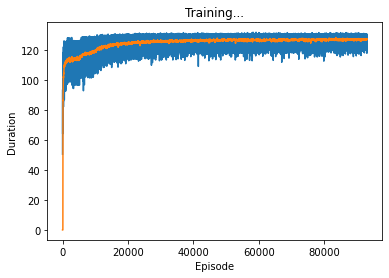

Current_train_num :  227845 Accuracy :  0.9991573218635476
F1 0.7366984993178718
270 76 117


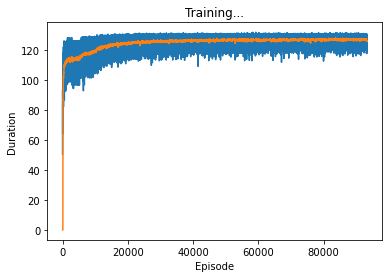

Current_train_num :  227845 Accuracy :  0.9990739318396278
F1 0.7408312958435208
303 128 84


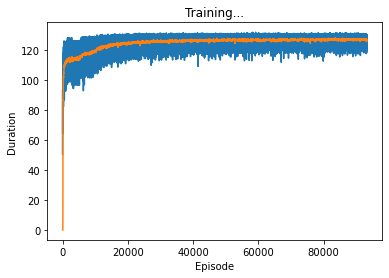

Current_train_num :  227845 Accuracy :  0.9991046544800193
F1 0.7368421052631579
287 105 100


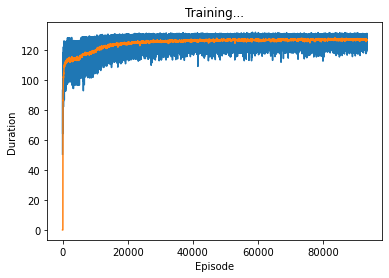

Current_train_num :  227845 Accuracy :  0.9979064715047511
F1 0.5701438848920863
317 408 70


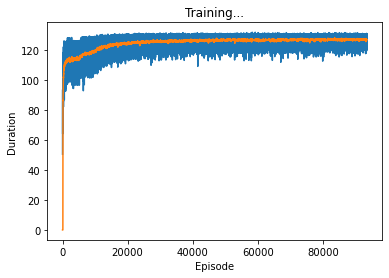

Current_train_num :  227845 Accuracy :  0.9992451008360947
F1 0.7684069611780455
287 73 100


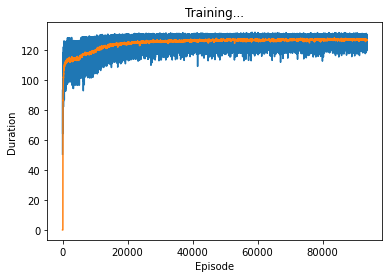

Current_train_num :  227845 Accuracy :  0.9985165353639536
F1 0.6479750778816199
312 264 75


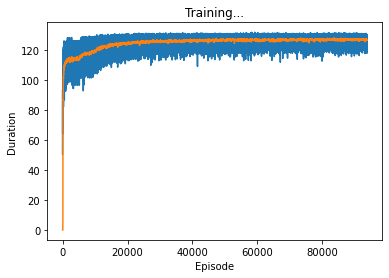

Current_train_num :  227845 Accuracy :  0.999126599223156
F1 0.7409326424870466
286 99 101


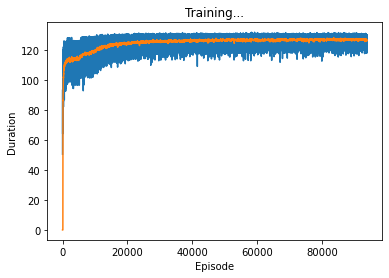

Current_train_num :  227845 Accuracy :  0.9988457065110052
F1 0.6986301369863014
306 183 81


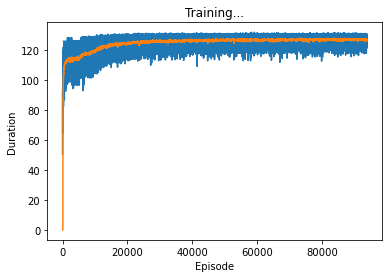

Current_train_num :  227845 Accuracy :  0.9986525927714016
F1 0.6666666666666666
308 229 79


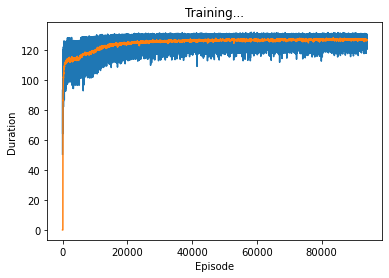

Current_train_num :  227845 Accuracy :  0.9991968224011938
F1 0.766497461928934
302 99 85


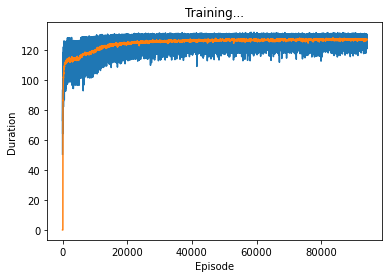

Current_train_num :  227845 Accuracy :  0.9992451008360947
F1 0.7790549169859514
305 91 82


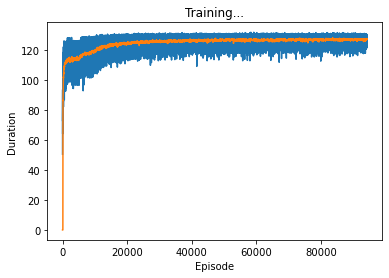

Current_train_num :  227845 Accuracy :  0.9662182624152384
F1 0.07719971229920883
322 7633 65


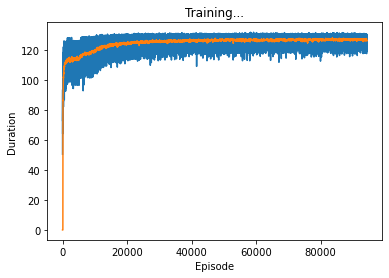

Current_train_num :  227845 Accuracy :  0.9987535385898308
F1 0.6864686468646864
312 210 75


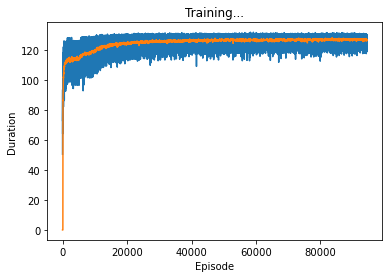

Current_train_num :  227845 Accuracy :  0.9991924334525665
F1 0.7543160690571049
284 82 103


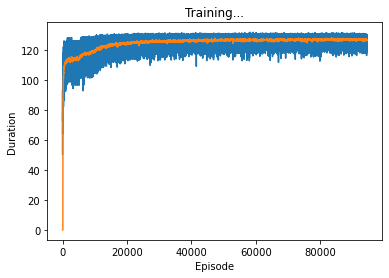

Current_train_num :  227845 Accuracy :  0.9992319339902126
F1 0.7731958762886598
300 89 87


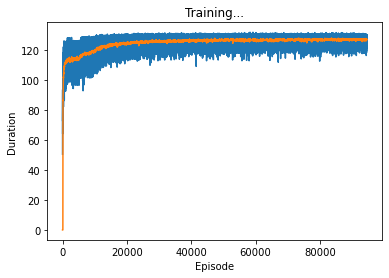

Current_train_num :  227845 Accuracy :  0.9989071517917882
F1 0.7113163972286374
308 171 79


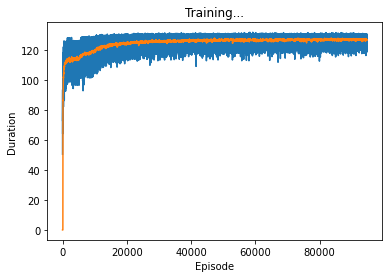

Current_train_num :  227845 Accuracy :  0.9991704887094297
F1 0.7493403693931399
284 87 103


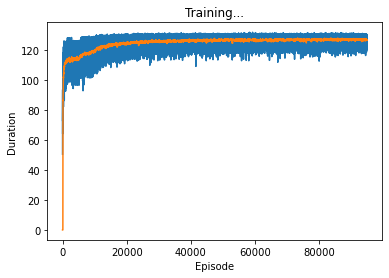

Current_train_num :  227845 Accuracy :  0.9984594790317979
F1 0.6356107660455487
307 272 80


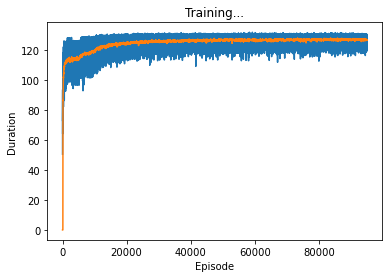

Current_train_num :  227845 Accuracy :  0.9989334854835524
F1 0.7149532710280374
306 163 81


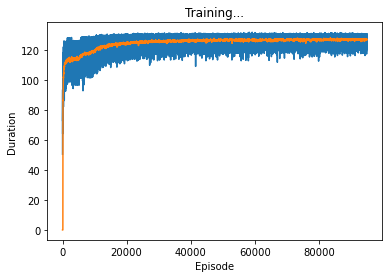

Current_train_num :  227845 Accuracy :  0.9989685970725712
F1 0.7223529411764706
307 156 80


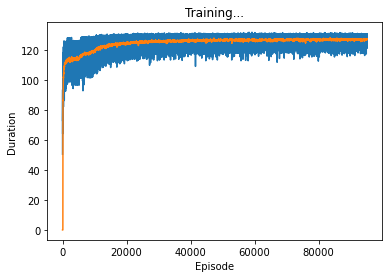

Current_train_num :  227845 Accuracy :  0.9991836555553117
F1 0.7659574468085106
306 106 81


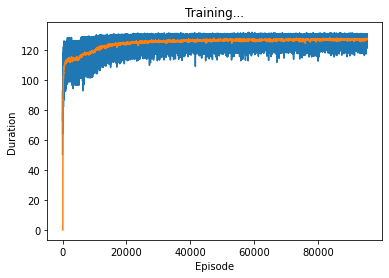

Current_train_num :  227845 Accuracy :  0.9958743882902851
F1 0.4017800381436745
316 870 71


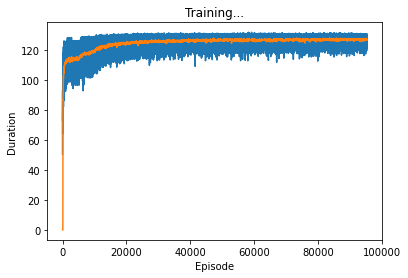

Current_train_num :  227845 Accuracy :  0.9990827097368825
F1 0.7469879518072289
310 133 77


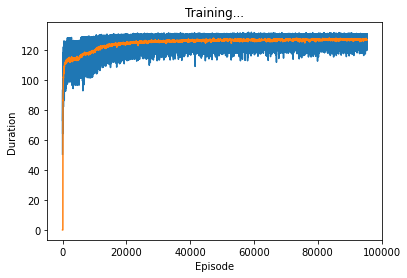

Current_train_num :  227845 Accuracy :  0.9992451008360947
F1 0.7646258503401361
281 67 106


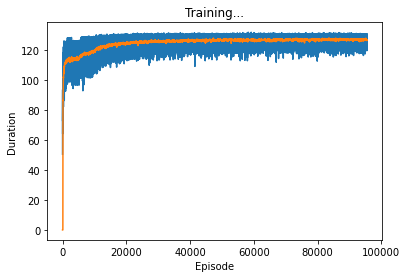

Current_train_num :  227845 Accuracy :  0.9874344400798789
F1 0.182181610508281
319 2796 68


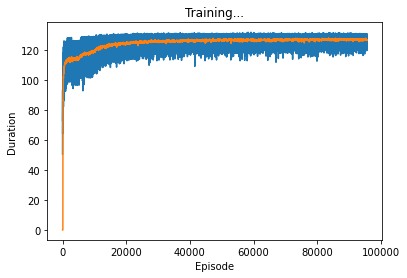

Current_train_num :  227845 Accuracy :  0.9990695428910005
F1 0.7418181818181818
306 132 81


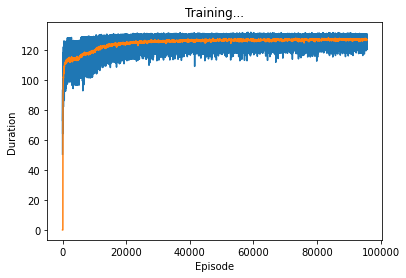

Current_train_num :  227845 Accuracy :  0.9992056002984485
F1 0.7707808564231738
306 101 81


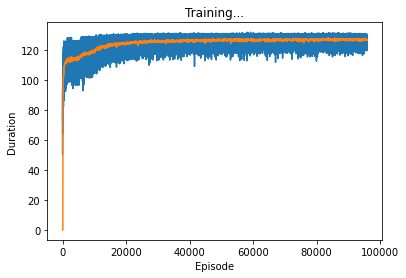

Current_train_num :  227845 Accuracy :  0.999223156092958
F1 0.7561643835616438
276 67 111


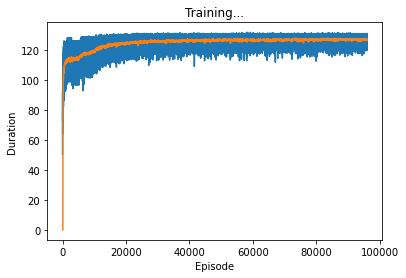

Current_train_num :  227845 Accuracy :  0.9982663652921943
F1 0.6125244618395304
313 322 74


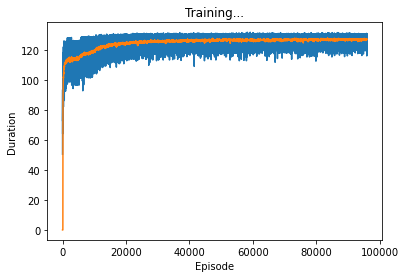

Current_train_num :  227845 Accuracy :  0.9992846013737409
F1 0.7859007832898173
301 78 86
96000


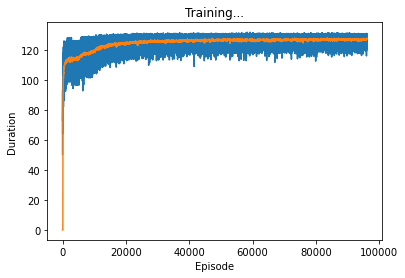

Current_train_num :  227845 Accuracy :  0.9986964822576752
F1 0.6753812636165577
310 221 77


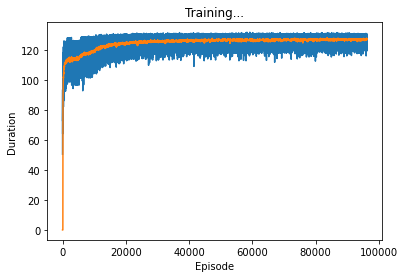

Current_train_num :  227845 Accuracy :  0.9993021571682503
F1 0.7889182058047494
299 72 88
96200


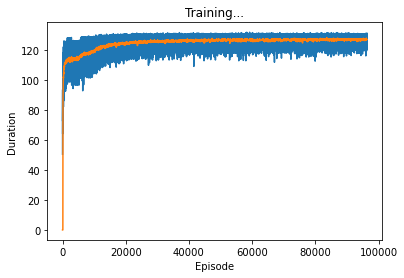

Current_train_num :  227845 Accuracy :  0.9992099892470758
F1 0.7711757269279393
305 99 82


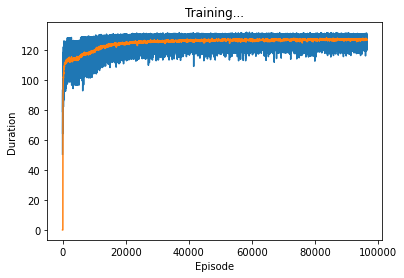

Current_train_num :  227845 Accuracy :  0.9978055256863219
F1 0.5570291777188329
315 429 72


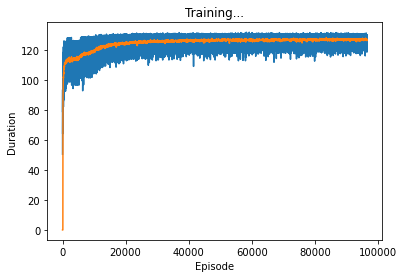

Current_train_num :  227845 Accuracy :  0.999113432377274
F1 0.7414012738853503
291 107 96


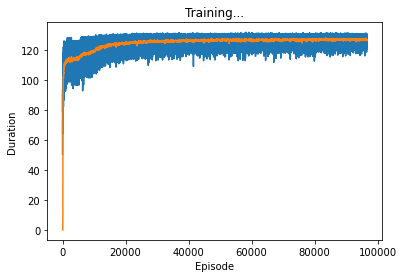

Current_train_num :  227845 Accuracy :  0.9967434001185016
F1 0.4596363636363636
316 672 71


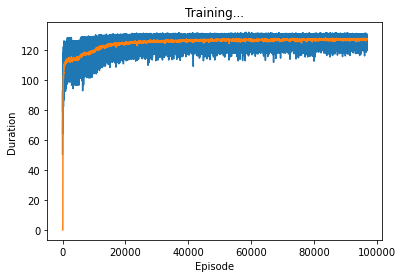

Current_train_num :  227845 Accuracy :  0.999126599223156
F1 0.7536945812807881
306 119 81


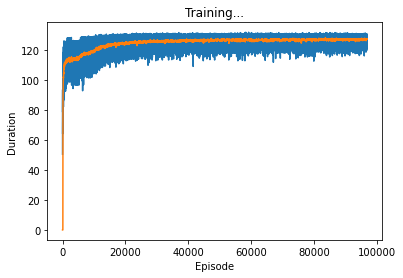

Current_train_num :  227845 Accuracy :  0.9992846013737409
F1 0.7853403141361257
300 77 87


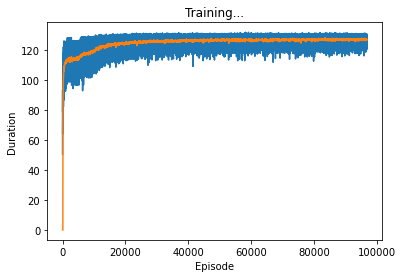

Current_train_num :  227845 Accuracy :  0.9992099892470758
F1 0.770595690747782
304 98 83


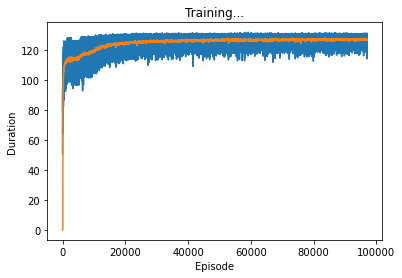

Current_train_num :  227845 Accuracy :  0.99923632293884
F1 0.7759282970550576
303 91 84


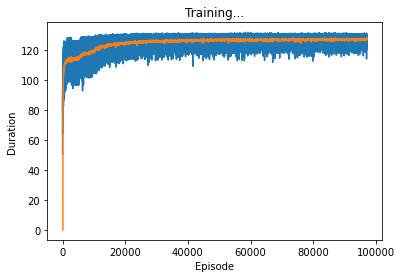

Current_train_num :  227845 Accuracy :  0.9991353771204108
F1 0.7573529411764706
309 120 78


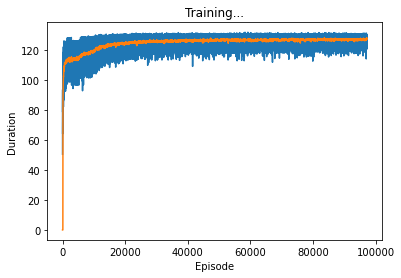

Current_train_num :  227845 Accuracy :  0.9970155149333977
F1 0.4789594491201224
313 607 74


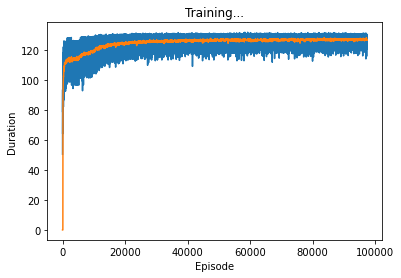

Current_train_num :  227845 Accuracy :  0.9890276284316092
F1 0.2032494424976107
319 2433 68


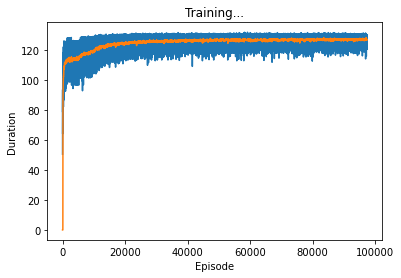

Current_train_num :  227845 Accuracy :  0.9992758234764862
F1 0.7866323907455013
306 85 81


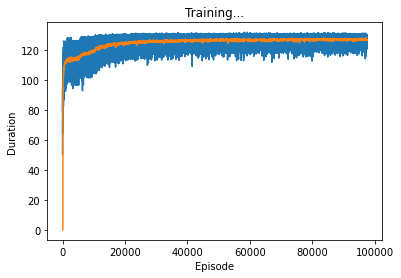

Current_train_num :  227845 Accuracy :  0.9992714345278588
F1 0.7833981841763943
302 82 85


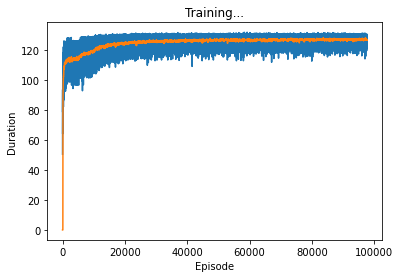

Current_train_num :  227845 Accuracy :  0.9991836555553117
F1 0.7384615384615385
264 64 123


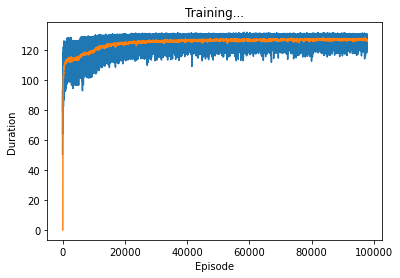

Current_train_num :  227845 Accuracy :  0.9983453663674867
F1 0.6212424849699398
310 301 77


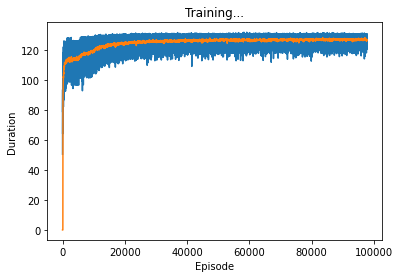

Current_train_num :  227845 Accuracy :  0.999161710812175
F1 0.7593984962406015
303 108 84


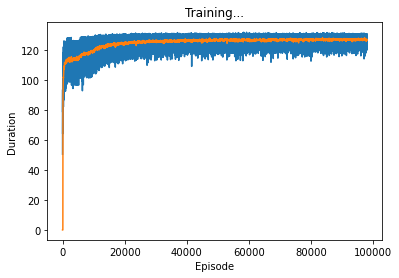

Current_train_num :  227845 Accuracy :  0.9988808181000242
F1 0.7084282460136674
311 180 76


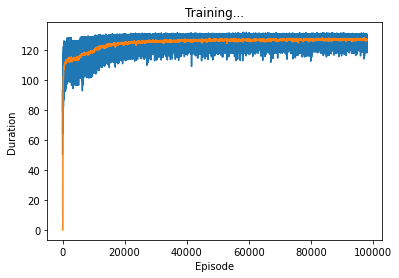

Current_train_num :  227845 Accuracy :  0.9992319339902126
F1 0.7708333333333334
296 85 91


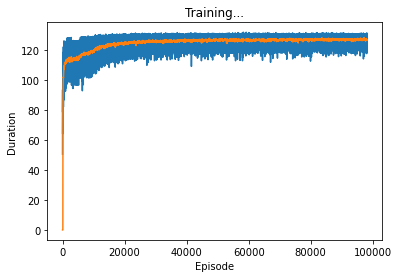

Current_train_num :  227845 Accuracy :  0.9991924334525665
F1 0.7568988173455979
288 86 99


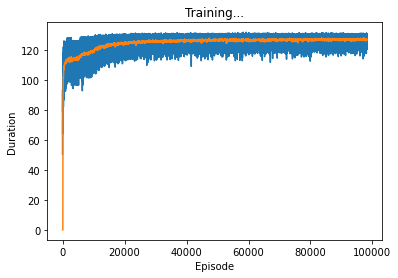

Current_train_num :  227845 Accuracy :  0.9991924334525665
F1 0.7489823609226595
276 74 111


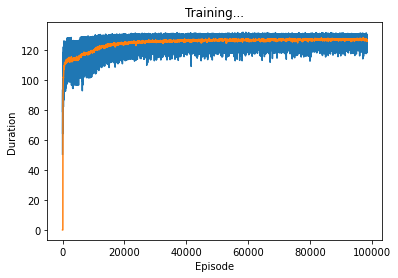

Current_train_num :  227845 Accuracy :  0.9990783207882552
F1 0.7312101910828025
287 111 100


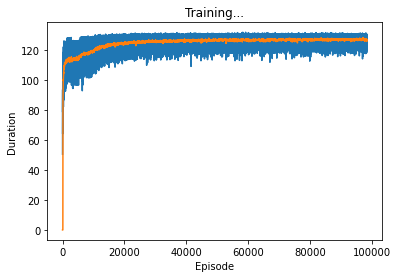

Current_train_num :  227845 Accuracy :  0.9988939849459062
F1 0.7061556329849012
304 170 83


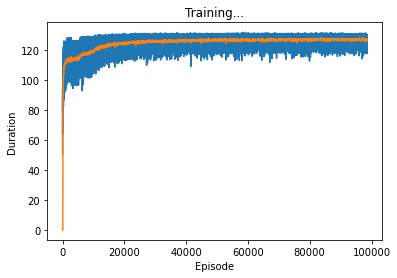

Current_train_num :  227845 Accuracy :  0.9756632798613092
F1 0.10403877221324717
322 5481 65


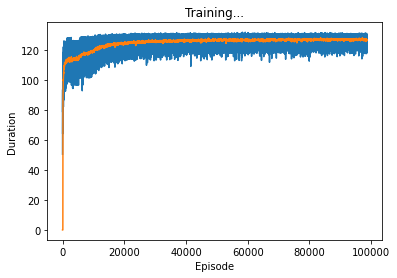

Current_train_num :  227845 Accuracy :  0.9991792666066843
F1 0.7506631299734748
283 84 104


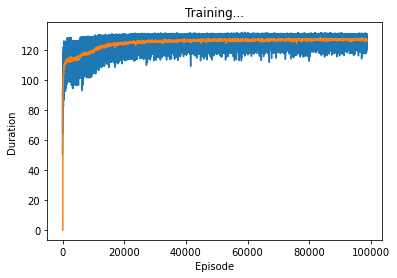

Current_train_num :  227845 Accuracy :  0.9947069279554083
F1 0.34366503534529635
316 1136 71


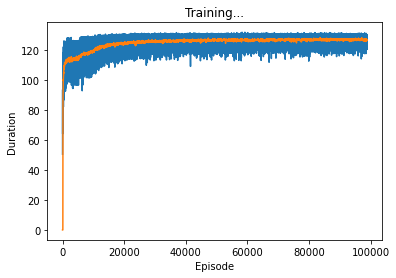

Current_train_num :  227845 Accuracy :  0.999038820250609
F1 0.732360097323601
301 134 86


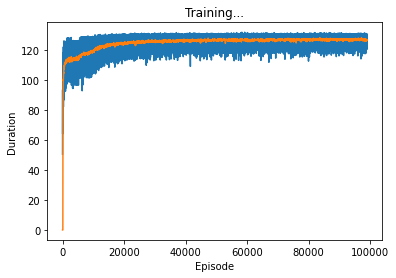

Current_train_num :  227845 Accuracy :  0.9960806688757708
F1 0.41338582677165353
315 822 72


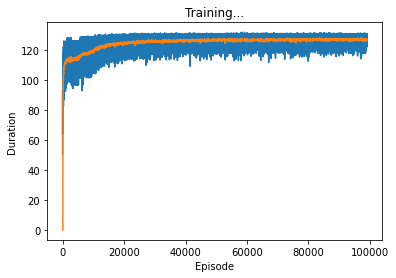

Current_train_num :  227845 Accuracy :  0.9990256534047269
F1 0.7335722819593787
307 143 80


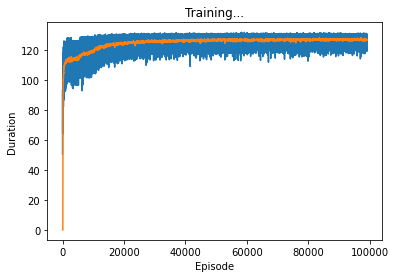

Current_train_num :  227845 Accuracy :  0.999223156092958
F1 0.7741116751269036
305 96 82


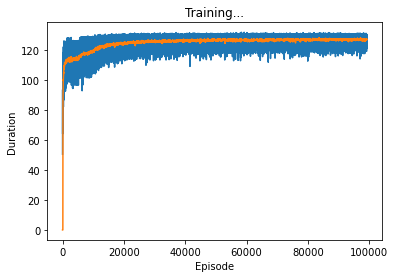

Current_train_num :  227845 Accuracy :  0.9992143781957032
F1 0.7727272727272727
306 99 81


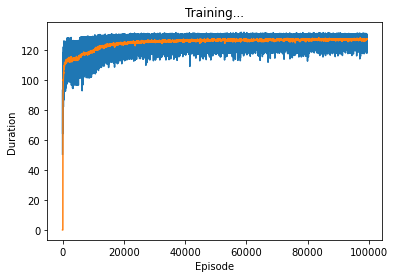

Current_train_num :  227845 Accuracy :  0.9982400316004301
F1 0.6081871345029239
312 327 75


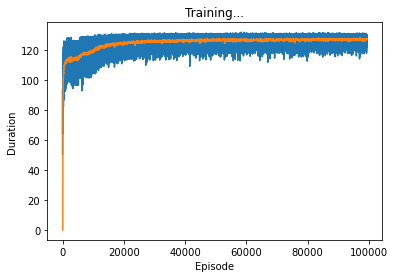

Current_train_num :  227845 Accuracy :  0.9991090434286467
F1 0.7518248175182481
309 126 78


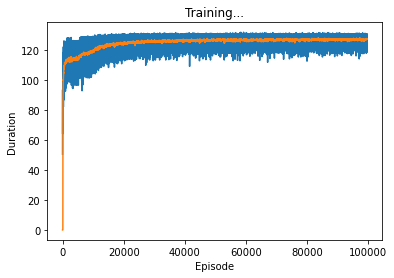

Current_train_num :  227845 Accuracy :  0.9992275450415853
F1 0.7649402390438247
288 78 99


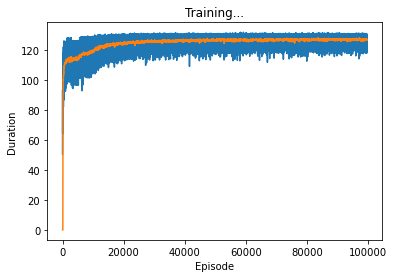

Current_train_num :  227845 Accuracy :  0.999223156092958
F1 0.760752688172043
283 74 104


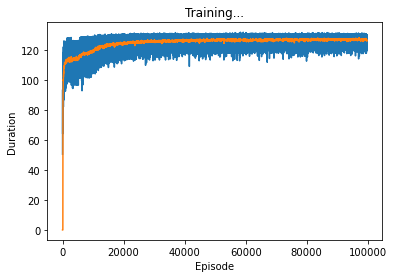

Current_train_num :  227845 Accuracy :  0.9953345476091202
F1 0.37264150943396224
316 993 71


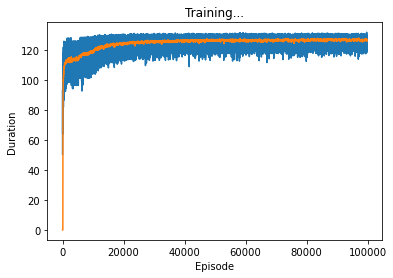

Current_train_num :  227845 Accuracy :  0.998977374969826
F1 0.7259953161592506
310 157 77


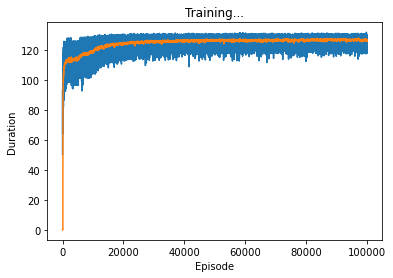

Current_train_num :  227845 Accuracy :  0.9987667054357129
F1 0.6880530973451328
311 206 76


In [21]:
total_accuracy = []
total_reward = []
test_num = len(normalized_test)
## Traing set을 이용한 학습 
F1=0
##
for i_num in range(100000):
    ## Batch size 크기 만큼의 Trajectory가 만들어짐.
    


    new_train0 = np.zeros((2000,30))
    new_train0_y= np.zeros((2000))

    for k in range(2000):
        s=np.random.choice(56856,1)

        new_train0[k] = normalized_train0[s,:]
        new_train0_y[k] = normalized_target0[s]


    new_train1 = np.concatenate((new_train0,normalized_train1))
    new_train1_y=np.concatenate((new_train0_y,normalized_target1))
                            
    A=np.random.choice(new_train1.shape[0],BATCH_SIZE,replace =False)
    trajectory = new_train1[A,:]
    trajectory_label=new_train1_y[A]
    #print(trajectory[:5])
    total_acc = 0
    total_re=0
    optimizer.zero_grad()
    loss = 0
    total_loss = 0

    ## Trajectory를 따라가면서 학습
    for t in range(BATCH_SIZE) :      
        state = trajectory[t][1:]
        state = torch.FloatTensor(state)
        state = Variable(state)
        ## Classification Target
        target = trajectory_label[t]
        probs = policy_net(state)
        m = Bernoulli(probs)
        action = m.sample()
        action = action.data.numpy().astype(int)[0]
        ## With Discout reward
        reward,accuracy,tp,tn,fp,fn= get_reward(action,target)
        loss = -m.log_prob(action) * reward 
        total_loss += loss
        #print(reward)
        total_re +=reward

    total_reward.append(total_re)
    loss = total_loss / BATCH_SIZE
    loss.backward()
    optimizer.step()
    
    
    
    if i_num>0:
        if (i_num)%100==0:
            plot_durations(total_reward)
            ttp=0
            ffp=0
            ffn=0
            for i_num1 in range(test_num):

                state = normalized_test[i_num1][1:]

                ## state를 tensor로 바꿔서 이용
                state = torch.FloatTensor(state)
                state = Variable(state)
                ## Classification Target
                target = y_test[i_num1]
                probs = policy_net(state)
                action = torch.round(probs).detach().numpy()
                _,accuracy,tp,tn,fp,fn= get_reward(action,target)
                ttp+=tp
                ffp+=fp
                ffn+=fn
                total_acc += accuracy
                total_accuracy.append(total_acc)
            print('Current_train_num : ',i_num1, "Accuracy : ",total_acc / i_num1)
            print('F1',(2*ttp)/(2*ttp+ffp+ffn))
            print(ttp,ffp,ffn)


            if F1<(2*ttp)/(2*ttp+ffp+ffn):
                F1=(2*ttp)/(2*ttp+ffp+ffn)
                print(i_num)



In [22]:
ttp

311

In [23]:
total_acc

0

In [24]:
ffp

206

In [25]:
ffn

76

In [26]:
len(normalized_test)

227846

In [27]:
len(y_test)

227846